# XGBoost (Extreme Gradient Boosting)

In [1]:
import numpy as np
import pandas as pd
from IPython.display import display, HTML
import importlib

import plotly.express as px
import matplotlib.pyplot as plt
import statsmodels.api as sm

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import xgboost as xgb 


import warnings
import os
import pickle

warnings.filterwarnings("ignore")
pd.options.display.float_format = '{:,.2f}'.format

In [2]:
df_main = pd.read_excel("https://raw.githubusercontent.com/carrenogf/MCD-Series-Temporales/main/dataset/series_diarias.xlsx")
df_main = df_main.sort_values("FECHA",ascending=True)
df_main.set_index("FECHA", inplace=True)
df_copa = df_main["CHU_COPA_AJUST"].dropna()
df_recprop = df_main["CHU_REC_PROPIOS_AJUST"].dropna()
df_regal = df_main["CHU_REGALIAS_AJUST"].dropna()
dataframes = [df_copa, df_recprop, df_regal]
titulos = ["CHU_COPA_AJUST", "CHU_REC_PROPIOS_AJUST", "CHU_REGALIAS_AJUST"]

In [3]:
def extract_time_features(index):
    return pd.Series({
        'dayofweek': index.dayofweek,
        'quarter': index.quarter,
        'month': index.month,
        'year': index.year,
        'dayofyear': index.dayofyear,
        'dayofmonth': index.day,
        'weekofyear': index.isocalendar().week
    })


def add_lags(df, titulo):
    target_map = df[titulo].to_dict()
    df['lag1'] = (df.index - pd.Timedelta('364 days')).map(target_map) # df_1['PJME_MW'].shift(1)
    df['lag2'] = (df.index - pd.Timedelta('728 days')).map(target_map) # df_1['PJME_MW'].shift(2)
    df['lag3'] = (df.index - pd.Timedelta('1092 days')).map(target_map) # df_1['PJME_MW'].shift(3)
    return df

In [4]:
time_features = dataframes[0].index.to_series().apply(extract_time_features)
dataframes[0] = pd.concat([dataframes[0], time_features], axis=1)
dataframes[0] = add_lags(dataframes[0], titulos[0])

time_features = dataframes[1].index.to_series().apply(extract_time_features)
dataframes[1] = pd.concat([dataframes[1], time_features], axis=1)
dataframes[1] = add_lags(dataframes[1], titulos[1])

time_features = dataframes[2].index.to_series().apply(extract_time_features)
dataframes[2] = pd.concat([dataframes[2], time_features], axis=1)
dataframes[2] = add_lags(dataframes[2], titulos[2])


In [5]:
dataframes[2].head()

,CHU_REGALIAS_AJUST,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3
FECHA,,,,,,,,,,,
2016-04-08,"212,159.00",4,2,4,2016,99,8,14,NaN,NaN,NaN
2016-04-14,"26,246.00",3,2,4,2016,105,14,15,NaN,NaN,NaN
2016-04-15,"16,002,725.00",4,2,4,2016,106,15,15,NaN,NaN,NaN
2016-04-20,"5,582.00",2,2,4,2016,111,20,16,NaN,NaN,NaN
2016-04-29,"11,066,374.00",4,2,4,2016,120,29,17,NaN,NaN,NaN


In [6]:
# TRAIN TEST
dataframes_train = []
dataframes_test = []

# for i in range(3):
#     train = dataframes[i].iloc[:round(len(dataframes[0])*.8)]
#     test = dataframes[i].iloc[round(len(dataframes[0])*.8):]
#     dataframes_train.append(train)
#     dataframes_test.append(test)
    
train_copa = dataframes[0].iloc[:round(len(dataframes[0])*.8)]
test_copa = dataframes[0].iloc[round(len(dataframes[0])*.8):]
print(f"Coparticipacion: train({train_copa.shape}), test({test_copa.shape})")

train_recursos = dataframes[1].iloc[:round(len(dataframes[1])*.8)]
test_recursos = dataframes[1].iloc[round(len(dataframes[1])*.8):]
print(f"Recursos: train({train_recursos.shape}), test({test_recursos.shape})")

train_regalias = dataframes[2].iloc[:round(len(dataframes[2])*.8)]
test_regalias = dataframes[2].iloc[round(len(dataframes[2])*.8):]
print(f"Regalias: train({train_regalias.shape}), test({test_regalias.shape})")

dataframes_train = [ train_copa, train_recursos, train_regalias ]
dataframes_test = [ test_copa, test_recursos, test_regalias ]

Coparticipacion: train((1275, 11)), test((319, 11))
Recursos: train((1626, 11)), test((406, 11))
Regalias: train((460, 11)), test((115, 11))


In [7]:
train_recursos.head()

,CHU_REC_PROPIOS_AJUST,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3
FECHA,,,,,,,,,,,
2016-04-01,679233,4,2,4,2016,92,1,13,NaN,NaN,NaN
2016-04-04,339379,0,2,4,2016,95,4,14,NaN,NaN,NaN
2016-04-05,903634,1,2,4,2016,96,5,14,NaN,NaN,NaN
2016-04-06,858197,2,2,4,2016,97,6,14,NaN,NaN,NaN
2016-04-07,1774956,3,2,4,2016,98,7,14,NaN,NaN,NaN


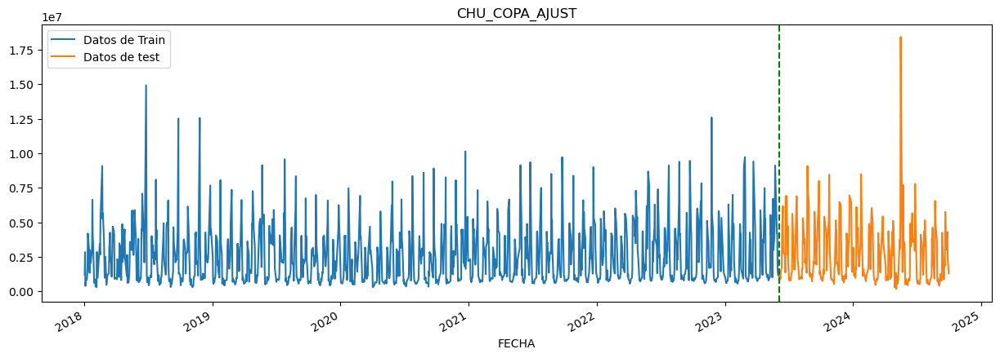

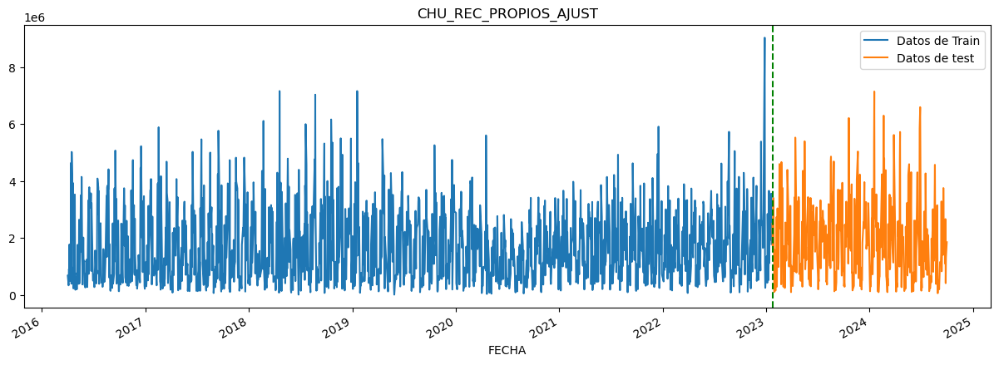

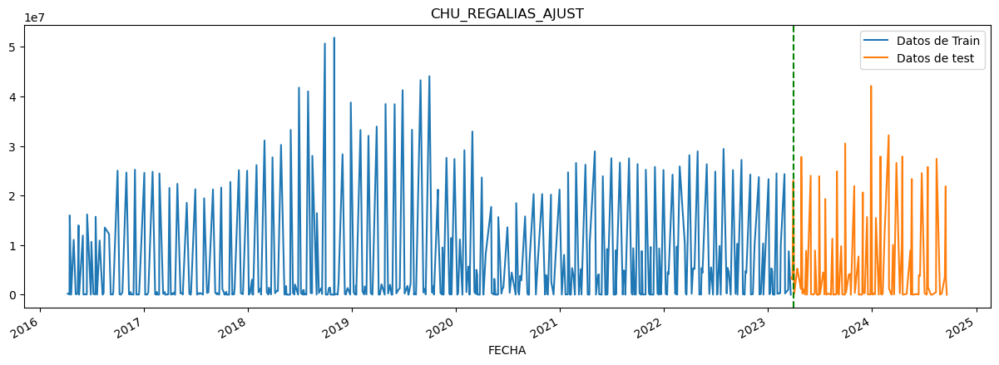

In [8]:
for i in range(len(dataframes)):
    # Separamos los datos en train y test
    fig, ax = plt.subplots(figsize=(15, 5))
    
    dataframes_train[i][titulos[i]].plot(ax=ax, label='Datos de Train', title=f'{titulos[i]}')
    dataframes_test[i][titulos[i]].plot(ax=ax, label='Datos de test')
    ax.axvline(f'{dataframes_test[i].index[i]}', color='green', ls='--')
    ax.legend(['Datos de Train', 'Datos de test'])
    plt.show()

In [9]:
FEATURES = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear' , 'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3']
TARGET = 'CHU_COPA_AJUST'

In [10]:
X_train = dataframes_train[0][FEATURES]
y_train = dataframes_train[0][TARGET]

X_test = dataframes_test[0][FEATURES]
y_test = dataframes_test[0][TARGET]

In [17]:
import optuna
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error



def objective(trial, df):
    param = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),  # Reducido de 100 a 500
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1, log=True),  # Reducido de 0.01 a 0.1
        "max_depth": trial.suggest_int("max_depth", 3, 7),  # Reducido de 3 a 7
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 5),  # Reducido de 1 a 5
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),  # Reducido de 0.6 a 1.0
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),  # Reducido de 0.6 a 1.0
        "gamma": trial.suggest_float("gamma", 0, 0.5),  # Reducido de 0 a 0.5
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 0.5),  # Regularización L1 más acotada
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 1.5),  # Regularización L2 más acotada
        "random_state": 42,
        "objective": "reg:squarederror",
        "early_stopping_rounds": 50,
    }

    test_size = 100
    tss = TimeSeriesSplit(n_splits=5, test_size=test_size, gap=10)
    scores = []

    for train_idx, val_idx in tss.split(df):
        train = df.iloc[train_idx]
        test = df.iloc[val_idx]

        FEATURES = ['dayofyear', 'dayofweek', 'quarter', 'month', 'year',
                    'lag1', 'lag2', 'lag3']
        TARGET = df.columns[0]

        # Verificar características y dropna
        assert all(feature in train.columns for feature in FEATURES), "Faltan columnas en train"
        assert all(feature in test.columns for feature in FEATURES), "Faltan columnas en test"

        X_train = train[FEATURES].dropna()
        y_train = train[TARGET].loc[X_train.index]
        X_test = test[FEATURES].dropna()
        y_test = test[TARGET].loc[X_test.index]

        if X_train.empty or X_test.empty:
            raise ValueError("X_train o X_test está vacío después de dropna")

        model = xgb.XGBRegressor(**param)
        model.fit(
            X_train, y_train,
            eval_set=[(X_test, y_test)]
        )

        y_pred = model.predict(X_test)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        scores.append(rmse)

    return np.mean(scores)


In [18]:
# Ejecutar la optimización con Optuna
df = dataframes_train[0].copy() ### ACACAACACACACACACACA
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective(trial, df), n_trials=100)


copa_best_params = study.best_params
copa_rmse = study.best_value
# Imprimir los mejores parámetros y el mejor RMSE
print("Mejores parámetros para COPA:", study.best_params)
print("Mejor RMSE promedio para COPA:", study.best_value)

[I 2024-11-17 16:58:54,041] A new study created in memory with name: no-name-d3c7fab4-c3b1-4b55-8fb3-952d271c3655


[0]	validation_0-rmse:2000243.66909
[1]	validation_0-rmse:1973190.07238
[2]	validation_0-rmse:1937189.64399
[3]	validation_0-rmse:1905514.45364
[4]	validation_0-rmse:1873982.48766
[5]	validation_0-rmse:1844396.31470
[6]	validation_0-rmse:1816819.29235
[7]	validation_0-rmse:1794482.49091
[8]	validation_0-rmse:1772077.84969
[9]	validation_0-rmse:1768883.55995
[10]	validation_0-rmse:1757589.20515
[11]	validation_0-rmse:1740367.85102
[12]	validation_0-rmse:1724863.60234
[13]	validation_0-rmse:1716287.61693
[14]	validation_0-rmse:1706770.39601
[15]	validation_0-rmse:1698586.65293
[16]	validation_0-rmse:1691318.64061
[17]	validation_0-rmse:1683165.69454
[18]	validation_0-rmse:1676075.88137
[19]	validation_0-rmse:1670492.01502
[20]	validation_0-rmse:1669736.35528
[21]	validation_0-rmse:1664833.42520
[22]	validation_0-rmse:1653068.50060
[23]	validation_0-rmse:1648864.99850
[24]	validation_0-rmse:1642905.27783
[25]	validation_0-rmse:1638699.71727
[26]	validation_0-rmse:1635489.16517
[27]	valida

[I 2024-11-17 16:58:57,432] Trial 0 finished with value: 1480564.7544992107 and parameters: {'n_estimators': 464, 'learning_rate': 0.0464562510540339, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9775668100566273, 'colsample_bytree': 0.9817817300486783, 'gamma': 0.21631133056870988, 'reg_alpha': 0.2758482102409869, 'reg_lambda': 1.1506463607594617}. Best is trial 0 with value: 1480564.7544992107.


[0]	validation_0-rmse:2007443.75734
[1]	validation_0-rmse:1967292.28999
[2]	validation_0-rmse:1932646.24937
[3]	validation_0-rmse:1907299.07885
[4]	validation_0-rmse:1873129.23295
[5]	validation_0-rmse:1848809.09180
[6]	validation_0-rmse:1815069.04914
[7]	validation_0-rmse:1781721.63773
[8]	validation_0-rmse:1760347.81445
[9]	validation_0-rmse:1756518.42021
[10]	validation_0-rmse:1732421.03798
[11]	validation_0-rmse:1715199.02833
[12]	validation_0-rmse:1691216.85833
[13]	validation_0-rmse:1674084.90664
[14]	validation_0-rmse:1664693.57033
[15]	validation_0-rmse:1663282.02612
[16]	validation_0-rmse:1649910.21656
[17]	validation_0-rmse:1636209.46752
[18]	validation_0-rmse:1619805.40024
[19]	validation_0-rmse:1612796.84152
[20]	validation_0-rmse:1610042.29845
[21]	validation_0-rmse:1596281.06363
[22]	validation_0-rmse:1587004.86532
[23]	validation_0-rmse:1574942.20986
[24]	validation_0-rmse:1577183.98951
[25]	validation_0-rmse:1574456.30747
[26]	validation_0-rmse:1564676.52202
[27]	valida

[I 2024-11-17 16:58:59,682] Trial 1 finished with value: 1442381.3126592257 and parameters: {'n_estimators': 197, 'learning_rate': 0.05735166174996594, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.6290380064173332, 'colsample_bytree': 0.9367530829568353, 'gamma': 0.4238098252830832, 'reg_alpha': 0.12055038178231642, 'reg_lambda': 0.5876407559072394}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:2025644.52310
[1]	validation_0-rmse:2017394.00388
[2]	validation_0-rmse:2008854.69326
[3]	validation_0-rmse:2000436.11855
[4]	validation_0-rmse:1992168.65398
[5]	validation_0-rmse:1983990.02555
[6]	validation_0-rmse:1975927.44111
[7]	validation_0-rmse:1968905.55260
[8]	validation_0-rmse:1961054.98257
[9]	validation_0-rmse:1960508.38547
[10]	validation_0-rmse:1954412.95277
[11]	validation_0-rmse:1947653.70641
[12]	validation_0-rmse:1939522.58900
[13]	validation_0-rmse:1932568.34159
[14]	validation_0-rmse:1925285.33917
[15]	validation_0-rmse:1918002.09023
[16]	validation_0-rmse:1910859.83255
[17]	validation_0-rmse:1903883.89289
[18]	validation_0-rmse:1897663.69912
[19]	validation_0-rmse:1890884.13652
[20]	validation_0-rmse:1890463.22053
[21]	validation_0-rmse:1883822.64852
[22]	validation_0-rmse:1877307.48771
[23]	validation_0-rmse:1871332.67526
[24]	validation_0-rmse:1864984.78851
[25]	validation_0-rmse:1859176.58610
[26]	validation_0-rmse:1852992.52122
[27]	valida

[I 2024-11-17 16:59:03,985] Trial 2 finished with value: 1564880.7388006258 and parameters: {'n_estimators': 158, 'learning_rate': 0.010313279665766685, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.9768712018575672, 'colsample_bytree': 0.8875708618259339, 'gamma': 0.2395213900120663, 'reg_alpha': 0.060206371360541355, 'reg_lambda': 1.2104201498269402}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:2021967.09887
[1]	validation_0-rmse:2009814.43778
[2]	validation_0-rmse:1998612.72649
[3]	validation_0-rmse:1999237.39225
[4]	validation_0-rmse:1986559.86109
[5]	validation_0-rmse:1977073.23838
[6]	validation_0-rmse:1964244.98111
[7]	validation_0-rmse:1964376.46325
[8]	validation_0-rmse:1954056.56505
[9]	validation_0-rmse:1953473.53059
[10]	validation_0-rmse:1952211.53359
[11]	validation_0-rmse:1943506.98076
[12]	validation_0-rmse:1944267.57229
[13]	validation_0-rmse:1934556.68388
[14]	validation_0-rmse:1927073.95716
[15]	validation_0-rmse:1926930.71158
[16]	validation_0-rmse:1916720.75915
[17]	validation_0-rmse:1906495.72781
[18]	validation_0-rmse:1894977.63693
[19]	validation_0-rmse:1892985.90234
[20]	validation_0-rmse:1893291.98760
[21]	validation_0-rmse:1885104.31470
[22]	validation_0-rmse:1878184.88586
[23]	validation_0-rmse:1870611.92647
[24]	validation_0-rmse:1867838.49866
[25]	validation_0-rmse:1857720.64848
[26]	validation_0-rmse:1858227.05409
[27]	valida

[I 2024-11-17 16:59:08,314] Trial 3 finished with value: 1468755.3128967641 and parameters: {'n_estimators': 186, 'learning_rate': 0.01734472587206027, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.636991107724075, 'colsample_bytree': 0.6610740336021125, 'gamma': 0.10294573282133196, 'reg_alpha': 0.4576582054954212, 'reg_lambda': 0.6147681868941578}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:2023415.23419
[1]	validation_0-rmse:2010003.85986
[2]	validation_0-rmse:1996194.95898
[3]	validation_0-rmse:1993891.66174
[4]	validation_0-rmse:1983380.62742
[5]	validation_0-rmse:1969791.77381
[6]	validation_0-rmse:1965959.04084
[7]	validation_0-rmse:1964616.51168
[8]	validation_0-rmse:1954950.31018
[9]	validation_0-rmse:1956116.99207
[10]	validation_0-rmse:1954286.47915
[11]	validation_0-rmse:1942720.86647
[12]	validation_0-rmse:1943922.01853
[13]	validation_0-rmse:1934583.01968
[14]	validation_0-rmse:1923929.54217
[15]	validation_0-rmse:1923903.51720
[16]	validation_0-rmse:1920775.14705
[17]	validation_0-rmse:1909988.62551
[18]	validation_0-rmse:1899423.78399
[19]	validation_0-rmse:1896434.56664
[20]	validation_0-rmse:1895380.75646
[21]	validation_0-rmse:1885267.52327
[22]	validation_0-rmse:1875512.88160
[23]	validation_0-rmse:1872501.40829
[24]	validation_0-rmse:1866623.23204
[25]	validation_0-rmse:1864841.59056
[26]	validation_0-rmse:1865584.62267
[27]	valida

[I 2024-11-17 16:59:19,012] Trial 4 finished with value: 1474239.6153345797 and parameters: {'n_estimators': 463, 'learning_rate': 0.01645890953960571, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.9449204341392853, 'colsample_bytree': 0.6801404247237942, 'gamma': 0.20755922226978168, 'reg_alpha': 0.260164008682893, 'reg_lambda': 0.8675761128985875}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:2028108.17486
[1]	validation_0-rmse:2022168.43977
[2]	validation_0-rmse:2010659.68046
[3]	validation_0-rmse:2001966.75196
[4]	validation_0-rmse:1998258.03969
[5]	validation_0-rmse:1988223.40755
[6]	validation_0-rmse:1979345.16239
[7]	validation_0-rmse:1970583.08562
[8]	validation_0-rmse:1961073.23112
[9]	validation_0-rmse:1958674.50719
[10]	validation_0-rmse:1950340.81887
[11]	validation_0-rmse:1949329.00235
[12]	validation_0-rmse:1944501.48800
[13]	validation_0-rmse:1935989.51556
[14]	validation_0-rmse:1928668.59740
[15]	validation_0-rmse:1922947.74913
[16]	validation_0-rmse:1918835.04817
[17]	validation_0-rmse:1911738.93540
[18]	validation_0-rmse:1906008.47282
[19]	validation_0-rmse:1901695.86832
[20]	validation_0-rmse:1903428.30518
[21]	validation_0-rmse:1895635.23461
[22]	validation_0-rmse:1888239.07643
[23]	validation_0-rmse:1882049.11787
[24]	validation_0-rmse:1878832.08692
[25]	validation_0-rmse:1874415.22980
[26]	validation_0-rmse:1870743.72338
[27]	valida

[I 2024-11-17 16:59:26,433] Trial 5 finished with value: 1523995.9084789783 and parameters: {'n_estimators': 245, 'learning_rate': 0.013396886832915893, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.791232743509783, 'colsample_bytree': 0.9015085154368377, 'gamma': 0.48381653418272313, 'reg_alpha': 0.02989393600795348, 'reg_lambda': 0.5762775163728847}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:2023295.78086
[1]	validation_0-rmse:2008705.05373
[2]	validation_0-rmse:1994438.60951
[3]	validation_0-rmse:1988310.43857
[4]	validation_0-rmse:1970016.95083
[5]	validation_0-rmse:1956723.85444
[6]	validation_0-rmse:1942185.36294
[7]	validation_0-rmse:1944914.65775
[8]	validation_0-rmse:1930133.21914
[9]	validation_0-rmse:1930371.66927
[10]	validation_0-rmse:1912972.82423
[11]	validation_0-rmse:1900100.61714
[12]	validation_0-rmse:1901810.83736
[13]	validation_0-rmse:1896355.01722
[14]	validation_0-rmse:1888053.11050
[15]	validation_0-rmse:1883389.70573
[16]	validation_0-rmse:1870656.77231
[17]	validation_0-rmse:1861006.82009
[18]	validation_0-rmse:1852478.77902
[19]	validation_0-rmse:1848897.26085
[20]	validation_0-rmse:1850472.30845
[21]	validation_0-rmse:1839327.11702
[22]	validation_0-rmse:1832967.09619
[23]	validation_0-rmse:1823314.72687
[24]	validation_0-rmse:1818835.91518
[25]	validation_0-rmse:1808121.42682
[26]	validation_0-rmse:1808429.18956
[27]	valida

[I 2024-11-17 16:59:30,470] Trial 6 finished with value: 1488479.0226708564 and parameters: {'n_estimators': 169, 'learning_rate': 0.02447992670967652, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.6736610855273812, 'colsample_bytree': 0.8393235894226715, 'gamma': 0.16070349482156565, 'reg_alpha': 0.2545199281683479, 'reg_lambda': 0.8969155483226497}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:2023714.52681
[1]	validation_0-rmse:2011036.34775
[2]	validation_0-rmse:1999222.68804
[3]	validation_0-rmse:1987152.97393
[4]	validation_0-rmse:1974020.69650
[5]	validation_0-rmse:1960866.41822
[6]	validation_0-rmse:1957145.05875
[7]	validation_0-rmse:1954907.62292
[8]	validation_0-rmse:1945622.60800
[9]	validation_0-rmse:1945968.75747
[10]	validation_0-rmse:1934283.27603
[11]	validation_0-rmse:1922886.97995
[12]	validation_0-rmse:1923927.64975
[13]	validation_0-rmse:1913476.32173
[14]	validation_0-rmse:1907724.64437
[15]	validation_0-rmse:1897507.27283
[16]	validation_0-rmse:1886976.08076
[17]	validation_0-rmse:1876915.75652
[18]	validation_0-rmse:1867074.82062
[19]	validation_0-rmse:1864371.01392
[20]	validation_0-rmse:1864069.47544
[21]	validation_0-rmse:1854612.73909
[22]	validation_0-rmse:1845519.75352
[23]	validation_0-rmse:1842453.25905
[24]	validation_0-rmse:1836877.56445
[25]	validation_0-rmse:1834501.06960
[26]	validation_0-rmse:1833498.30094
[27]	valida

[I 2024-11-17 16:59:33,700] Trial 7 finished with value: 1553171.0669158036 and parameters: {'n_estimators': 118, 'learning_rate': 0.015665424475466566, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.9390330827937761, 'colsample_bytree': 0.8149738709023747, 'gamma': 0.25311218177134104, 'reg_alpha': 0.31716303917329014, 'reg_lambda': 0.755927394246615}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:2021752.62754
[1]	validation_0-rmse:2013222.12544
[2]	validation_0-rmse:1997868.94543
[3]	validation_0-rmse:1985989.54524
[4]	validation_0-rmse:1979386.81873
[5]	validation_0-rmse:1967097.37875
[6]	validation_0-rmse:1954409.91699
[7]	validation_0-rmse:1946148.02179
[8]	validation_0-rmse:1933896.03270
[9]	validation_0-rmse:1931311.22611
[10]	validation_0-rmse:1918521.99305
[11]	validation_0-rmse:1907603.96931
[12]	validation_0-rmse:1905210.06844
[13]	validation_0-rmse:1895074.01447
[14]	validation_0-rmse:1886901.21341
[15]	validation_0-rmse:1876173.02816
[16]	validation_0-rmse:1865694.12531
[17]	validation_0-rmse:1855515.40708
[18]	validation_0-rmse:1845755.90193
[19]	validation_0-rmse:1836292.55090
[20]	validation_0-rmse:1836811.12079
[21]	validation_0-rmse:1828491.97900
[22]	validation_0-rmse:1819815.17924
[23]	validation_0-rmse:1818407.12620
[24]	validation_0-rmse:1813073.31593
[25]	validation_0-rmse:1804928.30895
[26]	validation_0-rmse:1796707.73375
[27]	valida

[I 2024-11-17 16:59:36,194] Trial 8 finished with value: 1488070.8624771368 and parameters: {'n_estimators': 127, 'learning_rate': 0.01676569784249008, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.8134197662871846, 'colsample_bytree': 0.8865284539534624, 'gamma': 0.11291041132561941, 'reg_alpha': 0.07832922450432372, 'reg_lambda': 0.7042607954360649}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:2021073.52234
[1]	validation_0-rmse:2005812.59082
[2]	validation_0-rmse:1990422.44813
[3]	validation_0-rmse:1974540.33853
[4]	validation_0-rmse:1957522.98299
[5]	validation_0-rmse:1944889.72942
[6]	validation_0-rmse:1940542.60512
[7]	validation_0-rmse:1937935.35759
[8]	validation_0-rmse:1925921.87409
[9]	validation_0-rmse:1926834.81813
[10]	validation_0-rmse:1911859.24984
[11]	validation_0-rmse:1898607.19389
[12]	validation_0-rmse:1899831.09489
[13]	validation_0-rmse:1888816.26194
[14]	validation_0-rmse:1880958.02581
[15]	validation_0-rmse:1869314.15535
[16]	validation_0-rmse:1857609.07540
[17]	validation_0-rmse:1846917.21335
[18]	validation_0-rmse:1836871.51039
[19]	validation_0-rmse:1827141.79913
[20]	validation_0-rmse:1826825.05583
[21]	validation_0-rmse:1815889.97525
[22]	validation_0-rmse:1805704.92078
[23]	validation_0-rmse:1796569.17285
[24]	validation_0-rmse:1790986.75078
[25]	validation_0-rmse:1782189.89513
[26]	validation_0-rmse:1781678.48852
[27]	valida

[I 2024-11-17 16:59:44,979] Trial 9 finished with value: 1475952.5478767902 and parameters: {'n_estimators': 452, 'learning_rate': 0.01832510365190031, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.8931862341821082, 'colsample_bytree': 0.8375659940294287, 'gamma': 0.205837417713785, 'reg_alpha': 0.26634691114147313, 'reg_lambda': 0.5495707263009433}. Best is trial 1 with value: 1442381.3126592257.


[0]	validation_0-rmse:1990014.69334
[1]	validation_0-rmse:1941036.69856
[2]	validation_0-rmse:1906700.74543
[3]	validation_0-rmse:1881617.93327
[4]	validation_0-rmse:1841086.73222
[5]	validation_0-rmse:1800074.97914
[6]	validation_0-rmse:1756671.87826
[7]	validation_0-rmse:1729172.48562
[8]	validation_0-rmse:1694544.96541
[9]	validation_0-rmse:1690427.40977
[10]	validation_0-rmse:1663329.21853
[11]	validation_0-rmse:1641010.59900
[12]	validation_0-rmse:1620565.10301
[13]	validation_0-rmse:1608625.11212
[14]	validation_0-rmse:1600903.67495
[15]	validation_0-rmse:1586609.17951
[16]	validation_0-rmse:1577833.48595
[17]	validation_0-rmse:1559370.91833
[18]	validation_0-rmse:1547701.72672
[19]	validation_0-rmse:1545736.92648
[20]	validation_0-rmse:1542752.16873
[21]	validation_0-rmse:1529342.76966
[22]	validation_0-rmse:1526751.31746
[23]	validation_0-rmse:1520433.18939
[24]	validation_0-rmse:1519790.95844
[25]	validation_0-rmse:1517495.59114
[26]	validation_0-rmse:1518625.88134
[27]	valida

[I 2024-11-17 16:59:47,101] Trial 10 finished with value: 1425456.7313235435 and parameters: {'n_estimators': 347, 'learning_rate': 0.08212695146444675, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7152665243416085, 'colsample_bytree': 0.9817459872416094, 'gamma': 0.45897381491411043, 'reg_alpha': 0.14543046556949338, 'reg_lambda': 1.4390471742939188}. Best is trial 10 with value: 1425456.7313235435.


[0]	validation_0-rmse:1984303.66898
[1]	validation_0-rmse:1929212.89370
[2]	validation_0-rmse:1891169.06356
[3]	validation_0-rmse:1863862.60195
[4]	validation_0-rmse:1819804.06177
[5]	validation_0-rmse:1774640.53018
[6]	validation_0-rmse:1728612.99221
[7]	validation_0-rmse:1700505.88900
[8]	validation_0-rmse:1667982.56302
[9]	validation_0-rmse:1663229.12820
[10]	validation_0-rmse:1635561.45239
[11]	validation_0-rmse:1613286.36214
[12]	validation_0-rmse:1592913.92570
[13]	validation_0-rmse:1582697.41031
[14]	validation_0-rmse:1575134.81963
[15]	validation_0-rmse:1561508.41524
[16]	validation_0-rmse:1553133.60340
[17]	validation_0-rmse:1535050.58214
[18]	validation_0-rmse:1526970.45353
[19]	validation_0-rmse:1525165.37241
[20]	validation_0-rmse:1522126.58222
[21]	validation_0-rmse:1506237.90865
[22]	validation_0-rmse:1501952.48208
[23]	validation_0-rmse:1497144.35854
[24]	validation_0-rmse:1498645.31047
[25]	validation_0-rmse:1496650.51489
[26]	validation_0-rmse:1497970.17660
[27]	valida

[I 2024-11-17 16:59:49,334] Trial 11 finished with value: 1430760.2538054667 and parameters: {'n_estimators': 341, 'learning_rate': 0.09373729913932209, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7067331139623746, 'colsample_bytree': 0.9951102209158106, 'gamma': 0.4673104404596198, 'reg_alpha': 0.1667434182558234, 'reg_lambda': 1.479756609576852}. Best is trial 10 with value: 1425456.7313235435.


[0]	validation_0-rmse:1985098.63699
[1]	validation_0-rmse:1936489.23879
[2]	validation_0-rmse:1907411.02143
[3]	validation_0-rmse:1905122.39552
[4]	validation_0-rmse:1859429.81109
[5]	validation_0-rmse:1816895.22176
[6]	validation_0-rmse:1772510.08779
[7]	validation_0-rmse:1771710.75412
[8]	validation_0-rmse:1736200.90922
[9]	validation_0-rmse:1731335.06608
[10]	validation_0-rmse:1732324.01999
[11]	validation_0-rmse:1716231.42516
[12]	validation_0-rmse:1717291.58181
[13]	validation_0-rmse:1698648.03321
[14]	validation_0-rmse:1688032.83560
[15]	validation_0-rmse:1687054.00842
[16]	validation_0-rmse:1664881.27448
[17]	validation_0-rmse:1640907.39560
[18]	validation_0-rmse:1627573.88341
[19]	validation_0-rmse:1630301.94779
[20]	validation_0-rmse:1629804.42040
[21]	validation_0-rmse:1616591.45607
[22]	validation_0-rmse:1608615.86654
[23]	validation_0-rmse:1600790.85120
[24]	validation_0-rmse:1599662.50281
[25]	validation_0-rmse:1598986.29951
[26]	validation_0-rmse:1600247.20437
[27]	valida

[I 2024-11-17 16:59:51,805] Trial 12 finished with value: 1433606.1077809103 and parameters: {'n_estimators': 358, 'learning_rate': 0.08645775067477314, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7272064682401095, 'colsample_bytree': 0.7433014668662745, 'gamma': 0.34422728721749324, 'reg_alpha': 0.16220443544931384, 'reg_lambda': 1.4434292864235667}. Best is trial 10 with value: 1425456.7313235435.


[0]	validation_0-rmse:1982678.82557
[1]	validation_0-rmse:1953310.15969
[2]	validation_0-rmse:1907699.82360
[3]	validation_0-rmse:1882704.26964
[4]	validation_0-rmse:1820038.39755
[5]	validation_0-rmse:1774847.26058
[6]	validation_0-rmse:1733758.66303
[7]	validation_0-rmse:1703837.52918
[8]	validation_0-rmse:1669241.49511
[9]	validation_0-rmse:1663891.23014
[10]	validation_0-rmse:1636640.18512
[11]	validation_0-rmse:1626032.56739
[12]	validation_0-rmse:1609073.44290
[13]	validation_0-rmse:1598158.56201
[14]	validation_0-rmse:1585800.49079
[15]	validation_0-rmse:1568717.12546
[16]	validation_0-rmse:1561309.46631
[17]	validation_0-rmse:1542915.06461
[18]	validation_0-rmse:1533225.20554
[19]	validation_0-rmse:1530798.05578
[20]	validation_0-rmse:1529777.68056
[21]	validation_0-rmse:1516690.19994
[22]	validation_0-rmse:1514484.05021
[23]	validation_0-rmse:1513232.36732
[24]	validation_0-rmse:1519331.79347
[25]	validation_0-rmse:1520360.20229
[26]	validation_0-rmse:1516756.20711
[27]	valida

[I 2024-11-17 16:59:53,888] Trial 13 finished with value: 1442133.3085847967 and parameters: {'n_estimators': 339, 'learning_rate': 0.09600938931178919, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7219047751435221, 'colsample_bytree': 0.9982903510536957, 'gamma': 0.009854208006003673, 'reg_alpha': 0.1717745987495154, 'reg_lambda': 1.4984124311173348}. Best is trial 10 with value: 1425456.7313235435.


[0]	validation_0-rmse:1982940.16943
[1]	validation_0-rmse:1963469.42078
[2]	validation_0-rmse:1931869.73493
[3]	validation_0-rmse:1910373.19356
[4]	validation_0-rmse:1876967.55051
[5]	validation_0-rmse:1842630.53949
[6]	validation_0-rmse:1808047.52216
[7]	validation_0-rmse:1781005.87842
[8]	validation_0-rmse:1748964.17002
[9]	validation_0-rmse:1745288.66337
[10]	validation_0-rmse:1728074.41110
[11]	validation_0-rmse:1717804.81096
[12]	validation_0-rmse:1702750.54215
[13]	validation_0-rmse:1690513.44437
[14]	validation_0-rmse:1683269.51207
[15]	validation_0-rmse:1662493.66963
[16]	validation_0-rmse:1645681.04117
[17]	validation_0-rmse:1628274.84233
[18]	validation_0-rmse:1622668.66279
[19]	validation_0-rmse:1622269.96624
[20]	validation_0-rmse:1620088.77658
[21]	validation_0-rmse:1607868.93043
[22]	validation_0-rmse:1603465.82613
[23]	validation_0-rmse:1601845.25821
[24]	validation_0-rmse:1600414.43934
[25]	validation_0-rmse:1597917.57909
[26]	validation_0-rmse:1590133.85452
[27]	valida

[I 2024-11-17 16:59:56,518] Trial 14 finished with value: 1432288.1144397133 and parameters: {'n_estimators': 384, 'learning_rate': 0.06342175476434482, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7566508668687252, 'colsample_bytree': 0.9480301840292471, 'gamma': 0.37194022634115187, 'reg_alpha': 0.17792476558114317, 'reg_lambda': 1.3385583812580888}. Best is trial 10 with value: 1425456.7313235435.


[0]	validation_0-rmse:2015099.92788
[1]	validation_0-rmse:1986888.55612
[2]	validation_0-rmse:1957034.50026
[3]	validation_0-rmse:1954445.99000
[4]	validation_0-rmse:1933191.37554
[5]	validation_0-rmse:1908674.07153
[6]	validation_0-rmse:1881969.71184
[7]	validation_0-rmse:1880109.54463
[8]	validation_0-rmse:1855437.22460
[9]	validation_0-rmse:1852700.83608
[10]	validation_0-rmse:1851523.21971
[11]	validation_0-rmse:1831188.14796
[12]	validation_0-rmse:1833801.08542
[13]	validation_0-rmse:1820262.97851
[14]	validation_0-rmse:1804447.66377
[15]	validation_0-rmse:1804616.44636
[16]	validation_0-rmse:1801481.99128
[17]	validation_0-rmse:1784088.67279
[18]	validation_0-rmse:1769506.57883
[19]	validation_0-rmse:1765135.83747
[20]	validation_0-rmse:1767186.50828
[21]	validation_0-rmse:1752631.08338
[22]	validation_0-rmse:1747341.65965
[23]	validation_0-rmse:1731239.94428
[24]	validation_0-rmse:1725674.36216
[25]	validation_0-rmse:1715721.26844
[26]	validation_0-rmse:1717085.56825
[27]	valida

[I 2024-11-17 16:59:59,516] Trial 15 finished with value: 1436715.4890496 and parameters: {'n_estimators': 287, 'learning_rate': 0.039024123596001326, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.8480955852513772, 'colsample_bytree': 0.7456188375320183, 'gamma': 0.4800068260099965, 'reg_alpha': 0.38632765628190857, 'reg_lambda': 1.2896255288448653}. Best is trial 10 with value: 1425456.7313235435.


[0]	validation_0-rmse:1990771.98473
[1]	validation_0-rmse:1945216.91395
[2]	validation_0-rmse:1912971.20087
[3]	validation_0-rmse:1889663.32601
[4]	validation_0-rmse:1850152.32812
[5]	validation_0-rmse:1813067.58624
[6]	validation_0-rmse:1777490.95906
[7]	validation_0-rmse:1750977.36987
[8]	validation_0-rmse:1728787.01564
[9]	validation_0-rmse:1724042.61512
[10]	validation_0-rmse:1699061.84644
[11]	validation_0-rmse:1675425.37178
[12]	validation_0-rmse:1651052.24193
[13]	validation_0-rmse:1635737.60414
[14]	validation_0-rmse:1627199.06439
[15]	validation_0-rmse:1627109.43517
[16]	validation_0-rmse:1617394.42222
[17]	validation_0-rmse:1602640.33601
[18]	validation_0-rmse:1587498.77780
[19]	validation_0-rmse:1582428.40673
[20]	validation_0-rmse:1582712.35302
[21]	validation_0-rmse:1565310.78383
[22]	validation_0-rmse:1558538.81348
[23]	validation_0-rmse:1546050.09613
[24]	validation_0-rmse:1546281.00338
[25]	validation_0-rmse:1540291.18333
[26]	validation_0-rmse:1532521.24525
[27]	valida

[I 2024-11-17 17:00:01,792] Trial 16 finished with value: 1421630.3737975415 and parameters: {'n_estimators': 397, 'learning_rate': 0.07177682707113917, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.6798508110475394, 'colsample_bytree': 0.9575211295253262, 'gamma': 0.32628370803851237, 'reg_alpha': 0.12131443974516737, 'reg_lambda': 1.0762254060113343}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1994115.72483
[1]	validation_0-rmse:1951365.48125
[2]	validation_0-rmse:1909808.70812
[3]	validation_0-rmse:1889942.79565
[4]	validation_0-rmse:1851164.37480
[5]	validation_0-rmse:1814817.74029
[6]	validation_0-rmse:1778370.19038
[7]	validation_0-rmse:1753845.69421
[8]	validation_0-rmse:1728212.79064
[9]	validation_0-rmse:1723634.20002
[10]	validation_0-rmse:1703655.13868
[11]	validation_0-rmse:1681701.74441
[12]	validation_0-rmse:1661485.84326
[13]	validation_0-rmse:1640197.05849
[14]	validation_0-rmse:1620560.79996
[15]	validation_0-rmse:1616302.29800
[16]	validation_0-rmse:1608276.56264
[17]	validation_0-rmse:1593791.95566
[18]	validation_0-rmse:1589746.04532
[19]	validation_0-rmse:1586790.26346
[20]	validation_0-rmse:1584956.39213
[21]	validation_0-rmse:1572452.20713
[22]	validation_0-rmse:1564416.23844
[23]	validation_0-rmse:1555297.37763
[24]	validation_0-rmse:1555753.03696
[25]	validation_0-rmse:1554140.99336
[26]	validation_0-rmse:1546206.01936
[27]	valida

[I 2024-11-17 17:00:04,185] Trial 17 finished with value: 1465565.6961605195 and parameters: {'n_estimators': 424, 'learning_rate': 0.06593665833369551, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6756829845605782, 'colsample_bytree': 0.9412148630518244, 'gamma': 0.3182203560158351, 'reg_alpha': 0.0028288404266809397, 'reg_lambda': 1.0683771209405089}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:2017631.86654
[1]	validation_0-rmse:1994372.15445
[2]	validation_0-rmse:1975431.06532
[3]	validation_0-rmse:1958061.26117
[4]	validation_0-rmse:1936566.96388
[5]	validation_0-rmse:1919617.72502
[6]	validation_0-rmse:1897063.06092
[7]	validation_0-rmse:1895833.49503
[8]	validation_0-rmse:1878779.96535
[9]	validation_0-rmse:1875404.12731
[10]	validation_0-rmse:1852237.50964
[11]	validation_0-rmse:1832302.75371
[12]	validation_0-rmse:1834635.41768
[13]	validation_0-rmse:1816227.88662
[14]	validation_0-rmse:1808196.42023
[15]	validation_0-rmse:1795650.97811
[16]	validation_0-rmse:1782455.89321
[17]	validation_0-rmse:1768253.97033
[18]	validation_0-rmse:1751038.26657
[19]	validation_0-rmse:1737539.46298
[20]	validation_0-rmse:1735606.32176
[21]	validation_0-rmse:1722389.06526
[22]	validation_0-rmse:1713469.73105
[23]	validation_0-rmse:1702569.45838
[24]	validation_0-rmse:1702821.51302
[25]	validation_0-rmse:1698608.10659
[26]	validation_0-rmse:1699429.75633
[27]	valida

[I 2024-11-17 17:00:07,051] Trial 18 finished with value: 1439773.5455052862 and parameters: {'n_estimators': 288, 'learning_rate': 0.036123041441574716, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.6173487273445444, 'colsample_bytree': 0.778454373580052, 'gamma': 0.3991876129883192, 'reg_alpha': 0.11487175504033001, 'reg_lambda': 1.0067680403584487}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1972213.37483
[1]	validation_0-rmse:1952270.17039
[2]	validation_0-rmse:1925568.08803
[3]	validation_0-rmse:1924171.73856
[4]	validation_0-rmse:1917747.59829
[5]	validation_0-rmse:1914852.34961
[6]	validation_0-rmse:1913552.14606
[7]	validation_0-rmse:1913859.28580
[8]	validation_0-rmse:1876045.28859
[9]	validation_0-rmse:1876471.49637
[10]	validation_0-rmse:1881957.33820
[11]	validation_0-rmse:1860260.08835
[12]	validation_0-rmse:1860206.09390
[13]	validation_0-rmse:1835572.08976
[14]	validation_0-rmse:1818351.05914
[15]	validation_0-rmse:1816918.03837
[16]	validation_0-rmse:1795499.36551
[17]	validation_0-rmse:1768986.47112
[18]	validation_0-rmse:1742543.98652
[19]	validation_0-rmse:1743500.95591
[20]	validation_0-rmse:1743391.53241
[21]	validation_0-rmse:1742744.17072
[22]	validation_0-rmse:1736658.76389
[23]	validation_0-rmse:1725684.83879
[24]	validation_0-rmse:1726387.76257
[25]	validation_0-rmse:1724743.09077
[26]	validation_0-rmse:1726525.23631
[27]	valida

[I 2024-11-17 17:00:10,057] Trial 19 finished with value: 1444024.7571922266 and parameters: {'n_estimators': 500, 'learning_rate': 0.0742723574731505, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.7587296475622898, 'colsample_bytree': 0.6128967734511795, 'gamma': 0.28524429629679166, 'reg_alpha': 0.21533497108895328, 'reg_lambda': 1.335843935432944}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:2003745.06838
[1]	validation_0-rmse:1971320.67958
[2]	validation_0-rmse:1939104.97568
[3]	validation_0-rmse:1923059.19978
[4]	validation_0-rmse:1892208.34328
[5]	validation_0-rmse:1862493.40404
[6]	validation_0-rmse:1831984.57202
[7]	validation_0-rmse:1810686.53248
[8]	validation_0-rmse:1788493.91186
[9]	validation_0-rmse:1780178.05800
[10]	validation_0-rmse:1761696.51339
[11]	validation_0-rmse:1741040.82186
[12]	validation_0-rmse:1722411.31742
[13]	validation_0-rmse:1704302.26219
[14]	validation_0-rmse:1686084.08926
[15]	validation_0-rmse:1678079.31043
[16]	validation_0-rmse:1666520.25811
[17]	validation_0-rmse:1652298.38150
[18]	validation_0-rmse:1645451.61613
[19]	validation_0-rmse:1640415.22220
[20]	validation_0-rmse:1641422.26077
[21]	validation_0-rmse:1629575.68379
[22]	validation_0-rmse:1620134.35242
[23]	validation_0-rmse:1608031.91469
[24]	validation_0-rmse:1606567.80782
[25]	validation_0-rmse:1605268.76288
[26]	validation_0-rmse:1597558.99263
[27]	valida

[I 2024-11-17 17:00:12,688] Trial 20 finished with value: 1453500.4550336287 and parameters: {'n_estimators': 391, 'learning_rate': 0.049664151905830706, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6733026107648397, 'colsample_bytree': 0.8996148165461326, 'gamma': 0.4236888575681419, 'reg_alpha': 0.11824697467982126, 'reg_lambda': 1.105068936554287}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1981322.31039
[1]	validation_0-rmse:1923032.35186
[2]	validation_0-rmse:1883186.25363
[3]	validation_0-rmse:1854814.31153
[4]	validation_0-rmse:1809127.96480
[5]	validation_0-rmse:1762531.89846
[6]	validation_0-rmse:1715306.95009
[7]	validation_0-rmse:1686921.31594
[8]	validation_0-rmse:1653951.12914
[9]	validation_0-rmse:1649020.02135
[10]	validation_0-rmse:1621253.73234
[11]	validation_0-rmse:1599497.30697
[12]	validation_0-rmse:1579421.39388
[13]	validation_0-rmse:1568273.68855
[14]	validation_0-rmse:1561285.93757
[15]	validation_0-rmse:1548405.15983
[16]	validation_0-rmse:1540538.31749
[17]	validation_0-rmse:1523153.91862
[18]	validation_0-rmse:1515596.30904
[19]	validation_0-rmse:1514405.50053
[20]	validation_0-rmse:1510755.29322
[21]	validation_0-rmse:1498333.12956
[22]	validation_0-rmse:1491263.77628
[23]	validation_0-rmse:1485953.56917
[24]	validation_0-rmse:1487587.69883
[25]	validation_0-rmse:1485279.63190
[26]	validation_0-rmse:1486477.43644
[27]	valida

[I 2024-11-17 17:00:14,938] Trial 21 finished with value: 1429187.8553619036 and parameters: {'n_estimators': 322, 'learning_rate': 0.09865117504014166, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7086870601137314, 'colsample_bytree': 0.9769663593633358, 'gamma': 0.49605803301672885, 'reg_alpha': 0.17111042637262808, 'reg_lambda': 1.4056767201926497}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1988780.87084
[1]	validation_0-rmse:1942198.43659
[2]	validation_0-rmse:1914957.15446
[3]	validation_0-rmse:1886937.08994
[4]	validation_0-rmse:1844851.95339
[5]	validation_0-rmse:1806151.45246
[6]	validation_0-rmse:1766101.62333
[7]	validation_0-rmse:1736014.48225
[8]	validation_0-rmse:1704703.92203
[9]	validation_0-rmse:1699532.81760
[10]	validation_0-rmse:1674823.22481
[11]	validation_0-rmse:1653115.83494
[12]	validation_0-rmse:1634663.13686
[13]	validation_0-rmse:1624006.19625
[14]	validation_0-rmse:1617929.93019
[15]	validation_0-rmse:1602686.77478
[16]	validation_0-rmse:1592755.35607
[17]	validation_0-rmse:1579826.71325
[18]	validation_0-rmse:1572919.61197
[19]	validation_0-rmse:1567416.59335
[20]	validation_0-rmse:1565509.20034
[21]	validation_0-rmse:1552579.56264
[22]	validation_0-rmse:1551170.51415
[23]	validation_0-rmse:1546563.88703
[24]	validation_0-rmse:1546159.30897
[25]	validation_0-rmse:1545649.58034
[26]	validation_0-rmse:1536932.89103
[27]	valida

[I 2024-11-17 17:00:17,188] Trial 22 finished with value: 1441147.9484858778 and parameters: {'n_estimators': 251, 'learning_rate': 0.07925019876387877, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7649198195888455, 'colsample_bytree': 0.9561879445480698, 'gamma': 0.4420625267598716, 'reg_alpha': 0.20469207240422255, 'reg_lambda': 1.39694697257775}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:2017127.80351
[1]	validation_0-rmse:1999663.76868
[2]	validation_0-rmse:1986496.02702
[3]	validation_0-rmse:1976265.29848
[4]	validation_0-rmse:1958002.93566
[5]	validation_0-rmse:1940669.82997
[6]	validation_0-rmse:1922925.66936
[7]	validation_0-rmse:1908352.71502
[8]	validation_0-rmse:1891024.54303
[9]	validation_0-rmse:1888508.47344
[10]	validation_0-rmse:1873188.41300
[11]	validation_0-rmse:1857513.64381
[12]	validation_0-rmse:1841938.36835
[13]	validation_0-rmse:1829620.26895
[14]	validation_0-rmse:1823177.29680
[15]	validation_0-rmse:1812352.30045
[16]	validation_0-rmse:1801221.10307
[17]	validation_0-rmse:1789175.30528
[18]	validation_0-rmse:1774872.97217
[19]	validation_0-rmse:1767519.68685
[20]	validation_0-rmse:1767811.63594
[21]	validation_0-rmse:1756449.37414
[22]	validation_0-rmse:1748795.59127
[23]	validation_0-rmse:1738329.32982
[24]	validation_0-rmse:1735575.03295
[25]	validation_0-rmse:1726356.98178
[26]	validation_0-rmse:1718505.13478
[27]	valida

[I 2024-11-17 17:00:20,610] Trial 23 finished with value: 1438590.5606806532 and parameters: {'n_estimators': 316, 'learning_rate': 0.02723213336816339, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.6873807878057421, 'colsample_bytree': 0.9205866409893831, 'gamma': 0.37747332584232157, 'reg_alpha': 0.08223980348112092, 'reg_lambda': 1.2280127729239418}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1995358.41682
[1]	validation_0-rmse:1954579.61637
[2]	validation_0-rmse:1918744.58244
[3]	validation_0-rmse:1890009.76129
[4]	validation_0-rmse:1854437.23001
[5]	validation_0-rmse:1819474.54911
[6]	validation_0-rmse:1784396.92641
[7]	validation_0-rmse:1750166.55001
[8]	validation_0-rmse:1725888.14661
[9]	validation_0-rmse:1721891.39228
[10]	validation_0-rmse:1693604.26088
[11]	validation_0-rmse:1673661.37484
[12]	validation_0-rmse:1671993.56414
[13]	validation_0-rmse:1657741.31560
[14]	validation_0-rmse:1645926.96934
[15]	validation_0-rmse:1643344.39292
[16]	validation_0-rmse:1631361.41268
[17]	validation_0-rmse:1616624.67793
[18]	validation_0-rmse:1613713.24465
[19]	validation_0-rmse:1594850.27598
[20]	validation_0-rmse:1593507.22624
[21]	validation_0-rmse:1582654.51341
[22]	validation_0-rmse:1575239.45455
[23]	validation_0-rmse:1563078.93739
[24]	validation_0-rmse:1563256.60494
[25]	validation_0-rmse:1560862.31946
[26]	validation_0-rmse:1551502.40692
[27]	valida

[I 2024-11-17 17:00:22,724] Trial 24 finished with value: 1438767.8368684808 and parameters: {'n_estimators': 391, 'learning_rate': 0.07014278143061192, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6038986269391328, 'colsample_bytree': 0.9706579144629003, 'gamma': 0.3458034584749748, 'reg_alpha': 0.12347183747993534, 'reg_lambda': 1.3875641823759768}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:2001891.52932
[1]	validation_0-rmse:1968508.55794
[2]	validation_0-rmse:1938575.47187
[3]	validation_0-rmse:1915529.72777
[4]	validation_0-rmse:1884606.94562
[5]	validation_0-rmse:1862494.76818
[6]	validation_0-rmse:1831026.08223
[7]	validation_0-rmse:1828648.94982
[8]	validation_0-rmse:1803475.39440
[9]	validation_0-rmse:1800615.40607
[10]	validation_0-rmse:1778325.43456
[11]	validation_0-rmse:1754867.20341
[12]	validation_0-rmse:1757989.87625
[13]	validation_0-rmse:1737988.02141
[14]	validation_0-rmse:1728525.91576
[15]	validation_0-rmse:1728674.49599
[16]	validation_0-rmse:1714129.16487
[17]	validation_0-rmse:1698298.90173
[18]	validation_0-rmse:1679863.27574
[19]	validation_0-rmse:1680094.03780
[20]	validation_0-rmse:1677994.57536
[21]	validation_0-rmse:1667727.80510
[22]	validation_0-rmse:1658934.44422
[23]	validation_0-rmse:1647159.50918
[24]	validation_0-rmse:1648453.02548
[25]	validation_0-rmse:1645579.63600
[26]	validation_0-rmse:1647065.44385
[27]	valida

[I 2024-11-17 17:00:25,154] Trial 25 finished with value: 1467044.9484871994 and parameters: {'n_estimators': 421, 'learning_rate': 0.05388765250262834, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.6529050237693076, 'colsample_bytree': 0.855960006910158, 'gamma': 0.488438437650552, 'reg_alpha': 0.22337105197601528, 'reg_lambda': 1.2510681420488126}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1951013.91045
[1]	validation_0-rmse:1922077.82261
[2]	validation_0-rmse:1874478.29686
[3]	validation_0-rmse:1844407.85541
[4]	validation_0-rmse:1782296.31455
[5]	validation_0-rmse:1740510.82401
[6]	validation_0-rmse:1699499.21684
[7]	validation_0-rmse:1669259.32765
[8]	validation_0-rmse:1636533.37917
[9]	validation_0-rmse:1632247.65736
[10]	validation_0-rmse:1621315.66841
[11]	validation_0-rmse:1612641.23327
[12]	validation_0-rmse:1596886.75359
[13]	validation_0-rmse:1591222.43513
[14]	validation_0-rmse:1579503.96313
[15]	validation_0-rmse:1562089.64972
[16]	validation_0-rmse:1554346.30327
[17]	validation_0-rmse:1537385.26597
[18]	validation_0-rmse:1529220.47078
[19]	validation_0-rmse:1520606.15192
[20]	validation_0-rmse:1518203.82934
[21]	validation_0-rmse:1507048.21152
[22]	validation_0-rmse:1504926.87837
[23]	validation_0-rmse:1503335.74323
[24]	validation_0-rmse:1502920.17601
[25]	validation_0-rmse:1503651.97602
[26]	validation_0-rmse:1496327.76620
[27]	valida

[I 2024-11-17 17:00:27,082] Trial 26 finished with value: 1425720.290127947 and parameters: {'n_estimators': 261, 'learning_rate': 0.09844247083610824, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7304308751035435, 'colsample_bytree': 0.9675688562583993, 'gamma': 0.3016543614807686, 'reg_alpha': 0.3198820027980225, 'reg_lambda': 0.927187497946313}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1995262.93261
[1]	validation_0-rmse:1970064.74876
[2]	validation_0-rmse:1908535.36045
[3]	validation_0-rmse:1859805.83698
[4]	validation_0-rmse:1807625.91820
[5]	validation_0-rmse:1770344.12268
[6]	validation_0-rmse:1729104.75450
[7]	validation_0-rmse:1717518.94920
[8]	validation_0-rmse:1682370.95057
[9]	validation_0-rmse:1678246.92433
[10]	validation_0-rmse:1652555.66737
[11]	validation_0-rmse:1646305.86658
[12]	validation_0-rmse:1627683.82276
[13]	validation_0-rmse:1615820.00994
[14]	validation_0-rmse:1600413.30103
[15]	validation_0-rmse:1585250.40902
[16]	validation_0-rmse:1573939.79601
[17]	validation_0-rmse:1562069.95787
[18]	validation_0-rmse:1559374.60315
[19]	validation_0-rmse:1547878.21712
[20]	validation_0-rmse:1544563.29766
[21]	validation_0-rmse:1537699.27882
[22]	validation_0-rmse:1533603.07838
[23]	validation_0-rmse:1528183.06158
[24]	validation_0-rmse:1526153.33519
[25]	validation_0-rmse:1520269.25915
[26]	validation_0-rmse:1515448.54914
[27]	valida

[I 2024-11-17 17:00:28,985] Trial 27 finished with value: 1452287.3796377934 and parameters: {'n_estimators': 257, 'learning_rate': 0.07977147531369534, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.8280823204886292, 'colsample_bytree': 0.914884308646908, 'gamma': 0.3031599975263491, 'reg_alpha': 0.33350050539526066, 'reg_lambda': 0.9069023590845143}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1992170.00742
[1]	validation_0-rmse:1976463.94283
[2]	validation_0-rmse:1949563.01945
[3]	validation_0-rmse:1932009.36929
[4]	validation_0-rmse:1908490.52247
[5]	validation_0-rmse:1880624.37108
[6]	validation_0-rmse:1852450.89911
[7]	validation_0-rmse:1850206.43320
[8]	validation_0-rmse:1822233.35042
[9]	validation_0-rmse:1817263.95051
[10]	validation_0-rmse:1798495.54551
[11]	validation_0-rmse:1779191.71226
[12]	validation_0-rmse:1781065.28175
[13]	validation_0-rmse:1766785.97293
[14]	validation_0-rmse:1759912.74069
[15]	validation_0-rmse:1742317.30891
[16]	validation_0-rmse:1730671.33319
[17]	validation_0-rmse:1713650.64100
[18]	validation_0-rmse:1698870.52525
[19]	validation_0-rmse:1685841.48134
[20]	validation_0-rmse:1684326.58069
[21]	validation_0-rmse:1671558.99544
[22]	validation_0-rmse:1666126.43652
[23]	validation_0-rmse:1659481.50046
[24]	validation_0-rmse:1656782.53563
[25]	validation_0-rmse:1651999.97427
[26]	validation_0-rmse:1650865.29686
[27]	valida

[I 2024-11-17 17:00:33,431] Trial 28 finished with value: 1461326.0734542725 and parameters: {'n_estimators': 225, 'learning_rate': 0.043541943949032595, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.7343761420624788, 'colsample_bytree': 0.868203251877484, 'gamma': 0.2608206463902397, 'reg_alpha': 0.3708625871058911, 'reg_lambda': 0.812018339148555}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1993316.99331
[1]	validation_0-rmse:1957044.73399
[2]	validation_0-rmse:1935354.88831
[3]	validation_0-rmse:1912494.14277
[4]	validation_0-rmse:1880746.33729
[5]	validation_0-rmse:1847645.45084
[6]	validation_0-rmse:1816597.47357
[7]	validation_0-rmse:1789958.62366
[8]	validation_0-rmse:1761383.60057
[9]	validation_0-rmse:1757091.53451
[10]	validation_0-rmse:1733165.68174
[11]	validation_0-rmse:1709589.14297
[12]	validation_0-rmse:1691558.88890
[13]	validation_0-rmse:1677368.70240
[14]	validation_0-rmse:1665977.28487
[15]	validation_0-rmse:1647959.58624
[16]	validation_0-rmse:1635353.08574
[17]	validation_0-rmse:1619910.18388
[18]	validation_0-rmse:1608554.17275
[19]	validation_0-rmse:1605347.16744
[20]	validation_0-rmse:1606495.12977
[21]	validation_0-rmse:1592155.96366
[22]	validation_0-rmse:1579200.83262
[23]	validation_0-rmse:1574647.99479
[24]	validation_0-rmse:1572675.27550
[25]	validation_0-rmse:1565619.47311
[26]	validation_0-rmse:1560440.58034
[27]	valida

[I 2024-11-17 17:00:35,755] Trial 29 finished with value: 1451616.8953179773 and parameters: {'n_estimators': 361, 'learning_rate': 0.057387656461075784, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7692342952899642, 'colsample_bytree': 0.9698889522523656, 'gamma': 0.15595780453430413, 'reg_alpha': 0.4618549908917344, 'reg_lambda': 1.0169049226945106}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:2011053.84888
[1]	validation_0-rmse:1995510.31028
[2]	validation_0-rmse:1962556.83531
[3]	validation_0-rmse:1951812.30551
[4]	validation_0-rmse:1925370.88395
[5]	validation_0-rmse:1897122.64855
[6]	validation_0-rmse:1866328.80136
[7]	validation_0-rmse:1843372.42882
[8]	validation_0-rmse:1815548.76924
[9]	validation_0-rmse:1812076.01193
[10]	validation_0-rmse:1795895.09369
[11]	validation_0-rmse:1773469.19300
[12]	validation_0-rmse:1759718.98244
[13]	validation_0-rmse:1745978.46056
[14]	validation_0-rmse:1738084.43077
[15]	validation_0-rmse:1718714.80771
[16]	validation_0-rmse:1712371.48455
[17]	validation_0-rmse:1696657.57036
[18]	validation_0-rmse:1693917.31782
[19]	validation_0-rmse:1692272.58369
[20]	validation_0-rmse:1689805.40124
[21]	validation_0-rmse:1676676.85548
[22]	validation_0-rmse:1665311.60928
[23]	validation_0-rmse:1659216.73375
[24]	validation_0-rmse:1656629.50898
[25]	validation_0-rmse:1647408.48805
[26]	validation_0-rmse:1637215.39910
[27]	valida

[I 2024-11-17 17:00:39,934] Trial 30 finished with value: 1437072.7760361882 and parameters: {'n_estimators': 425, 'learning_rate': 0.04675908016447409, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.796740320874651, 'colsample_bytree': 0.9997193718512227, 'gamma': 0.32844688338262795, 'reg_alpha': 0.29978558801262556, 'reg_lambda': 1.1205944227087976}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1977435.09460
[1]	validation_0-rmse:1918570.17392
[2]	validation_0-rmse:1878372.76889
[3]	validation_0-rmse:1850204.14645
[4]	validation_0-rmse:1805102.65986
[5]	validation_0-rmse:1760454.16239
[6]	validation_0-rmse:1712992.18103
[7]	validation_0-rmse:1684299.28138
[8]	validation_0-rmse:1651078.05951
[9]	validation_0-rmse:1645744.99806
[10]	validation_0-rmse:1621309.41955
[11]	validation_0-rmse:1599156.53718
[12]	validation_0-rmse:1577382.17065
[13]	validation_0-rmse:1570533.24943
[14]	validation_0-rmse:1563180.47679
[15]	validation_0-rmse:1562638.27979
[16]	validation_0-rmse:1553141.04170
[17]	validation_0-rmse:1539373.35560
[18]	validation_0-rmse:1529122.36636
[19]	validation_0-rmse:1526115.50329
[20]	validation_0-rmse:1522366.57619
[21]	validation_0-rmse:1506459.51334
[22]	validation_0-rmse:1500998.53641
[23]	validation_0-rmse:1495184.67832
[24]	validation_0-rmse:1496424.12895
[25]	validation_0-rmse:1492583.61512
[26]	validation_0-rmse:1486282.82672
[27]	valida

[I 2024-11-17 17:00:42,135] Trial 31 finished with value: 1434972.4168603155 and parameters: {'n_estimators': 318, 'learning_rate': 0.09356198604572302, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.6947349448320872, 'colsample_bytree': 0.9721673287857523, 'gamma': 0.4493481435081639, 'reg_alpha': 0.35687128714207417, 'reg_lambda': 0.9688549393950072}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1987960.18907
[1]	validation_0-rmse:1936644.72897
[2]	validation_0-rmse:1901117.06551
[3]	validation_0-rmse:1873307.13092
[4]	validation_0-rmse:1831911.77029
[5]	validation_0-rmse:1789737.52971
[6]	validation_0-rmse:1745453.79160
[7]	validation_0-rmse:1717460.54058
[8]	validation_0-rmse:1682426.69470
[9]	validation_0-rmse:1678271.01061
[10]	validation_0-rmse:1651027.74469
[11]	validation_0-rmse:1627794.73028
[12]	validation_0-rmse:1607799.53938
[13]	validation_0-rmse:1596624.46077
[14]	validation_0-rmse:1589303.88998
[15]	validation_0-rmse:1575385.32373
[16]	validation_0-rmse:1566947.27876
[17]	validation_0-rmse:1549000.92030
[18]	validation_0-rmse:1537921.13227
[19]	validation_0-rmse:1536784.37269
[20]	validation_0-rmse:1533279.55494
[21]	validation_0-rmse:1517101.08163
[22]	validation_0-rmse:1515143.64386
[23]	validation_0-rmse:1509005.09498
[24]	validation_0-rmse:1508597.30193
[25]	validation_0-rmse:1506424.35616
[26]	validation_0-rmse:1507593.12771
[27]	valida

[I 2024-11-17 17:00:44,404] Trial 32 finished with value: 1429600.8209088624 and parameters: {'n_estimators': 279, 'learning_rate': 0.08296511123750258, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7119143251850488, 'colsample_bytree': 0.9324708222982495, 'gamma': 0.4044704689210784, 'reg_alpha': 0.1464439423897652, 'reg_lambda': 1.1541897466278714}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1976917.31265
[1]	validation_0-rmse:1915836.50452
[2]	validation_0-rmse:1866732.95815
[3]	validation_0-rmse:1831768.56089
[4]	validation_0-rmse:1783190.82762
[5]	validation_0-rmse:1752738.05573
[6]	validation_0-rmse:1710291.04383
[7]	validation_0-rmse:1681000.90190
[8]	validation_0-rmse:1655724.73596
[9]	validation_0-rmse:1651207.88289
[10]	validation_0-rmse:1625547.69571
[11]	validation_0-rmse:1605343.12319
[12]	validation_0-rmse:1581196.73227
[13]	validation_0-rmse:1567156.37807
[14]	validation_0-rmse:1557094.46628
[15]	validation_0-rmse:1557544.96131
[16]	validation_0-rmse:1546185.57380
[17]	validation_0-rmse:1534151.39987
[18]	validation_0-rmse:1519251.51415
[19]	validation_0-rmse:1517652.01467
[20]	validation_0-rmse:1517871.42806
[21]	validation_0-rmse:1508237.94891
[22]	validation_0-rmse:1502068.74062
[23]	validation_0-rmse:1492931.44758
[24]	validation_0-rmse:1496522.72604
[25]	validation_0-rmse:1493598.93962
[26]	validation_0-rmse:1486214.85429
[27]	valida

[I 2024-11-17 17:00:46,138] Trial 33 finished with value: 1444854.7603041031 and parameters: {'n_estimators': 314, 'learning_rate': 0.0971736534818306, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.6428429379760205, 'colsample_bytree': 0.9653801186424236, 'gamma': 0.3701413333228111, 'reg_alpha': 0.2004652248858993, 'reg_lambda': 1.178638314003386}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1999156.47682
[1]	validation_0-rmse:1961837.74270
[2]	validation_0-rmse:1929423.18482
[3]	validation_0-rmse:1904600.22893
[4]	validation_0-rmse:1871683.97444
[5]	validation_0-rmse:1848159.64977
[6]	validation_0-rmse:1814880.35033
[7]	validation_0-rmse:1790469.25880
[8]	validation_0-rmse:1765443.10505
[9]	validation_0-rmse:1762246.77456
[10]	validation_0-rmse:1739825.75595
[11]	validation_0-rmse:1717303.26392
[12]	validation_0-rmse:1693506.26167
[13]	validation_0-rmse:1676043.79820
[14]	validation_0-rmse:1666126.42609
[15]	validation_0-rmse:1666487.14388
[16]	validation_0-rmse:1653282.15442
[17]	validation_0-rmse:1638935.22963
[18]	validation_0-rmse:1622983.69706
[19]	validation_0-rmse:1617088.38256
[20]	validation_0-rmse:1615632.93277
[21]	validation_0-rmse:1600954.27714
[22]	validation_0-rmse:1592334.35970
[23]	validation_0-rmse:1580603.24701
[24]	validation_0-rmse:1581321.72525
[25]	validation_0-rmse:1578079.01973
[26]	validation_0-rmse:1570692.28868
[27]	valida

[I 2024-11-17 17:00:48,628] Trial 34 finished with value: 1448606.024669683 and parameters: {'n_estimators': 225, 'learning_rate': 0.05996226176103173, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.6492586030157554, 'colsample_bytree': 0.9359765868846549, 'gamma': 0.28941011069546857, 'reg_alpha': 0.4193964989651133, 'reg_lambda': 1.4156988433796729}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1990920.65149
[1]	validation_0-rmse:1946308.54011
[2]	validation_0-rmse:1920144.62370
[3]	validation_0-rmse:1896938.48240
[4]	validation_0-rmse:1855614.03300
[5]	validation_0-rmse:1817449.32202
[6]	validation_0-rmse:1776976.79128
[7]	validation_0-rmse:1747220.75226
[8]	validation_0-rmse:1716226.27949
[9]	validation_0-rmse:1711832.82912
[10]	validation_0-rmse:1686549.68914
[11]	validation_0-rmse:1665052.24372
[12]	validation_0-rmse:1646420.42402
[13]	validation_0-rmse:1633196.44371
[14]	validation_0-rmse:1626920.12572
[15]	validation_0-rmse:1611597.16168
[16]	validation_0-rmse:1604206.82365
[17]	validation_0-rmse:1587152.03665
[18]	validation_0-rmse:1578513.55355
[19]	validation_0-rmse:1574678.92443
[20]	validation_0-rmse:1573101.48599
[21]	validation_0-rmse:1558880.78205
[22]	validation_0-rmse:1557706.00359
[23]	validation_0-rmse:1552198.93984
[24]	validation_0-rmse:1551767.63949
[25]	validation_0-rmse:1552467.26794
[26]	validation_0-rmse:1551204.92391
[27]	valida

[I 2024-11-17 17:00:50,482] Trial 35 finished with value: 1436909.5495590656 and parameters: {'n_estimators': 371, 'learning_rate': 0.07464062602577504, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7392889812483685, 'colsample_bytree': 0.9855506291560304, 'gamma': 0.4337332096813741, 'reg_alpha': 0.2955589859787199, 'reg_lambda': 1.309506501523447}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1994743.51485
[1]	validation_0-rmse:1950881.91596
[2]	validation_0-rmse:1907741.69363
[3]	validation_0-rmse:1883845.28988
[4]	validation_0-rmse:1851134.94742
[5]	validation_0-rmse:1815214.57393
[6]	validation_0-rmse:1777552.25555
[7]	validation_0-rmse:1752335.50059
[8]	validation_0-rmse:1718512.72426
[9]	validation_0-rmse:1713463.64850
[10]	validation_0-rmse:1695543.90890
[11]	validation_0-rmse:1680445.16508
[12]	validation_0-rmse:1663860.87074
[13]	validation_0-rmse:1653253.51214
[14]	validation_0-rmse:1640819.21874
[15]	validation_0-rmse:1625116.00004
[16]	validation_0-rmse:1614267.63374
[17]	validation_0-rmse:1596118.71064
[18]	validation_0-rmse:1590224.73733
[19]	validation_0-rmse:1589206.12616
[20]	validation_0-rmse:1585876.38644
[21]	validation_0-rmse:1574988.64739
[22]	validation_0-rmse:1567885.95566
[23]	validation_0-rmse:1561467.09625
[24]	validation_0-rmse:1561367.98788
[25]	validation_0-rmse:1561137.53174
[26]	validation_0-rmse:1557228.94039
[27]	valida

[I 2024-11-17 17:00:52,942] Trial 36 finished with value: 1447017.2941717287 and parameters: {'n_estimators': 339, 'learning_rate': 0.06718503780947734, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7048527335355539, 'colsample_bytree': 0.9148380215755875, 'gamma': 0.49626169598740144, 'reg_alpha': 0.08954778418456094, 'reg_lambda': 0.9455064932600711}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1972792.68938
[1]	validation_0-rmse:1927178.61366
[2]	validation_0-rmse:1912827.90398
[3]	validation_0-rmse:1891495.60295
[4]	validation_0-rmse:1856626.27295
[5]	validation_0-rmse:1806041.02588
[6]	validation_0-rmse:1764203.22281
[7]	validation_0-rmse:1727599.29861
[8]	validation_0-rmse:1692814.45563
[9]	validation_0-rmse:1686951.81573
[10]	validation_0-rmse:1670460.87403
[11]	validation_0-rmse:1647957.20122
[12]	validation_0-rmse:1621495.17614
[13]	validation_0-rmse:1617679.60042
[14]	validation_0-rmse:1603881.05524
[15]	validation_0-rmse:1592729.49837
[16]	validation_0-rmse:1585994.34287
[17]	validation_0-rmse:1568870.66850
[18]	validation_0-rmse:1566316.30257
[19]	validation_0-rmse:1559803.53342
[20]	validation_0-rmse:1560458.55717
[21]	validation_0-rmse:1546111.30882
[22]	validation_0-rmse:1539261.85781
[23]	validation_0-rmse:1537143.69534
[24]	validation_0-rmse:1537138.16570
[25]	validation_0-rmse:1528197.03768
[26]	validation_0-rmse:1522141.17593
[27]	valida

[I 2024-11-17 17:00:55,114] Trial 37 finished with value: 1437081.1265997626 and parameters: {'n_estimators': 271, 'learning_rate': 0.09967565429259945, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.7812740413389745, 'colsample_bytree': 0.875170503530663, 'gamma': 0.22278804311197972, 'reg_alpha': 0.23006757899335584, 'reg_lambda': 0.6449481742895605}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:2006286.16596
[1]	validation_0-rmse:1969189.81558
[2]	validation_0-rmse:1930888.67338
[3]	validation_0-rmse:1903755.75222
[4]	validation_0-rmse:1870229.73194
[5]	validation_0-rmse:1818579.04157
[6]	validation_0-rmse:1798858.93021
[7]	validation_0-rmse:1766430.80296
[8]	validation_0-rmse:1731205.72882
[9]	validation_0-rmse:1728980.83435
[10]	validation_0-rmse:1716824.49416
[11]	validation_0-rmse:1694039.49364
[12]	validation_0-rmse:1683817.55550
[13]	validation_0-rmse:1680406.84383
[14]	validation_0-rmse:1677432.82896
[15]	validation_0-rmse:1673735.88672
[16]	validation_0-rmse:1667548.27569
[17]	validation_0-rmse:1658094.99216
[18]	validation_0-rmse:1651470.30863
[19]	validation_0-rmse:1644756.40622
[20]	validation_0-rmse:1643162.87722
[21]	validation_0-rmse:1624113.65802
[22]	validation_0-rmse:1618324.59049
[23]	validation_0-rmse:1611962.48826
[24]	validation_0-rmse:1610463.21850
[25]	validation_0-rmse:1611187.82917
[26]	validation_0-rmse:1606268.20851
[27]	valida

[I 2024-11-17 17:00:57,876] Trial 38 finished with value: 1445678.1105823321 and parameters: {'n_estimators': 202, 'learning_rate': 0.08507712939953897, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.6620680391589953, 'colsample_bytree': 0.9605979118136618, 'gamma': 0.4027642743666375, 'reg_alpha': 0.0514547493138727, 'reg_lambda': 0.8272876419747701}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:2011705.05032
[1]	validation_0-rmse:1991582.12871
[2]	validation_0-rmse:1974657.96828
[3]	validation_0-rmse:1962947.10430
[4]	validation_0-rmse:1943847.93857
[5]	validation_0-rmse:1922948.29589
[6]	validation_0-rmse:1901467.83591
[7]	validation_0-rmse:1884126.65491
[8]	validation_0-rmse:1864598.37522
[9]	validation_0-rmse:1862240.72959
[10]	validation_0-rmse:1843393.67450
[11]	validation_0-rmse:1826234.82483
[12]	validation_0-rmse:1812393.58805
[13]	validation_0-rmse:1799892.40766
[14]	validation_0-rmse:1792959.73249
[15]	validation_0-rmse:1778474.67714
[16]	validation_0-rmse:1766835.65916
[17]	validation_0-rmse:1752298.58517
[18]	validation_0-rmse:1740170.80889
[19]	validation_0-rmse:1732398.94048
[20]	validation_0-rmse:1731195.37148
[21]	validation_0-rmse:1719537.18587
[22]	validation_0-rmse:1713015.38896
[23]	validation_0-rmse:1704701.18979
[24]	validation_0-rmse:1694443.95667
[25]	validation_0-rmse:1685149.15051
[26]	validation_0-rmse:1678614.37736
[27]	valida

[I 2024-11-17 17:01:01,437] Trial 39 finished with value: 1433423.9466423618 and parameters: {'n_estimators': 405, 'learning_rate': 0.030701742670090123, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.737635696337531, 'colsample_bytree': 0.9435882359785513, 'gamma': 0.4633783831063695, 'reg_alpha': 0.14834495661076724, 'reg_lambda': 1.064023578734748}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:2020486.73453
[1]	validation_0-rmse:2005757.69991
[2]	validation_0-rmse:1989540.81118
[3]	validation_0-rmse:1978125.53243
[4]	validation_0-rmse:1963728.07177
[5]	validation_0-rmse:1948448.10437
[6]	validation_0-rmse:1933885.65178
[7]	validation_0-rmse:1917978.69601
[8]	validation_0-rmse:1903596.05690
[9]	validation_0-rmse:1901926.86491
[10]	validation_0-rmse:1887820.38574
[11]	validation_0-rmse:1875618.03099
[12]	validation_0-rmse:1864135.40924
[13]	validation_0-rmse:1855305.16223
[14]	validation_0-rmse:1848418.99628
[15]	validation_0-rmse:1838369.89109
[16]	validation_0-rmse:1829237.12831
[17]	validation_0-rmse:1819346.87349
[18]	validation_0-rmse:1807303.32213
[19]	validation_0-rmse:1794043.27800
[20]	validation_0-rmse:1793401.75765
[21]	validation_0-rmse:1784772.75691
[22]	validation_0-rmse:1776785.03492
[23]	validation_0-rmse:1768888.92450
[24]	validation_0-rmse:1766323.24251
[25]	validation_0-rmse:1761996.29908
[26]	validation_0-rmse:1754406.73930
[27]	valida

[I 2024-11-17 17:01:05,029] Trial 40 finished with value: 1458134.4123346438 and parameters: {'n_estimators': 308, 'learning_rate': 0.022671564419163, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.6272051328976724, 'colsample_bytree': 0.9022208652029204, 'gamma': 0.35493740366242127, 'reg_alpha': 0.4871531527509362, 'reg_lambda': 1.2631274566544586}. Best is trial 16 with value: 1421630.3737975415.


[0]	validation_0-rmse:1987865.50450
[1]	validation_0-rmse:1936459.73019
[2]	validation_0-rmse:1900855.24163
[3]	validation_0-rmse:1874910.45664
[4]	validation_0-rmse:1833181.40673
[5]	validation_0-rmse:1790845.20924
[6]	validation_0-rmse:1746343.61196
[7]	validation_0-rmse:1718327.58156
[8]	validation_0-rmse:1683115.49170
[9]	validation_0-rmse:1678820.13785
[10]	validation_0-rmse:1651473.40651
[11]	validation_0-rmse:1629086.57440
[12]	validation_0-rmse:1608785.35147
[13]	validation_0-rmse:1597410.83849
[14]	validation_0-rmse:1589857.83827
[15]	validation_0-rmse:1575818.36875
[16]	validation_0-rmse:1567152.49474
[17]	validation_0-rmse:1548996.92227
[18]	validation_0-rmse:1537911.34074
[19]	validation_0-rmse:1537035.42563
[20]	validation_0-rmse:1533780.84561
[21]	validation_0-rmse:1518401.22384
[22]	validation_0-rmse:1513271.13308
[23]	validation_0-rmse:1507303.81711
[24]	validation_0-rmse:1508508.90732
[25]	validation_0-rmse:1505901.65565
[26]	validation_0-rmse:1506751.72660
[27]	valida

[I 2024-11-17 17:01:07,893] Trial 41 finished with value: 1420897.7889074448 and parameters: {'n_estimators': 277, 'learning_rate': 0.08344149027547666, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.707796765155873, 'colsample_bytree': 0.9270273138178255, 'gamma': 0.4041205279011534, 'reg_alpha': 0.13942092133184775, 'reg_lambda': 1.181043589946794}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1982503.09538
[1]	validation_0-rmse:1928820.20770
[2]	validation_0-rmse:1891478.25044
[3]	validation_0-rmse:1865114.03384
[4]	validation_0-rmse:1822542.55489
[5]	validation_0-rmse:1780277.81377
[6]	validation_0-rmse:1739871.32365
[7]	validation_0-rmse:1711737.46454
[8]	validation_0-rmse:1676947.50684
[9]	validation_0-rmse:1672210.33252
[10]	validation_0-rmse:1647580.82767
[11]	validation_0-rmse:1625034.69700
[12]	validation_0-rmse:1602406.49063
[13]	validation_0-rmse:1590363.08736
[14]	validation_0-rmse:1583327.25334
[15]	validation_0-rmse:1583129.55428
[16]	validation_0-rmse:1574148.36297
[17]	validation_0-rmse:1560767.48062
[18]	validation_0-rmse:1550489.33461
[19]	validation_0-rmse:1550706.13993
[20]	validation_0-rmse:1547953.66450
[21]	validation_0-rmse:1532787.58344
[22]	validation_0-rmse:1527561.48899
[23]	validation_0-rmse:1521352.93895
[24]	validation_0-rmse:1522424.56372
[25]	validation_0-rmse:1517705.35845
[26]	validation_0-rmse:1511117.31432
[27]	valida

[I 2024-11-17 17:01:09,682] Trial 42 finished with value: 1442964.3182338804 and parameters: {'n_estimators': 227, 'learning_rate': 0.08751625327562172, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.6914864441953308, 'colsample_bytree': 0.9843009577413235, 'gamma': 0.42565250101429347, 'reg_alpha': 0.10766954685680316, 'reg_lambda': 1.1969931426286562}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1989728.79772
[1]	validation_0-rmse:1934893.88030
[2]	validation_0-rmse:1885523.88788
[3]	validation_0-rmse:1841663.57462
[4]	validation_0-rmse:1800479.78914
[5]	validation_0-rmse:1765079.18630
[6]	validation_0-rmse:1732458.31776
[7]	validation_0-rmse:1703657.92530
[8]	validation_0-rmse:1687656.25231
[9]	validation_0-rmse:1687014.94141
[10]	validation_0-rmse:1666835.99297
[11]	validation_0-rmse:1647968.97165
[12]	validation_0-rmse:1630606.30881
[13]	validation_0-rmse:1621686.46043
[14]	validation_0-rmse:1606716.24379
[15]	validation_0-rmse:1600585.62592
[16]	validation_0-rmse:1590529.42655
[17]	validation_0-rmse:1580174.03827
[18]	validation_0-rmse:1571588.53550
[19]	validation_0-rmse:1566429.27804
[20]	validation_0-rmse:1564275.91733
[21]	validation_0-rmse:1559991.36578
[22]	validation_0-rmse:1556978.00607
[23]	validation_0-rmse:1558786.95099
[24]	validation_0-rmse:1556615.49584
[25]	validation_0-rmse:1553697.38593
[26]	validation_0-rmse:1552122.86070
[27]	valida

[I 2024-11-17 17:01:13,397] Trial 43 finished with value: 1443766.4585550867 and parameters: {'n_estimators': 331, 'learning_rate': 0.07198572890161546, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9991046707564422, 'colsample_bytree': 0.9539963472075921, 'gamma': 0.4557674016226457, 'reg_alpha': 0.05008285091926089, 'reg_lambda': 1.058846006191823}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2003133.19316
[1]	validation_0-rmse:1970685.52216
[2]	validation_0-rmse:1951137.02431
[3]	validation_0-rmse:1933287.88478
[4]	validation_0-rmse:1904022.56657
[5]	validation_0-rmse:1873654.49611
[6]	validation_0-rmse:1840983.36319
[7]	validation_0-rmse:1816430.65465
[8]	validation_0-rmse:1789381.10644
[9]	validation_0-rmse:1785311.81561
[10]	validation_0-rmse:1761760.24187
[11]	validation_0-rmse:1739659.24448
[12]	validation_0-rmse:1721927.31385
[13]	validation_0-rmse:1707312.08207
[14]	validation_0-rmse:1695427.95365
[15]	validation_0-rmse:1678715.69394
[16]	validation_0-rmse:1667193.10338
[17]	validation_0-rmse:1650233.87062
[18]	validation_0-rmse:1638085.49301
[19]	validation_0-rmse:1631714.57868
[20]	validation_0-rmse:1629251.02743
[21]	validation_0-rmse:1618224.34013
[22]	validation_0-rmse:1613950.13165
[23]	validation_0-rmse:1605131.42959
[24]	validation_0-rmse:1595981.75065
[25]	validation_0-rmse:1594666.61204
[26]	validation_0-rmse:1588179.54317
[27]	valida

[I 2024-11-17 17:01:16,142] Trial 44 finished with value: 1450466.999100461 and parameters: {'n_estimators': 298, 'learning_rate': 0.05280837121209743, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.7468209358996322, 'colsample_bytree': 0.9273503955068257, 'gamma': 0.39064570139078136, 'reg_alpha': 0.14138683716253264, 'reg_lambda': 1.3522979433195554}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2026481.77962
[1]	validation_0-rmse:2019145.97712
[2]	validation_0-rmse:2014136.91364
[3]	validation_0-rmse:2009711.70072
[4]	validation_0-rmse:2002392.83419
[5]	validation_0-rmse:1994472.77682
[6]	validation_0-rmse:1985828.23958
[7]	validation_0-rmse:1978852.73952
[8]	validation_0-rmse:1970518.62117
[9]	validation_0-rmse:1969523.81256
[10]	validation_0-rmse:1962026.85006
[11]	validation_0-rmse:1957138.87839
[12]	validation_0-rmse:1949234.33086
[13]	validation_0-rmse:1942963.34453
[14]	validation_0-rmse:1936308.49243
[15]	validation_0-rmse:1929271.43106
[16]	validation_0-rmse:1923835.23926
[17]	validation_0-rmse:1916724.91980
[18]	validation_0-rmse:1910122.30715
[19]	validation_0-rmse:1904019.04504
[20]	validation_0-rmse:1903709.75635
[21]	validation_0-rmse:1897058.73347
[22]	validation_0-rmse:1893525.84093
[23]	validation_0-rmse:1888101.34823
[24]	validation_0-rmse:1881341.81736
[25]	validation_0-rmse:1875554.05004
[26]	validation_0-rmse:1870026.25820
[27]	valida

[I 2024-11-17 17:01:24,613] Trial 45 finished with value: 1452655.5860235544 and parameters: {'n_estimators': 363, 'learning_rate': 0.011337192995679334, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7212135454510086, 'colsample_bytree': 0.982925040848506, 'gamma': 0.27279300552792773, 'reg_alpha': 0.18760937879628273, 'reg_lambda': 1.4717533650771508}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1998601.54445
[1]	validation_0-rmse:1957119.32867
[2]	validation_0-rmse:1914506.36601
[3]	validation_0-rmse:1895291.12493
[4]	validation_0-rmse:1841880.04916
[5]	validation_0-rmse:1795003.75151
[6]	validation_0-rmse:1757322.16334
[7]	validation_0-rmse:1726431.96230
[8]	validation_0-rmse:1693302.95225
[9]	validation_0-rmse:1688349.77595
[10]	validation_0-rmse:1668614.33042
[11]	validation_0-rmse:1645458.59502
[12]	validation_0-rmse:1615555.27943
[13]	validation_0-rmse:1595071.50108
[14]	validation_0-rmse:1581924.42503
[15]	validation_0-rmse:1582844.11923
[16]	validation_0-rmse:1572911.76859
[17]	validation_0-rmse:1556950.92681
[18]	validation_0-rmse:1554692.98831
[19]	validation_0-rmse:1554976.97109
[20]	validation_0-rmse:1555703.06095
[21]	validation_0-rmse:1538909.29619
[22]	validation_0-rmse:1533115.41508
[23]	validation_0-rmse:1524064.45432
[24]	validation_0-rmse:1522092.70946
[25]	validation_0-rmse:1519709.54770
[26]	validation_0-rmse:1513679.55281
[27]	valida

[I 2024-11-17 17:01:27,623] Trial 46 finished with value: 1424514.9824893777 and parameters: {'n_estimators': 265, 'learning_rate': 0.08812863870627838, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6780803162423154, 'colsample_bytree': 0.8940087681921514, 'gamma': 0.4994959678175453, 'reg_alpha': 0.2635595804631294, 'reg_lambda': 0.9366042376306004}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2008623.08732
[1]	validation_0-rmse:1987139.63769
[2]	validation_0-rmse:1956976.94293
[3]	validation_0-rmse:1941393.87883
[4]	validation_0-rmse:1902180.82391
[5]	validation_0-rmse:1865509.44742
[6]	validation_0-rmse:1832065.36288
[7]	validation_0-rmse:1831862.67872
[8]	validation_0-rmse:1801866.11158
[9]	validation_0-rmse:1801545.41005
[10]	validation_0-rmse:1780198.11409
[11]	validation_0-rmse:1763056.04520
[12]	validation_0-rmse:1766889.82440
[13]	validation_0-rmse:1748353.32317
[14]	validation_0-rmse:1735073.59001
[15]	validation_0-rmse:1712989.99421
[16]	validation_0-rmse:1699161.04274
[17]	validation_0-rmse:1681166.10615
[18]	validation_0-rmse:1676601.91479
[19]	validation_0-rmse:1664172.73059
[20]	validation_0-rmse:1665809.27365
[21]	validation_0-rmse:1653034.73229
[22]	validation_0-rmse:1643981.80632
[23]	validation_0-rmse:1633214.69481
[24]	validation_0-rmse:1631738.74333
[25]	validation_0-rmse:1633978.06866
[26]	validation_0-rmse:1638164.17624
[27]	valida

[I 2024-11-17 17:01:30,871] Trial 47 finished with value: 1437727.9005839939 and parameters: {'n_estimators': 189, 'learning_rate': 0.06117513282485442, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6715831996176211, 'colsample_bytree': 0.8034601020235169, 'gamma': 0.3190736103014317, 'reg_alpha': 0.25303128671864894, 'reg_lambda': 0.8620960656177051}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1981141.87111
[1]	validation_0-rmse:1912683.49836
[2]	validation_0-rmse:1869418.34265
[3]	validation_0-rmse:1823874.69108
[4]	validation_0-rmse:1791018.34590
[5]	validation_0-rmse:1761446.41273
[6]	validation_0-rmse:1740547.19184
[7]	validation_0-rmse:1716958.73388
[8]	validation_0-rmse:1690888.02902
[9]	validation_0-rmse:1688496.33470
[10]	validation_0-rmse:1672804.21887
[11]	validation_0-rmse:1659740.24342
[12]	validation_0-rmse:1648645.30239
[13]	validation_0-rmse:1641965.00388
[14]	validation_0-rmse:1633909.84852
[15]	validation_0-rmse:1619862.38203
[16]	validation_0-rmse:1615240.08300
[17]	validation_0-rmse:1609339.78528
[18]	validation_0-rmse:1601831.63750
[19]	validation_0-rmse:1598364.06966
[20]	validation_0-rmse:1595081.95001
[21]	validation_0-rmse:1589865.59084
[22]	validation_0-rmse:1584546.93272
[23]	validation_0-rmse:1577467.98741
[24]	validation_0-rmse:1574198.92563
[25]	validation_0-rmse:1565683.83061
[26]	validation_0-rmse:1563617.94408
[27]	valida

[I 2024-11-17 17:01:33,587] Trial 48 finished with value: 1497724.8081985675 and parameters: {'n_estimators': 265, 'learning_rate': 0.08706775441019417, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8730858952384603, 'colsample_bytree': 0.8900670581508703, 'gamma': 0.46971882441590546, 'reg_alpha': 0.2820432886973297, 'reg_lambda': 0.7583218615686561}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2005303.25250
[1]	validation_0-rmse:1979281.12248
[2]	validation_0-rmse:1939317.43178
[3]	validation_0-rmse:1931021.33866
[4]	validation_0-rmse:1890044.71570
[5]	validation_0-rmse:1850430.21255
[6]	validation_0-rmse:1813418.38096
[7]	validation_0-rmse:1811833.77313
[8]	validation_0-rmse:1772071.03139
[9]	validation_0-rmse:1766866.37217
[10]	validation_0-rmse:1743206.88947
[11]	validation_0-rmse:1727252.66024
[12]	validation_0-rmse:1732678.28915
[13]	validation_0-rmse:1715283.05131
[14]	validation_0-rmse:1695895.59687
[15]	validation_0-rmse:1686022.62304
[16]	validation_0-rmse:1672268.24275
[17]	validation_0-rmse:1650840.14231
[18]	validation_0-rmse:1647544.65628
[19]	validation_0-rmse:1635127.08085
[20]	validation_0-rmse:1633846.74226
[21]	validation_0-rmse:1619460.21625
[22]	validation_0-rmse:1611749.00230
[23]	validation_0-rmse:1607065.59525
[24]	validation_0-rmse:1605669.10725
[25]	validation_0-rmse:1602682.35008
[26]	validation_0-rmse:1603440.54008
[27]	valida

[I 2024-11-17 17:01:36,402] Trial 49 finished with value: 1467595.8287746594 and parameters: {'n_estimators': 241, 'learning_rate': 0.07598635871134685, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.6888209483468034, 'colsample_bytree': 0.8527378417351065, 'gamma': 0.41659641385120755, 'reg_alpha': 0.3110876085610335, 'reg_lambda': 0.9530188436012469}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2012228.82780
[1]	validation_0-rmse:1980340.19007
[2]	validation_0-rmse:1943272.53095
[3]	validation_0-rmse:1911023.03414
[4]	validation_0-rmse:1876876.03905
[5]	validation_0-rmse:1834750.70675
[6]	validation_0-rmse:1800595.55726
[7]	validation_0-rmse:1766258.96990
[8]	validation_0-rmse:1732949.62532
[9]	validation_0-rmse:1730676.74228
[10]	validation_0-rmse:1707115.95638
[11]	validation_0-rmse:1686206.27679
[12]	validation_0-rmse:1660086.70178
[13]	validation_0-rmse:1644776.37418
[14]	validation_0-rmse:1634424.70800
[15]	validation_0-rmse:1636706.52885
[16]	validation_0-rmse:1623807.37899
[17]	validation_0-rmse:1608491.32217
[18]	validation_0-rmse:1603640.17668
[19]	validation_0-rmse:1598586.56874
[20]	validation_0-rmse:1598644.64505
[21]	validation_0-rmse:1592862.55403
[22]	validation_0-rmse:1585311.27873
[23]	validation_0-rmse:1574784.45459
[24]	validation_0-rmse:1577637.76585
[25]	validation_0-rmse:1576682.16883
[26]	validation_0-rmse:1570079.57754
[27]	valida

[I 2024-11-17 17:01:38,677] Trial 50 finished with value: 1462598.7180595058 and parameters: {'n_estimators': 156, 'learning_rate': 0.06590890551417536, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.6315407090674152, 'colsample_bytree': 0.9080431707335713, 'gamma': 0.23107389539650278, 'reg_alpha': 0.3309677204329404, 'reg_lambda': 0.8955954231329216}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1986434.40759
[1]	validation_0-rmse:1931662.67881
[2]	validation_0-rmse:1879850.79157
[3]	validation_0-rmse:1855403.04610
[4]	validation_0-rmse:1800175.27676
[5]	validation_0-rmse:1758137.98317
[6]	validation_0-rmse:1720669.94327
[7]	validation_0-rmse:1694013.85521
[8]	validation_0-rmse:1662548.24863
[9]	validation_0-rmse:1656256.46920
[10]	validation_0-rmse:1630700.42476
[11]	validation_0-rmse:1611081.19602
[12]	validation_0-rmse:1594857.64363
[13]	validation_0-rmse:1584876.28169
[14]	validation_0-rmse:1573664.48600
[15]	validation_0-rmse:1560134.22553
[16]	validation_0-rmse:1551534.73887
[17]	validation_0-rmse:1534607.34379
[18]	validation_0-rmse:1525854.42034
[19]	validation_0-rmse:1523401.63769
[20]	validation_0-rmse:1522407.58192
[21]	validation_0-rmse:1505704.63240
[22]	validation_0-rmse:1500344.81769
[23]	validation_0-rmse:1498918.20468
[24]	validation_0-rmse:1499738.88359
[25]	validation_0-rmse:1500505.07647
[26]	validation_0-rmse:1502102.24969
[27]	valida

[I 2024-11-17 17:01:40,667] Trial 51 finished with value: 1420956.6692269754 and parameters: {'n_estimators': 294, 'learning_rate': 0.09177532659778256, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7135839326445779, 'colsample_bytree': 0.9485577655262869, 'gamma': 0.49265981665243563, 'reg_alpha': 0.09666475468137928, 'reg_lambda': 1.4401351810306449}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1989417.93607
[1]	validation_0-rmse:1948587.22470
[2]	validation_0-rmse:1910425.76726
[3]	validation_0-rmse:1891513.68986
[4]	validation_0-rmse:1829463.10815
[5]	validation_0-rmse:1783602.81227
[6]	validation_0-rmse:1745462.93975
[7]	validation_0-rmse:1712848.66107
[8]	validation_0-rmse:1682509.96232
[9]	validation_0-rmse:1678145.24959
[10]	validation_0-rmse:1661699.56694
[11]	validation_0-rmse:1652957.93349
[12]	validation_0-rmse:1627658.87433
[13]	validation_0-rmse:1622980.15357
[14]	validation_0-rmse:1604797.21253
[15]	validation_0-rmse:1590878.07811
[16]	validation_0-rmse:1579397.36214
[17]	validation_0-rmse:1564498.26220
[18]	validation_0-rmse:1552230.37566
[19]	validation_0-rmse:1536947.89681
[20]	validation_0-rmse:1536688.91034
[21]	validation_0-rmse:1519931.78229
[22]	validation_0-rmse:1516977.07992
[23]	validation_0-rmse:1514488.64038
[24]	validation_0-rmse:1513817.19204
[25]	validation_0-rmse:1514566.44119
[26]	validation_0-rmse:1508054.53403
[27]	valida

[I 2024-11-17 17:01:42,483] Trial 52 finished with value: 1439801.745993907 and parameters: {'n_estimators': 295, 'learning_rate': 0.09021669406746448, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.7234419250785901, 'colsample_bytree': 0.9427948994826555, 'gamma': 0.47430392294049323, 'reg_alpha': 0.2398778501112155, 'reg_lambda': 1.0093172436862663}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1987718.70861
[1]	validation_0-rmse:1938370.77561
[2]	validation_0-rmse:1891552.42582
[3]	validation_0-rmse:1858928.48020
[4]	validation_0-rmse:1818154.27184
[5]	validation_0-rmse:1779084.42783
[6]	validation_0-rmse:1737987.80773
[7]	validation_0-rmse:1712557.16117
[8]	validation_0-rmse:1685967.37374
[9]	validation_0-rmse:1675075.55437
[10]	validation_0-rmse:1654802.91937
[11]	validation_0-rmse:1633748.30162
[12]	validation_0-rmse:1612914.33649
[13]	validation_0-rmse:1591333.85615
[14]	validation_0-rmse:1578372.44931
[15]	validation_0-rmse:1578141.39537
[16]	validation_0-rmse:1568771.52330
[17]	validation_0-rmse:1555032.99307
[18]	validation_0-rmse:1551916.62737
[19]	validation_0-rmse:1550261.88256
[20]	validation_0-rmse:1551189.70696
[21]	validation_0-rmse:1540185.43389
[22]	validation_0-rmse:1532362.02522
[23]	validation_0-rmse:1522606.41831
[24]	validation_0-rmse:1507566.80684
[25]	validation_0-rmse:1507580.32167
[26]	validation_0-rmse:1500669.31949
[27]	valida

[I 2024-11-17 17:01:44,698] Trial 53 finished with value: 1423380.8892144174 and parameters: {'n_estimators': 206, 'learning_rate': 0.081024908021285, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.661257113715386, 'colsample_bytree': 0.9548077987306474, 'gamma': 0.1896293222761921, 'reg_alpha': 0.023126563541034817, 'reg_lambda': 1.4575047154393506}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2004256.85180
[1]	validation_0-rmse:1969724.28220
[2]	validation_0-rmse:1932652.12249
[3]	validation_0-rmse:1879810.10209
[4]	validation_0-rmse:1858525.83737
[5]	validation_0-rmse:1822127.79725
[6]	validation_0-rmse:1785649.34702
[7]	validation_0-rmse:1759260.02955
[8]	validation_0-rmse:1728598.43915
[9]	validation_0-rmse:1721554.23715
[10]	validation_0-rmse:1710653.48923
[11]	validation_0-rmse:1689420.47013
[12]	validation_0-rmse:1679255.90233
[13]	validation_0-rmse:1676315.27632
[14]	validation_0-rmse:1668053.23180
[15]	validation_0-rmse:1662576.91732
[16]	validation_0-rmse:1656846.54228
[17]	validation_0-rmse:1651579.80326
[18]	validation_0-rmse:1636280.09131
[19]	validation_0-rmse:1630769.32579
[20]	validation_0-rmse:1633753.06972
[21]	validation_0-rmse:1613208.58205
[22]	validation_0-rmse:1606179.89644
[23]	validation_0-rmse:1597052.61076
[24]	validation_0-rmse:1596191.58056
[25]	validation_0-rmse:1595635.62598
[26]	validation_0-rmse:1592376.49627
[27]	valida

[I 2024-11-17 17:01:46,714] Trial 54 finished with value: 1448892.950819504 and parameters: {'n_estimators': 206, 'learning_rate': 0.07800325405685396, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.6622808728266179, 'colsample_bytree': 0.9265382587974389, 'gamma': 0.17860060893857715, 'reg_alpha': 0.016303130820180617, 'reg_lambda': 1.4491840050461535}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2008287.30913
[1]	validation_0-rmse:1982750.45078
[2]	validation_0-rmse:1956600.98980
[3]	validation_0-rmse:1930855.17644
[4]	validation_0-rmse:1896319.14690
[5]	validation_0-rmse:1858268.62142
[6]	validation_0-rmse:1823438.06716
[7]	validation_0-rmse:1819680.42963
[8]	validation_0-rmse:1789471.29292
[9]	validation_0-rmse:1789321.86659
[10]	validation_0-rmse:1758324.31985
[11]	validation_0-rmse:1733015.49487
[12]	validation_0-rmse:1737912.02103
[13]	validation_0-rmse:1722379.47453
[14]	validation_0-rmse:1709394.63269
[15]	validation_0-rmse:1705482.15730
[16]	validation_0-rmse:1691096.55758
[17]	validation_0-rmse:1675045.65095
[18]	validation_0-rmse:1671660.14041
[19]	validation_0-rmse:1658417.53739
[20]	validation_0-rmse:1656894.49976
[21]	validation_0-rmse:1656116.92597
[22]	validation_0-rmse:1647023.30225
[23]	validation_0-rmse:1634770.47478
[24]	validation_0-rmse:1634428.90487
[25]	validation_0-rmse:1635583.27343
[26]	validation_0-rmse:1634570.05860
[27]	valida

[I 2024-11-17 17:01:49,247] Trial 55 finished with value: 1451529.90656695 and parameters: {'n_estimators': 135, 'learning_rate': 0.07055139763325186, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6122643825032734, 'colsample_bytree': 0.7745473532509671, 'gamma': 0.04304339097454307, 'reg_alpha': 0.06868931301397305, 'reg_lambda': 1.3572452495302862}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1986061.60097
[1]	validation_0-rmse:1934983.62195
[2]	validation_0-rmse:1886713.75960
[3]	validation_0-rmse:1862096.35729
[4]	validation_0-rmse:1819708.81976
[5]	validation_0-rmse:1780189.92622
[6]	validation_0-rmse:1739885.11158
[7]	validation_0-rmse:1712033.65521
[8]	validation_0-rmse:1684857.14605
[9]	validation_0-rmse:1679890.03305
[10]	validation_0-rmse:1659190.73989
[11]	validation_0-rmse:1636884.39111
[12]	validation_0-rmse:1616400.51118
[13]	validation_0-rmse:1596414.66744
[14]	validation_0-rmse:1583862.17196
[15]	validation_0-rmse:1578808.33775
[16]	validation_0-rmse:1572453.44686
[17]	validation_0-rmse:1558413.29866
[18]	validation_0-rmse:1554781.79317
[19]	validation_0-rmse:1553181.88908
[20]	validation_0-rmse:1551463.04393
[21]	validation_0-rmse:1540018.54064
[22]	validation_0-rmse:1533334.78215
[23]	validation_0-rmse:1525231.76586
[24]	validation_0-rmse:1525592.85022
[25]	validation_0-rmse:1525265.25589
[26]	validation_0-rmse:1518339.79039
[27]	valida

[I 2024-11-17 17:01:51,240] Trial 56 finished with value: 1464091.0302606076 and parameters: {'n_estimators': 239, 'learning_rate': 0.08397926459996648, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6769297058873669, 'colsample_bytree': 0.9493565386581138, 'gamma': 0.18649453195357432, 'reg_alpha': 0.03395606853545202, 'reg_lambda': 1.451412349245043}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2000054.08200
[1]	validation_0-rmse:1961156.40640
[2]	validation_0-rmse:1922098.06022
[3]	validation_0-rmse:1902694.61847
[4]	validation_0-rmse:1868377.82003
[5]	validation_0-rmse:1833774.11987
[6]	validation_0-rmse:1797608.99993
[7]	validation_0-rmse:1793917.73071
[8]	validation_0-rmse:1760403.59953
[9]	validation_0-rmse:1755599.18940
[10]	validation_0-rmse:1735706.40193
[11]	validation_0-rmse:1711431.75730
[12]	validation_0-rmse:1715311.40333
[13]	validation_0-rmse:1700223.07071
[14]	validation_0-rmse:1692106.08334
[15]	validation_0-rmse:1674724.26931
[16]	validation_0-rmse:1659290.98679
[17]	validation_0-rmse:1640458.62280
[18]	validation_0-rmse:1633044.44201
[19]	validation_0-rmse:1621874.57335
[20]	validation_0-rmse:1619290.36376
[21]	validation_0-rmse:1605798.87171
[22]	validation_0-rmse:1601083.09360
[23]	validation_0-rmse:1594236.95236
[24]	validation_0-rmse:1593543.48996
[25]	validation_0-rmse:1589957.68588
[26]	validation_0-rmse:1591431.89896
[27]	valida

[I 2024-11-17 17:01:53,876] Trial 57 finished with value: 1432868.177306394 and parameters: {'n_estimators': 172, 'learning_rate': 0.06396131209335779, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7065507039649929, 'colsample_bytree': 0.8320020008834674, 'gamma': 0.44926048819671505, 'reg_alpha': 0.09679543159874969, 'reg_lambda': 1.2857958746406377}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2025613.69752
[1]	validation_0-rmse:2016408.61609
[2]	validation_0-rmse:2006700.71425
[3]	validation_0-rmse:1995869.48720
[4]	validation_0-rmse:1982776.23275
[5]	validation_0-rmse:1969131.51652
[6]	validation_0-rmse:1956001.00632
[7]	validation_0-rmse:1944870.37253
[8]	validation_0-rmse:1931165.59632
[9]	validation_0-rmse:1928602.82383
[10]	validation_0-rmse:1917826.66978
[11]	validation_0-rmse:1906866.22301
[12]	validation_0-rmse:1906165.53099
[13]	validation_0-rmse:1896904.32232
[14]	validation_0-rmse:1891041.15424
[15]	validation_0-rmse:1881075.95246
[16]	validation_0-rmse:1872573.59064
[17]	validation_0-rmse:1863197.00382
[18]	validation_0-rmse:1854127.77728
[19]	validation_0-rmse:1843688.66456
[20]	validation_0-rmse:1844859.34156
[21]	validation_0-rmse:1834658.33088
[22]	validation_0-rmse:1828318.49363
[23]	validation_0-rmse:1820026.84083
[24]	validation_0-rmse:1818893.95690
[25]	validation_0-rmse:1815261.37125
[26]	validation_0-rmse:1809055.49136
[27]	valida

[I 2024-11-17 17:01:59,326] Trial 58 finished with value: 1442337.491224936 and parameters: {'n_estimators': 345, 'learning_rate': 0.019679326174243707, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6592767106637125, 'colsample_bytree': 0.8789998786019227, 'gamma': 0.10381210640070965, 'reg_alpha': 2.3037490851862685e-05, 'reg_lambda': 1.4970733543780002}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2001103.36009
[1]	validation_0-rmse:1964699.13112
[2]	validation_0-rmse:1927878.63096
[3]	validation_0-rmse:1922724.61834
[4]	validation_0-rmse:1885882.85087
[5]	validation_0-rmse:1852983.55819
[6]	validation_0-rmse:1826188.44968
[7]	validation_0-rmse:1826070.49996
[8]	validation_0-rmse:1796973.06886
[9]	validation_0-rmse:1795572.01469
[10]	validation_0-rmse:1793684.35470
[11]	validation_0-rmse:1768886.17159
[12]	validation_0-rmse:1771952.00494
[13]	validation_0-rmse:1752008.65390
[14]	validation_0-rmse:1738336.46063
[15]	validation_0-rmse:1739105.78177
[16]	validation_0-rmse:1727512.37884
[17]	validation_0-rmse:1711379.72959
[18]	validation_0-rmse:1691822.57897
[19]	validation_0-rmse:1690744.23251
[20]	validation_0-rmse:1693212.34586
[21]	validation_0-rmse:1681136.22481
[22]	validation_0-rmse:1672232.82336
[23]	validation_0-rmse:1660677.49660
[24]	validation_0-rmse:1660112.21849
[25]	validation_0-rmse:1656295.65176
[26]	validation_0-rmse:1657941.68824
[27]	valida

[I 2024-11-17 17:02:02,021] Trial 59 finished with value: 1447051.3362672117 and parameters: {'n_estimators': 459, 'learning_rate': 0.05423447161534525, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.6337804155251053, 'colsample_bytree': 0.6955796250667997, 'gamma': 0.4821587198415308, 'reg_alpha': 0.13331714453863022, 'reg_lambda': 1.1089549420392228}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:2003582.12034
[1]	validation_0-rmse:1968254.87698
[2]	validation_0-rmse:1933272.42017
[3]	validation_0-rmse:1915757.68318
[4]	validation_0-rmse:1871121.92149
[5]	validation_0-rmse:1827993.67725
[6]	validation_0-rmse:1807955.23329
[7]	validation_0-rmse:1777911.65704
[8]	validation_0-rmse:1751274.98580
[9]	validation_0-rmse:1744125.95464
[10]	validation_0-rmse:1735084.91549
[11]	validation_0-rmse:1712233.24358
[12]	validation_0-rmse:1702368.34371
[13]	validation_0-rmse:1677675.21516
[14]	validation_0-rmse:1663466.51644
[15]	validation_0-rmse:1660328.48318
[16]	validation_0-rmse:1654287.50852
[17]	validation_0-rmse:1647197.34901
[18]	validation_0-rmse:1642910.54916
[19]	validation_0-rmse:1638473.98853
[20]	validation_0-rmse:1639437.28995
[21]	validation_0-rmse:1623679.61200
[22]	validation_0-rmse:1620358.74079
[23]	validation_0-rmse:1612557.05000
[24]	validation_0-rmse:1609093.28328
[25]	validation_0-rmse:1607573.33042
[26]	validation_0-rmse:1600353.31317
[27]	valida

[I 2024-11-17 17:02:04,172] Trial 60 finished with value: 1439454.3813637607 and parameters: {'n_estimators': 274, 'learning_rate': 0.07956920667003499, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.6803571034469353, 'colsample_bytree': 0.8933268862554293, 'gamma': 0.49803554940452904, 'reg_alpha': 0.07566761765807728, 'reg_lambda': 1.4153648377337527}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1979951.96890
[1]	validation_0-rmse:1921369.57264
[2]	validation_0-rmse:1865435.50653
[3]	validation_0-rmse:1834908.59279
[4]	validation_0-rmse:1777807.70872
[5]	validation_0-rmse:1736870.79288
[6]	validation_0-rmse:1699663.56098
[7]	validation_0-rmse:1672694.20145
[8]	validation_0-rmse:1640877.34015
[9]	validation_0-rmse:1634064.61312
[10]	validation_0-rmse:1616016.21457
[11]	validation_0-rmse:1602988.35079
[12]	validation_0-rmse:1587079.63835
[13]	validation_0-rmse:1568074.53911
[14]	validation_0-rmse:1557506.92121
[15]	validation_0-rmse:1557175.04138
[16]	validation_0-rmse:1549130.62025
[17]	validation_0-rmse:1536273.21275
[18]	validation_0-rmse:1533368.58788
[19]	validation_0-rmse:1534200.47548
[20]	validation_0-rmse:1531553.33559
[21]	validation_0-rmse:1514598.65740
[22]	validation_0-rmse:1509380.65558
[23]	validation_0-rmse:1508486.72248
[24]	validation_0-rmse:1506656.01868
[25]	validation_0-rmse:1504815.41273
[26]	validation_0-rmse:1498725.40633
[27]	valida

[I 2024-11-17 17:02:06,256] Trial 61 finished with value: 1427631.0381591406 and parameters: {'n_estimators': 285, 'learning_rate': 0.09149523844853057, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6972480735959656, 'colsample_bytree': 0.9577249447473288, 'gamma': 0.1449024944675459, 'reg_alpha': 0.27298497869554406, 'reg_lambda': 0.9140596971572612}. Best is trial 41 with value: 1420897.7889074448.


[0]	validation_0-rmse:1951873.67414
[1]	validation_0-rmse:1923114.05699
[2]	validation_0-rmse:1875842.83543
[3]	validation_0-rmse:1845893.52226
[4]	validation_0-rmse:1784162.38380
[5]	validation_0-rmse:1743159.22469
[6]	validation_0-rmse:1701585.30127
[7]	validation_0-rmse:1669365.74861
[8]	validation_0-rmse:1636781.54896
[9]	validation_0-rmse:1632554.09785
[10]	validation_0-rmse:1621531.23580
[11]	validation_0-rmse:1614275.04578
[12]	validation_0-rmse:1598841.30088
[13]	validation_0-rmse:1584622.95663
[14]	validation_0-rmse:1573560.68134
[15]	validation_0-rmse:1558062.55222
[16]	validation_0-rmse:1544567.11159
[17]	validation_0-rmse:1527409.17156
[18]	validation_0-rmse:1522875.55828
[19]	validation_0-rmse:1522433.68892
[20]	validation_0-rmse:1518758.75943
[21]	validation_0-rmse:1505534.11123
[22]	validation_0-rmse:1500230.80186
[23]	validation_0-rmse:1502285.21259
[24]	validation_0-rmse:1502339.49106
[25]	validation_0-rmse:1499725.89264
[26]	validation_0-rmse:1487309.57042
[27]	valida

[I 2024-11-17 17:02:08,552] Trial 62 finished with value: 1419827.3903997384 and parameters: {'n_estimators': 252, 'learning_rate': 0.09908571196319274, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7513807817718928, 'colsample_bytree': 0.9872419279948506, 'gamma': 0.20208614772749586, 'reg_alpha': 0.02525184802067151, 'reg_lambda': 1.0296367447451549}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1958078.24357
[1]	validation_0-rmse:1931030.17112
[2]	validation_0-rmse:1886682.66583
[3]	validation_0-rmse:1858045.95345
[4]	validation_0-rmse:1799282.63959
[5]	validation_0-rmse:1758568.42243
[6]	validation_0-rmse:1718346.13720
[7]	validation_0-rmse:1686452.83108
[8]	validation_0-rmse:1654202.49011
[9]	validation_0-rmse:1649510.15921
[10]	validation_0-rmse:1637417.60943
[11]	validation_0-rmse:1629355.60216
[12]	validation_0-rmse:1613712.69831
[13]	validation_0-rmse:1603577.69881
[14]	validation_0-rmse:1591979.01539
[15]	validation_0-rmse:1576802.11308
[16]	validation_0-rmse:1563110.45853
[17]	validation_0-rmse:1546076.95913
[18]	validation_0-rmse:1537375.73119
[19]	validation_0-rmse:1527209.61689
[20]	validation_0-rmse:1527169.51843
[21]	validation_0-rmse:1511869.63552
[22]	validation_0-rmse:1510542.22429
[23]	validation_0-rmse:1514427.67672
[24]	validation_0-rmse:1514552.20278
[25]	validation_0-rmse:1515196.68543
[26]	validation_0-rmse:1504701.58678
[27]	valida

[I 2024-11-17 17:02:10,905] Trial 63 finished with value: 1433075.852895796 and parameters: {'n_estimators': 210, 'learning_rate': 0.09152342438628236, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7535545973183193, 'colsample_bytree': 0.9922532669271649, 'gamma': 0.24902617671728525, 'reg_alpha': 0.03158632164151462, 'reg_lambda': 1.047532005172888}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1999846.41407
[1]	validation_0-rmse:1954142.45045
[2]	validation_0-rmse:1920531.58107
[3]	validation_0-rmse:1893551.50793
[4]	validation_0-rmse:1856976.22295
[5]	validation_0-rmse:1819764.60272
[6]	validation_0-rmse:1778240.83814
[7]	validation_0-rmse:1749116.81962
[8]	validation_0-rmse:1717871.58221
[9]	validation_0-rmse:1712900.27813
[10]	validation_0-rmse:1685650.39023
[11]	validation_0-rmse:1663546.04351
[12]	validation_0-rmse:1644671.83316
[13]	validation_0-rmse:1632635.06602
[14]	validation_0-rmse:1625569.77597
[15]	validation_0-rmse:1608517.84064
[16]	validation_0-rmse:1597592.68136
[17]	validation_0-rmse:1584223.20158
[18]	validation_0-rmse:1571093.58893
[19]	validation_0-rmse:1569973.14910
[20]	validation_0-rmse:1571334.01668
[21]	validation_0-rmse:1562409.47182
[22]	validation_0-rmse:1551971.91094
[23]	validation_0-rmse:1546747.50465
[24]	validation_0-rmse:1545008.33798
[25]	validation_0-rmse:1538850.60058
[26]	validation_0-rmse:1531284.91648
[27]	valida

[I 2024-11-17 17:02:13,101] Trial 64 finished with value: 1437697.6626905599 and parameters: {'n_estimators': 244, 'learning_rate': 0.07075758712767836, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7818941565746689, 'colsample_bytree': 0.9763335222722105, 'gamma': 0.19865991551062864, 'reg_alpha': 0.058441796358612644, 'reg_lambda': 0.975819087205102}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1987636.36905
[1]	validation_0-rmse:1952703.24021
[2]	validation_0-rmse:1897940.41468
[3]	validation_0-rmse:1848320.23057
[4]	validation_0-rmse:1799636.23608
[5]	validation_0-rmse:1763054.30255
[6]	validation_0-rmse:1728662.88488
[7]	validation_0-rmse:1710473.23000
[8]	validation_0-rmse:1681681.07857
[9]	validation_0-rmse:1676881.11643
[10]	validation_0-rmse:1657635.81239
[11]	validation_0-rmse:1645200.99466
[12]	validation_0-rmse:1623556.95142
[13]	validation_0-rmse:1617607.39036
[14]	validation_0-rmse:1607074.26443
[15]	validation_0-rmse:1593229.18421
[16]	validation_0-rmse:1581606.73996
[17]	validation_0-rmse:1568389.35329
[18]	validation_0-rmse:1560959.43345
[19]	validation_0-rmse:1560041.60884
[20]	validation_0-rmse:1556750.51491
[21]	validation_0-rmse:1550197.95855
[22]	validation_0-rmse:1543656.33517
[23]	validation_0-rmse:1542034.86298
[24]	validation_0-rmse:1540336.27016
[25]	validation_0-rmse:1533890.45445
[26]	validation_0-rmse:1530510.89022
[27]	valida

[I 2024-11-17 17:02:15,601] Trial 65 finished with value: 1436758.44411083 and parameters: {'n_estimators': 299, 'learning_rate': 0.08101496019705297, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.8087520142723608, 'colsample_bytree': 0.9213666911098036, 'gamma': 0.14234991123357124, 'reg_alpha': 0.017537133749478906, 'reg_lambda': 1.370559806694592}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1982792.10526
[1]	validation_0-rmse:1954424.08197
[2]	validation_0-rmse:1901318.71332
[3]	validation_0-rmse:1873285.25612
[4]	validation_0-rmse:1815411.72244
[5]	validation_0-rmse:1773598.97340
[6]	validation_0-rmse:1732079.96173
[7]	validation_0-rmse:1703998.66601
[8]	validation_0-rmse:1671818.76429
[9]	validation_0-rmse:1666149.62569
[10]	validation_0-rmse:1640425.58461
[11]	validation_0-rmse:1629931.91995
[12]	validation_0-rmse:1613138.09762
[13]	validation_0-rmse:1602719.64891
[14]	validation_0-rmse:1590099.38647
[15]	validation_0-rmse:1573582.01153
[16]	validation_0-rmse:1564928.16682
[17]	validation_0-rmse:1547275.19767
[18]	validation_0-rmse:1537574.17938
[19]	validation_0-rmse:1535051.49618
[20]	validation_0-rmse:1533943.69671
[21]	validation_0-rmse:1517772.01838
[22]	validation_0-rmse:1515237.39047
[23]	validation_0-rmse:1514279.71602
[24]	validation_0-rmse:1520186.63107
[25]	validation_0-rmse:1520692.37693
[26]	validation_0-rmse:1514551.62706
[27]	valida

[I 2024-11-17 17:02:17,515] Trial 66 finished with value: 1422115.3504306334 and parameters: {'n_estimators': 437, 'learning_rate': 0.08818010427683051, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7212300565835227, 'colsample_bytree': 0.9364328156447735, 'gamma': 0.21466458696246368, 'reg_alpha': 0.10315545513323658, 'reg_lambda': 1.1498806126665295}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1981932.70254
[1]	validation_0-rmse:1925650.37542
[2]	validation_0-rmse:1871996.52919
[3]	validation_0-rmse:1843677.61635
[4]	validation_0-rmse:1784992.72881
[5]	validation_0-rmse:1744740.68282
[6]	validation_0-rmse:1707761.96687
[7]	validation_0-rmse:1681030.86589
[8]	validation_0-rmse:1645258.29894
[9]	validation_0-rmse:1639361.83176
[10]	validation_0-rmse:1620774.03809
[11]	validation_0-rmse:1607637.58714
[12]	validation_0-rmse:1591884.52635
[13]	validation_0-rmse:1577652.69760
[14]	validation_0-rmse:1566311.53790
[15]	validation_0-rmse:1563906.47180
[16]	validation_0-rmse:1555746.48320
[17]	validation_0-rmse:1537758.38023
[18]	validation_0-rmse:1534752.39467
[19]	validation_0-rmse:1534381.68513
[20]	validation_0-rmse:1534291.63798
[21]	validation_0-rmse:1518563.46817
[22]	validation_0-rmse:1511084.65841
[23]	validation_0-rmse:1506401.15201
[24]	validation_0-rmse:1510448.09417
[25]	validation_0-rmse:1511225.06547
[26]	validation_0-rmse:1505314.11798
[27]	valida

[I 2024-11-17 17:02:19,397] Trial 67 finished with value: 1455927.2650674484 and parameters: {'n_estimators': 483, 'learning_rate': 0.09087066475492489, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7000850969986134, 'colsample_bytree': 0.936768190441929, 'gamma': 0.2086932743337855, 'reg_alpha': 0.09872604817498351, 'reg_lambda': 1.167607689512977}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1985736.48426
[1]	validation_0-rmse:1916058.55142
[2]	validation_0-rmse:1850162.23017
[3]	validation_0-rmse:1812969.20249
[4]	validation_0-rmse:1760706.09626
[5]	validation_0-rmse:1714007.55625
[6]	validation_0-rmse:1669763.41114
[7]	validation_0-rmse:1658115.41522
[8]	validation_0-rmse:1631711.30553
[9]	validation_0-rmse:1625762.88071
[10]	validation_0-rmse:1606124.45406
[11]	validation_0-rmse:1584525.65532
[12]	validation_0-rmse:1579441.19393
[13]	validation_0-rmse:1565264.91693
[14]	validation_0-rmse:1552563.42044
[15]	validation_0-rmse:1544997.06603
[16]	validation_0-rmse:1540336.55888
[17]	validation_0-rmse:1531174.67942
[18]	validation_0-rmse:1527459.92315
[19]	validation_0-rmse:1518223.78109
[20]	validation_0-rmse:1515527.48247
[21]	validation_0-rmse:1508327.50762
[22]	validation_0-rmse:1505636.49617
[23]	validation_0-rmse:1502355.43961
[24]	validation_0-rmse:1501571.26389
[25]	validation_0-rmse:1500253.19030
[26]	validation_0-rmse:1496504.86395
[27]	valida

[I 2024-11-17 17:02:21,696] Trial 68 finished with value: 1430586.5671807476 and parameters: {'n_estimators': 478, 'learning_rate': 0.09983118038449447, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9399132036599899, 'colsample_bytree': 0.9530310677717091, 'gamma': 0.1783107499197667, 'reg_alpha': 0.04324597054665028, 'reg_lambda': 1.1330284505649462}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:2003824.87409
[1]	validation_0-rmse:1970342.25779
[2]	validation_0-rmse:1936904.87187
[3]	validation_0-rmse:1919678.41982
[4]	validation_0-rmse:1891692.41800
[5]	validation_0-rmse:1849814.12566
[6]	validation_0-rmse:1813502.92288
[7]	validation_0-rmse:1782707.04036
[8]	validation_0-rmse:1748343.12763
[9]	validation_0-rmse:1744966.15935
[10]	validation_0-rmse:1712317.74869
[11]	validation_0-rmse:1690130.71233
[12]	validation_0-rmse:1672527.35557
[13]	validation_0-rmse:1665540.43339
[14]	validation_0-rmse:1646832.84515
[15]	validation_0-rmse:1631835.04492
[16]	validation_0-rmse:1619076.83866
[17]	validation_0-rmse:1599987.72160
[18]	validation_0-rmse:1588992.08130
[19]	validation_0-rmse:1587380.81644
[20]	validation_0-rmse:1584769.35275
[21]	validation_0-rmse:1573925.65157
[22]	validation_0-rmse:1569158.21458
[23]	validation_0-rmse:1566195.79230
[24]	validation_0-rmse:1563031.44907
[25]	validation_0-rmse:1563339.82688
[26]	validation_0-rmse:1561960.79028
[27]	valida

[I 2024-11-17 17:02:24,411] Trial 69 finished with value: 1438630.0139203803 and parameters: {'n_estimators': 435, 'learning_rate': 0.07304220889700691, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.7159728530570283, 'colsample_bytree': 0.9141365843571237, 'gamma': 0.24106211626854632, 'reg_alpha': 0.06918557178980693, 'reg_lambda': 1.225670934301064}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1964630.45101
[1]	validation_0-rmse:1939489.77803
[2]	validation_0-rmse:1898364.98102
[3]	validation_0-rmse:1870408.35101
[4]	validation_0-rmse:1829533.40500
[5]	validation_0-rmse:1789005.74466
[6]	validation_0-rmse:1751092.86143
[7]	validation_0-rmse:1720115.86366
[8]	validation_0-rmse:1687109.30170
[9]	validation_0-rmse:1682537.66800
[10]	validation_0-rmse:1666097.18165
[11]	validation_0-rmse:1654179.13305
[12]	validation_0-rmse:1638287.24764
[13]	validation_0-rmse:1627600.72496
[14]	validation_0-rmse:1615353.46620
[15]	validation_0-rmse:1595014.65462
[16]	validation_0-rmse:1583546.79962
[17]	validation_0-rmse:1570032.20206
[18]	validation_0-rmse:1561446.18460
[19]	validation_0-rmse:1561091.00714
[20]	validation_0-rmse:1557857.70829
[21]	validation_0-rmse:1542727.22978
[22]	validation_0-rmse:1536848.82799
[23]	validation_0-rmse:1540313.68545
[24]	validation_0-rmse:1539594.52939
[25]	validation_0-rmse:1534245.37175
[26]	validation_0-rmse:1523990.16650
[27]	valida

[I 2024-11-17 17:02:26,422] Trial 70 finished with value: 1431161.8245679713 and parameters: {'n_estimators': 232, 'learning_rate': 0.08321762375628769, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7701241311849332, 'colsample_bytree': 0.9348491412445349, 'gamma': 0.26309454230949014, 'reg_alpha': 0.12294592757644252, 'reg_lambda': 1.0436218918933322}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1979937.43542
[1]	validation_0-rmse:1932607.25728
[2]	validation_0-rmse:1904869.94355
[3]	validation_0-rmse:1879853.76668
[4]	validation_0-rmse:1840084.51327
[5]	validation_0-rmse:1800002.23137
[6]	validation_0-rmse:1762528.69619
[7]	validation_0-rmse:1732403.81921
[8]	validation_0-rmse:1700745.56672
[9]	validation_0-rmse:1696294.24011
[10]	validation_0-rmse:1670965.25524
[11]	validation_0-rmse:1649828.53432
[12]	validation_0-rmse:1631329.20410
[13]	validation_0-rmse:1620132.11487
[14]	validation_0-rmse:1614099.64062
[15]	validation_0-rmse:1599003.70093
[16]	validation_0-rmse:1591792.46795
[17]	validation_0-rmse:1574123.81312
[18]	validation_0-rmse:1566006.13369
[19]	validation_0-rmse:1562578.27846
[20]	validation_0-rmse:1562248.79986
[21]	validation_0-rmse:1548325.72561
[22]	validation_0-rmse:1547401.60521
[23]	validation_0-rmse:1549192.06916
[24]	validation_0-rmse:1548697.20938
[25]	validation_0-rmse:1544985.60453
[26]	validation_0-rmse:1537492.66188
[27]	valida

[I 2024-11-17 17:02:28,545] Trial 71 finished with value: 1442953.016993809 and parameters: {'n_estimators': 445, 'learning_rate': 0.0782245753679253, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7455925163691762, 'colsample_bytree': 0.9973580600188725, 'gamma': 0.19619359022392077, 'reg_alpha': 0.15579932300017119, 'reg_lambda': 1.1055682511108316}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1982352.47901
[1]	validation_0-rmse:1928470.89342
[2]	validation_0-rmse:1891107.91170
[3]	validation_0-rmse:1864740.83029
[4]	validation_0-rmse:1820081.17912
[5]	validation_0-rmse:1779163.27531
[6]	validation_0-rmse:1738999.06222
[7]	validation_0-rmse:1711543.63255
[8]	validation_0-rmse:1688253.20256
[9]	validation_0-rmse:1681973.64119
[10]	validation_0-rmse:1656163.06316
[11]	validation_0-rmse:1632978.22917
[12]	validation_0-rmse:1609499.87465
[13]	validation_0-rmse:1596705.37280
[14]	validation_0-rmse:1588756.49416
[15]	validation_0-rmse:1588416.22400
[16]	validation_0-rmse:1578973.79520
[17]	validation_0-rmse:1564673.98024
[18]	validation_0-rmse:1550668.31597
[19]	validation_0-rmse:1550835.76384
[20]	validation_0-rmse:1551230.33294
[21]	validation_0-rmse:1534158.68717
[22]	validation_0-rmse:1528930.52462
[23]	validation_0-rmse:1518251.29678
[24]	validation_0-rmse:1519290.33753
[25]	validation_0-rmse:1517149.75999
[26]	validation_0-rmse:1511294.55391
[27]	valida

[I 2024-11-17 17:02:30,460] Trial 72 finished with value: 1444786.0175886373 and parameters: {'n_estimators': 378, 'learning_rate': 0.08653960312918225, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.6841149340607394, 'colsample_bytree': 0.963783938533152, 'gamma': 0.13110177685684765, 'reg_alpha': 0.10918285919715842, 'reg_lambda': 1.0905368065566357}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1980007.79276
[1]	validation_0-rmse:1959561.70508
[2]	validation_0-rmse:1926347.77747
[3]	validation_0-rmse:1906469.26552
[4]	validation_0-rmse:1871272.22430
[5]	validation_0-rmse:1835444.64514
[6]	validation_0-rmse:1799626.91729
[7]	validation_0-rmse:1771719.18419
[8]	validation_0-rmse:1738684.32676
[9]	validation_0-rmse:1735406.97468
[10]	validation_0-rmse:1717959.57088
[11]	validation_0-rmse:1695796.38219
[12]	validation_0-rmse:1680580.13125
[13]	validation_0-rmse:1670020.43153
[14]	validation_0-rmse:1651572.05464
[15]	validation_0-rmse:1634715.99105
[16]	validation_0-rmse:1621131.69654
[17]	validation_0-rmse:1604248.50453
[18]	validation_0-rmse:1591050.73609
[19]	validation_0-rmse:1589620.96113
[20]	validation_0-rmse:1586481.06517
[21]	validation_0-rmse:1575921.63422
[22]	validation_0-rmse:1572814.60566
[23]	validation_0-rmse:1569675.29236
[24]	validation_0-rmse:1569409.83666
[25]	validation_0-rmse:1568701.96339
[26]	validation_0-rmse:1567080.77372
[27]	valida

[I 2024-11-17 17:02:33,808] Trial 73 finished with value: 1430003.9953370274 and parameters: {'n_estimators': 262, 'learning_rate': 0.06712737495538111, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7309412650324651, 'colsample_bytree': 0.9751586029292675, 'gamma': 0.4393231127424848, 'reg_alpha': 0.1785408468575747, 'reg_lambda': 1.3295551012304943}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1977261.59959
[1]	validation_0-rmse:1916892.40861
[2]	validation_0-rmse:1860550.07203
[3]	validation_0-rmse:1824813.29596
[4]	validation_0-rmse:1774051.15428
[5]	validation_0-rmse:1730215.41658
[6]	validation_0-rmse:1688014.40776
[7]	validation_0-rmse:1661377.05555
[8]	validation_0-rmse:1633649.49546
[9]	validation_0-rmse:1625953.09193
[10]	validation_0-rmse:1607148.47402
[11]	validation_0-rmse:1594139.69200
[12]	validation_0-rmse:1575804.94558
[13]	validation_0-rmse:1553337.99188
[14]	validation_0-rmse:1541255.92217
[15]	validation_0-rmse:1541264.26675
[16]	validation_0-rmse:1532685.10524
[17]	validation_0-rmse:1519989.05758
[18]	validation_0-rmse:1517783.85512
[19]	validation_0-rmse:1518309.91550
[20]	validation_0-rmse:1518781.15126
[21]	validation_0-rmse:1508697.69989
[22]	validation_0-rmse:1501963.70574
[23]	validation_0-rmse:1493394.83864
[24]	validation_0-rmse:1492671.58112
[25]	validation_0-rmse:1492887.66632
[26]	validation_0-rmse:1486930.11447
[27]	valida

[I 2024-11-17 17:02:36,225] Trial 74 finished with value: 1423804.5199043576 and parameters: {'n_estimators': 405, 'learning_rate': 0.09464203814298543, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6681734258213446, 'colsample_bytree': 0.9490550014798407, 'gamma': 0.4807172167060896, 'reg_alpha': 0.08163161278067149, 'reg_lambda': 1.0294453288282481}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1976487.91398
[1]	validation_0-rmse:1913336.07687
[2]	validation_0-rmse:1859728.88933
[3]	validation_0-rmse:1825195.95709
[4]	validation_0-rmse:1776644.41718
[5]	validation_0-rmse:1730683.31145
[6]	validation_0-rmse:1692944.54051
[7]	validation_0-rmse:1662241.40591
[8]	validation_0-rmse:1633436.78912
[9]	validation_0-rmse:1625862.89164
[10]	validation_0-rmse:1617500.86764
[11]	validation_0-rmse:1596610.75345
[12]	validation_0-rmse:1576851.77131
[13]	validation_0-rmse:1555887.96113
[14]	validation_0-rmse:1550212.87624
[15]	validation_0-rmse:1550953.92356
[16]	validation_0-rmse:1540781.57057
[17]	validation_0-rmse:1528884.10380
[18]	validation_0-rmse:1525737.52634
[19]	validation_0-rmse:1525399.11175
[20]	validation_0-rmse:1521540.94064
[21]	validation_0-rmse:1514232.98847
[22]	validation_0-rmse:1505942.14683
[23]	validation_0-rmse:1495992.85980
[24]	validation_0-rmse:1500154.82731
[25]	validation_0-rmse:1501510.13822
[26]	validation_0-rmse:1494928.22640
[27]	valida

[I 2024-11-17 17:02:38,388] Trial 75 finished with value: 1432093.542008956 and parameters: {'n_estimators': 398, 'learning_rate': 0.09546805122976461, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6453995703464487, 'colsample_bytree': 0.9467499096199709, 'gamma': 0.22123700761494947, 'reg_alpha': 0.09225793121581696, 'reg_lambda': 0.9899216512852945}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1979484.12339
[1]	validation_0-rmse:1921405.00315
[2]	validation_0-rmse:1866899.85288
[3]	validation_0-rmse:1832049.47557
[4]	validation_0-rmse:1782625.56982
[5]	validation_0-rmse:1739606.84712
[6]	validation_0-rmse:1697943.61860
[7]	validation_0-rmse:1671379.98631
[8]	validation_0-rmse:1643754.32668
[9]	validation_0-rmse:1633384.58185
[10]	validation_0-rmse:1613875.53137
[11]	validation_0-rmse:1600482.62688
[12]	validation_0-rmse:1580751.08795
[13]	validation_0-rmse:1557435.65180
[14]	validation_0-rmse:1544670.56401
[15]	validation_0-rmse:1544261.32910
[16]	validation_0-rmse:1535412.95865
[17]	validation_0-rmse:1522530.56356
[18]	validation_0-rmse:1519969.47902
[19]	validation_0-rmse:1519448.47991
[20]	validation_0-rmse:1520040.45944
[21]	validation_0-rmse:1509954.73216
[22]	validation_0-rmse:1504714.11664
[23]	validation_0-rmse:1495725.90266
[24]	validation_0-rmse:1494930.72395
[25]	validation_0-rmse:1495323.61850
[26]	validation_0-rmse:1489221.65270
[27]	valida

[I 2024-11-17 17:02:40,405] Trial 76 finished with value: 1426744.9331959817 and parameters: {'n_estimators': 416, 'learning_rate': 0.09084643965322793, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6686088242842964, 'colsample_bytree': 0.9068799272010176, 'gamma': 0.4835980503368671, 'reg_alpha': 0.02494260005580676, 'reg_lambda': 1.0341127253702598}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1985215.50258
[1]	validation_0-rmse:1930788.92014
[2]	validation_0-rmse:1883070.85877
[3]	validation_0-rmse:1850250.54373
[4]	validation_0-rmse:1804503.66239
[5]	validation_0-rmse:1761296.90382
[6]	validation_0-rmse:1719106.61911
[7]	validation_0-rmse:1691111.99049
[8]	validation_0-rmse:1662738.05227
[9]	validation_0-rmse:1652047.68424
[10]	validation_0-rmse:1632939.70888
[11]	validation_0-rmse:1608298.07491
[12]	validation_0-rmse:1593157.29033
[13]	validation_0-rmse:1572117.00520
[14]	validation_0-rmse:1559535.85409
[15]	validation_0-rmse:1557858.77932
[16]	validation_0-rmse:1551122.94241
[17]	validation_0-rmse:1537013.69296
[18]	validation_0-rmse:1534040.32115
[19]	validation_0-rmse:1533010.96111
[20]	validation_0-rmse:1532817.85872
[21]	validation_0-rmse:1525395.96884
[22]	validation_0-rmse:1518564.93389
[23]	validation_0-rmse:1508341.64616
[24]	validation_0-rmse:1511627.74552
[25]	validation_0-rmse:1512642.97906
[26]	validation_0-rmse:1506204.74352
[27]	valida

[I 2024-11-17 17:02:42,936] Trial 77 finished with value: 1438589.7629953136 and parameters: {'n_estimators': 218, 'learning_rate': 0.07508572939316895, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.6535098643230992, 'colsample_bytree': 0.9617782003875112, 'gamma': 0.16172449232145997, 'reg_alpha': 0.08202537870751073, 'reg_lambda': 0.5044237949807033}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:2016841.77663
[1]	validation_0-rmse:1997921.98372
[2]	validation_0-rmse:1978495.50782
[3]	validation_0-rmse:1967590.73721
[4]	validation_0-rmse:1949916.41465
[5]	validation_0-rmse:1923574.80077
[6]	validation_0-rmse:1899427.43054
[7]	validation_0-rmse:1878397.93390
[8]	validation_0-rmse:1852416.05100
[9]	validation_0-rmse:1849894.72333
[10]	validation_0-rmse:1825133.82036
[11]	validation_0-rmse:1807674.58993
[12]	validation_0-rmse:1793625.62929
[13]	validation_0-rmse:1777362.15718
[14]	validation_0-rmse:1768077.40656
[15]	validation_0-rmse:1752075.91358
[16]	validation_0-rmse:1739981.24232
[17]	validation_0-rmse:1724305.94029
[18]	validation_0-rmse:1712796.97857
[19]	validation_0-rmse:1700646.85717
[20]	validation_0-rmse:1699014.87419
[21]	validation_0-rmse:1686382.24510
[22]	validation_0-rmse:1681017.03274
[23]	validation_0-rmse:1674660.82493
[24]	validation_0-rmse:1671937.25463
[25]	validation_0-rmse:1670643.10725
[26]	validation_0-rmse:1666165.19575
[27]	valida

[I 2024-11-17 17:02:45,802] Trial 78 finished with value: 1439666.8103404155 and parameters: {'n_estimators': 253, 'learning_rate': 0.03896083105327119, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.717353575920394, 'colsample_bytree': 0.9271894883355741, 'gamma': 0.3792486030646256, 'reg_alpha': 0.06143990207353005, 'reg_lambda': 1.0869833830779447}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1982876.99502
[1]	validation_0-rmse:1936030.82289
[2]	validation_0-rmse:1895471.47200
[3]	validation_0-rmse:1888221.08701
[4]	validation_0-rmse:1888977.88388
[5]	validation_0-rmse:1890554.37794
[6]	validation_0-rmse:1893351.46624
[7]	validation_0-rmse:1893180.57364
[8]	validation_0-rmse:1850458.41290
[9]	validation_0-rmse:1849761.85914
[10]	validation_0-rmse:1846486.01475
[11]	validation_0-rmse:1815819.53464
[12]	validation_0-rmse:1815785.63320
[13]	validation_0-rmse:1788188.02882
[14]	validation_0-rmse:1764925.97218
[15]	validation_0-rmse:1763857.40544
[16]	validation_0-rmse:1744556.16241
[17]	validation_0-rmse:1718587.19371
[18]	validation_0-rmse:1690098.12842
[19]	validation_0-rmse:1689403.42860
[20]	validation_0-rmse:1691484.76484
[21]	validation_0-rmse:1688456.92663
[22]	validation_0-rmse:1678649.37678
[23]	validation_0-rmse:1664070.73647
[24]	validation_0-rmse:1665048.52249
[25]	validation_0-rmse:1661338.53741
[26]	validation_0-rmse:1657840.45131
[27]	valida

[I 2024-11-17 17:02:48,507] Trial 79 finished with value: 1461086.4278170278 and parameters: {'n_estimators': 411, 'learning_rate': 0.08295587334513391, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.620521301153205, 'colsample_bytree': 0.6246740467330187, 'gamma': 0.07217558601402829, 'reg_alpha': 0.03900398856274286, 'reg_lambda': 1.133837222535057}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1999345.26192
[1]	validation_0-rmse:1961483.31219
[2]	validation_0-rmse:1924035.44863
[3]	validation_0-rmse:1905637.56640
[4]	validation_0-rmse:1875804.95611
[5]	validation_0-rmse:1843187.94606
[6]	validation_0-rmse:1808492.63175
[7]	validation_0-rmse:1784974.72851
[8]	validation_0-rmse:1753367.39094
[9]	validation_0-rmse:1748766.10895
[10]	validation_0-rmse:1729235.68834
[11]	validation_0-rmse:1707557.80417
[12]	validation_0-rmse:1691793.13536
[13]	validation_0-rmse:1679268.24391
[14]	validation_0-rmse:1660691.04472
[15]	validation_0-rmse:1645594.16098
[16]	validation_0-rmse:1635335.43084
[17]	validation_0-rmse:1618247.26127
[18]	validation_0-rmse:1611662.15231
[19]	validation_0-rmse:1609381.29494
[20]	validation_0-rmse:1607073.94677
[21]	validation_0-rmse:1595407.23489
[22]	validation_0-rmse:1587997.51404
[23]	validation_0-rmse:1581944.25967
[24]	validation_0-rmse:1582187.21399
[25]	validation_0-rmse:1575918.58125
[26]	validation_0-rmse:1568605.08681
[27]	valida

[I 2024-11-17 17:02:51,585] Trial 80 finished with value: 1452242.6658910234 and parameters: {'n_estimators': 331, 'learning_rate': 0.0596301802305043, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7005624744503463, 'colsample_bytree': 0.9421180752213104, 'gamma': 0.35757791063303024, 'reg_alpha': 0.014762403302999166, 'reg_lambda': 1.1915031509877998}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1977151.37449
[1]	validation_0-rmse:1918033.90484
[2]	validation_0-rmse:1877628.99397
[3]	validation_0-rmse:1849528.16699
[4]	validation_0-rmse:1801879.78093
[5]	validation_0-rmse:1758902.92946
[6]	validation_0-rmse:1717337.49313
[7]	validation_0-rmse:1689586.64329
[8]	validation_0-rmse:1657909.11894
[9]	validation_0-rmse:1650910.84162
[10]	validation_0-rmse:1626128.27115
[11]	validation_0-rmse:1604455.12562
[12]	validation_0-rmse:1582042.25476
[13]	validation_0-rmse:1569167.60106
[14]	validation_0-rmse:1562473.97105
[15]	validation_0-rmse:1561721.93432
[16]	validation_0-rmse:1552791.03958
[17]	validation_0-rmse:1540439.23941
[18]	validation_0-rmse:1531578.60487
[19]	validation_0-rmse:1531997.32270
[20]	validation_0-rmse:1528636.84362
[21]	validation_0-rmse:1511091.82974
[22]	validation_0-rmse:1506590.35507
[23]	validation_0-rmse:1497391.60307
[24]	validation_0-rmse:1499035.51221
[25]	validation_0-rmse:1497511.65652
[26]	validation_0-rmse:1491623.01906
[27]	valida

[I 2024-11-17 17:02:53,708] Trial 81 finished with value: 1425764.0086079072 and parameters: {'n_estimators': 350, 'learning_rate': 0.09478723223395287, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.688101682318104, 'colsample_bytree': 0.9875702149724354, 'gamma': 0.46099751726350124, 'reg_alpha': 0.13127758475559492, 'reg_lambda': 1.0258891639920633}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1980536.33171
[1]	validation_0-rmse:1923609.11782
[2]	validation_0-rmse:1884630.74097
[3]	validation_0-rmse:1856929.35948
[4]	validation_0-rmse:1812466.77236
[5]	validation_0-rmse:1767379.99400
[6]	validation_0-rmse:1720786.82366
[7]	validation_0-rmse:1692200.57169
[8]	validation_0-rmse:1659298.55947
[9]	validation_0-rmse:1654082.47135
[10]	validation_0-rmse:1626348.16884
[11]	validation_0-rmse:1605072.65738
[12]	validation_0-rmse:1584904.95916
[13]	validation_0-rmse:1573404.31125
[14]	validation_0-rmse:1566277.16555
[15]	validation_0-rmse:1552859.03705
[16]	validation_0-rmse:1544417.51455
[17]	validation_0-rmse:1526758.61285
[18]	validation_0-rmse:1519652.68528
[19]	validation_0-rmse:1518882.03022
[20]	validation_0-rmse:1515684.19540
[21]	validation_0-rmse:1501142.31931
[22]	validation_0-rmse:1493616.11305
[23]	validation_0-rmse:1487508.29059
[24]	validation_0-rmse:1488694.27235
[25]	validation_0-rmse:1486089.06909
[26]	validation_0-rmse:1486913.43355
[27]	valida

[I 2024-11-17 17:02:55,561] Trial 82 finished with value: 1431111.6275882337 and parameters: {'n_estimators': 386, 'learning_rate': 0.08878304925266443, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7102088275408401, 'colsample_bytree': 0.9675703842032968, 'gamma': 0.47401552333257535, 'reg_alpha': 0.10785884937392891, 'reg_lambda': 0.8724889522102116}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1988508.48762
[1]	validation_0-rmse:1940743.91938
[2]	validation_0-rmse:1906820.26577
[3]	validation_0-rmse:1879484.84822
[4]	validation_0-rmse:1838020.28568
[5]	validation_0-rmse:1810508.64962
[6]	validation_0-rmse:1772495.05316
[7]	validation_0-rmse:1745511.30076
[8]	validation_0-rmse:1721945.13517
[9]	validation_0-rmse:1717638.45046
[10]	validation_0-rmse:1691180.58612
[11]	validation_0-rmse:1667832.80754
[12]	validation_0-rmse:1642400.18777
[13]	validation_0-rmse:1627278.46254
[14]	validation_0-rmse:1618438.88410
[15]	validation_0-rmse:1618402.32501
[16]	validation_0-rmse:1608343.69921
[17]	validation_0-rmse:1592595.84047
[18]	validation_0-rmse:1582303.16533
[19]	validation_0-rmse:1583045.91371
[20]	validation_0-rmse:1583880.23095
[21]	validation_0-rmse:1565125.36370
[22]	validation_0-rmse:1558748.38300
[23]	validation_0-rmse:1548234.07601
[24]	validation_0-rmse:1548568.79233
[25]	validation_0-rmse:1545363.50212
[26]	validation_0-rmse:1536543.22298
[27]	valida

[I 2024-11-17 17:02:57,296] Trial 83 finished with value: 1437644.6233549276 and parameters: {'n_estimators': 436, 'learning_rate': 0.0792795792369331, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.6666317343171247, 'colsample_bytree': 0.983054198355497, 'gamma': 0.4109360899930822, 'reg_alpha': 0.15697981818773463, 'reg_lambda': 1.4273799477452163}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1982087.00133
[1]	validation_0-rmse:1926655.39610
[2]	validation_0-rmse:1874176.78099
[3]	validation_0-rmse:1846662.70185
[4]	validation_0-rmse:1798608.87116
[5]	validation_0-rmse:1757442.70622
[6]	validation_0-rmse:1716100.75345
[7]	validation_0-rmse:1689504.62475
[8]	validation_0-rmse:1661493.03568
[9]	validation_0-rmse:1655633.57929
[10]	validation_0-rmse:1635868.39542
[11]	validation_0-rmse:1621542.06562
[12]	validation_0-rmse:1603678.27535
[13]	validation_0-rmse:1592216.53488
[14]	validation_0-rmse:1579102.60618
[15]	validation_0-rmse:1578747.13565
[16]	validation_0-rmse:1568597.09969
[17]	validation_0-rmse:1554734.86995
[18]	validation_0-rmse:1552699.81119
[19]	validation_0-rmse:1552440.40308
[20]	validation_0-rmse:1552900.45373
[21]	validation_0-rmse:1535552.40898
[22]	validation_0-rmse:1529206.09979
[23]	validation_0-rmse:1520279.28158
[24]	validation_0-rmse:1519240.92806
[25]	validation_0-rmse:1516623.57556
[26]	validation_0-rmse:1509589.16265
[27]	valida

[I 2024-11-17 17:02:59,227] Trial 84 finished with value: 1431701.6687739114 and parameters: {'n_estimators': 308, 'learning_rate': 0.08526913873410782, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6808728504134889, 'colsample_bytree': 0.9535157414700872, 'gamma': 0.43085070911706314, 'reg_alpha': 0.13134632404072788, 'reg_lambda': 0.9430562581848483}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1994569.68466
[1]	validation_0-rmse:1952632.31848
[2]	validation_0-rmse:1928435.45177
[3]	validation_0-rmse:1907156.11225
[4]	validation_0-rmse:1871402.65166
[5]	validation_0-rmse:1834469.85103
[6]	validation_0-rmse:1796438.48786
[7]	validation_0-rmse:1768641.80396
[8]	validation_0-rmse:1736740.36982
[9]	validation_0-rmse:1733126.82191
[10]	validation_0-rmse:1708691.99572
[11]	validation_0-rmse:1696012.21852
[12]	validation_0-rmse:1675930.63140
[13]	validation_0-rmse:1661008.59303
[14]	validation_0-rmse:1653404.15938
[15]	validation_0-rmse:1636260.72158
[16]	validation_0-rmse:1623059.14908
[17]	validation_0-rmse:1604705.29136
[18]	validation_0-rmse:1592423.18302
[19]	validation_0-rmse:1587906.67616
[20]	validation_0-rmse:1584578.52692
[21]	validation_0-rmse:1567995.02099
[22]	validation_0-rmse:1565122.82672
[23]	validation_0-rmse:1558984.19794
[24]	validation_0-rmse:1549324.70743
[25]	validation_0-rmse:1546643.43676
[26]	validation_0-rmse:1547585.27862
[27]	valida

[I 2024-11-17 17:03:01,889] Trial 85 finished with value: 1439323.664429713 and parameters: {'n_estimators': 273, 'learning_rate': 0.0678727121135452, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7229478430170049, 'colsample_bytree': 0.9206740161490389, 'gamma': 0.48720395740749617, 'reg_alpha': 0.20576027582967188, 'reg_lambda': 1.4694468401033665}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1959091.70783
[1]	validation_0-rmse:1932164.83626
[2]	validation_0-rmse:1888117.09699
[3]	validation_0-rmse:1863250.56909
[4]	validation_0-rmse:1804237.93027
[5]	validation_0-rmse:1763037.31206
[6]	validation_0-rmse:1721897.65094
[7]	validation_0-rmse:1690196.15977
[8]	validation_0-rmse:1657892.49310
[9]	validation_0-rmse:1653707.58731
[10]	validation_0-rmse:1641085.42688
[11]	validation_0-rmse:1632468.38521
[12]	validation_0-rmse:1616731.29547
[13]	validation_0-rmse:1606091.16064
[14]	validation_0-rmse:1595091.88901
[15]	validation_0-rmse:1578760.94682
[16]	validation_0-rmse:1571719.21751
[17]	validation_0-rmse:1554156.64055
[18]	validation_0-rmse:1544574.41971
[19]	validation_0-rmse:1541967.55693
[20]	validation_0-rmse:1540315.73055
[21]	validation_0-rmse:1524451.87843
[22]	validation_0-rmse:1522861.42015
[23]	validation_0-rmse:1524678.74910
[24]	validation_0-rmse:1524768.77438
[25]	validation_0-rmse:1522055.35812
[26]	validation_0-rmse:1514693.89964
[27]	valida

[I 2024-11-17 17:03:04,325] Trial 86 finished with value: 1435136.6382500287 and parameters: {'n_estimators': 287, 'learning_rate': 0.09531588729232203, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7419406539779276, 'colsample_bytree': 0.9759432047207877, 'gamma': 0.4441702944427015, 'reg_alpha': 0.19140915963880767, 'reg_lambda': 1.383538368999792}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1989055.56039
[1]	validation_0-rmse:1944112.70598
[2]	validation_0-rmse:1917767.42419
[3]	validation_0-rmse:1892677.15121
[4]	validation_0-rmse:1854857.67594
[5]	validation_0-rmse:1816330.94453
[6]	validation_0-rmse:1777061.01043
[7]	validation_0-rmse:1747577.96730
[8]	validation_0-rmse:1716344.44197
[9]	validation_0-rmse:1711623.66782
[10]	validation_0-rmse:1686431.19896
[11]	validation_0-rmse:1661828.86999
[12]	validation_0-rmse:1643590.95675
[13]	validation_0-rmse:1632073.96687
[14]	validation_0-rmse:1625788.14736
[15]	validation_0-rmse:1609171.98317
[16]	validation_0-rmse:1601817.12302
[17]	validation_0-rmse:1583738.53924
[18]	validation_0-rmse:1574872.43507
[19]	validation_0-rmse:1573295.16902
[20]	validation_0-rmse:1574610.94459
[21]	validation_0-rmse:1560091.80527
[22]	validation_0-rmse:1554477.46597
[23]	validation_0-rmse:1558138.55126
[24]	validation_0-rmse:1557241.75101
[25]	validation_0-rmse:1556415.94521
[26]	validation_0-rmse:1550971.93551
[27]	valida

[I 2024-11-17 17:03:06,808] Trial 87 finished with value: 1445882.6753481275 and parameters: {'n_estimators': 371, 'learning_rate': 0.07404272112194388, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7585853328836384, 'colsample_bytree': 0.8993944752118748, 'gamma': 0.4682297204412546, 'reg_alpha': 0.08114671166018148, 'reg_lambda': 1.150431145831472}. Best is trial 62 with value: 1419827.3903997384.


[0]	validation_0-rmse:1995445.50711
[1]	validation_0-rmse:1956667.78981
[2]	validation_0-rmse:1900903.34905
[3]	validation_0-rmse:1859141.77661
[4]	validation_0-rmse:1804492.27526
[5]	validation_0-rmse:1755209.04628
[6]	validation_0-rmse:1717541.99240
[7]	validation_0-rmse:1686587.25979
[8]	validation_0-rmse:1654588.04564
[9]	validation_0-rmse:1651577.78221
[10]	validation_0-rmse:1634674.98254
[11]	validation_0-rmse:1611160.89242
[12]	validation_0-rmse:1583115.75144
[13]	validation_0-rmse:1562872.30729
[14]	validation_0-rmse:1557179.39836
[15]	validation_0-rmse:1560524.55534
[16]	validation_0-rmse:1550125.77689
[17]	validation_0-rmse:1536247.55498
[18]	validation_0-rmse:1534726.75301
[19]	validation_0-rmse:1523970.00273
[20]	validation_0-rmse:1518985.01846
[21]	validation_0-rmse:1499227.66139
[22]	validation_0-rmse:1490379.40858
[23]	validation_0-rmse:1483534.35321
[24]	validation_0-rmse:1485715.96301
[25]	validation_0-rmse:1484793.67565
[26]	validation_0-rmse:1479892.58782
[27]	valida

[I 2024-11-17 17:03:09,369] Trial 88 finished with value: 1419134.4977772888 and parameters: {'n_estimators': 402, 'learning_rate': 0.09820902888759368, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6432486672810228, 'colsample_bytree': 0.9334637185238458, 'gamma': 0.2308415086670809, 'reg_alpha': 0.1403734472269594, 'reg_lambda': 1.0699251822902243}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1995923.33570
[1]	validation_0-rmse:1957609.65326
[2]	validation_0-rmse:1902416.37085
[3]	validation_0-rmse:1861005.60976
[4]	validation_0-rmse:1806811.38482
[5]	validation_0-rmse:1757873.54075
[6]	validation_0-rmse:1720325.02891
[7]	validation_0-rmse:1689422.32570
[8]	validation_0-rmse:1657531.90885
[9]	validation_0-rmse:1654531.12083
[10]	validation_0-rmse:1637525.38303
[11]	validation_0-rmse:1614004.68329
[12]	validation_0-rmse:1586007.68065
[13]	validation_0-rmse:1565729.66247
[14]	validation_0-rmse:1559897.88201
[15]	validation_0-rmse:1563138.38052
[16]	validation_0-rmse:1552662.68450
[17]	validation_0-rmse:1538696.14824
[18]	validation_0-rmse:1537038.49216
[19]	validation_0-rmse:1526278.34485
[20]	validation_0-rmse:1523539.25098
[21]	validation_0-rmse:1514612.94383
[22]	validation_0-rmse:1505842.27969
[23]	validation_0-rmse:1495479.44683
[24]	validation_0-rmse:1498221.08040
[25]	validation_0-rmse:1497758.02114
[26]	validation_0-rmse:1492800.46642
[27]	valida

[I 2024-11-17 17:03:11,105] Trial 89 finished with value: 1440585.972725659 and parameters: {'n_estimators': 403, 'learning_rate': 0.09704223439984645, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6398236949476298, 'colsample_bytree': 0.9373362998867625, 'gamma': 0.23491021255136602, 'reg_alpha': 0.052703582613568625, 'reg_lambda': 1.0808241098227893}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1975675.55430
[1]	validation_0-rmse:1902379.27614
[2]	validation_0-rmse:1836024.56123
[3]	validation_0-rmse:1783307.06463
[4]	validation_0-rmse:1733869.43004
[5]	validation_0-rmse:1711521.52862
[6]	validation_0-rmse:1678250.33892
[7]	validation_0-rmse:1648721.18439
[8]	validation_0-rmse:1625527.29970
[9]	validation_0-rmse:1619689.84298
[10]	validation_0-rmse:1602459.30688
[11]	validation_0-rmse:1591629.07227
[12]	validation_0-rmse:1574103.96148
[13]	validation_0-rmse:1561932.39704
[14]	validation_0-rmse:1546995.66295
[15]	validation_0-rmse:1537866.14136
[16]	validation_0-rmse:1531467.03163
[17]	validation_0-rmse:1525494.09757
[18]	validation_0-rmse:1519806.44269
[19]	validation_0-rmse:1510692.19503
[20]	validation_0-rmse:1507926.44129
[21]	validation_0-rmse:1504914.72293
[22]	validation_0-rmse:1502130.26669
[23]	validation_0-rmse:1495003.65455
[24]	validation_0-rmse:1492820.66512
[25]	validation_0-rmse:1484834.52198
[26]	validation_0-rmse:1481330.24066
[27]	valida

[I 2024-11-17 17:03:13,082] Trial 90 finished with value: 1449613.2363071125 and parameters: {'n_estimators': 441, 'learning_rate': 0.09923051556430498, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.9248089787564993, 'colsample_bytree': 0.8786732939117506, 'gamma': 0.21126414866580775, 'reg_alpha': 0.11166862942878496, 'reg_lambda': 0.981926960426967}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1999199.18433
[1]	validation_0-rmse:1958478.59433
[2]	validation_0-rmse:1916437.79636
[3]	validation_0-rmse:1875834.32574
[4]	validation_0-rmse:1824569.24329
[5]	validation_0-rmse:1778565.23263
[6]	validation_0-rmse:1741923.65979
[7]	validation_0-rmse:1711420.78222
[8]	validation_0-rmse:1680010.05970
[9]	validation_0-rmse:1675417.82312
[10]	validation_0-rmse:1682732.48115
[11]	validation_0-rmse:1659563.95233
[12]	validation_0-rmse:1630313.89904
[13]	validation_0-rmse:1609482.06808
[14]	validation_0-rmse:1596563.86121
[15]	validation_0-rmse:1599330.40758
[16]	validation_0-rmse:1591065.52630
[17]	validation_0-rmse:1574685.05591
[18]	validation_0-rmse:1571432.16485
[19]	validation_0-rmse:1571333.35510
[20]	validation_0-rmse:1569239.07292
[21]	validation_0-rmse:1549437.35713
[22]	validation_0-rmse:1541651.95721
[23]	validation_0-rmse:1531215.19069
[24]	validation_0-rmse:1514682.08471
[25]	validation_0-rmse:1514431.88228
[26]	validation_0-rmse:1510507.93526
[27]	valida

[I 2024-11-17 17:03:15,705] Trial 91 finished with value: 1431246.1576202125 and parameters: {'n_estimators': 393, 'learning_rate': 0.08730501483946929, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6555426279819061, 'colsample_bytree': 0.9590100513505433, 'gamma': 0.49999392667611986, 'reg_alpha': 0.13998236229454064, 'reg_lambda': 1.0048021010280224}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:2001328.25143
[1]	validation_0-rmse:1963089.83934
[2]	validation_0-rmse:1923392.41191
[3]	validation_0-rmse:1904960.43958
[4]	validation_0-rmse:1854699.97571
[5]	validation_0-rmse:1808612.62184
[6]	validation_0-rmse:1772215.94193
[7]	validation_0-rmse:1742319.24682
[8]	validation_0-rmse:1710599.93664
[9]	validation_0-rmse:1703152.87535
[10]	validation_0-rmse:1683195.58180
[11]	validation_0-rmse:1660257.99404
[12]	validation_0-rmse:1631172.12272
[13]	validation_0-rmse:1616205.72794
[14]	validation_0-rmse:1603200.63334
[15]	validation_0-rmse:1603037.89162
[16]	validation_0-rmse:1590277.91156
[17]	validation_0-rmse:1574720.93660
[18]	validation_0-rmse:1573035.91657
[19]	validation_0-rmse:1573534.84372
[20]	validation_0-rmse:1574733.63407
[21]	validation_0-rmse:1553806.75090
[22]	validation_0-rmse:1547348.83888
[23]	validation_0-rmse:1538575.79270
[24]	validation_0-rmse:1540306.67852
[25]	validation_0-rmse:1538476.07180
[26]	validation_0-rmse:1530997.90530
[27]	valida

[I 2024-11-17 17:03:17,669] Trial 92 finished with value: 1430878.822682466 and parameters: {'n_estimators': 432, 'learning_rate': 0.08228892464513271, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6726633089571102, 'colsample_bytree': 0.9121996593612028, 'gamma': 0.167172400598703, 'reg_alpha': 0.17146939565798858, 'reg_lambda': 1.0691217680961373}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1999590.84491
[1]	validation_0-rmse:1964067.59878
[2]	validation_0-rmse:1920734.85119
[3]	validation_0-rmse:1903216.23395
[4]	validation_0-rmse:1849517.77243
[5]	validation_0-rmse:1809420.71959
[6]	validation_0-rmse:1775071.49406
[7]	validation_0-rmse:1745680.64639
[8]	validation_0-rmse:1713033.19049
[9]	validation_0-rmse:1708642.81215
[10]	validation_0-rmse:1690629.05199
[11]	validation_0-rmse:1668541.61762
[12]	validation_0-rmse:1647588.27955
[13]	validation_0-rmse:1632588.07114
[14]	validation_0-rmse:1614213.96928
[15]	validation_0-rmse:1614570.77847
[16]	validation_0-rmse:1603140.01990
[17]	validation_0-rmse:1588774.22858
[18]	validation_0-rmse:1585709.98637
[19]	validation_0-rmse:1585646.80898
[20]	validation_0-rmse:1586677.70144
[21]	validation_0-rmse:1574811.22347
[22]	validation_0-rmse:1568642.16365
[23]	validation_0-rmse:1565732.60502
[24]	validation_0-rmse:1567641.70598
[25]	validation_0-rmse:1559642.74464
[26]	validation_0-rmse:1553075.00207
[27]	valida

[I 2024-11-17 17:03:20,238] Trial 93 finished with value: 1432833.4301328412 and parameters: {'n_estimators': 425, 'learning_rate': 0.0770645290925763, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6936727617352773, 'colsample_bytree': 0.9465136834443842, 'gamma': 0.2837424100452989, 'reg_alpha': 0.09913054490218608, 'reg_lambda': 1.1373549688131297}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1964256.03878
[1]	validation_0-rmse:1926932.28715
[2]	validation_0-rmse:1889415.67301
[3]	validation_0-rmse:1869943.20155
[4]	validation_0-rmse:1850098.04288
[5]	validation_0-rmse:1804526.46097
[6]	validation_0-rmse:1767755.37795
[7]	validation_0-rmse:1732942.61391
[8]	validation_0-rmse:1702667.07563
[9]	validation_0-rmse:1696046.55160
[10]	validation_0-rmse:1690222.30735
[11]	validation_0-rmse:1663617.26003
[12]	validation_0-rmse:1655104.96873
[13]	validation_0-rmse:1632840.07370
[14]	validation_0-rmse:1621747.08936
[15]	validation_0-rmse:1608053.84488
[16]	validation_0-rmse:1604479.07337
[17]	validation_0-rmse:1596102.27300
[18]	validation_0-rmse:1583342.35136
[19]	validation_0-rmse:1579518.70969
[20]	validation_0-rmse:1577304.33726
[21]	validation_0-rmse:1564625.96470
[22]	validation_0-rmse:1561557.59163
[23]	validation_0-rmse:1555881.79199
[24]	validation_0-rmse:1554712.30125
[25]	validation_0-rmse:1553568.59195
[26]	validation_0-rmse:1550095.38494
[27]	valida

[I 2024-11-17 17:03:22,448] Trial 94 finished with value: 1436197.0946353008 and parameters: {'n_estimators': 329, 'learning_rate': 0.09259215865481461, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.7312303724198863, 'colsample_bytree': 0.9898299372225697, 'gamma': 0.4552811767537935, 'reg_alpha': 0.15330327054681092, 'reg_lambda': 1.4385385251585592}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:2016639.32848
[1]	validation_0-rmse:1996564.76001
[2]	validation_0-rmse:1976098.48031
[3]	validation_0-rmse:1964750.32210
[4]	validation_0-rmse:1945752.10238
[5]	validation_0-rmse:1924979.13907
[6]	validation_0-rmse:1903550.20549
[7]	validation_0-rmse:1888108.57347
[8]	validation_0-rmse:1867614.27785
[9]	validation_0-rmse:1865283.74718
[10]	validation_0-rmse:1851592.37647
[11]	validation_0-rmse:1835636.57995
[12]	validation_0-rmse:1824283.09558
[13]	validation_0-rmse:1815036.00142
[14]	validation_0-rmse:1808107.88601
[15]	validation_0-rmse:1795130.35050
[16]	validation_0-rmse:1784816.83221
[17]	validation_0-rmse:1771725.91657
[18]	validation_0-rmse:1758283.29761
[19]	validation_0-rmse:1745440.40300
[20]	validation_0-rmse:1743919.56461
[21]	validation_0-rmse:1731827.78686
[22]	validation_0-rmse:1725158.27576
[23]	validation_0-rmse:1716968.92831
[24]	validation_0-rmse:1714144.78566
[25]	validation_0-rmse:1705082.51446
[26]	validation_0-rmse:1700905.50803
[27]	valida

[I 2024-11-17 17:03:24,487] Trial 95 finished with value: 1450698.0826219737 and parameters: {'n_estimators': 102, 'learning_rate': 0.031084946778826304, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7086215922234903, 'colsample_bytree': 0.9703855216868162, 'gamma': 0.2262059921418964, 'reg_alpha': 0.12667915353987727, 'reg_lambda': 1.246060419213802}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1980852.05198
[1]	validation_0-rmse:1924166.70881
[2]	validation_0-rmse:1878030.37771
[3]	validation_0-rmse:1844806.02857
[4]	validation_0-rmse:1798450.15021
[5]	validation_0-rmse:1769016.55323
[6]	validation_0-rmse:1726323.44653
[7]	validation_0-rmse:1697305.81595
[8]	validation_0-rmse:1672295.85042
[9]	validation_0-rmse:1668110.65136
[10]	validation_0-rmse:1642355.42000
[11]	validation_0-rmse:1622139.67293
[12]	validation_0-rmse:1597603.74276
[13]	validation_0-rmse:1584937.81809
[14]	validation_0-rmse:1574390.22046
[15]	validation_0-rmse:1574404.02475
[16]	validation_0-rmse:1566312.91854
[17]	validation_0-rmse:1552522.18613
[18]	validation_0-rmse:1537956.56743
[19]	validation_0-rmse:1540083.38559
[20]	validation_0-rmse:1537573.18999
[21]	validation_0-rmse:1526314.79261
[22]	validation_0-rmse:1519377.61170
[23]	validation_0-rmse:1508427.40679
[24]	validation_0-rmse:1511232.00707
[25]	validation_0-rmse:1508671.86906
[26]	validation_0-rmse:1503118.91590
[27]	valida

[I 2024-11-17 17:03:26,101] Trial 96 finished with value: 1457897.4300343725 and parameters: {'n_estimators': 452, 'learning_rate': 0.0882780292815731, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.6493395372005472, 'colsample_bytree': 0.9276624635463262, 'gamma': 0.19178428028833433, 'reg_alpha': 0.14353491401676788, 'reg_lambda': 1.0176175448162088}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1979287.29790
[1]	validation_0-rmse:1917598.01545
[2]	validation_0-rmse:1869113.22714
[3]	validation_0-rmse:1835637.98960
[4]	validation_0-rmse:1791176.04114
[5]	validation_0-rmse:1744298.70689
[6]	validation_0-rmse:1703872.72178
[7]	validation_0-rmse:1666177.40139
[8]	validation_0-rmse:1640272.56018
[9]	validation_0-rmse:1635269.90989
[10]	validation_0-rmse:1607230.78363
[11]	validation_0-rmse:1589792.67377
[12]	validation_0-rmse:1590709.90035
[13]	validation_0-rmse:1575412.74711
[14]	validation_0-rmse:1568169.29185
[15]	validation_0-rmse:1567177.93294
[16]	validation_0-rmse:1553146.16772
[17]	validation_0-rmse:1541605.24962
[18]	validation_0-rmse:1534286.87118
[19]	validation_0-rmse:1535378.11328
[20]	validation_0-rmse:1531936.67402
[21]	validation_0-rmse:1523384.07706
[22]	validation_0-rmse:1515977.15531
[23]	validation_0-rmse:1505549.63249
[24]	validation_0-rmse:1506253.06839
[25]	validation_0-rmse:1503485.50680
[26]	validation_0-rmse:1496234.66005
[27]	valida

[I 2024-11-17 17:03:27,910] Trial 97 finished with value: 1470985.3928386166 and parameters: {'n_estimators': 190, 'learning_rate': 0.0996806983021932, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6039291400990446, 'colsample_bytree': 0.9500318408163464, 'gamma': 0.252241015295548, 'reg_alpha': 0.11781868759534884, 'reg_lambda': 1.3098954968626115}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1993683.93784
[1]	validation_0-rmse:1951909.70417
[2]	validation_0-rmse:1910462.85183
[3]	validation_0-rmse:1881693.07077
[4]	validation_0-rmse:1844697.08384
[5]	validation_0-rmse:1808838.51498
[6]	validation_0-rmse:1772039.17617
[7]	validation_0-rmse:1768112.73868
[8]	validation_0-rmse:1741655.52321
[9]	validation_0-rmse:1738299.19020
[10]	validation_0-rmse:1717466.41192
[11]	validation_0-rmse:1692097.92466
[12]	validation_0-rmse:1695380.36586
[13]	validation_0-rmse:1678399.31378
[14]	validation_0-rmse:1660007.33048
[15]	validation_0-rmse:1659367.93432
[16]	validation_0-rmse:1644230.83340
[17]	validation_0-rmse:1631349.24423
[18]	validation_0-rmse:1627388.85221
[19]	validation_0-rmse:1614155.62687
[20]	validation_0-rmse:1615687.89866
[21]	validation_0-rmse:1603335.58641
[22]	validation_0-rmse:1594672.09151
[23]	validation_0-rmse:1581591.35853
[24]	validation_0-rmse:1581955.25364
[25]	validation_0-rmse:1581438.32411
[26]	validation_0-rmse:1580154.32485
[27]	valida

[I 2024-11-17 17:03:30,417] Trial 98 finished with value: 1437796.7421296174 and parameters: {'n_estimators': 250, 'learning_rate': 0.07056282507330237, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6636116812980499, 'colsample_bytree': 0.8622235346940605, 'gamma': 0.33431529881695327, 'reg_alpha': 0.06793603327764063, 'reg_lambda': 1.499471039853554}. Best is trial 88 with value: 1419134.4977772888.


[0]	validation_0-rmse:1984558.43581
[1]	validation_0-rmse:1932546.26976
[2]	validation_0-rmse:1896382.13343
[3]	validation_0-rmse:1870643.20362
[4]	validation_0-rmse:1826978.40286
[5]	validation_0-rmse:1786713.02285
[6]	validation_0-rmse:1748515.01534
[7]	validation_0-rmse:1720807.06007
[8]	validation_0-rmse:1697524.59664
[9]	validation_0-rmse:1691532.63044
[10]	validation_0-rmse:1665887.12308
[11]	validation_0-rmse:1642635.31031
[12]	validation_0-rmse:1618056.84043
[13]	validation_0-rmse:1604436.92415
[14]	validation_0-rmse:1595987.25634
[15]	validation_0-rmse:1595809.20866
[16]	validation_0-rmse:1587491.73342
[17]	validation_0-rmse:1572727.58665
[18]	validation_0-rmse:1558776.49836
[19]	validation_0-rmse:1559539.37320
[20]	validation_0-rmse:1558866.54562
[21]	validation_0-rmse:1541948.72141
[22]	validation_0-rmse:1534787.28053
[23]	validation_0-rmse:1522635.31325
[24]	validation_0-rmse:1524725.06228
[25]	validation_0-rmse:1521818.13372
[26]	validation_0-rmse:1516297.28162
[27]	valida

[I 2024-11-17 17:03:33,377] Trial 99 finished with value: 1439534.4123649204 and parameters: {'n_estimators': 355, 'learning_rate': 0.08123549975357768, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.67974699580435, 'colsample_bytree': 0.9983983410315865, 'gamma': 0.17777939558443534, 'reg_alpha': 0.2612661657147951, 'reg_lambda': 0.9595262348535759}. Best is trial 88 with value: 1419134.4977772888.


Mejores parámetros para COPA: {'n_estimators': 402, 'learning_rate': 0.09820902888759368, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6432486672810228, 'colsample_bytree': 0.9334637185238458, 'gamma': 0.2308415086670809, 'reg_alpha': 0.1403734472269594, 'reg_lambda': 1.0699251822902243}
Mejor RMSE promedio para COPA: 1419134.4977772888


RMSE promedio para COPA: 1718582.9603018877

In [19]:
# Ejecutar la optimización con Optuna
df = dataframes_train[1].copy()
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective(trial, df), n_trials=100)



rec_propios_best_params = study.best_params
rec_propios_rmse = study.best_value
# Imprimir los mejores parámetros y el mejor RMSE
print("Mejores parámetros para REC_PROPIOS:", study.best_params)
print("Mejor RMSE promedio para REC_PROPIOS:", study.best_value)

[I 2024-11-17 17:04:41,283] A new study created in memory with name: no-name-0da007cb-a185-4745-ac52-c8b7c2459270


[0]	validation_0-rmse:982454.49187
[1]	validation_0-rmse:980181.14459
[2]	validation_0-rmse:977511.06692
[3]	validation_0-rmse:972066.86439
[4]	validation_0-rmse:967352.65809
[5]	validation_0-rmse:963820.75159
[6]	validation_0-rmse:962772.19339
[7]	validation_0-rmse:962508.21043
[8]	validation_0-rmse:961699.86300
[9]	validation_0-rmse:957604.26147
[10]	validation_0-rmse:955609.33403
[11]	validation_0-rmse:951771.59837
[12]	validation_0-rmse:952196.23360
[13]	validation_0-rmse:949863.00333
[14]	validation_0-rmse:948954.07563
[15]	validation_0-rmse:948935.44060
[16]	validation_0-rmse:946587.68118
[17]	validation_0-rmse:944313.12785
[18]	validation_0-rmse:943128.38291
[19]	validation_0-rmse:941365.82227
[20]	validation_0-rmse:940209.40983
[21]	validation_0-rmse:938646.66206
[22]	validation_0-rmse:938756.42903
[23]	validation_0-rmse:939380.82287
[24]	validation_0-rmse:937762.70791
[25]	validation_0-rmse:937092.33687
[26]	validation_0-rmse:936817.98710
[27]	validation_0-rmse:937631.25479
[2

[I 2024-11-17 17:04:46,154] Trial 0 finished with value: 1004372.9791415606 and parameters: {'n_estimators': 274, 'learning_rate': 0.028694305124215898, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.8568751747311187, 'colsample_bytree': 0.8376324727234056, 'gamma': 0.11163483746607011, 'reg_alpha': 0.12625134320528164, 'reg_lambda': 1.230415030129815}. Best is trial 0 with value: 1004372.9791415606.


[0]	validation_0-rmse:982016.28856
[1]	validation_0-rmse:981026.02047
[2]	validation_0-rmse:979471.23737
[3]	validation_0-rmse:974312.95323
[4]	validation_0-rmse:972706.19179
[5]	validation_0-rmse:969611.48453
[6]	validation_0-rmse:967749.55185
[7]	validation_0-rmse:965195.46097
[8]	validation_0-rmse:963196.35325
[9]	validation_0-rmse:960494.52408
[10]	validation_0-rmse:957649.06208
[11]	validation_0-rmse:955061.12334
[12]	validation_0-rmse:952247.55872
[13]	validation_0-rmse:949882.33346
[14]	validation_0-rmse:946909.07474
[15]	validation_0-rmse:948310.25492
[16]	validation_0-rmse:950685.28656
[17]	validation_0-rmse:946939.73280
[18]	validation_0-rmse:944579.84005
[19]	validation_0-rmse:944444.08751
[20]	validation_0-rmse:941184.62417
[21]	validation_0-rmse:939998.59810
[22]	validation_0-rmse:937088.42402
[23]	validation_0-rmse:936257.03939
[24]	validation_0-rmse:935988.48307
[25]	validation_0-rmse:933493.01417
[26]	validation_0-rmse:931110.56144
[27]	validation_0-rmse:928129.90659
[2

[I 2024-11-17 17:04:49,371] Trial 1 finished with value: 999598.656099556 and parameters: {'n_estimators': 197, 'learning_rate': 0.02828601854981413, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7026427615153952, 'colsample_bytree': 0.8823673827056842, 'gamma': 0.3028486458316504, 'reg_alpha': 0.11338740011011117, 'reg_lambda': 0.5282257466084972}. Best is trial 1 with value: 999598.656099556.


[0]	validation_0-rmse:979646.42515
[1]	validation_0-rmse:973114.61599
[2]	validation_0-rmse:964807.08728
[3]	validation_0-rmse:960112.86797
[4]	validation_0-rmse:957460.81044
[5]	validation_0-rmse:953959.45798
[6]	validation_0-rmse:951706.76219
[7]	validation_0-rmse:949087.14630
[8]	validation_0-rmse:948356.26461
[9]	validation_0-rmse:944187.72714
[10]	validation_0-rmse:942550.37807
[11]	validation_0-rmse:939270.37729
[12]	validation_0-rmse:936521.56545
[13]	validation_0-rmse:934760.71870
[14]	validation_0-rmse:931104.05068
[15]	validation_0-rmse:926917.36219
[16]	validation_0-rmse:930046.72118
[17]	validation_0-rmse:930044.01971
[18]	validation_0-rmse:931848.18649
[19]	validation_0-rmse:929866.47350
[20]	validation_0-rmse:927310.08664
[21]	validation_0-rmse:927145.53503
[22]	validation_0-rmse:929046.86803
[23]	validation_0-rmse:925735.84765
[24]	validation_0-rmse:924855.34154
[25]	validation_0-rmse:924008.16775
[26]	validation_0-rmse:924806.83044
[27]	validation_0-rmse:923871.17582
[2

[I 2024-11-17 17:04:52,116] Trial 2 finished with value: 996602.9032243198 and parameters: {'n_estimators': 289, 'learning_rate': 0.05355425188445572, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.8137284051567705, 'colsample_bytree': 0.8572539984351804, 'gamma': 0.4079232734088152, 'reg_alpha': 0.24524904559569027, 'reg_lambda': 0.6095642928945604}. Best is trial 2 with value: 996602.9032243198.


[0]	validation_0-rmse:973614.85743
[1]	validation_0-rmse:974997.63625
[2]	validation_0-rmse:975201.32227
[3]	validation_0-rmse:975272.39474
[4]	validation_0-rmse:974746.96226
[5]	validation_0-rmse:968894.93168
[6]	validation_0-rmse:964691.97728
[7]	validation_0-rmse:967781.26056
[8]	validation_0-rmse:963597.41409
[9]	validation_0-rmse:957547.00045
[10]	validation_0-rmse:955077.13242
[11]	validation_0-rmse:956525.28227
[12]	validation_0-rmse:954984.36407
[13]	validation_0-rmse:953164.95135
[14]	validation_0-rmse:942893.11884
[15]	validation_0-rmse:944041.59999
[16]	validation_0-rmse:945047.15892
[17]	validation_0-rmse:942358.54941
[18]	validation_0-rmse:936158.93993
[19]	validation_0-rmse:939120.21601
[20]	validation_0-rmse:934571.08838
[21]	validation_0-rmse:929809.40523
[22]	validation_0-rmse:925360.14755
[23]	validation_0-rmse:922902.49896
[24]	validation_0-rmse:921200.27080
[25]	validation_0-rmse:920173.69191
[26]	validation_0-rmse:915421.52284
[27]	validation_0-rmse:918026.59130
[2

[I 2024-11-17 17:04:54,714] Trial 3 finished with value: 994880.5013635805 and parameters: {'n_estimators': 258, 'learning_rate': 0.05411041873759722, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.6833824716696363, 'colsample_bytree': 0.6843614280437376, 'gamma': 0.30331662923716346, 'reg_alpha': 0.07390931909610354, 'reg_lambda': 0.9299024518254221}. Best is trial 3 with value: 994880.5013635805.


[0]	validation_0-rmse:983285.14487
[1]	validation_0-rmse:981725.01671
[2]	validation_0-rmse:978107.40053
[3]	validation_0-rmse:975303.83910
[4]	validation_0-rmse:973748.49258
[5]	validation_0-rmse:970620.61879
[6]	validation_0-rmse:967758.11966
[7]	validation_0-rmse:968077.71261
[8]	validation_0-rmse:965973.66782
[9]	validation_0-rmse:965207.09835
[10]	validation_0-rmse:962436.78308
[11]	validation_0-rmse:960875.10311
[12]	validation_0-rmse:959577.79115
[13]	validation_0-rmse:956478.57072
[14]	validation_0-rmse:954201.17148
[15]	validation_0-rmse:953171.45903
[16]	validation_0-rmse:952331.45874
[17]	validation_0-rmse:949508.91810
[18]	validation_0-rmse:947878.13721
[19]	validation_0-rmse:945890.51307
[20]	validation_0-rmse:944151.75141
[21]	validation_0-rmse:942960.20817
[22]	validation_0-rmse:942827.25160
[23]	validation_0-rmse:942398.91961
[24]	validation_0-rmse:940462.93791
[25]	validation_0-rmse:939110.30930
[26]	validation_0-rmse:938358.55924
[27]	validation_0-rmse:937745.99215
[2

[I 2024-11-17 17:04:58,311] Trial 4 finished with value: 990928.873257735 and parameters: {'n_estimators': 235, 'learning_rate': 0.019413638944346896, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.9012680158515363, 'colsample_bytree': 0.8744108606179077, 'gamma': 0.21589456256949957, 'reg_alpha': 0.03358950253079257, 'reg_lambda': 1.2561450073239069}. Best is trial 4 with value: 990928.873257735.


[0]	validation_0-rmse:980184.43530
[1]	validation_0-rmse:980989.81902
[2]	validation_0-rmse:973268.73334
[3]	validation_0-rmse:972680.16157
[4]	validation_0-rmse:968634.64477
[5]	validation_0-rmse:963278.01068
[6]	validation_0-rmse:961678.19437
[7]	validation_0-rmse:963206.53726
[8]	validation_0-rmse:961449.21603
[9]	validation_0-rmse:952257.31407
[10]	validation_0-rmse:948190.89277
[11]	validation_0-rmse:946918.92733
[12]	validation_0-rmse:943275.85949
[13]	validation_0-rmse:939845.28198
[14]	validation_0-rmse:934417.77984
[15]	validation_0-rmse:932327.84978
[16]	validation_0-rmse:934236.16497
[17]	validation_0-rmse:930587.06358
[18]	validation_0-rmse:930504.66551
[19]	validation_0-rmse:930214.15981
[20]	validation_0-rmse:926929.68875
[21]	validation_0-rmse:928705.40537
[22]	validation_0-rmse:925732.75129
[23]	validation_0-rmse:923878.88115
[24]	validation_0-rmse:921909.56333
[25]	validation_0-rmse:919687.95829
[26]	validation_0-rmse:916407.87101
[27]	validation_0-rmse:915570.10035
[2

[I 2024-11-17 17:05:01,462] Trial 5 finished with value: 990467.8446111574 and parameters: {'n_estimators': 242, 'learning_rate': 0.043963596356927384, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.8937686556163937, 'colsample_bytree': 0.7434505954162521, 'gamma': 0.21856690640862753, 'reg_alpha': 0.4272601388963687, 'reg_lambda': 1.1514506997481724}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:974889.04088
[1]	validation_0-rmse:977691.78856
[2]	validation_0-rmse:968960.37371
[3]	validation_0-rmse:962853.67217
[4]	validation_0-rmse:962519.58405
[5]	validation_0-rmse:957053.01015
[6]	validation_0-rmse:953357.35149
[7]	validation_0-rmse:956647.46098
[8]	validation_0-rmse:953410.61474
[9]	validation_0-rmse:950546.30760
[10]	validation_0-rmse:942736.40738
[11]	validation_0-rmse:940250.23615
[12]	validation_0-rmse:938395.21096
[13]	validation_0-rmse:938549.78056
[14]	validation_0-rmse:933738.18031
[15]	validation_0-rmse:935355.82517
[16]	validation_0-rmse:936799.77389
[17]	validation_0-rmse:934193.30788
[18]	validation_0-rmse:930951.59516
[19]	validation_0-rmse:930353.91436
[20]	validation_0-rmse:932266.93480
[21]	validation_0-rmse:930315.26022
[22]	validation_0-rmse:927476.92283
[23]	validation_0-rmse:929677.71680
[24]	validation_0-rmse:928867.17273
[25]	validation_0-rmse:926812.69728
[26]	validation_0-rmse:926788.07107
[27]	validation_0-rmse:929492.34546
[2

[I 2024-11-17 17:05:04,272] Trial 6 finished with value: 1004841.8684543082 and parameters: {'n_estimators': 202, 'learning_rate': 0.05750722573427007, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.6940182567169166, 'colsample_bytree': 0.7579367013735655, 'gamma': 0.19707083485678262, 'reg_alpha': 0.39279854209556, 'reg_lambda': 1.231696568415539}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:984345.17989
[1]	validation_0-rmse:983196.39141
[2]	validation_0-rmse:979618.09709
[3]	validation_0-rmse:977949.93210
[4]	validation_0-rmse:975875.34018
[5]	validation_0-rmse:973957.65907
[6]	validation_0-rmse:971556.86533
[7]	validation_0-rmse:969251.83988
[8]	validation_0-rmse:967798.13215
[9]	validation_0-rmse:967376.02547
[10]	validation_0-rmse:965959.62821
[11]	validation_0-rmse:964539.71025
[12]	validation_0-rmse:962764.72975
[13]	validation_0-rmse:961412.22646
[14]	validation_0-rmse:960072.04041
[15]	validation_0-rmse:959162.51848
[16]	validation_0-rmse:957369.81488
[17]	validation_0-rmse:957267.75207
[18]	validation_0-rmse:955575.30283
[19]	validation_0-rmse:953826.10663
[20]	validation_0-rmse:953857.35169
[21]	validation_0-rmse:953403.71549
[22]	validation_0-rmse:953520.42638
[23]	validation_0-rmse:951097.91809
[24]	validation_0-rmse:949784.42966
[25]	validation_0-rmse:948795.79120
[26]	validation_0-rmse:947533.92028
[27]	validation_0-rmse:945607.34420
[2

[I 2024-11-17 17:05:07,043] Trial 7 finished with value: 1004178.8740566572 and parameters: {'n_estimators': 147, 'learning_rate': 0.02012834780423455, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9350172225409126, 'colsample_bytree': 0.9192114783111334, 'gamma': 0.07257240841667306, 'reg_alpha': 0.47327186830067425, 'reg_lambda': 0.5670981345382656}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:984580.89099
[1]	validation_0-rmse:982731.38521
[2]	validation_0-rmse:978666.96493
[3]	validation_0-rmse:976066.67697
[4]	validation_0-rmse:973869.42568
[5]	validation_0-rmse:971955.76640
[6]	validation_0-rmse:969711.61422
[7]	validation_0-rmse:970421.58087
[8]	validation_0-rmse:968848.90655
[9]	validation_0-rmse:967476.65549
[10]	validation_0-rmse:965076.86216
[11]	validation_0-rmse:963008.40483
[12]	validation_0-rmse:962258.57817
[13]	validation_0-rmse:959891.27776
[14]	validation_0-rmse:958200.45650
[15]	validation_0-rmse:956531.46532
[16]	validation_0-rmse:956019.49983
[17]	validation_0-rmse:954482.09008
[18]	validation_0-rmse:952976.18854
[19]	validation_0-rmse:950747.32174
[20]	validation_0-rmse:949993.33109
[21]	validation_0-rmse:948511.87033
[22]	validation_0-rmse:947855.37350
[23]	validation_0-rmse:947313.69156
[24]	validation_0-rmse:946263.15872
[25]	validation_0-rmse:944782.57642
[26]	validation_0-rmse:944589.25026
[27]	validation_0-rmse:943461.35389
[2

[I 2024-11-17 17:05:10,569] Trial 8 finished with value: 1002935.469222201 and parameters: {'n_estimators': 186, 'learning_rate': 0.016257439265288377, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.9165802066355767, 'colsample_bytree': 0.7994112889338182, 'gamma': 0.01043457059927888, 'reg_alpha': 0.27898200705905435, 'reg_lambda': 0.9298379509259929}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:980358.66469
[1]	validation_0-rmse:980865.47681
[2]	validation_0-rmse:977512.10597
[3]	validation_0-rmse:975224.62759
[4]	validation_0-rmse:974439.52256
[5]	validation_0-rmse:971478.46919
[6]	validation_0-rmse:969896.94336
[7]	validation_0-rmse:971091.43888
[8]	validation_0-rmse:969456.16641
[9]	validation_0-rmse:966195.02862
[10]	validation_0-rmse:965049.59892
[11]	validation_0-rmse:963686.11694
[12]	validation_0-rmse:964343.76486
[13]	validation_0-rmse:963125.52868
[14]	validation_0-rmse:960953.42908
[15]	validation_0-rmse:960155.52449
[16]	validation_0-rmse:959716.99759
[17]	validation_0-rmse:958021.72307
[18]	validation_0-rmse:953374.04960
[19]	validation_0-rmse:954103.77003
[20]	validation_0-rmse:951212.79193
[21]	validation_0-rmse:950243.97170
[22]	validation_0-rmse:947660.99860
[23]	validation_0-rmse:947181.87544
[24]	validation_0-rmse:945004.19231
[25]	validation_0-rmse:943660.92716
[26]	validation_0-rmse:944799.32630
[27]	validation_0-rmse:943500.15699
[2

[I 2024-11-17 17:05:15,777] Trial 9 finished with value: 992986.3709383175 and parameters: {'n_estimators': 427, 'learning_rate': 0.020095468441513952, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6983909230320211, 'colsample_bytree': 0.7068549089459217, 'gamma': 0.46077824317784627, 'reg_alpha': 0.10297538238195814, 'reg_lambda': 0.6332859070480223}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:976024.47965
[1]	validation_0-rmse:961005.58213
[2]	validation_0-rmse:957974.03442
[3]	validation_0-rmse:955459.72474
[4]	validation_0-rmse:947881.46329
[5]	validation_0-rmse:948305.71592
[6]	validation_0-rmse:941417.98642
[7]	validation_0-rmse:944018.95750
[8]	validation_0-rmse:947490.52916
[9]	validation_0-rmse:946106.64892
[10]	validation_0-rmse:942220.80920
[11]	validation_0-rmse:947968.02426
[12]	validation_0-rmse:949300.57368
[13]	validation_0-rmse:945023.16999
[14]	validation_0-rmse:948431.55073
[15]	validation_0-rmse:946704.53338
[16]	validation_0-rmse:945476.93671
[17]	validation_0-rmse:945137.06778
[18]	validation_0-rmse:939320.41894
[19]	validation_0-rmse:939459.31956
[20]	validation_0-rmse:936308.01482
[21]	validation_0-rmse:932616.15004
[22]	validation_0-rmse:929763.24989
[23]	validation_0-rmse:928871.85615
[24]	validation_0-rmse:933989.34856
[25]	validation_0-rmse:938021.80061
[26]	validation_0-rmse:940402.63883
[27]	validation_0-rmse:941800.29987
[2

[I 2024-11-17 17:05:18,698] Trial 10 finished with value: 999350.2272665163 and parameters: {'n_estimators': 382, 'learning_rate': 0.08906964989092298, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.99149011421453, 'colsample_bytree': 0.6112909078610265, 'gamma': 0.35953604045961146, 'reg_alpha': 0.48499593112420025, 'reg_lambda': 1.4844703738980292}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:985372.74246
[1]	validation_0-rmse:984283.88609
[2]	validation_0-rmse:983672.65600
[3]	validation_0-rmse:982683.79822
[4]	validation_0-rmse:981570.25701
[5]	validation_0-rmse:980571.47805
[6]	validation_0-rmse:979092.06353
[7]	validation_0-rmse:978064.32760
[8]	validation_0-rmse:977228.82966
[9]	validation_0-rmse:977163.76393
[10]	validation_0-rmse:975627.47459
[11]	validation_0-rmse:974971.90622
[12]	validation_0-rmse:973315.78467
[13]	validation_0-rmse:972248.71906
[14]	validation_0-rmse:971295.45360
[15]	validation_0-rmse:970105.21294
[16]	validation_0-rmse:968956.73703
[17]	validation_0-rmse:968143.12037
[18]	validation_0-rmse:967173.34885
[19]	validation_0-rmse:966184.39517
[20]	validation_0-rmse:964904.57761
[21]	validation_0-rmse:964844.27587
[22]	validation_0-rmse:964233.07625
[23]	validation_0-rmse:962932.20608
[24]	validation_0-rmse:962016.35540
[25]	validation_0-rmse:961424.89950
[26]	validation_0-rmse:960093.71557
[27]	validation_0-rmse:959048.94958
[2

[I 2024-11-17 17:05:24,802] Trial 11 finished with value: 1005023.8139081452 and parameters: {'n_estimators': 328, 'learning_rate': 0.01160448696175052, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8759536315123734, 'colsample_bytree': 0.988606480000741, 'gamma': 0.19758852540601637, 'reg_alpha': 0.017110264305320033, 'reg_lambda': 1.1834773386557433}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:981434.68631
[1]	validation_0-rmse:978117.32508
[2]	validation_0-rmse:969618.81426
[3]	validation_0-rmse:965770.48593
[4]	validation_0-rmse:961140.24263
[5]	validation_0-rmse:958604.56995
[6]	validation_0-rmse:955269.61431
[7]	validation_0-rmse:955376.56993
[8]	validation_0-rmse:952077.68106
[9]	validation_0-rmse:948802.42701
[10]	validation_0-rmse:946074.08534
[11]	validation_0-rmse:942974.21010
[12]	validation_0-rmse:942467.84642
[13]	validation_0-rmse:941381.81739
[14]	validation_0-rmse:938960.68654
[15]	validation_0-rmse:935857.77952
[16]	validation_0-rmse:934939.98338
[17]	validation_0-rmse:933315.88744
[18]	validation_0-rmse:931382.21307
[19]	validation_0-rmse:930125.57550
[20]	validation_0-rmse:927515.35665
[21]	validation_0-rmse:927467.74928
[22]	validation_0-rmse:927034.79336
[23]	validation_0-rmse:924331.07124
[24]	validation_0-rmse:923435.87209
[25]	validation_0-rmse:921963.83913
[26]	validation_0-rmse:920819.58829
[27]	validation_0-rmse:917266.75569
[2

[I 2024-11-17 17:05:27,173] Trial 12 finished with value: 992288.3101941462 and parameters: {'n_estimators': 134, 'learning_rate': 0.038644966628888174, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.7943538141484371, 'colsample_bytree': 0.7692661858029046, 'gamma': 0.2153855733233635, 'reg_alpha': 0.2764029055897954, 'reg_lambda': 1.4445979504027249}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:986054.87932
[1]	validation_0-rmse:985599.64958
[2]	validation_0-rmse:985207.89412
[3]	validation_0-rmse:984625.31137
[4]	validation_0-rmse:984014.03419
[5]	validation_0-rmse:983752.78852
[6]	validation_0-rmse:983294.05720
[7]	validation_0-rmse:982034.78422
[8]	validation_0-rmse:981676.14780
[9]	validation_0-rmse:981514.99070
[10]	validation_0-rmse:981058.45025
[11]	validation_0-rmse:979955.23793
[12]	validation_0-rmse:979712.72805
[13]	validation_0-rmse:979434.99613
[14]	validation_0-rmse:979196.41030
[15]	validation_0-rmse:978324.90832
[16]	validation_0-rmse:977314.17870
[17]	validation_0-rmse:976954.03614
[18]	validation_0-rmse:975866.52618
[19]	validation_0-rmse:975112.63643
[20]	validation_0-rmse:974979.96640
[21]	validation_0-rmse:974120.56346
[22]	validation_0-rmse:972879.28135
[23]	validation_0-rmse:971537.99768
[24]	validation_0-rmse:970923.88054
[25]	validation_0-rmse:970250.08149
[26]	validation_0-rmse:969451.16349
[27]	validation_0-rmse:969441.23264
[2

[I 2024-11-17 17:05:32,821] Trial 13 finished with value: 1007752.2277740908 and parameters: {'n_estimators': 340, 'learning_rate': 0.011510731686170901, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.9982802916535123, 'colsample_bytree': 0.9380030078183551, 'gamma': 0.1508816122914431, 'reg_alpha': 0.36037452175207674, 'reg_lambda': 1.0785986910037173}. Best is trial 5 with value: 990467.8446111574.


[0]	validation_0-rmse:979696.34151
[1]	validation_0-rmse:975307.87141
[2]	validation_0-rmse:968970.49019
[3]	validation_0-rmse:967714.97063
[4]	validation_0-rmse:962460.51287
[5]	validation_0-rmse:959323.72915
[6]	validation_0-rmse:955847.33045
[7]	validation_0-rmse:955435.73891
[8]	validation_0-rmse:951890.32168
[9]	validation_0-rmse:947857.89700
[10]	validation_0-rmse:945704.21217
[11]	validation_0-rmse:942073.45359
[12]	validation_0-rmse:940831.05717
[13]	validation_0-rmse:937728.22144
[14]	validation_0-rmse:935298.95885
[15]	validation_0-rmse:933639.10227
[16]	validation_0-rmse:930383.03250
[17]	validation_0-rmse:927455.21145
[18]	validation_0-rmse:924702.06347
[19]	validation_0-rmse:923982.77770
[20]	validation_0-rmse:920497.63537
[21]	validation_0-rmse:921105.97857
[22]	validation_0-rmse:918853.14559
[23]	validation_0-rmse:917634.68322
[24]	validation_0-rmse:916045.98503
[25]	validation_0-rmse:915607.82360
[26]	validation_0-rmse:910742.18909
[27]	validation_0-rmse:909506.56966
[2

[I 2024-11-17 17:05:36,901] Trial 14 finished with value: 988073.1932397304 and parameters: {'n_estimators': 478, 'learning_rate': 0.03661021544822269, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7777758143736614, 'colsample_bytree': 0.6940989016350052, 'gamma': 0.2731058130191144, 'reg_alpha': 0.20428590928925688, 'reg_lambda': 1.344843130758212}. Best is trial 14 with value: 988073.1932397304.


[0]	validation_0-rmse:981791.25845
[1]	validation_0-rmse:976402.41166
[2]	validation_0-rmse:969370.67488
[3]	validation_0-rmse:966373.39949
[4]	validation_0-rmse:963731.24162
[5]	validation_0-rmse:961330.52387
[6]	validation_0-rmse:955747.94140
[7]	validation_0-rmse:955390.47446
[8]	validation_0-rmse:950653.69424
[9]	validation_0-rmse:947043.44563
[10]	validation_0-rmse:945411.49783
[11]	validation_0-rmse:942329.66683
[12]	validation_0-rmse:942940.04408
[13]	validation_0-rmse:938272.08769
[14]	validation_0-rmse:934142.18170
[15]	validation_0-rmse:932504.47823
[16]	validation_0-rmse:927506.31715
[17]	validation_0-rmse:925929.73956
[18]	validation_0-rmse:922259.78611
[19]	validation_0-rmse:920562.49389
[20]	validation_0-rmse:917763.47892
[21]	validation_0-rmse:919062.48081
[22]	validation_0-rmse:916148.61434
[23]	validation_0-rmse:913565.19282
[24]	validation_0-rmse:911765.21794
[25]	validation_0-rmse:909164.80766
[26]	validation_0-rmse:906774.41334
[27]	validation_0-rmse:905658.06424
[2

[I 2024-11-17 17:05:40,101] Trial 15 finished with value: 985492.6133400127 and parameters: {'n_estimators': 494, 'learning_rate': 0.0378530355539036, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7568361942948023, 'colsample_bytree': 0.6445196237091289, 'gamma': 0.3082153903449204, 'reg_alpha': 0.1895717989039718, 'reg_lambda': 1.3372394396464584}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:976193.99510
[1]	validation_0-rmse:970127.16424
[2]	validation_0-rmse:960654.87329
[3]	validation_0-rmse:954916.24571
[4]	validation_0-rmse:956008.32001
[5]	validation_0-rmse:954496.03082
[6]	validation_0-rmse:946319.60404
[7]	validation_0-rmse:946837.21980
[8]	validation_0-rmse:938553.94611
[9]	validation_0-rmse:932320.23764
[10]	validation_0-rmse:929996.49233
[11]	validation_0-rmse:926441.89013
[12]	validation_0-rmse:926201.16872
[13]	validation_0-rmse:924707.46406
[14]	validation_0-rmse:920735.22425
[15]	validation_0-rmse:921355.77185
[16]	validation_0-rmse:917461.88071
[17]	validation_0-rmse:915119.26709
[18]	validation_0-rmse:910258.31903
[19]	validation_0-rmse:907348.74665
[20]	validation_0-rmse:905920.84212
[21]	validation_0-rmse:903439.37715
[22]	validation_0-rmse:903592.87966
[23]	validation_0-rmse:903337.36474
[24]	validation_0-rmse:902411.43097
[25]	validation_0-rmse:902178.31860
[26]	validation_0-rmse:902802.37433
[27]	validation_0-rmse:902189.09190
[2

[I 2024-11-17 17:05:42,480] Trial 16 finished with value: 993581.9537747608 and parameters: {'n_estimators': 497, 'learning_rate': 0.08341116536833972, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7548388892999557, 'colsample_bytree': 0.6007473754272441, 'gamma': 0.29330216016133503, 'reg_alpha': 0.19258362851751903, 'reg_lambda': 1.3805573093168904}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:978998.87159
[1]	validation_0-rmse:978266.98188
[2]	validation_0-rmse:971525.68914
[3]	validation_0-rmse:969083.48359
[4]	validation_0-rmse:963754.71587
[5]	validation_0-rmse:961710.75509
[6]	validation_0-rmse:958419.63944
[7]	validation_0-rmse:958365.61202
[8]	validation_0-rmse:954304.33487
[9]	validation_0-rmse:951571.90387
[10]	validation_0-rmse:949188.65995
[11]	validation_0-rmse:947395.42434
[12]	validation_0-rmse:949201.08988
[13]	validation_0-rmse:945273.53612
[14]	validation_0-rmse:944944.12702
[15]	validation_0-rmse:943032.99184
[16]	validation_0-rmse:947708.44491
[17]	validation_0-rmse:942622.01825
[18]	validation_0-rmse:938856.98124
[19]	validation_0-rmse:937807.10831
[20]	validation_0-rmse:933473.98562
[21]	validation_0-rmse:932356.65908
[22]	validation_0-rmse:928909.65899
[23]	validation_0-rmse:928353.42890
[24]	validation_0-rmse:926820.45644
[25]	validation_0-rmse:926773.38835
[26]	validation_0-rmse:924010.89968
[27]	validation_0-rmse:922395.80291
[2

[I 2024-11-17 17:05:45,302] Trial 17 finished with value: 992707.120562399 and parameters: {'n_estimators': 497, 'learning_rate': 0.03649013400971933, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.6087338718893827, 'colsample_bytree': 0.661324150167415, 'gamma': 0.36737392558623627, 'reg_alpha': 0.1941873150488128, 'reg_lambda': 1.3501923303663173}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:976257.27015
[1]	validation_0-rmse:967849.34312
[2]	validation_0-rmse:963999.58134
[3]	validation_0-rmse:958894.90762
[4]	validation_0-rmse:955494.55766
[5]	validation_0-rmse:952297.89403
[6]	validation_0-rmse:949277.29203
[7]	validation_0-rmse:950236.45826
[8]	validation_0-rmse:947340.21617
[9]	validation_0-rmse:947026.14592
[10]	validation_0-rmse:945297.01917
[11]	validation_0-rmse:939396.57560
[12]	validation_0-rmse:942601.21322
[13]	validation_0-rmse:938492.81397
[14]	validation_0-rmse:932896.83231
[15]	validation_0-rmse:935540.46025
[16]	validation_0-rmse:938441.16168
[17]	validation_0-rmse:934308.38320
[18]	validation_0-rmse:928607.51828
[19]	validation_0-rmse:926229.73779
[20]	validation_0-rmse:920291.01825
[21]	validation_0-rmse:920070.87930
[22]	validation_0-rmse:918774.92518
[23]	validation_0-rmse:919954.11435
[24]	validation_0-rmse:918853.46959
[25]	validation_0-rmse:915806.64776
[26]	validation_0-rmse:914845.00210
[27]	validation_0-rmse:911854.80833
[2

[I 2024-11-17 17:05:47,899] Trial 18 finished with value: 989124.8127671161 and parameters: {'n_estimators': 432, 'learning_rate': 0.06653206981635597, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.7677408462858306, 'colsample_bytree': 0.6502883611047569, 'gamma': 0.45734365369976876, 'reg_alpha': 0.19162209080626783, 'reg_lambda': 1.0069317864089802}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:982549.47821
[1]	validation_0-rmse:979868.79730
[2]	validation_0-rmse:974884.64756
[3]	validation_0-rmse:972260.87498
[4]	validation_0-rmse:968284.53036
[5]	validation_0-rmse:964411.27350
[6]	validation_0-rmse:962073.59386
[7]	validation_0-rmse:962859.84293
[8]	validation_0-rmse:959044.55696
[9]	validation_0-rmse:957123.78299
[10]	validation_0-rmse:955434.80683
[11]	validation_0-rmse:955928.21997
[12]	validation_0-rmse:953898.96117
[13]	validation_0-rmse:950105.19498
[14]	validation_0-rmse:949553.33174
[15]	validation_0-rmse:948386.49147
[16]	validation_0-rmse:952186.33514
[17]	validation_0-rmse:948893.62976
[18]	validation_0-rmse:948128.45033
[19]	validation_0-rmse:946963.61497
[20]	validation_0-rmse:942582.16860
[21]	validation_0-rmse:942606.33075
[22]	validation_0-rmse:938545.11251
[23]	validation_0-rmse:938387.72891
[24]	validation_0-rmse:936165.99615
[25]	validation_0-rmse:935661.24071
[26]	validation_0-rmse:933709.79974
[27]	validation_0-rmse:932232.02712
[2

[I 2024-11-17 17:05:52,974] Trial 19 finished with value: 992451.4549099554 and parameters: {'n_estimators': 447, 'learning_rate': 0.025968191788522117, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.6393414212098824, 'colsample_bytree': 0.7183722557540784, 'gamma': 0.28088024427937364, 'reg_alpha': 0.32081412286079886, 'reg_lambda': 0.7602311737260699}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:981486.44157
[1]	validation_0-rmse:980009.35930
[2]	validation_0-rmse:972412.31314
[3]	validation_0-rmse:973864.67720
[4]	validation_0-rmse:969129.45918
[5]	validation_0-rmse:962720.91867
[6]	validation_0-rmse:952086.06180
[7]	validation_0-rmse:951928.68024
[8]	validation_0-rmse:949166.11474
[9]	validation_0-rmse:946885.17221
[10]	validation_0-rmse:941875.98532
[11]	validation_0-rmse:941141.90009
[12]	validation_0-rmse:941176.73549
[13]	validation_0-rmse:935972.72134
[14]	validation_0-rmse:932834.40753
[15]	validation_0-rmse:931102.51409
[16]	validation_0-rmse:931911.60644
[17]	validation_0-rmse:928115.82875
[18]	validation_0-rmse:926251.12466
[19]	validation_0-rmse:926115.21002
[20]	validation_0-rmse:923844.56303
[21]	validation_0-rmse:924021.97760
[22]	validation_0-rmse:922441.09264
[23]	validation_0-rmse:920346.60267
[24]	validation_0-rmse:919152.79352
[25]	validation_0-rmse:916237.98951
[26]	validation_0-rmse:918427.10454
[27]	validation_0-rmse:919215.93492
[2

[I 2024-11-17 17:05:57,246] Trial 20 finished with value: 991069.7539503869 and parameters: {'n_estimators': 381, 'learning_rate': 0.04379714674389345, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.8262841995906727, 'colsample_bytree': 0.6472553111218892, 'gamma': 0.35207409361170994, 'reg_alpha': 0.15501807054584293, 'reg_lambda': 1.3686135949045224}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:975135.95897
[1]	validation_0-rmse:967432.09580
[2]	validation_0-rmse:958259.65601
[3]	validation_0-rmse:955965.69753
[4]	validation_0-rmse:951531.41316
[5]	validation_0-rmse:947811.46304
[6]	validation_0-rmse:939121.61676
[7]	validation_0-rmse:937993.79893
[8]	validation_0-rmse:931381.79792
[9]	validation_0-rmse:924540.72337
[10]	validation_0-rmse:923428.15518
[11]	validation_0-rmse:918996.24243
[12]	validation_0-rmse:921007.40475
[13]	validation_0-rmse:914504.21908
[14]	validation_0-rmse:909174.79524
[15]	validation_0-rmse:910444.24229
[16]	validation_0-rmse:913293.77099
[17]	validation_0-rmse:912946.58396
[18]	validation_0-rmse:913234.72021
[19]	validation_0-rmse:912220.91399
[20]	validation_0-rmse:908095.50134
[21]	validation_0-rmse:909350.95451
[22]	validation_0-rmse:905389.74563
[23]	validation_0-rmse:908150.86969
[24]	validation_0-rmse:902907.56969
[25]	validation_0-rmse:900777.33107
[26]	validation_0-rmse:901320.43109
[27]	validation_0-rmse:900111.60753
[2

[I 2024-11-17 17:05:59,783] Trial 21 finished with value: 991933.2430027844 and parameters: {'n_estimators': 450, 'learning_rate': 0.07178462199839782, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.7555033252929644, 'colsample_bytree': 0.6429731164781467, 'gamma': 0.48230791032661247, 'reg_alpha': 0.21550221203699027, 'reg_lambda': 1.024617699193799}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:976653.61196
[1]	validation_0-rmse:968315.30028
[2]	validation_0-rmse:964612.67631
[3]	validation_0-rmse:959034.12975
[4]	validation_0-rmse:955651.02213
[5]	validation_0-rmse:952417.39588
[6]	validation_0-rmse:949470.95435
[7]	validation_0-rmse:950307.65535
[8]	validation_0-rmse:946447.26006
[9]	validation_0-rmse:946274.85390
[10]	validation_0-rmse:944640.43012
[11]	validation_0-rmse:940157.97244
[12]	validation_0-rmse:939258.48951
[13]	validation_0-rmse:932586.64722
[14]	validation_0-rmse:927304.79233
[15]	validation_0-rmse:930445.84910
[16]	validation_0-rmse:932850.46603
[17]	validation_0-rmse:928968.59041
[18]	validation_0-rmse:923763.97622
[19]	validation_0-rmse:921416.63439
[20]	validation_0-rmse:915013.29011
[21]	validation_0-rmse:913575.68692
[22]	validation_0-rmse:913182.48181
[23]	validation_0-rmse:913581.28572
[24]	validation_0-rmse:912892.30510
[25]	validation_0-rmse:911218.33322
[26]	validation_0-rmse:910242.28047
[27]	validation_0-rmse:904637.24699
[2

[I 2024-11-17 17:06:02,541] Trial 22 finished with value: 988994.19542135 and parameters: {'n_estimators': 412, 'learning_rate': 0.06375490059805733, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.764757148189405, 'colsample_bytree': 0.6873872504093259, 'gamma': 0.431770058484045, 'reg_alpha': 0.16463842148624336, 'reg_lambda': 0.9333232009306373}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:978440.08893
[1]	validation_0-rmse:976310.58979
[2]	validation_0-rmse:974339.56385
[3]	validation_0-rmse:971887.85535
[4]	validation_0-rmse:966916.48114
[5]	validation_0-rmse:963011.12670
[6]	validation_0-rmse:958043.80621
[7]	validation_0-rmse:956223.39123
[8]	validation_0-rmse:952666.04549
[9]	validation_0-rmse:947852.02909
[10]	validation_0-rmse:946157.58489
[11]	validation_0-rmse:942503.03548
[12]	validation_0-rmse:942879.06320
[13]	validation_0-rmse:938720.51174
[14]	validation_0-rmse:934865.78025
[15]	validation_0-rmse:934750.09259
[16]	validation_0-rmse:932211.84198
[17]	validation_0-rmse:929677.52071
[18]	validation_0-rmse:927823.08856
[19]	validation_0-rmse:926542.02043
[20]	validation_0-rmse:924532.57448
[21]	validation_0-rmse:925292.73567
[22]	validation_0-rmse:922855.38658
[23]	validation_0-rmse:923835.41319
[24]	validation_0-rmse:922289.90788
[25]	validation_0-rmse:919347.47877
[26]	validation_0-rmse:917830.98129
[27]	validation_0-rmse:914693.27425
[2

[I 2024-11-17 17:06:05,307] Trial 23 finished with value: 988559.7219632013 and parameters: {'n_estimators': 469, 'learning_rate': 0.04639616490242645, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.7319122599676581, 'colsample_bytree': 0.6867731582246673, 'gamma': 0.4075796921568431, 'reg_alpha': 0.1544209770060798, 'reg_lambda': 0.884883864359755}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:980597.88839
[1]	validation_0-rmse:978935.00715
[2]	validation_0-rmse:977394.08376
[3]	validation_0-rmse:975395.28785
[4]	validation_0-rmse:971540.67875
[5]	validation_0-rmse:968493.11963
[6]	validation_0-rmse:965672.30802
[7]	validation_0-rmse:965337.66275
[8]	validation_0-rmse:962054.20382
[9]	validation_0-rmse:959226.98697
[10]	validation_0-rmse:957827.83387
[11]	validation_0-rmse:954727.37173
[12]	validation_0-rmse:953939.88901
[13]	validation_0-rmse:947149.60786
[14]	validation_0-rmse:944159.22822
[15]	validation_0-rmse:941813.58138
[16]	validation_0-rmse:937733.49568
[17]	validation_0-rmse:935450.96291
[18]	validation_0-rmse:932286.56094
[19]	validation_0-rmse:930867.60686
[20]	validation_0-rmse:927918.04841
[21]	validation_0-rmse:927564.48736
[22]	validation_0-rmse:924982.73624
[23]	validation_0-rmse:925353.89477
[24]	validation_0-rmse:923701.40544
[25]	validation_0-rmse:919651.80813
[26]	validation_0-rmse:919381.96016
[27]	validation_0-rmse:916554.28613
[2

[I 2024-11-17 17:06:08,767] Trial 24 finished with value: 991300.7607227352 and parameters: {'n_estimators': 480, 'learning_rate': 0.03397611817928373, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.7256342773741569, 'colsample_bytree': 0.724300743225403, 'gamma': 0.3977190538009605, 'reg_alpha': 0.2351789758361856, 'reg_lambda': 0.7738205292483877}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:979622.69700
[1]	validation_0-rmse:977450.87021
[2]	validation_0-rmse:971700.59503
[3]	validation_0-rmse:966766.28098
[4]	validation_0-rmse:962283.58456
[5]	validation_0-rmse:958768.76918
[6]	validation_0-rmse:956244.81946
[7]	validation_0-rmse:954237.27322
[8]	validation_0-rmse:952071.05152
[9]	validation_0-rmse:947723.94896
[10]	validation_0-rmse:945587.59184
[11]	validation_0-rmse:942373.62909
[12]	validation_0-rmse:942997.67020
[13]	validation_0-rmse:938540.73611
[14]	validation_0-rmse:935135.11712
[15]	validation_0-rmse:933256.20314
[16]	validation_0-rmse:931610.63835
[17]	validation_0-rmse:930004.00080
[18]	validation_0-rmse:927926.88712
[19]	validation_0-rmse:924369.08450
[20]	validation_0-rmse:920964.38034
[21]	validation_0-rmse:921602.20411
[22]	validation_0-rmse:919045.63881
[23]	validation_0-rmse:921977.59507
[24]	validation_0-rmse:920431.76873
[25]	validation_0-rmse:917530.46925
[26]	validation_0-rmse:917802.93245
[27]	validation_0-rmse:918407.87138
[2

[I 2024-11-17 17:06:12,099] Trial 25 finished with value: 991587.9448684938 and parameters: {'n_estimators': 468, 'learning_rate': 0.046706521358547956, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.729242755712719, 'colsample_bytree': 0.7915067405831342, 'gamma': 0.256449107254235, 'reg_alpha': 0.0673714803720371, 'reg_lambda': 0.8347141773826154}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:981986.58566
[1]	validation_0-rmse:981430.29943
[2]	validation_0-rmse:978799.50380
[3]	validation_0-rmse:977255.72953
[4]	validation_0-rmse:974379.62279
[5]	validation_0-rmse:973116.40021
[6]	validation_0-rmse:970774.43182
[7]	validation_0-rmse:971653.77650
[8]	validation_0-rmse:969337.15482
[9]	validation_0-rmse:967022.11182
[10]	validation_0-rmse:966105.51894
[11]	validation_0-rmse:963649.37068
[12]	validation_0-rmse:963936.29695
[13]	validation_0-rmse:960825.83680
[14]	validation_0-rmse:960968.51265
[15]	validation_0-rmse:960603.30807
[16]	validation_0-rmse:959212.48240
[17]	validation_0-rmse:955346.16997
[18]	validation_0-rmse:952306.82406
[19]	validation_0-rmse:951793.54262
[20]	validation_0-rmse:949227.56622
[21]	validation_0-rmse:948989.67734
[22]	validation_0-rmse:946273.02840
[23]	validation_0-rmse:945285.56092
[24]	validation_0-rmse:943830.64499
[25]	validation_0-rmse:942071.72167
[26]	validation_0-rmse:940741.64935
[27]	validation_0-rmse:938821.11814
[2

[I 2024-11-17 17:06:16,698] Trial 26 finished with value: 995154.7941133056 and parameters: {'n_estimators': 394, 'learning_rate': 0.024549713789459655, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6666174594948847, 'colsample_bytree': 0.6865896976538669, 'gamma': 0.33108758285063744, 'reg_alpha': 0.3030680681729126, 'reg_lambda': 1.3151722935798393}. Best is trial 15 with value: 985492.6133400127.


[0]	validation_0-rmse:980995.88249
[1]	validation_0-rmse:978230.15668
[2]	validation_0-rmse:970459.89104
[3]	validation_0-rmse:968917.14644
[4]	validation_0-rmse:968738.32190
[5]	validation_0-rmse:968606.86258
[6]	validation_0-rmse:963332.81194
[7]	validation_0-rmse:963474.95723
[8]	validation_0-rmse:959734.26470
[9]	validation_0-rmse:960150.12924
[10]	validation_0-rmse:956257.25087
[11]	validation_0-rmse:954231.45000
[12]	validation_0-rmse:953839.07977
[13]	validation_0-rmse:950342.48763
[14]	validation_0-rmse:947623.97301
[15]	validation_0-rmse:945934.03857
[16]	validation_0-rmse:942366.04491
[17]	validation_0-rmse:939189.11026
[18]	validation_0-rmse:937156.47572
[19]	validation_0-rmse:935219.37653
[20]	validation_0-rmse:932277.60387
[21]	validation_0-rmse:933105.53736
[22]	validation_0-rmse:931185.97209
[23]	validation_0-rmse:927994.73352
[24]	validation_0-rmse:926917.11047
[25]	validation_0-rmse:926047.31171
[26]	validation_0-rmse:922582.17448
[27]	validation_0-rmse:919700.90255
[2

[I 2024-11-17 17:06:21,168] Trial 27 finished with value: 979246.2462166194 and parameters: {'n_estimators': 339, 'learning_rate': 0.0342692168087769, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.7922277456252155, 'colsample_bytree': 0.6248763244162472, 'gamma': 0.3977974650530556, 'reg_alpha': 0.14882954780331176, 'reg_lambda': 0.8584481217392127}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:981814.61779
[1]	validation_0-rmse:978897.79627
[2]	validation_0-rmse:971435.38536
[3]	validation_0-rmse:971752.00182
[4]	validation_0-rmse:969476.55947
[5]	validation_0-rmse:969388.61099
[6]	validation_0-rmse:964833.10271
[7]	validation_0-rmse:965805.53454
[8]	validation_0-rmse:961582.47379
[9]	validation_0-rmse:959668.85505
[10]	validation_0-rmse:956045.65454
[11]	validation_0-rmse:954271.71988
[12]	validation_0-rmse:953621.37372
[13]	validation_0-rmse:949798.04568
[14]	validation_0-rmse:946549.37183
[15]	validation_0-rmse:945050.84228
[16]	validation_0-rmse:942003.13995
[17]	validation_0-rmse:937395.58908
[18]	validation_0-rmse:934772.37477
[19]	validation_0-rmse:929112.90408
[20]	validation_0-rmse:926826.19721
[21]	validation_0-rmse:926460.32936
[22]	validation_0-rmse:923839.70405
[23]	validation_0-rmse:924130.34427
[24]	validation_0-rmse:923638.54587
[25]	validation_0-rmse:923453.20684
[26]	validation_0-rmse:920663.92332
[27]	validation_0-rmse:921382.35436
[2

[I 2024-11-17 17:06:26,375] Trial 28 finished with value: 983535.5726407927 and parameters: {'n_estimators': 347, 'learning_rate': 0.031862329899609354, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.8348062046734033, 'colsample_bytree': 0.620961187385063, 'gamma': 0.3337240546123745, 'reg_alpha': 0.07743999510809507, 'reg_lambda': 1.0992444533801435}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:981000.19646
[1]	validation_0-rmse:978289.77330
[2]	validation_0-rmse:972521.29837
[3]	validation_0-rmse:974388.35667
[4]	validation_0-rmse:971299.26944
[5]	validation_0-rmse:971416.90455
[6]	validation_0-rmse:966759.15636
[7]	validation_0-rmse:969050.61256
[8]	validation_0-rmse:964960.20288
[9]	validation_0-rmse:962674.45735
[10]	validation_0-rmse:958811.55953
[11]	validation_0-rmse:958094.93244
[12]	validation_0-rmse:958216.83271
[13]	validation_0-rmse:956212.91894
[14]	validation_0-rmse:953582.55186
[15]	validation_0-rmse:952070.90957
[16]	validation_0-rmse:948135.12882
[17]	validation_0-rmse:947081.65815
[18]	validation_0-rmse:944541.11421
[19]	validation_0-rmse:944694.05535
[20]	validation_0-rmse:942500.72394
[21]	validation_0-rmse:941025.52368
[22]	validation_0-rmse:937773.44849
[23]	validation_0-rmse:937288.24970
[24]	validation_0-rmse:936422.09661
[25]	validation_0-rmse:935159.42265
[26]	validation_0-rmse:930264.84131
[27]	validation_0-rmse:930878.42902
[2

[I 2024-11-17 17:06:31,317] Trial 29 finished with value: 991442.2414909735 and parameters: {'n_estimators': 347, 'learning_rate': 0.028706309514231844, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8383153451929133, 'colsample_bytree': 0.6166224961153569, 'gamma': 0.336507209679904, 'reg_alpha': 0.06866578354799069, 'reg_lambda': 1.1096536856233412}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:982221.12975
[1]	validation_0-rmse:979844.82005
[2]	validation_0-rmse:975867.19143
[3]	validation_0-rmse:976334.54650
[4]	validation_0-rmse:974540.34268
[5]	validation_0-rmse:975796.10834
[6]	validation_0-rmse:972031.89880
[7]	validation_0-rmse:972653.42732
[8]	validation_0-rmse:968984.06936
[9]	validation_0-rmse:967656.79028
[10]	validation_0-rmse:964703.73704
[11]	validation_0-rmse:962985.56945
[12]	validation_0-rmse:963572.23862
[13]	validation_0-rmse:960767.23830
[14]	validation_0-rmse:958003.51550
[15]	validation_0-rmse:955164.17582
[16]	validation_0-rmse:951934.33143
[17]	validation_0-rmse:948135.49461
[18]	validation_0-rmse:945042.13658
[19]	validation_0-rmse:942192.77615
[20]	validation_0-rmse:939687.27132
[21]	validation_0-rmse:939348.35877
[22]	validation_0-rmse:936601.45986
[23]	validation_0-rmse:936134.22766
[24]	validation_0-rmse:935358.75531
[25]	validation_0-rmse:934940.78571
[26]	validation_0-rmse:934440.89502
[27]	validation_0-rmse:934857.05785
[2

[I 2024-11-17 17:06:36,525] Trial 30 finished with value: 988642.6167798579 and parameters: {'n_estimators': 327, 'learning_rate': 0.024012759295064377, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.8560551031391416, 'colsample_bytree': 0.624096244938868, 'gamma': 0.38941945149412543, 'reg_alpha': 0.11232462761230583, 'reg_lambda': 0.7077779024767056}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:980614.45713
[1]	validation_0-rmse:976715.44497
[2]	validation_0-rmse:970120.71238
[3]	validation_0-rmse:967653.06243
[4]	validation_0-rmse:962536.06153
[5]	validation_0-rmse:959817.88923
[6]	validation_0-rmse:957395.20964
[7]	validation_0-rmse:958747.07147
[8]	validation_0-rmse:954689.15928
[9]	validation_0-rmse:953726.47927
[10]	validation_0-rmse:951811.11485
[11]	validation_0-rmse:949256.95672
[12]	validation_0-rmse:948220.86725
[13]	validation_0-rmse:945454.63379
[14]	validation_0-rmse:943295.91820
[15]	validation_0-rmse:941286.37612
[16]	validation_0-rmse:938128.24019
[17]	validation_0-rmse:935340.57840
[18]	validation_0-rmse:933820.57106
[19]	validation_0-rmse:932270.62276
[20]	validation_0-rmse:928880.39871
[21]	validation_0-rmse:928109.21805
[22]	validation_0-rmse:926682.36311
[23]	validation_0-rmse:923391.30023
[24]	validation_0-rmse:921872.29877
[25]	validation_0-rmse:922152.76855
[26]	validation_0-rmse:921873.89735
[27]	validation_0-rmse:920625.36642
[2

[I 2024-11-17 17:06:40,956] Trial 31 finished with value: 985876.2398423012 and parameters: {'n_estimators': 360, 'learning_rate': 0.03190110761131514, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7928227889958457, 'colsample_bytree': 0.6616696990494274, 'gamma': 0.25801012964108, 'reg_alpha': 0.15707029624974245, 'reg_lambda': 1.2862124796637813}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:980815.63866
[1]	validation_0-rmse:977045.04584
[2]	validation_0-rmse:970644.01905
[3]	validation_0-rmse:968267.78654
[4]	validation_0-rmse:966398.60495
[5]	validation_0-rmse:963766.97221
[6]	validation_0-rmse:960253.46606
[7]	validation_0-rmse:962054.69184
[8]	validation_0-rmse:957998.33245
[9]	validation_0-rmse:955869.74639
[10]	validation_0-rmse:953967.39266
[11]	validation_0-rmse:951592.73373
[12]	validation_0-rmse:950572.30700
[13]	validation_0-rmse:949483.88682
[14]	validation_0-rmse:948115.86640
[15]	validation_0-rmse:946465.61455
[16]	validation_0-rmse:943473.97780
[17]	validation_0-rmse:940673.36979
[18]	validation_0-rmse:939101.56311
[19]	validation_0-rmse:937793.26205
[20]	validation_0-rmse:934317.12202
[21]	validation_0-rmse:934680.02988
[22]	validation_0-rmse:932768.51613
[23]	validation_0-rmse:929443.47602
[24]	validation_0-rmse:928237.66016
[25]	validation_0-rmse:928344.27197
[26]	validation_0-rmse:928162.88454
[27]	validation_0-rmse:926936.07862
[2

[I 2024-11-17 17:06:44,669] Trial 32 finished with value: 988767.2305918646 and parameters: {'n_estimators': 307, 'learning_rate': 0.030716787699193046, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7980269890733194, 'colsample_bytree': 0.6623835368448462, 'gamma': 0.3194403549916204, 'reg_alpha': 0.13491299658043726, 'reg_lambda': 1.2644084201714858}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:981072.32109
[1]	validation_0-rmse:978322.29868
[2]	validation_0-rmse:971662.89798
[3]	validation_0-rmse:972974.83301
[4]	validation_0-rmse:969282.16708
[5]	validation_0-rmse:965155.93562
[6]	validation_0-rmse:960476.06180
[7]	validation_0-rmse:959969.97189
[8]	validation_0-rmse:956056.99889
[9]	validation_0-rmse:953783.96468
[10]	validation_0-rmse:951833.86924
[11]	validation_0-rmse:950537.71700
[12]	validation_0-rmse:950459.86194
[13]	validation_0-rmse:948169.34832
[14]	validation_0-rmse:945632.46223
[15]	validation_0-rmse:944582.67300
[16]	validation_0-rmse:942672.83961
[17]	validation_0-rmse:940574.22839
[18]	validation_0-rmse:939052.12633
[19]	validation_0-rmse:940020.78590
[20]	validation_0-rmse:936340.32814
[21]	validation_0-rmse:933774.71900
[22]	validation_0-rmse:932683.85564
[23]	validation_0-rmse:932000.15915
[24]	validation_0-rmse:931211.01398
[25]	validation_0-rmse:929314.03262
[26]	validation_0-rmse:923636.15980
[27]	validation_0-rmse:924330.58974
[2

[I 2024-11-17 17:06:49,676] Trial 33 finished with value: 985575.8089729085 and parameters: {'n_estimators': 357, 'learning_rate': 0.03030088671243541, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8384172759325534, 'colsample_bytree': 0.638161614768798, 'gamma': 0.1624551495310101, 'reg_alpha': 0.08910167202777715, 'reg_lambda': 1.1634131575164286}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:979609.04003
[1]	validation_0-rmse:976091.10293
[2]	validation_0-rmse:968569.40662
[3]	validation_0-rmse:969217.83007
[4]	validation_0-rmse:967220.08386
[5]	validation_0-rmse:961946.78986
[6]	validation_0-rmse:958337.57113
[7]	validation_0-rmse:956966.97687
[8]	validation_0-rmse:952238.78351
[9]	validation_0-rmse:948499.96065
[10]	validation_0-rmse:946179.73381
[11]	validation_0-rmse:944810.57119
[12]	validation_0-rmse:944375.45000
[13]	validation_0-rmse:941425.73805
[14]	validation_0-rmse:938933.74723
[15]	validation_0-rmse:938761.04536
[16]	validation_0-rmse:936441.15123
[17]	validation_0-rmse:932288.50526
[18]	validation_0-rmse:932202.39036
[19]	validation_0-rmse:929567.13549
[20]	validation_0-rmse:925274.24843
[21]	validation_0-rmse:923111.70711
[22]	validation_0-rmse:919100.84695
[23]	validation_0-rmse:918777.52258
[24]	validation_0-rmse:917877.29617
[25]	validation_0-rmse:914599.54270
[26]	validation_0-rmse:913253.49201
[27]	validation_0-rmse:914119.94647
[2

[I 2024-11-17 17:06:53,646] Trial 34 finished with value: 984501.9147252993 and parameters: {'n_estimators': 291, 'learning_rate': 0.04027082938323725, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.843853991074348, 'colsample_bytree': 0.6305484554193439, 'gamma': 0.14753252642462414, 'reg_alpha': 0.093562929214066, 'reg_lambda': 1.175058615465535}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:982120.57791
[1]	validation_0-rmse:979020.78789
[2]	validation_0-rmse:971958.26871
[3]	validation_0-rmse:964735.36490
[4]	validation_0-rmse:962168.59981
[5]	validation_0-rmse:957640.03028
[6]	validation_0-rmse:952377.85981
[7]	validation_0-rmse:955412.22189
[8]	validation_0-rmse:951039.63883
[9]	validation_0-rmse:947306.68539
[10]	validation_0-rmse:942747.97331
[11]	validation_0-rmse:936572.12305
[12]	validation_0-rmse:936192.03236
[13]	validation_0-rmse:931470.55374
[14]	validation_0-rmse:927857.52901
[15]	validation_0-rmse:926685.06452
[16]	validation_0-rmse:924652.72450
[17]	validation_0-rmse:920482.07956
[18]	validation_0-rmse:921156.63972
[19]	validation_0-rmse:918306.90844
[20]	validation_0-rmse:914370.38078
[21]	validation_0-rmse:914812.21439
[22]	validation_0-rmse:914552.06513
[23]	validation_0-rmse:915242.32517
[24]	validation_0-rmse:916106.92287
[25]	validation_0-rmse:913386.30364
[26]	validation_0-rmse:910085.11866
[27]	validation_0-rmse:910385.30459
[2

[I 2024-11-17 17:06:57,497] Trial 35 finished with value: 989660.3401973171 and parameters: {'n_estimators': 279, 'learning_rate': 0.04019935804746665, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8631281819201884, 'colsample_bytree': 0.8293764966779703, 'gamma': 0.11843008727080977, 'reg_alpha': 0.04325074260764278, 'reg_lambda': 1.05716890904444}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:978729.44245
[1]	validation_0-rmse:974277.23969
[2]	validation_0-rmse:964093.07234
[3]	validation_0-rmse:966530.35681
[4]	validation_0-rmse:965624.55330
[5]	validation_0-rmse:965176.50907
[6]	validation_0-rmse:957745.50923
[7]	validation_0-rmse:962560.93505
[8]	validation_0-rmse:959321.33552
[9]	validation_0-rmse:959813.10636
[10]	validation_0-rmse:952595.39267
[11]	validation_0-rmse:954441.32965
[12]	validation_0-rmse:953533.70354
[13]	validation_0-rmse:951123.45925
[14]	validation_0-rmse:948202.01140
[15]	validation_0-rmse:948627.94103
[16]	validation_0-rmse:948361.03858
[17]	validation_0-rmse:943458.01500
[18]	validation_0-rmse:943131.01401
[19]	validation_0-rmse:941767.61484
[20]	validation_0-rmse:939677.25803
[21]	validation_0-rmse:938808.62418
[22]	validation_0-rmse:937042.06628
[23]	validation_0-rmse:933684.15302
[24]	validation_0-rmse:935427.97715
[25]	validation_0-rmse:934504.72326
[26]	validation_0-rmse:932423.97069
[27]	validation_0-rmse:930514.72038
[2

[I 2024-11-17 17:07:01,918] Trial 36 finished with value: 1000982.1214288737 and parameters: {'n_estimators': 295, 'learning_rate': 0.052157475545932856, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.812236396318123, 'colsample_bytree': 0.6003266742763905, 'gamma': 0.05527788519588295, 'reg_alpha': 0.12099867480914145, 'reg_lambda': 1.2029500839390819}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:981985.33170
[1]	validation_0-rmse:978555.71377
[2]	validation_0-rmse:974971.91143
[3]	validation_0-rmse:976563.05126
[4]	validation_0-rmse:975138.46583
[5]	validation_0-rmse:971608.57966
[6]	validation_0-rmse:965869.23497
[7]	validation_0-rmse:966915.11487
[8]	validation_0-rmse:963526.85301
[9]	validation_0-rmse:961728.76271
[10]	validation_0-rmse:960200.93427
[11]	validation_0-rmse:959616.92386
[12]	validation_0-rmse:959330.70813
[13]	validation_0-rmse:955041.39197
[14]	validation_0-rmse:952711.91505
[15]	validation_0-rmse:950837.52808
[16]	validation_0-rmse:949348.54987
[17]	validation_0-rmse:945980.06708
[18]	validation_0-rmse:946531.94660
[19]	validation_0-rmse:946178.10346
[20]	validation_0-rmse:942467.60684
[21]	validation_0-rmse:939032.01743
[22]	validation_0-rmse:939207.53416
[23]	validation_0-rmse:936819.03964
[24]	validation_0-rmse:935508.64266
[25]	validation_0-rmse:933475.76728
[26]	validation_0-rmse:935514.96841
[27]	validation_0-rmse:934490.85099
[2

[I 2024-11-17 17:07:05,981] Trial 37 finished with value: 997248.3387955967 and parameters: {'n_estimators': 256, 'learning_rate': 0.027045492932463604, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8215630071831974, 'colsample_bytree': 0.6302343783872423, 'gamma': 0.31505394175648543, 'reg_alpha': 0.006388419162778269, 'reg_lambda': 1.1183837641221333}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:983101.17593
[1]	validation_0-rmse:981724.23629
[2]	validation_0-rmse:976980.61662
[3]	validation_0-rmse:976230.75135
[4]	validation_0-rmse:974408.34931
[5]	validation_0-rmse:972578.19834
[6]	validation_0-rmse:970611.17320
[7]	validation_0-rmse:971369.25962
[8]	validation_0-rmse:969431.13709
[9]	validation_0-rmse:967317.93930
[10]	validation_0-rmse:965001.60279
[11]	validation_0-rmse:963479.30736
[12]	validation_0-rmse:963883.56713
[13]	validation_0-rmse:961823.45186
[14]	validation_0-rmse:959898.77567
[15]	validation_0-rmse:958804.56308
[16]	validation_0-rmse:956826.76525
[17]	validation_0-rmse:954119.05296
[18]	validation_0-rmse:952475.89428
[19]	validation_0-rmse:951297.02624
[20]	validation_0-rmse:949393.78921
[21]	validation_0-rmse:948528.16579
[22]	validation_0-rmse:947269.50786
[23]	validation_0-rmse:945587.18812
[24]	validation_0-rmse:943228.95417
[25]	validation_0-rmse:941695.46171
[26]	validation_0-rmse:942205.00574
[27]	validation_0-rmse:940858.49533
[2

[I 2024-11-17 17:07:09,904] Trial 38 finished with value: 990343.9830181852 and parameters: {'n_estimators': 215, 'learning_rate': 0.022748247466909045, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9440399251377357, 'colsample_bytree': 0.7369057033452914, 'gamma': 0.43884336204158136, 'reg_alpha': 0.05361948492368934, 'reg_lambda': 0.9618247594118358}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:984371.08163
[1]	validation_0-rmse:983137.63303
[2]	validation_0-rmse:979964.64562
[3]	validation_0-rmse:979491.48081
[4]	validation_0-rmse:977382.63487
[5]	validation_0-rmse:974092.88461
[6]	validation_0-rmse:970534.22137
[7]	validation_0-rmse:971736.02503
[8]	validation_0-rmse:969258.60000
[9]	validation_0-rmse:967203.76721
[10]	validation_0-rmse:965946.98621
[11]	validation_0-rmse:964920.49129
[12]	validation_0-rmse:964105.53662
[13]	validation_0-rmse:961797.08808
[14]	validation_0-rmse:959128.17800
[15]	validation_0-rmse:957369.54623
[16]	validation_0-rmse:956666.54810
[17]	validation_0-rmse:955079.23460
[18]	validation_0-rmse:953343.58981
[19]	validation_0-rmse:951401.57778
[20]	validation_0-rmse:948852.58125
[21]	validation_0-rmse:947196.80005
[22]	validation_0-rmse:945532.05474
[23]	validation_0-rmse:945093.13519
[24]	validation_0-rmse:944242.38672
[25]	validation_0-rmse:942783.02211
[26]	validation_0-rmse:942384.99288
[27]	validation_0-rmse:941015.08582
[2

[I 2024-11-17 17:07:15,518] Trial 39 finished with value: 994629.1596503935 and parameters: {'n_estimators': 309, 'learning_rate': 0.016054584148489776, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8798233963379468, 'colsample_bytree': 0.6720489453760657, 'gamma': 0.2329612207060937, 'reg_alpha': 0.09535911087677074, 'reg_lambda': 0.8644267604882355}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:980891.54489
[1]	validation_0-rmse:978065.74560
[2]	validation_0-rmse:972467.94382
[3]	validation_0-rmse:971016.52757
[4]	validation_0-rmse:968602.98769
[5]	validation_0-rmse:971032.37466
[6]	validation_0-rmse:968482.78314
[7]	validation_0-rmse:970631.40023
[8]	validation_0-rmse:966901.13317
[9]	validation_0-rmse:964464.00758
[10]	validation_0-rmse:956852.01355
[11]	validation_0-rmse:956386.77677
[12]	validation_0-rmse:955561.09506
[13]	validation_0-rmse:952771.30316
[14]	validation_0-rmse:949115.53565
[15]	validation_0-rmse:948268.82478
[16]	validation_0-rmse:945842.81629
[17]	validation_0-rmse:942705.61899
[18]	validation_0-rmse:943485.87535
[19]	validation_0-rmse:945177.49072
[20]	validation_0-rmse:941453.45369
[21]	validation_0-rmse:939274.57445
[22]	validation_0-rmse:936238.02315
[23]	validation_0-rmse:932692.22072
[24]	validation_0-rmse:932418.95631
[25]	validation_0-rmse:931519.53952
[26]	validation_0-rmse:928038.51450
[27]	validation_0-rmse:930227.42618
[2

[I 2024-11-17 17:07:18,620] Trial 40 finished with value: 1000899.6316983715 and parameters: {'n_estimators': 176, 'learning_rate': 0.052526028271527185, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.8492709475928721, 'colsample_bytree': 0.6248863453535777, 'gamma': 0.37840561597170586, 'reg_alpha': 0.23569544831389835, 'reg_lambda': 1.415635134046364}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:980891.86912
[1]	validation_0-rmse:978127.46151
[2]	validation_0-rmse:971267.77152
[3]	validation_0-rmse:972633.73879
[4]	validation_0-rmse:971018.70332
[5]	validation_0-rmse:966727.17711
[6]	validation_0-rmse:964307.48943
[7]	validation_0-rmse:963801.45989
[8]	validation_0-rmse:959914.46309
[9]	validation_0-rmse:957516.36651
[10]	validation_0-rmse:955496.09322
[11]	validation_0-rmse:954141.91323
[12]	validation_0-rmse:954100.40938
[13]	validation_0-rmse:951293.18199
[14]	validation_0-rmse:948790.12396
[15]	validation_0-rmse:947748.76534
[16]	validation_0-rmse:946352.02188
[17]	validation_0-rmse:943292.94638
[18]	validation_0-rmse:941799.32350
[19]	validation_0-rmse:942883.67208
[20]	validation_0-rmse:938255.83470
[21]	validation_0-rmse:936132.65245
[22]	validation_0-rmse:933533.00799
[23]	validation_0-rmse:933500.26871
[24]	validation_0-rmse:932464.12887
[25]	validation_0-rmse:930799.84952
[26]	validation_0-rmse:925029.37272
[27]	validation_0-rmse:925780.74289
[2

[I 2024-11-17 17:07:23,241] Trial 41 finished with value: 988074.813701728 and parameters: {'n_estimators': 365, 'learning_rate': 0.03127666934398733, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8411865215146683, 'colsample_bytree': 0.6346956071209992, 'gamma': 0.16150070877168268, 'reg_alpha': 0.09216508021030922, 'reg_lambda': 1.1601871707344489}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:980053.45719
[1]	validation_0-rmse:978153.94595
[2]	validation_0-rmse:969906.26444
[3]	validation_0-rmse:968990.10754
[4]	validation_0-rmse:965226.30175
[5]	validation_0-rmse:961117.32184
[6]	validation_0-rmse:954812.45394
[7]	validation_0-rmse:957361.28827
[8]	validation_0-rmse:952216.68535
[9]	validation_0-rmse:946498.86146
[10]	validation_0-rmse:943826.52121
[11]	validation_0-rmse:941642.42727
[12]	validation_0-rmse:940515.17205
[13]	validation_0-rmse:935704.40279
[14]	validation_0-rmse:931591.61771
[15]	validation_0-rmse:928235.58240
[16]	validation_0-rmse:929534.55113
[17]	validation_0-rmse:928156.62411
[18]	validation_0-rmse:926841.18712
[19]	validation_0-rmse:923403.27564
[20]	validation_0-rmse:919296.12679
[21]	validation_0-rmse:918190.96684
[22]	validation_0-rmse:916340.02183
[23]	validation_0-rmse:916105.46167
[24]	validation_0-rmse:916718.24743
[25]	validation_0-rmse:914148.15269
[26]	validation_0-rmse:913385.87699
[27]	validation_0-rmse:914752.81737
[2

[I 2024-11-17 17:07:27,251] Trial 42 finished with value: 986081.3444102639 and parameters: {'n_estimators': 277, 'learning_rate': 0.04148027176161065, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.9036632873687532, 'colsample_bytree': 0.6388439312419836, 'gamma': 0.10102504966896428, 'reg_alpha': 0.08064217050311878, 'reg_lambda': 1.2284601470515795}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:981491.05703
[1]	validation_0-rmse:978425.80901
[2]	validation_0-rmse:971721.26719
[3]	validation_0-rmse:972964.76259
[4]	validation_0-rmse:971205.47335
[5]	validation_0-rmse:966644.98384
[6]	validation_0-rmse:961498.90989
[7]	validation_0-rmse:962626.29030
[8]	validation_0-rmse:958553.16607
[9]	validation_0-rmse:956234.73495
[10]	validation_0-rmse:954519.32888
[11]	validation_0-rmse:953126.37148
[12]	validation_0-rmse:950615.00874
[13]	validation_0-rmse:948403.42879
[14]	validation_0-rmse:944726.91204
[15]	validation_0-rmse:942463.51613
[16]	validation_0-rmse:941823.83875
[17]	validation_0-rmse:938077.68899
[18]	validation_0-rmse:939051.16506
[19]	validation_0-rmse:939079.99730
[20]	validation_0-rmse:936166.14490
[21]	validation_0-rmse:935733.91066
[22]	validation_0-rmse:932817.28355
[23]	validation_0-rmse:929679.63022
[24]	validation_0-rmse:928760.83702
[25]	validation_0-rmse:926403.41515
[26]	validation_0-rmse:928662.51378
[27]	validation_0-rmse:927610.05910
[2

[I 2024-11-17 17:07:31,561] Trial 43 finished with value: 984572.1284091035 and parameters: {'n_estimators': 407, 'learning_rate': 0.034214598961035125, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8110031438130036, 'colsample_bytree': 0.708125370571621, 'gamma': 0.15665476664931688, 'reg_alpha': 0.03231776883398889, 'reg_lambda': 1.134612623564372}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:982591.48234
[1]	validation_0-rmse:980845.39798
[2]	validation_0-rmse:974597.89931
[3]	validation_0-rmse:975155.03297
[4]	validation_0-rmse:971040.20243
[5]	validation_0-rmse:964438.19870
[6]	validation_0-rmse:955595.36443
[7]	validation_0-rmse:955889.50158
[8]	validation_0-rmse:952937.44105
[9]	validation_0-rmse:949669.47860
[10]	validation_0-rmse:948203.98821
[11]	validation_0-rmse:946999.05116
[12]	validation_0-rmse:947129.72472
[13]	validation_0-rmse:942504.69564
[14]	validation_0-rmse:940042.45053
[15]	validation_0-rmse:940590.63553
[16]	validation_0-rmse:940163.33112
[17]	validation_0-rmse:936264.11177
[18]	validation_0-rmse:935343.70402
[19]	validation_0-rmse:937253.56762
[20]	validation_0-rmse:933672.65415
[21]	validation_0-rmse:934288.34476
[22]	validation_0-rmse:932918.09158
[23]	validation_0-rmse:929583.56344
[24]	validation_0-rmse:928289.65591
[25]	validation_0-rmse:924788.11480
[26]	validation_0-rmse:926619.94610
[27]	validation_0-rmse:923903.08663
[2

[I 2024-11-17 17:07:35,748] Trial 44 finished with value: 993308.0370080605 and parameters: {'n_estimators': 404, 'learning_rate': 0.035708393969737635, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.8115380961071625, 'colsample_bytree': 0.7050332622181631, 'gamma': 0.131286288228152, 'reg_alpha': 0.028609639974988662, 'reg_lambda': 1.0721015781755214}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:978229.41292
[1]	validation_0-rmse:972297.58361
[2]	validation_0-rmse:962278.13878
[3]	validation_0-rmse:961134.65363
[4]	validation_0-rmse:953727.44690
[5]	validation_0-rmse:949840.65372
[6]	validation_0-rmse:946742.79224
[7]	validation_0-rmse:946264.14955
[8]	validation_0-rmse:942728.15218
[9]	validation_0-rmse:939718.77175
[10]	validation_0-rmse:937940.94280
[11]	validation_0-rmse:936235.21728
[12]	validation_0-rmse:934885.11219
[13]	validation_0-rmse:931987.03639
[14]	validation_0-rmse:930407.73104
[15]	validation_0-rmse:927537.64952
[16]	validation_0-rmse:925032.14479
[17]	validation_0-rmse:921939.02140
[18]	validation_0-rmse:922696.25531
[19]	validation_0-rmse:922647.04855
[20]	validation_0-rmse:919038.10374
[21]	validation_0-rmse:919482.92290
[22]	validation_0-rmse:917458.62984
[23]	validation_0-rmse:913479.06096
[24]	validation_0-rmse:913000.85742
[25]	validation_0-rmse:913172.79012
[26]	validation_0-rmse:908168.04395
[27]	validation_0-rmse:906431.56302
[2

[I 2024-11-17 17:07:38,292] Trial 45 finished with value: 982005.3925087325 and parameters: {'n_estimators': 316, 'learning_rate': 0.04912573817094652, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7882850525986803, 'colsample_bytree': 0.6727525688076803, 'gamma': 0.18138190244264404, 'reg_alpha': 0.13337835075433316, 'reg_lambda': 0.9844180272899153}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:977539.59812
[1]	validation_0-rmse:977216.67783
[2]	validation_0-rmse:966749.67299
[3]	validation_0-rmse:960518.97057
[4]	validation_0-rmse:951376.33752
[5]	validation_0-rmse:948438.79120
[6]	validation_0-rmse:943548.56834
[7]	validation_0-rmse:943395.41025
[8]	validation_0-rmse:943797.56807
[9]	validation_0-rmse:939017.41799
[10]	validation_0-rmse:935589.38315
[11]	validation_0-rmse:933167.35938
[12]	validation_0-rmse:930449.91388
[13]	validation_0-rmse:928404.67322
[14]	validation_0-rmse:922700.51684
[15]	validation_0-rmse:918268.62086
[16]	validation_0-rmse:920497.99197
[17]	validation_0-rmse:919719.44946
[18]	validation_0-rmse:917629.79744
[19]	validation_0-rmse:916855.77832
[20]	validation_0-rmse:915625.14050
[21]	validation_0-rmse:914129.28540
[22]	validation_0-rmse:912887.28899
[23]	validation_0-rmse:909729.00585
[24]	validation_0-rmse:907720.78124
[25]	validation_0-rmse:905077.55200
[26]	validation_0-rmse:903759.12301
[27]	validation_0-rmse:901954.55681
[2

[I 2024-11-17 17:07:40,406] Trial 46 finished with value: 990576.4808173974 and parameters: {'n_estimators': 103, 'learning_rate': 0.049998925766874626, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.7816234604761743, 'colsample_bytree': 0.7607332876405704, 'gamma': 0.18398143116145388, 'reg_alpha': 0.1283632090684582, 'reg_lambda': 0.9791121367405371}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:976871.32682
[1]	validation_0-rmse:972071.66820
[2]	validation_0-rmse:966842.30789
[3]	validation_0-rmse:964487.21338
[4]	validation_0-rmse:961550.34078
[5]	validation_0-rmse:960668.11074
[6]	validation_0-rmse:955371.04588
[7]	validation_0-rmse:958077.81459
[8]	validation_0-rmse:954442.69395
[9]	validation_0-rmse:950306.62485
[10]	validation_0-rmse:945494.53695
[11]	validation_0-rmse:942799.86624
[12]	validation_0-rmse:942462.73888
[13]	validation_0-rmse:938218.78500
[14]	validation_0-rmse:935472.28108
[15]	validation_0-rmse:932069.24866
[16]	validation_0-rmse:929087.47026
[17]	validation_0-rmse:924811.87877
[18]	validation_0-rmse:924581.88073
[19]	validation_0-rmse:921199.21554
[20]	validation_0-rmse:919363.04788
[21]	validation_0-rmse:919141.17428
[22]	validation_0-rmse:918497.62235
[23]	validation_0-rmse:920755.53299
[24]	validation_0-rmse:917527.47391
[25]	validation_0-rmse:914494.39332
[26]	validation_0-rmse:911991.70139
[27]	validation_0-rmse:907970.76845
[2

[I 2024-11-17 17:07:43,995] Trial 47 finished with value: 985665.5375123974 and parameters: {'n_estimators': 323, 'learning_rate': 0.05724608763009259, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.8747463413467079, 'colsample_bytree': 0.6717209640942128, 'gamma': 0.0777862845433205, 'reg_alpha': 0.0011181748003900038, 'reg_lambda': 1.1180943102919132}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:984235.18992
[1]	validation_0-rmse:982697.42618
[2]	validation_0-rmse:977327.68144
[3]	validation_0-rmse:977732.59385
[4]	validation_0-rmse:974646.18730
[5]	validation_0-rmse:973844.42709
[6]	validation_0-rmse:971437.24547
[7]	validation_0-rmse:972950.62603
[8]	validation_0-rmse:970965.23300
[9]	validation_0-rmse:970459.93029
[10]	validation_0-rmse:965927.37779
[11]	validation_0-rmse:965266.07792
[12]	validation_0-rmse:965724.41979
[13]	validation_0-rmse:963354.84801
[14]	validation_0-rmse:962402.22953
[15]	validation_0-rmse:961499.46692
[16]	validation_0-rmse:958851.29932
[17]	validation_0-rmse:957309.79462
[18]	validation_0-rmse:953971.97454
[19]	validation_0-rmse:953604.92008
[20]	validation_0-rmse:949713.30665
[21]	validation_0-rmse:948829.10973
[22]	validation_0-rmse:946892.71736
[23]	validation_0-rmse:943772.26269
[24]	validation_0-rmse:941691.59131
[25]	validation_0-rmse:942941.06303
[26]	validation_0-rmse:943104.46771
[27]	validation_0-rmse:942997.87729
[2

[I 2024-11-17 17:07:48,628] Trial 48 finished with value: 1005366.746684632 and parameters: {'n_estimators': 259, 'learning_rate': 0.02223006064172878, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8268429173022301, 'colsample_bytree': 0.6036852376395024, 'gamma': 0.19201508930172537, 'reg_alpha': 0.05481843342587421, 'reg_lambda': 1.0322282414694253}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:983129.84599
[1]	validation_0-rmse:979197.05854
[2]	validation_0-rmse:973308.57878
[3]	validation_0-rmse:972373.70961
[4]	validation_0-rmse:969414.55106
[5]	validation_0-rmse:966325.25123
[6]	validation_0-rmse:963186.46778
[7]	validation_0-rmse:964607.90801
[8]	validation_0-rmse:960581.31563
[9]	validation_0-rmse:958617.52358
[10]	validation_0-rmse:957162.71467
[11]	validation_0-rmse:955639.65574
[12]	validation_0-rmse:955249.53134
[13]	validation_0-rmse:952166.86562
[14]	validation_0-rmse:950649.10328
[15]	validation_0-rmse:947255.67841
[16]	validation_0-rmse:945029.42371
[17]	validation_0-rmse:941754.32169
[18]	validation_0-rmse:941597.99224
[19]	validation_0-rmse:938947.00598
[20]	validation_0-rmse:935871.02497
[21]	validation_0-rmse:936337.41615
[22]	validation_0-rmse:933689.68555
[23]	validation_0-rmse:931210.40286
[24]	validation_0-rmse:930175.68775
[25]	validation_0-rmse:929702.44243
[26]	validation_0-rmse:928590.32530
[27]	validation_0-rmse:928234.88117
[2

[I 2024-11-17 17:07:52,134] Trial 49 finished with value: 986604.2181129135 and parameters: {'n_estimators': 239, 'learning_rate': 0.03360348361352505, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8058748763732713, 'colsample_bytree': 0.7030953130371866, 'gamma': 0.13776344197067783, 'reg_alpha': 0.03144416635331996, 'reg_lambda': 0.8901039258398191}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:983960.43118
[1]	validation_0-rmse:983192.24721
[2]	validation_0-rmse:980566.58335
[3]	validation_0-rmse:978668.34590
[4]	validation_0-rmse:975222.19736
[5]	validation_0-rmse:972313.97838
[6]	validation_0-rmse:970209.23269
[7]	validation_0-rmse:969119.11396
[8]	validation_0-rmse:967753.39541
[9]	validation_0-rmse:966849.06510
[10]	validation_0-rmse:964833.84519
[11]	validation_0-rmse:963114.05673
[12]	validation_0-rmse:961216.33270
[13]	validation_0-rmse:959261.77452
[14]	validation_0-rmse:956562.92453
[15]	validation_0-rmse:955619.50181
[16]	validation_0-rmse:954899.37846
[17]	validation_0-rmse:951759.67154
[18]	validation_0-rmse:950042.76058
[19]	validation_0-rmse:949655.89632
[20]	validation_0-rmse:947783.10416
[21]	validation_0-rmse:946743.19895
[22]	validation_0-rmse:946086.32659
[23]	validation_0-rmse:945079.53840
[24]	validation_0-rmse:943389.96899
[25]	validation_0-rmse:943232.21273
[26]	validation_0-rmse:941331.79715
[27]	validation_0-rmse:941135.20684
[2

[I 2024-11-17 17:07:58,073] Trial 50 finished with value: 993285.0578455493 and parameters: {'n_estimators': 379, 'learning_rate': 0.017534721776294063, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.7784848527711912, 'colsample_bytree': 0.8361211855353773, 'gamma': 0.23098388412247833, 'reg_alpha': 0.13848934579002553, 'reg_lambda': 0.8333213634299248}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:979014.71476
[1]	validation_0-rmse:973677.51764
[2]	validation_0-rmse:968267.53943
[3]	validation_0-rmse:964927.08208
[4]	validation_0-rmse:965005.68004
[5]	validation_0-rmse:963893.20450
[6]	validation_0-rmse:956412.04043
[7]	validation_0-rmse:955578.59902
[8]	validation_0-rmse:950153.44237
[9]	validation_0-rmse:946203.69675
[10]	validation_0-rmse:942732.07895
[11]	validation_0-rmse:939989.40480
[12]	validation_0-rmse:942472.91068
[13]	validation_0-rmse:941417.76029
[14]	validation_0-rmse:937470.38737
[15]	validation_0-rmse:936628.52328
[16]	validation_0-rmse:935347.68875
[17]	validation_0-rmse:932425.17012
[18]	validation_0-rmse:929330.64084
[19]	validation_0-rmse:927977.92688
[20]	validation_0-rmse:924554.35825
[21]	validation_0-rmse:925889.14679
[22]	validation_0-rmse:923398.55266
[23]	validation_0-rmse:921401.44842
[24]	validation_0-rmse:921642.35335
[25]	validation_0-rmse:919991.60350
[26]	validation_0-rmse:918255.50570
[27]	validation_0-rmse:916799.02605
[2

[I 2024-11-17 17:08:01,895] Trial 51 finished with value: 990448.8467048599 and parameters: {'n_estimators': 323, 'learning_rate': 0.03901610695059267, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7463398412019029, 'colsample_bytree': 0.6163229009129901, 'gamma': 0.17446794757364906, 'reg_alpha': 0.18162416411950294, 'reg_lambda': 0.9392121801301059}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:979587.85496
[1]	validation_0-rmse:974544.89582
[2]	validation_0-rmse:966041.98349
[3]	validation_0-rmse:964798.97012
[4]	validation_0-rmse:958185.17036
[5]	validation_0-rmse:954728.74032
[6]	validation_0-rmse:952104.90297
[7]	validation_0-rmse:951683.49448
[8]	validation_0-rmse:947758.54741
[9]	validation_0-rmse:945136.80588
[10]	validation_0-rmse:942750.48154
[11]	validation_0-rmse:941092.76967
[12]	validation_0-rmse:939824.75519
[13]	validation_0-rmse:937111.04197
[14]	validation_0-rmse:934370.22014
[15]	validation_0-rmse:932350.59656
[16]	validation_0-rmse:929795.31728
[17]	validation_0-rmse:928389.13820
[18]	validation_0-rmse:928809.54270
[19]	validation_0-rmse:927612.05700
[20]	validation_0-rmse:924317.06118
[21]	validation_0-rmse:924586.47229
[22]	validation_0-rmse:922760.64829
[23]	validation_0-rmse:918774.71828
[24]	validation_0-rmse:917462.03645
[25]	validation_0-rmse:917898.09371
[26]	validation_0-rmse:912861.40314
[27]	validation_0-rmse:911590.19008
[2

[I 2024-11-17 17:08:05,528] Trial 52 finished with value: 984323.3940664844 and parameters: {'n_estimators': 293, 'learning_rate': 0.04168592408386038, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7880291317002499, 'colsample_bytree': 0.656378353011185, 'gamma': 0.2053651445539022, 'reg_alpha': 0.10504618019897805, 'reg_lambda': 1.2094735102986924}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:979048.44368
[1]	validation_0-rmse:973676.02919
[2]	validation_0-rmse:964563.49589
[3]	validation_0-rmse:963459.30550
[4]	validation_0-rmse:956414.12143
[5]	validation_0-rmse:952777.75392
[6]	validation_0-rmse:949792.41489
[7]	validation_0-rmse:949565.87092
[8]	validation_0-rmse:944642.85359
[9]	validation_0-rmse:942030.78356
[10]	validation_0-rmse:940357.12058
[11]	validation_0-rmse:938628.03951
[12]	validation_0-rmse:937263.50077
[13]	validation_0-rmse:933699.87644
[14]	validation_0-rmse:930848.15310
[15]	validation_0-rmse:928775.97609
[16]	validation_0-rmse:926237.72264
[17]	validation_0-rmse:924199.17624
[18]	validation_0-rmse:924780.95781
[19]	validation_0-rmse:923599.52421
[20]	validation_0-rmse:920284.07324
[21]	validation_0-rmse:920708.93648
[22]	validation_0-rmse:918829.81054
[23]	validation_0-rmse:915130.36953
[24]	validation_0-rmse:913917.21554
[25]	validation_0-rmse:911342.47891
[26]	validation_0-rmse:906558.33332
[27]	validation_0-rmse:905166.23590
[2

[I 2024-11-17 17:08:08,327] Trial 53 finished with value: 986859.5819252547 and parameters: {'n_estimators': 301, 'learning_rate': 0.044613986745883426, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7894254824770328, 'colsample_bytree': 0.6646249710287975, 'gamma': 0.2174561859579641, 'reg_alpha': 0.11036118081220478, 'reg_lambda': 1.1028987239570867}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:979689.57940
[1]	validation_0-rmse:974773.05431
[2]	validation_0-rmse:969766.19869
[3]	validation_0-rmse:971867.17410
[4]	validation_0-rmse:970113.69652
[5]	validation_0-rmse:965287.93238
[6]	validation_0-rmse:958313.74121
[7]	validation_0-rmse:960084.27119
[8]	validation_0-rmse:955845.35526
[9]	validation_0-rmse:954067.57433
[10]	validation_0-rmse:951945.95182
[11]	validation_0-rmse:950516.92461
[12]	validation_0-rmse:950630.44748
[13]	validation_0-rmse:947560.47201
[14]	validation_0-rmse:944927.13041
[15]	validation_0-rmse:942802.25824
[16]	validation_0-rmse:942070.25474
[17]	validation_0-rmse:938221.04722
[18]	validation_0-rmse:939244.84206
[19]	validation_0-rmse:937475.49867
[20]	validation_0-rmse:932954.43276
[21]	validation_0-rmse:932551.30923
[22]	validation_0-rmse:929176.56302
[23]	validation_0-rmse:926750.10310
[24]	validation_0-rmse:925936.30477
[25]	validation_0-rmse:923840.09258
[26]	validation_0-rmse:922538.98181
[27]	validation_0-rmse:923146.47543
[2

[I 2024-11-17 17:08:12,116] Trial 54 finished with value: 983932.9098882538 and parameters: {'n_estimators': 341, 'learning_rate': 0.040624506080816455, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8245862691963101, 'colsample_bytree': 0.6539983650495206, 'gamma': 0.20474051215534497, 'reg_alpha': 0.0726160998467734, 'reg_lambda': 1.183117768349826}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:977217.63306
[1]	validation_0-rmse:974794.76044
[2]	validation_0-rmse:966539.42597
[3]	validation_0-rmse:967884.33312
[4]	validation_0-rmse:965273.93608
[5]	validation_0-rmse:965498.76056
[6]	validation_0-rmse:959895.56671
[7]	validation_0-rmse:961473.18383
[8]	validation_0-rmse:956915.35143
[9]	validation_0-rmse:954986.63391
[10]	validation_0-rmse:950981.31798
[11]	validation_0-rmse:947850.22026
[12]	validation_0-rmse:948006.94975
[13]	validation_0-rmse:944091.55771
[14]	validation_0-rmse:940359.54574
[15]	validation_0-rmse:938743.76895
[16]	validation_0-rmse:934428.21565
[17]	validation_0-rmse:930153.33185
[18]	validation_0-rmse:927087.92249
[19]	validation_0-rmse:921630.31266
[20]	validation_0-rmse:919237.43883
[21]	validation_0-rmse:919595.78110
[22]	validation_0-rmse:917335.90198
[23]	validation_0-rmse:917451.26798
[24]	validation_0-rmse:915232.86110
[25]	validation_0-rmse:914384.96232
[26]	validation_0-rmse:910352.46426
[27]	validation_0-rmse:911447.84599
[2

[I 2024-11-17 17:08:16,861] Trial 55 finished with value: 984376.2138944485 and parameters: {'n_estimators': 336, 'learning_rate': 0.04173877466179666, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8618710949159807, 'colsample_bytree': 0.6144410190280029, 'gamma': 0.2039823922761586, 'reg_alpha': 0.10580519448883048, 'reg_lambda': 1.1913559120191817}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:978075.54549
[1]	validation_0-rmse:976544.17583
[2]	validation_0-rmse:970279.19249
[3]	validation_0-rmse:962113.69599
[4]	validation_0-rmse:958805.52012
[5]	validation_0-rmse:957347.78675
[6]	validation_0-rmse:951203.72285
[7]	validation_0-rmse:948960.58814
[8]	validation_0-rmse:944055.36209
[9]	validation_0-rmse:944365.41611
[10]	validation_0-rmse:940468.45957
[11]	validation_0-rmse:939245.32590
[12]	validation_0-rmse:933991.93433
[13]	validation_0-rmse:929369.87806
[14]	validation_0-rmse:925665.21792
[15]	validation_0-rmse:924640.78284
[16]	validation_0-rmse:919722.95160
[17]	validation_0-rmse:919690.03078
[18]	validation_0-rmse:918192.89530
[19]	validation_0-rmse:917360.09162
[20]	validation_0-rmse:913122.20195
[21]	validation_0-rmse:910637.48935
[22]	validation_0-rmse:907764.84316
[23]	validation_0-rmse:906977.36173
[24]	validation_0-rmse:906769.28763
[25]	validation_0-rmse:904857.48983
[26]	validation_0-rmse:901589.35364
[27]	validation_0-rmse:899552.76458
[2

[I 2024-11-17 17:08:20,122] Trial 56 finished with value: 988663.8716365574 and parameters: {'n_estimators': 340, 'learning_rate': 0.05864064751315676, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8923017844000783, 'colsample_bytree': 0.8948053497276062, 'gamma': 0.20484213857894396, 'reg_alpha': 0.1700481285748156, 'reg_lambda': 1.2344086072043121}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:978299.42668
[1]	validation_0-rmse:976158.25676
[2]	validation_0-rmse:968543.23717
[3]	validation_0-rmse:967946.30436
[4]	validation_0-rmse:963306.69726
[5]	validation_0-rmse:958633.95643
[6]	validation_0-rmse:955689.46063
[7]	validation_0-rmse:957653.29013
[8]	validation_0-rmse:953831.45902
[9]	validation_0-rmse:950777.09020
[10]	validation_0-rmse:945419.16458
[11]	validation_0-rmse:943205.12204
[12]	validation_0-rmse:943342.63779
[13]	validation_0-rmse:940713.12883
[14]	validation_0-rmse:939541.80525
[15]	validation_0-rmse:935714.71076
[16]	validation_0-rmse:934342.76096
[17]	validation_0-rmse:931549.63789
[18]	validation_0-rmse:929812.71535
[19]	validation_0-rmse:926831.21665
[20]	validation_0-rmse:923944.12873
[21]	validation_0-rmse:923740.55179
[22]	validation_0-rmse:922837.63280
[23]	validation_0-rmse:920279.65653
[24]	validation_0-rmse:917883.94738
[25]	validation_0-rmse:915924.72507
[26]	validation_0-rmse:913793.09280
[27]	validation_0-rmse:910806.95039
[2

[I 2024-11-17 17:08:23,407] Trial 57 finished with value: 981057.4517980883 and parameters: {'n_estimators': 369, 'learning_rate': 0.048615794056456434, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.9322256551450284, 'colsample_bytree': 0.6502826971228625, 'gamma': 0.23575401332082715, 'reg_alpha': 0.14090602775027788, 'reg_lambda': 1.2055792158821295}. Best is trial 27 with value: 979246.2462166194.


[0]	validation_0-rmse:978171.83006
[1]	validation_0-rmse:977073.45964
[2]	validation_0-rmse:970410.01734
[3]	validation_0-rmse:968610.87226
[4]	validation_0-rmse:965458.23919
[5]	validation_0-rmse:962142.10557
[6]	validation_0-rmse:958928.21781
[7]	validation_0-rmse:960579.00376
[8]	validation_0-rmse:956696.57362
[9]	validation_0-rmse:953576.98951
[10]	validation_0-rmse:952189.37897
[11]	validation_0-rmse:948672.23188
[12]	validation_0-rmse:949777.53763
[13]	validation_0-rmse:946748.54131
[14]	validation_0-rmse:944634.45599
[15]	validation_0-rmse:943825.35823
[16]	validation_0-rmse:940686.29518
[17]	validation_0-rmse:938670.52400
[18]	validation_0-rmse:936305.68536
[19]	validation_0-rmse:933411.27780
[20]	validation_0-rmse:929712.38816
[21]	validation_0-rmse:929416.39150
[22]	validation_0-rmse:926342.00214
[23]	validation_0-rmse:924797.59178
[24]	validation_0-rmse:922619.43289
[25]	validation_0-rmse:920302.46007
[26]	validation_0-rmse:921029.84538
[27]	validation_0-rmse:918093.34100
[2

[I 2024-11-17 17:08:27,251] Trial 58 finished with value: 976241.7263361893 and parameters: {'n_estimators': 373, 'learning_rate': 0.04801837199099649, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9613930432589034, 'colsample_bytree': 0.6762885156285862, 'gamma': 0.2722101007502025, 'reg_alpha': 0.1410307441511688, 'reg_lambda': 1.2809204558759633}. Best is trial 58 with value: 976241.7263361893.


[0]	validation_0-rmse:978006.29395
[1]	validation_0-rmse:973848.82862
[2]	validation_0-rmse:966525.66315
[3]	validation_0-rmse:964756.95631
[4]	validation_0-rmse:961587.82431
[5]	validation_0-rmse:958166.59035
[6]	validation_0-rmse:954924.64401
[7]	validation_0-rmse:956563.30262
[8]	validation_0-rmse:952663.10853
[9]	validation_0-rmse:949489.50430
[10]	validation_0-rmse:948088.23499
[11]	validation_0-rmse:944582.83643
[12]	validation_0-rmse:945692.47513
[13]	validation_0-rmse:942684.51888
[14]	validation_0-rmse:940634.21929
[15]	validation_0-rmse:939463.61622
[16]	validation_0-rmse:936415.82501
[17]	validation_0-rmse:934389.04067
[18]	validation_0-rmse:932096.56474
[19]	validation_0-rmse:929137.12958
[20]	validation_0-rmse:925360.62389
[21]	validation_0-rmse:925027.02251
[22]	validation_0-rmse:922274.63047
[23]	validation_0-rmse:920725.33716
[24]	validation_0-rmse:918350.37742
[25]	validation_0-rmse:916084.75582
[26]	validation_0-rmse:916214.34335
[27]	validation_0-rmse:914640.80968
[2

[I 2024-11-17 17:08:30,983] Trial 59 finished with value: 978635.4916787024 and parameters: {'n_estimators': 389, 'learning_rate': 0.048985517085704436, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9647380575666515, 'colsample_bytree': 0.6770653855757477, 'gamma': 0.2852030123320223, 'reg_alpha': 0.21466979232946093, 'reg_lambda': 1.2908291780944496}. Best is trial 58 with value: 976241.7263361893.


[0]	validation_0-rmse:972757.52480
[1]	validation_0-rmse:971739.74622
[2]	validation_0-rmse:961127.89205
[3]	validation_0-rmse:960835.78491
[4]	validation_0-rmse:956166.17697
[5]	validation_0-rmse:955445.80257
[6]	validation_0-rmse:951219.13370
[7]	validation_0-rmse:954168.53735
[8]	validation_0-rmse:950945.15055
[9]	validation_0-rmse:946471.82269
[10]	validation_0-rmse:944783.45723
[11]	validation_0-rmse:944454.10366
[12]	validation_0-rmse:947420.05809
[13]	validation_0-rmse:942927.22335
[14]	validation_0-rmse:939494.15071
[15]	validation_0-rmse:938971.86841
[16]	validation_0-rmse:933605.63817
[17]	validation_0-rmse:927797.89181
[18]	validation_0-rmse:926800.50061
[19]	validation_0-rmse:923979.06304
[20]	validation_0-rmse:920106.43611
[21]	validation_0-rmse:920972.49445
[22]	validation_0-rmse:919051.29276
[23]	validation_0-rmse:917374.48307
[24]	validation_0-rmse:914986.31563
[25]	validation_0-rmse:915622.40735
[26]	validation_0-rmse:912374.15672
[27]	validation_0-rmse:912255.66512
[2

[I 2024-11-17 17:08:34,479] Trial 60 finished with value: 975624.5451795477 and parameters: {'n_estimators': 368, 'learning_rate': 0.07799050896979076, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9530031708795692, 'colsample_bytree': 0.7269210249651185, 'gamma': 0.27764672139292146, 'reg_alpha': 0.2173380500023283, 'reg_lambda': 1.27613362271546}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973057.04112
[1]	validation_0-rmse:967189.49963
[2]	validation_0-rmse:957744.56676
[3]	validation_0-rmse:955487.31083
[4]	validation_0-rmse:951056.72162
[5]	validation_0-rmse:947125.19100
[6]	validation_0-rmse:943650.64309
[7]	validation_0-rmse:943799.60073
[8]	validation_0-rmse:940063.56341
[9]	validation_0-rmse:935684.99282
[10]	validation_0-rmse:935342.83542
[11]	validation_0-rmse:931785.56253
[12]	validation_0-rmse:933898.00774
[13]	validation_0-rmse:931100.80488
[14]	validation_0-rmse:928084.62938
[15]	validation_0-rmse:928231.17421
[16]	validation_0-rmse:924633.80069
[17]	validation_0-rmse:919636.46621
[18]	validation_0-rmse:916259.26424
[19]	validation_0-rmse:913098.39996
[20]	validation_0-rmse:913346.56237
[21]	validation_0-rmse:914538.06587
[22]	validation_0-rmse:911244.42527
[23]	validation_0-rmse:910389.82103
[24]	validation_0-rmse:905721.27330
[25]	validation_0-rmse:907150.45852
[26]	validation_0-rmse:905828.14224
[27]	validation_0-rmse:903724.73412
[2

[I 2024-11-17 17:08:37,202] Trial 61 finished with value: 979078.7672335742 and parameters: {'n_estimators': 375, 'learning_rate': 0.07822386408730733, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.963084108792161, 'colsample_bytree': 0.675110319659316, 'gamma': 0.28228938438716517, 'reg_alpha': 0.2089110909063724, 'reg_lambda': 1.3001994891972242}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:969789.30867
[1]	validation_0-rmse:969340.78756
[2]	validation_0-rmse:958948.51587
[3]	validation_0-rmse:957603.35553
[4]	validation_0-rmse:947903.49044
[5]	validation_0-rmse:945775.56471
[6]	validation_0-rmse:942465.93777
[7]	validation_0-rmse:945777.70428
[8]	validation_0-rmse:942540.38312
[9]	validation_0-rmse:934686.55225
[10]	validation_0-rmse:932967.65143
[11]	validation_0-rmse:929996.83735
[12]	validation_0-rmse:932758.18703
[13]	validation_0-rmse:930953.13369
[14]	validation_0-rmse:927609.82151
[15]	validation_0-rmse:927900.97011
[16]	validation_0-rmse:924856.81952
[17]	validation_0-rmse:919593.60097
[18]	validation_0-rmse:922072.31908
[19]	validation_0-rmse:924401.39844
[20]	validation_0-rmse:924556.96409
[21]	validation_0-rmse:923481.15092
[22]	validation_0-rmse:925618.60754
[23]	validation_0-rmse:928388.86928
[24]	validation_0-rmse:924478.72707
[25]	validation_0-rmse:928112.29465
[26]	validation_0-rmse:924966.10188
[27]	validation_0-rmse:920625.40385
[2

[I 2024-11-17 17:08:39,905] Trial 62 finished with value: 980876.6720707805 and parameters: {'n_estimators': 373, 'learning_rate': 0.09792237126015758, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9743190622626592, 'colsample_bytree': 0.7300011823000785, 'gamma': 0.28540688771190126, 'reg_alpha': 0.2641976009021282, 'reg_lambda': 1.2958228205495286}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973148.40264
[1]	validation_0-rmse:971226.76769
[2]	validation_0-rmse:961888.55153
[3]	validation_0-rmse:960680.45859
[4]	validation_0-rmse:952328.26421
[5]	validation_0-rmse:949026.51665
[6]	validation_0-rmse:944870.43128
[7]	validation_0-rmse:947642.52741
[8]	validation_0-rmse:943603.85118
[9]	validation_0-rmse:937094.56178
[10]	validation_0-rmse:935821.65343
[11]	validation_0-rmse:932536.11163
[12]	validation_0-rmse:934708.24176
[13]	validation_0-rmse:932433.40591
[14]	validation_0-rmse:929039.06358
[15]	validation_0-rmse:928825.19212
[16]	validation_0-rmse:927035.77729
[17]	validation_0-rmse:921996.82525
[18]	validation_0-rmse:919778.81359
[19]	validation_0-rmse:921235.25355
[20]	validation_0-rmse:919855.95226
[21]	validation_0-rmse:918677.78068
[22]	validation_0-rmse:915281.65480
[23]	validation_0-rmse:914000.84834
[24]	validation_0-rmse:912061.71758
[25]	validation_0-rmse:913340.78367
[26]	validation_0-rmse:913800.51808
[27]	validation_0-rmse:918174.31603
[2

[I 2024-11-17 17:08:42,780] Trial 63 finished with value: 987497.1849609014 and parameters: {'n_estimators': 426, 'learning_rate': 0.07736300953691282, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9735903318286908, 'colsample_bytree': 0.7326531996368586, 'gamma': 0.2866330243532061, 'reg_alpha': 0.2627807137097635, 'reg_lambda': 1.2947531982998277}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:970086.55751
[1]	validation_0-rmse:969484.43179
[2]	validation_0-rmse:959023.22820
[3]	validation_0-rmse:956437.64868
[4]	validation_0-rmse:949517.55427
[5]	validation_0-rmse:945856.47068
[6]	validation_0-rmse:940156.73966
[7]	validation_0-rmse:940231.16572
[8]	validation_0-rmse:934168.29053
[9]	validation_0-rmse:926471.07604
[10]	validation_0-rmse:926174.26153
[11]	validation_0-rmse:923991.48520
[12]	validation_0-rmse:928124.75146
[13]	validation_0-rmse:924314.96562
[14]	validation_0-rmse:921352.10417
[15]	validation_0-rmse:918973.29284
[16]	validation_0-rmse:917792.86899
[17]	validation_0-rmse:912906.71796
[18]	validation_0-rmse:914974.05555
[19]	validation_0-rmse:912087.21434
[20]	validation_0-rmse:912532.17043
[21]	validation_0-rmse:913997.82121
[22]	validation_0-rmse:912612.96946
[23]	validation_0-rmse:911103.40013
[24]	validation_0-rmse:910947.62738
[25]	validation_0-rmse:912358.34003
[26]	validation_0-rmse:909647.08450
[27]	validation_0-rmse:910363.04777
[2

[I 2024-11-17 17:08:45,312] Trial 64 finished with value: 980318.2238446757 and parameters: {'n_estimators': 372, 'learning_rate': 0.095724796254508, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.959053564061454, 'colsample_bytree': 0.7473809772806818, 'gamma': 0.27242527264677174, 'reg_alpha': 0.21814401828085025, 'reg_lambda': 1.3991225613137845}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:975546.36236
[1]	validation_0-rmse:968655.97816
[2]	validation_0-rmse:959547.53343
[3]	validation_0-rmse:953260.61421
[4]	validation_0-rmse:948001.99851
[5]	validation_0-rmse:945484.35133
[6]	validation_0-rmse:940899.49539
[7]	validation_0-rmse:944181.38867
[8]	validation_0-rmse:942154.07883
[9]	validation_0-rmse:940854.83600
[10]	validation_0-rmse:936931.63815
[11]	validation_0-rmse:933682.29483
[12]	validation_0-rmse:934781.32992
[13]	validation_0-rmse:935434.44561
[14]	validation_0-rmse:931580.26425
[15]	validation_0-rmse:925024.77330
[16]	validation_0-rmse:921579.55392
[17]	validation_0-rmse:919114.41996
[18]	validation_0-rmse:917462.24917
[19]	validation_0-rmse:915500.90195
[20]	validation_0-rmse:917671.56410
[21]	validation_0-rmse:914791.47599
[22]	validation_0-rmse:912767.53698
[23]	validation_0-rmse:912732.53497
[24]	validation_0-rmse:909578.98925
[25]	validation_0-rmse:906042.49853
[26]	validation_0-rmse:910456.56422
[27]	validation_0-rmse:909022.25053
[2

[I 2024-11-17 17:08:47,922] Trial 65 finished with value: 990841.4760445685 and parameters: {'n_estimators': 391, 'learning_rate': 0.09024386907541261, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9706158154187449, 'colsample_bytree': 0.7818567901875356, 'gamma': 0.27396131793470524, 'reg_alpha': 0.219087471784608, 'reg_lambda': 1.476388005298563}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:976363.91242
[1]	validation_0-rmse:975091.58297
[2]	validation_0-rmse:965382.12729
[3]	validation_0-rmse:959988.02651
[4]	validation_0-rmse:953813.49876
[5]	validation_0-rmse:950235.19640
[6]	validation_0-rmse:945062.77017
[7]	validation_0-rmse:944939.98525
[8]	validation_0-rmse:938365.59626
[9]	validation_0-rmse:937790.25219
[10]	validation_0-rmse:934596.25475
[11]	validation_0-rmse:931263.86460
[12]	validation_0-rmse:930955.27791
[13]	validation_0-rmse:928167.45913
[14]	validation_0-rmse:925596.62116
[15]	validation_0-rmse:924752.71797
[16]	validation_0-rmse:923387.12167
[17]	validation_0-rmse:919336.17341
[18]	validation_0-rmse:921195.25850
[19]	validation_0-rmse:920057.13713
[20]	validation_0-rmse:921938.06206
[21]	validation_0-rmse:922912.20313
[22]	validation_0-rmse:921740.01173
[23]	validation_0-rmse:922119.48214
[24]	validation_0-rmse:918027.62434
[25]	validation_0-rmse:915966.12505
[26]	validation_0-rmse:915924.75849
[27]	validation_0-rmse:917417.79523
[2

[I 2024-11-17 17:08:50,877] Trial 66 finished with value: 982585.2503478501 and parameters: {'n_estimators': 375, 'learning_rate': 0.08077788154439706, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9603479020621292, 'colsample_bytree': 0.7502561546060221, 'gamma': 0.2967184450206347, 'reg_alpha': 0.2571752318998352, 'reg_lambda': 1.4028325061950073}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:970241.94978
[1]	validation_0-rmse:963647.54465
[2]	validation_0-rmse:953420.53590
[3]	validation_0-rmse:952124.22573
[4]	validation_0-rmse:947341.26967
[5]	validation_0-rmse:943285.15999
[6]	validation_0-rmse:937133.46956
[7]	validation_0-rmse:939141.12489
[8]	validation_0-rmse:931057.15641
[9]	validation_0-rmse:923637.29378
[10]	validation_0-rmse:921602.97974
[11]	validation_0-rmse:918733.30655
[12]	validation_0-rmse:918460.12304
[13]	validation_0-rmse:916051.72935
[14]	validation_0-rmse:912392.63151
[15]	validation_0-rmse:910506.59151
[16]	validation_0-rmse:907804.25100
[17]	validation_0-rmse:908818.82773
[18]	validation_0-rmse:905656.02514
[19]	validation_0-rmse:904335.48625
[20]	validation_0-rmse:902352.76080
[21]	validation_0-rmse:902488.32257
[22]	validation_0-rmse:906044.48868
[23]	validation_0-rmse:908744.34713
[24]	validation_0-rmse:907599.80045
[25]	validation_0-rmse:905248.68262
[26]	validation_0-rmse:900656.44953
[27]	validation_0-rmse:897812.95278
[2

[I 2024-11-17 17:08:53,268] Trial 67 finished with value: 980377.9759575818 and parameters: {'n_estimators': 421, 'learning_rate': 0.0953023849223483, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.986363176361846, 'colsample_bytree': 0.7150762191679075, 'gamma': 0.2569031342095875, 'reg_alpha': 0.2925275706814675, 'reg_lambda': 1.3120106719066928}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:974406.65358
[1]	validation_0-rmse:969045.40607
[2]	validation_0-rmse:960712.10396
[3]	validation_0-rmse:959481.07107
[4]	validation_0-rmse:955827.41734
[5]	validation_0-rmse:951429.06020
[6]	validation_0-rmse:945948.69368
[7]	validation_0-rmse:947333.14951
[8]	validation_0-rmse:943663.01826
[9]	validation_0-rmse:937425.67307
[10]	validation_0-rmse:936273.03832
[11]	validation_0-rmse:933871.23356
[12]	validation_0-rmse:933518.01341
[13]	validation_0-rmse:931836.50561
[14]	validation_0-rmse:928543.46919
[15]	validation_0-rmse:928897.62088
[16]	validation_0-rmse:927145.48011
[17]	validation_0-rmse:926781.88363
[18]	validation_0-rmse:924592.90102
[19]	validation_0-rmse:922930.69057
[20]	validation_0-rmse:923003.42885
[21]	validation_0-rmse:921644.54085
[22]	validation_0-rmse:919978.75655
[23]	validation_0-rmse:918634.32610
[24]	validation_0-rmse:919194.04813
[25]	validation_0-rmse:918554.54616
[26]	validation_0-rmse:918721.62379
[27]	validation_0-rmse:917083.93541
[2

[I 2024-11-17 17:08:57,073] Trial 68 finished with value: 983773.2717504756 and parameters: {'n_estimators': 419, 'learning_rate': 0.07012409860688673, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9888111867423012, 'colsample_bytree': 0.7208460518748067, 'gamma': 0.26267582378113263, 'reg_alpha': 0.3017669088821129, 'reg_lambda': 1.342095407387948}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:974711.82321
[1]	validation_0-rmse:972631.73100
[2]	validation_0-rmse:962488.61438
[3]	validation_0-rmse:957421.47229
[4]	validation_0-rmse:951633.22663
[5]	validation_0-rmse:948807.54946
[6]	validation_0-rmse:946726.90633
[7]	validation_0-rmse:948107.32737
[8]	validation_0-rmse:945097.31342
[9]	validation_0-rmse:944110.06685
[10]	validation_0-rmse:938770.11447
[11]	validation_0-rmse:933111.39015
[12]	validation_0-rmse:934904.57215
[13]	validation_0-rmse:932052.27130
[14]	validation_0-rmse:929290.11462
[15]	validation_0-rmse:926758.25638
[16]	validation_0-rmse:922362.12968
[17]	validation_0-rmse:918343.08888
[18]	validation_0-rmse:917504.21886
[19]	validation_0-rmse:915332.73730
[20]	validation_0-rmse:913189.12114
[21]	validation_0-rmse:912722.67126
[22]	validation_0-rmse:912357.15280
[23]	validation_0-rmse:913807.92020
[24]	validation_0-rmse:912401.51208
[25]	validation_0-rmse:908083.27454
[26]	validation_0-rmse:908579.46032
[27]	validation_0-rmse:909817.92983
[2

[I 2024-11-17 17:08:59,542] Trial 69 finished with value: 988403.3894506104 and parameters: {'n_estimators': 392, 'learning_rate': 0.09943901118137523, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9495411426078824, 'colsample_bytree': 0.8189560527950012, 'gamma': 0.2446044206640947, 'reg_alpha': 0.356471618194804, 'reg_lambda': 1.3818325011316082}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:977303.93752
[1]	validation_0-rmse:974494.95840
[2]	validation_0-rmse:963666.01563
[3]	validation_0-rmse:957154.80964
[4]	validation_0-rmse:948518.59418
[5]	validation_0-rmse:948738.20701
[6]	validation_0-rmse:944734.99251
[7]	validation_0-rmse:946134.53061
[8]	validation_0-rmse:943198.91806
[9]	validation_0-rmse:944590.03888
[10]	validation_0-rmse:939109.86293
[11]	validation_0-rmse:934707.26074
[12]	validation_0-rmse:935467.61403
[13]	validation_0-rmse:933785.66455
[14]	validation_0-rmse:931782.50174
[15]	validation_0-rmse:928791.06004
[16]	validation_0-rmse:925781.09491
[17]	validation_0-rmse:922627.08954
[18]	validation_0-rmse:923157.62626
[19]	validation_0-rmse:921147.70786
[20]	validation_0-rmse:918800.72042
[21]	validation_0-rmse:918432.31962
[22]	validation_0-rmse:916616.02016
[23]	validation_0-rmse:922388.47813
[24]	validation_0-rmse:920599.68378
[25]	validation_0-rmse:917664.77249
[26]	validation_0-rmse:914089.95317
[27]	validation_0-rmse:913569.81614
[2

[I 2024-11-17 17:09:02,671] Trial 70 finished with value: 991508.7489446078 and parameters: {'n_estimators': 436, 'learning_rate': 0.08953078756212736, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9280003317986869, 'colsample_bytree': 0.7716104471319212, 'gamma': 0.3473458596385381, 'reg_alpha': 0.20920823384457768, 'reg_lambda': 1.4496766273128545}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:969585.42924
[1]	validation_0-rmse:962824.30655
[2]	validation_0-rmse:952390.18531
[3]	validation_0-rmse:952183.93112
[4]	validation_0-rmse:947238.18582
[5]	validation_0-rmse:945009.70602
[6]	validation_0-rmse:939160.95087
[7]	validation_0-rmse:941355.39643
[8]	validation_0-rmse:937578.73684
[9]	validation_0-rmse:929718.92387
[10]	validation_0-rmse:927937.33873
[11]	validation_0-rmse:926196.58587
[12]	validation_0-rmse:928532.60931
[13]	validation_0-rmse:926338.10247
[14]	validation_0-rmse:922433.94081
[15]	validation_0-rmse:920899.06880
[16]	validation_0-rmse:917390.60481
[17]	validation_0-rmse:914873.91565
[18]	validation_0-rmse:917104.94548
[19]	validation_0-rmse:921316.56426
[20]	validation_0-rmse:919853.74380
[21]	validation_0-rmse:920049.77201
[22]	validation_0-rmse:921804.78636
[23]	validation_0-rmse:920424.98842
[24]	validation_0-rmse:922279.81184
[25]	validation_0-rmse:921917.09764
[26]	validation_0-rmse:917840.79130
[27]	validation_0-rmse:919949.58459
[2

[I 2024-11-17 17:09:04,936] Trial 71 finished with value: 983453.6925147008 and parameters: {'n_estimators': 391, 'learning_rate': 0.09925119943769574, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9892906926472208, 'colsample_bytree': 0.6931636747688752, 'gamma': 0.30251929890976487, 'reg_alpha': 0.2807314024997627, 'reg_lambda': 1.2941898756445007}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973543.01331
[1]	validation_0-rmse:967764.11800
[2]	validation_0-rmse:959965.82262
[3]	validation_0-rmse:957597.81660
[4]	validation_0-rmse:953460.35004
[5]	validation_0-rmse:950906.99094
[6]	validation_0-rmse:945474.59179
[7]	validation_0-rmse:945571.26566
[8]	validation_0-rmse:941397.97936
[9]	validation_0-rmse:937085.28166
[10]	validation_0-rmse:935525.11756
[11]	validation_0-rmse:932462.76676
[12]	validation_0-rmse:934567.38779
[13]	validation_0-rmse:932295.16599
[14]	validation_0-rmse:929121.49134
[15]	validation_0-rmse:928854.98416
[16]	validation_0-rmse:927022.00064
[17]	validation_0-rmse:925651.17260
[18]	validation_0-rmse:922099.20368
[19]	validation_0-rmse:918436.85637
[20]	validation_0-rmse:917013.71292
[21]	validation_0-rmse:915861.83028
[22]	validation_0-rmse:915636.40970
[23]	validation_0-rmse:917345.89442
[24]	validation_0-rmse:915313.98220
[25]	validation_0-rmse:916624.58110
[26]	validation_0-rmse:913620.89437
[27]	validation_0-rmse:915867.42554
[2

[I 2024-11-17 17:09:07,819] Trial 72 finished with value: 979627.0702207733 and parameters: {'n_estimators': 356, 'learning_rate': 0.0753305805540023, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9668496360646118, 'colsample_bytree': 0.7152606820356682, 'gamma': 0.273938053967572, 'reg_alpha': 0.2752168802531566, 'reg_lambda': 1.3192924992186315}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973891.71960
[1]	validation_0-rmse:967138.26973
[2]	validation_0-rmse:958250.46973
[3]	validation_0-rmse:957816.01955
[4]	validation_0-rmse:953361.96538
[5]	validation_0-rmse:950553.29035
[6]	validation_0-rmse:945221.17961
[7]	validation_0-rmse:946862.44602
[8]	validation_0-rmse:942844.63113
[9]	validation_0-rmse:936491.05985
[10]	validation_0-rmse:935302.09404
[11]	validation_0-rmse:932872.56420
[12]	validation_0-rmse:933644.12246
[13]	validation_0-rmse:930939.90334
[14]	validation_0-rmse:927750.60695
[15]	validation_0-rmse:928002.11067
[16]	validation_0-rmse:926162.61617
[17]	validation_0-rmse:922125.85033
[18]	validation_0-rmse:923086.23221
[19]	validation_0-rmse:922049.38929
[20]	validation_0-rmse:920217.77989
[21]	validation_0-rmse:917743.23431
[22]	validation_0-rmse:915057.07822
[23]	validation_0-rmse:914565.89759
[24]	validation_0-rmse:914569.48575
[25]	validation_0-rmse:913069.74722
[26]	validation_0-rmse:916883.60019
[27]	validation_0-rmse:914071.46040
[2

[I 2024-11-17 17:09:11,212] Trial 73 finished with value: 978231.3182186264 and parameters: {'n_estimators': 356, 'learning_rate': 0.07455939375628896, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9999613879531258, 'colsample_bytree': 0.7186861632251289, 'gamma': 0.2608207837248058, 'reg_alpha': 0.2401707071979582, 'reg_lambda': 1.2550244549967031}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:975802.64984
[1]	validation_0-rmse:973279.79118
[2]	validation_0-rmse:963841.71454
[3]	validation_0-rmse:963193.03242
[4]	validation_0-rmse:960975.61494
[5]	validation_0-rmse:958831.55239
[6]	validation_0-rmse:955210.91225
[7]	validation_0-rmse:957544.65718
[8]	validation_0-rmse:953602.30368
[9]	validation_0-rmse:949863.14957
[10]	validation_0-rmse:948176.56331
[11]	validation_0-rmse:945587.29928
[12]	validation_0-rmse:946006.15329
[13]	validation_0-rmse:942690.24331
[14]	validation_0-rmse:940831.89718
[15]	validation_0-rmse:939880.76477
[16]	validation_0-rmse:935342.85631
[17]	validation_0-rmse:931487.49744
[18]	validation_0-rmse:931360.54578
[19]	validation_0-rmse:928609.06110
[20]	validation_0-rmse:924416.68581
[21]	validation_0-rmse:924272.98683
[22]	validation_0-rmse:923339.61988
[23]	validation_0-rmse:921804.33862
[24]	validation_0-rmse:919335.89202
[25]	validation_0-rmse:917769.08717
[26]	validation_0-rmse:914587.08268
[27]	validation_0-rmse:912928.10881
[2

[I 2024-11-17 17:09:14,554] Trial 74 finished with value: 985212.187065497 and parameters: {'n_estimators': 355, 'learning_rate': 0.06395460139190012, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9170651734556141, 'colsample_bytree': 0.7485277480574274, 'gamma': 0.2723718094976992, 'reg_alpha': 0.2273833459289204, 'reg_lambda': 1.2655484922349995}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:974250.61030
[1]	validation_0-rmse:968771.09749
[2]	validation_0-rmse:959896.21617
[3]	validation_0-rmse:957729.00891
[4]	validation_0-rmse:953486.10632
[5]	validation_0-rmse:949614.59849
[6]	validation_0-rmse:941692.40898
[7]	validation_0-rmse:944229.19833
[8]	validation_0-rmse:940075.98488
[9]	validation_0-rmse:935718.36331
[10]	validation_0-rmse:933946.98912
[11]	validation_0-rmse:930132.62554
[12]	validation_0-rmse:931702.19155
[13]	validation_0-rmse:928129.51473
[14]	validation_0-rmse:925207.19518
[15]	validation_0-rmse:924337.07441
[16]	validation_0-rmse:921522.46485
[17]	validation_0-rmse:916573.78026
[18]	validation_0-rmse:913167.89905
[19]	validation_0-rmse:910487.58332
[20]	validation_0-rmse:907118.48400
[21]	validation_0-rmse:907410.80675
[22]	validation_0-rmse:907635.48031
[23]	validation_0-rmse:906493.00112
[24]	validation_0-rmse:902998.30745
[25]	validation_0-rmse:899287.02353
[26]	validation_0-rmse:899479.36826
[27]	validation_0-rmse:900882.05047
[2

[I 2024-11-17 17:09:17,191] Trial 75 finished with value: 976562.8231428132 and parameters: {'n_estimators': 352, 'learning_rate': 0.07110229178733365, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9638543207351787, 'colsample_bytree': 0.676991233298835, 'gamma': 0.24718253350717168, 'reg_alpha': 0.17850360361111028, 'reg_lambda': 1.3279933970403035}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973434.64640
[1]	validation_0-rmse:971208.48709
[2]	validation_0-rmse:961370.96443
[3]	validation_0-rmse:959347.62059
[4]	validation_0-rmse:955930.37950
[5]	validation_0-rmse:952838.46921
[6]	validation_0-rmse:946877.84802
[7]	validation_0-rmse:949837.47047
[8]	validation_0-rmse:945752.00210
[9]	validation_0-rmse:939086.37810
[10]	validation_0-rmse:937057.97906
[11]	validation_0-rmse:935303.41770
[12]	validation_0-rmse:937197.15917
[13]	validation_0-rmse:932930.89467
[14]	validation_0-rmse:929248.80214
[15]	validation_0-rmse:928583.62173
[16]	validation_0-rmse:923772.01817
[17]	validation_0-rmse:917796.00660
[18]	validation_0-rmse:917013.64900
[19]	validation_0-rmse:914261.86316
[20]	validation_0-rmse:910914.62763
[21]	validation_0-rmse:911738.10138
[22]	validation_0-rmse:912185.08531
[23]	validation_0-rmse:912142.43348
[24]	validation_0-rmse:909563.23162
[25]	validation_0-rmse:905366.95117
[26]	validation_0-rmse:902448.59503
[27]	validation_0-rmse:900798.04363
[2

[I 2024-11-17 17:09:20,444] Trial 76 finished with value: 978336.8083408072 and parameters: {'n_estimators': 355, 'learning_rate': 0.0762500316109762, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9454034195787318, 'colsample_bytree': 0.6842139363609188, 'gamma': 0.32705367651164385, 'reg_alpha': 0.1781334009232948, 'reg_lambda': 1.2574411508297156}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:974378.94901
[1]	validation_0-rmse:973260.87316
[2]	validation_0-rmse:964548.31593
[3]	validation_0-rmse:963913.00219
[4]	validation_0-rmse:959518.16947
[5]	validation_0-rmse:956395.77876
[6]	validation_0-rmse:952569.90705
[7]	validation_0-rmse:955034.83641
[8]	validation_0-rmse:951885.66439
[9]	validation_0-rmse:945733.76934
[10]	validation_0-rmse:944037.76584
[11]	validation_0-rmse:942199.70396
[12]	validation_0-rmse:944806.01023
[13]	validation_0-rmse:940782.63493
[14]	validation_0-rmse:937542.52650
[15]	validation_0-rmse:936858.78877
[16]	validation_0-rmse:931536.81515
[17]	validation_0-rmse:925944.58776
[18]	validation_0-rmse:924638.53635
[19]	validation_0-rmse:921963.93422
[20]	validation_0-rmse:918650.78804
[21]	validation_0-rmse:918857.25978
[22]	validation_0-rmse:916752.65929
[23]	validation_0-rmse:915581.71038
[24]	validation_0-rmse:913655.64448
[25]	validation_0-rmse:911397.60249
[26]	validation_0-rmse:908605.04017
[27]	validation_0-rmse:908444.94560
[2

[I 2024-11-17 17:09:24,402] Trial 77 finished with value: 980335.9754164529 and parameters: {'n_estimators': 399, 'learning_rate': 0.06867630438082771, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9508974895621353, 'colsample_bytree': 0.680909985406384, 'gamma': 0.30644710496744754, 'reg_alpha': 0.18138539423731845, 'reg_lambda': 1.3682310360537826}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:972418.14558
[1]	validation_0-rmse:965078.28608
[2]	validation_0-rmse:955548.29005
[3]	validation_0-rmse:955185.99235
[4]	validation_0-rmse:950571.58143
[5]	validation_0-rmse:946609.13282
[6]	validation_0-rmse:941103.19719
[7]	validation_0-rmse:942967.21059
[8]	validation_0-rmse:939034.35330
[9]	validation_0-rmse:932120.39250
[10]	validation_0-rmse:930911.33557
[11]	validation_0-rmse:928648.10560
[12]	validation_0-rmse:929630.90495
[13]	validation_0-rmse:927916.02255
[14]	validation_0-rmse:924625.74933
[15]	validation_0-rmse:924365.39300
[16]	validation_0-rmse:920770.69069
[17]	validation_0-rmse:918927.16622
[18]	validation_0-rmse:918951.26507
[19]	validation_0-rmse:917984.90768
[20]	validation_0-rmse:916288.26069
[21]	validation_0-rmse:914014.09561
[22]	validation_0-rmse:913296.85372
[23]	validation_0-rmse:910819.94633
[24]	validation_0-rmse:908491.80137
[25]	validation_0-rmse:909869.57943
[26]	validation_0-rmse:910562.37822
[27]	validation_0-rmse:914835.76863
[2

[I 2024-11-17 17:09:27,003] Trial 78 finished with value: 986281.2898420251 and parameters: {'n_estimators': 350, 'learning_rate': 0.08361787908470164, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.999863822414742, 'colsample_bytree': 0.6966280602290069, 'gamma': 0.32582184729542063, 'reg_alpha': 0.24582864565985077, 'reg_lambda': 1.261303019995558}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:976136.97343
[1]	validation_0-rmse:973688.28549
[2]	validation_0-rmse:964819.03285
[3]	validation_0-rmse:962819.80784
[4]	validation_0-rmse:959770.84152
[5]	validation_0-rmse:957682.34543
[6]	validation_0-rmse:954050.07890
[7]	validation_0-rmse:956395.78165
[8]	validation_0-rmse:952430.60848
[9]	validation_0-rmse:948928.73262
[10]	validation_0-rmse:947273.72173
[11]	validation_0-rmse:943850.90208
[12]	validation_0-rmse:944276.69886
[13]	validation_0-rmse:941136.23607
[14]	validation_0-rmse:940835.30049
[15]	validation_0-rmse:939631.21494
[16]	validation_0-rmse:934380.22920
[17]	validation_0-rmse:930268.14016
[18]	validation_0-rmse:926214.60891
[19]	validation_0-rmse:923341.01826
[20]	validation_0-rmse:918952.69397
[21]	validation_0-rmse:919116.94930
[22]	validation_0-rmse:918014.16422
[23]	validation_0-rmse:916333.05294
[24]	validation_0-rmse:913806.89496
[25]	validation_0-rmse:913234.37944
[26]	validation_0-rmse:910400.71470
[27]	validation_0-rmse:908685.89893
[2

[I 2024-11-17 17:09:30,269] Trial 79 finished with value: 980812.3103846044 and parameters: {'n_estimators': 333, 'learning_rate': 0.060213372714209124, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9200805323706225, 'colsample_bytree': 0.678316982730115, 'gamma': 0.35683200212949473, 'reg_alpha': 0.20342474763069313, 'reg_lambda': 0.5423023881285598}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:974293.32502
[1]	validation_0-rmse:971057.53794
[2]	validation_0-rmse:961831.88794
[3]	validation_0-rmse:959884.76067
[4]	validation_0-rmse:956565.49784
[5]	validation_0-rmse:954963.28552
[6]	validation_0-rmse:949087.29961
[7]	validation_0-rmse:952077.23152
[8]	validation_0-rmse:948901.71985
[9]	validation_0-rmse:942496.46996
[10]	validation_0-rmse:935859.32100
[11]	validation_0-rmse:935536.87332
[12]	validation_0-rmse:938321.86647
[13]	validation_0-rmse:933432.11953
[14]	validation_0-rmse:929930.22302
[15]	validation_0-rmse:926222.42254
[16]	validation_0-rmse:923768.67638
[17]	validation_0-rmse:919804.59084
[18]	validation_0-rmse:916166.53869
[19]	validation_0-rmse:913953.54673
[20]	validation_0-rmse:912693.81265
[21]	validation_0-rmse:911933.72178
[22]	validation_0-rmse:909037.79783
[23]	validation_0-rmse:911892.59024
[24]	validation_0-rmse:910065.77669
[25]	validation_0-rmse:910528.76536
[26]	validation_0-rmse:910199.53351
[27]	validation_0-rmse:911248.92950
[2

[I 2024-11-17 17:09:32,343] Trial 80 finished with value: 988299.0537652941 and parameters: {'n_estimators': 384, 'learning_rate': 0.07304643201089948, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.9410965724775557, 'colsample_bytree': 0.6947315927674925, 'gamma': 0.37288230746985174, 'reg_alpha': 0.17087674310389692, 'reg_lambda': 1.238593025127978}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973752.67704
[1]	validation_0-rmse:968109.92763
[2]	validation_0-rmse:958991.65196
[3]	validation_0-rmse:956611.21660
[4]	validation_0-rmse:952294.29111
[5]	validation_0-rmse:948398.59525
[6]	validation_0-rmse:940296.17156
[7]	validation_0-rmse:940350.41999
[8]	validation_0-rmse:936188.61289
[9]	validation_0-rmse:931811.61262
[10]	validation_0-rmse:930051.20001
[11]	validation_0-rmse:926401.20863
[12]	validation_0-rmse:928398.50479
[13]	validation_0-rmse:926054.58073
[14]	validation_0-rmse:923123.24028
[15]	validation_0-rmse:922414.77710
[16]	validation_0-rmse:919630.97515
[17]	validation_0-rmse:914688.35483
[18]	validation_0-rmse:911332.53842
[19]	validation_0-rmse:908702.47332
[20]	validation_0-rmse:905193.41480
[21]	validation_0-rmse:905901.04323
[22]	validation_0-rmse:906934.53104
[23]	validation_0-rmse:905287.55751
[24]	validation_0-rmse:903271.88215
[25]	validation_0-rmse:904287.16978
[26]	validation_0-rmse:904529.75789
[27]	validation_0-rmse:904021.22098
[2

[I 2024-11-17 17:09:37,700] Trial 81 finished with value: 981190.1844894073 and parameters: {'n_estimators': 361, 'learning_rate': 0.07407283583327069, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9625646345655168, 'colsample_bytree': 0.708486534045732, 'gamma': 0.24566063323425605, 'reg_alpha': 0.15163292369167633, 'reg_lambda': 1.3207925056219194}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973081.93907
[1]	validation_0-rmse:967104.44582
[2]	validation_0-rmse:958598.68505
[3]	validation_0-rmse:958127.61884
[4]	validation_0-rmse:953644.23823
[5]	validation_0-rmse:949772.95501
[6]	validation_0-rmse:943717.91308
[7]	validation_0-rmse:946065.06583
[8]	validation_0-rmse:941014.14240
[9]	validation_0-rmse:934357.70031
[10]	validation_0-rmse:932975.02206
[11]	validation_0-rmse:930688.69965
[12]	validation_0-rmse:932831.33641
[13]	validation_0-rmse:929470.65415
[14]	validation_0-rmse:925354.08416
[15]	validation_0-rmse:924869.74231
[16]	validation_0-rmse:922772.53760
[17]	validation_0-rmse:919835.46897
[18]	validation_0-rmse:916401.56949
[19]	validation_0-rmse:913771.57051
[20]	validation_0-rmse:913833.35677
[21]	validation_0-rmse:912779.80396
[22]	validation_0-rmse:911584.21701
[23]	validation_0-rmse:909675.30916
[24]	validation_0-rmse:908250.62491
[25]	validation_0-rmse:908231.86536
[26]	validation_0-rmse:908491.38819
[27]	validation_0-rmse:910600.18221
[2

[I 2024-11-17 17:09:40,888] Trial 82 finished with value: 984653.6606837217 and parameters: {'n_estimators': 350, 'learning_rate': 0.0784583803024078, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9820534245092173, 'colsample_bytree': 0.7157095000861823, 'gamma': 0.29395760224627787, 'reg_alpha': 0.19766843495290004, 'reg_lambda': 1.3330982283296249}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:975234.14615
[1]	validation_0-rmse:970059.23681
[2]	validation_0-rmse:962379.87337
[3]	validation_0-rmse:960341.64335
[4]	validation_0-rmse:956238.73178
[5]	validation_0-rmse:952474.04277
[6]	validation_0-rmse:946794.59110
[7]	validation_0-rmse:946839.11543
[8]	validation_0-rmse:942874.79068
[9]	validation_0-rmse:939093.26322
[10]	validation_0-rmse:937722.31954
[11]	validation_0-rmse:934757.85402
[12]	validation_0-rmse:936276.55746
[13]	validation_0-rmse:933594.91361
[14]	validation_0-rmse:930633.51911
[15]	validation_0-rmse:930239.05660
[16]	validation_0-rmse:927477.02842
[17]	validation_0-rmse:925891.63415
[18]	validation_0-rmse:922526.33965
[19]	validation_0-rmse:919305.48212
[20]	validation_0-rmse:915683.42667
[21]	validation_0-rmse:914493.65676
[22]	validation_0-rmse:911481.85531
[23]	validation_0-rmse:911993.96233
[24]	validation_0-rmse:907067.30166
[25]	validation_0-rmse:907580.48150
[26]	validation_0-rmse:908705.25193
[27]	validation_0-rmse:906228.70855
[2

[I 2024-11-17 17:09:44,752] Trial 83 finished with value: 981224.1422119649 and parameters: {'n_estimators': 362, 'learning_rate': 0.06544039249350492, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9686383379163813, 'colsample_bytree': 0.6863723754499168, 'gamma': 0.3174995404849513, 'reg_alpha': 0.23511935968568018, 'reg_lambda': 1.4324692997392856}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:971972.78782
[1]	validation_0-rmse:965660.63951
[2]	validation_0-rmse:956727.79518
[3]	validation_0-rmse:956300.20240
[4]	validation_0-rmse:951670.04329
[5]	validation_0-rmse:947824.37080
[6]	validation_0-rmse:941713.61104
[7]	validation_0-rmse:944292.24448
[8]	validation_0-rmse:939172.32182
[9]	validation_0-rmse:932125.93883
[10]	validation_0-rmse:930844.39015
[11]	validation_0-rmse:928874.70360
[12]	validation_0-rmse:931194.92661
[13]	validation_0-rmse:927726.33398
[14]	validation_0-rmse:923490.11319
[15]	validation_0-rmse:923332.85270
[16]	validation_0-rmse:921478.08335
[17]	validation_0-rmse:918676.80417
[18]	validation_0-rmse:920073.17888
[19]	validation_0-rmse:917357.59663
[20]	validation_0-rmse:917458.28723
[21]	validation_0-rmse:916948.46472
[22]	validation_0-rmse:915450.92966
[23]	validation_0-rmse:914211.56557
[24]	validation_0-rmse:912876.53637
[25]	validation_0-rmse:910991.22476
[26]	validation_0-rmse:907703.08615
[27]	validation_0-rmse:909187.64821
[2

[I 2024-11-17 17:09:47,340] Trial 84 finished with value: 982609.9759460848 and parameters: {'n_estimators': 383, 'learning_rate': 0.08525628709766335, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9801248722544693, 'colsample_bytree': 0.6707349409364237, 'gamma': 0.3418810522130969, 'reg_alpha': 0.18343932434001747, 'reg_lambda': 1.3541432490576117}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:975568.39422
[1]	validation_0-rmse:973686.12346
[2]	validation_0-rmse:964618.77350
[3]	validation_0-rmse:964048.09154
[4]	validation_0-rmse:959870.12397
[5]	validation_0-rmse:956590.72955
[6]	validation_0-rmse:953446.10651
[7]	validation_0-rmse:955811.89681
[8]	validation_0-rmse:952596.61124
[9]	validation_0-rmse:948896.59404
[10]	validation_0-rmse:947255.27135
[11]	validation_0-rmse:946555.61915
[12]	validation_0-rmse:949072.61014
[13]	validation_0-rmse:945006.54341
[14]	validation_0-rmse:941686.15825
[15]	validation_0-rmse:940613.45526
[16]	validation_0-rmse:935525.51065
[17]	validation_0-rmse:932737.98954
[18]	validation_0-rmse:931438.31304
[19]	validation_0-rmse:927997.17530
[20]	validation_0-rmse:926188.49569
[21]	validation_0-rmse:926384.23258
[22]	validation_0-rmse:925453.10915
[23]	validation_0-rmse:924772.31673
[24]	validation_0-rmse:922681.72680
[25]	validation_0-rmse:920995.77513
[26]	validation_0-rmse:918115.34828
[27]	validation_0-rmse:915149.08272
[2

[I 2024-11-17 17:09:51,132] Trial 85 finished with value: 986582.8750722425 and parameters: {'n_estimators': 411, 'learning_rate': 0.06168388452280855, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.955039286312559, 'colsample_bytree': 0.7249528042818948, 'gamma': 0.26652332686378344, 'reg_alpha': 0.33420967881495783, 'reg_lambda': 0.6801813700496423}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:980268.71610
[1]	validation_0-rmse:978353.71095
[2]	validation_0-rmse:972124.83524
[3]	validation_0-rmse:967473.31816
[4]	validation_0-rmse:966198.66609
[5]	validation_0-rmse:964467.43751
[6]	validation_0-rmse:960280.93320
[7]	validation_0-rmse:956796.41203
[8]	validation_0-rmse:954933.97370
[9]	validation_0-rmse:954900.37876
[10]	validation_0-rmse:951662.20730
[11]	validation_0-rmse:950167.08397
[12]	validation_0-rmse:947277.12338
[13]	validation_0-rmse:946375.04305
[14]	validation_0-rmse:944789.09580
[15]	validation_0-rmse:943446.58879
[16]	validation_0-rmse:941936.25657
[17]	validation_0-rmse:938699.47528
[18]	validation_0-rmse:936518.21489
[19]	validation_0-rmse:935704.00540
[20]	validation_0-rmse:935379.14734
[21]	validation_0-rmse:934845.05747
[22]	validation_0-rmse:934291.81875
[23]	validation_0-rmse:932416.99354
[24]	validation_0-rmse:929541.98356
[25]	validation_0-rmse:927252.21598
[26]	validation_0-rmse:927794.59501
[27]	validation_0-rmse:926711.49466
[2

[I 2024-11-17 17:09:54,618] Trial 86 finished with value: 988650.5232596283 and parameters: {'n_estimators': 315, 'learning_rate': 0.0546418607183897, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9394232912865963, 'colsample_bytree': 0.9600328563375384, 'gamma': 0.22584479510264444, 'reg_alpha': 0.2503271976341186, 'reg_lambda': 1.273256113823519}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:974059.99948
[1]	validation_0-rmse:971381.23256
[2]	validation_0-rmse:961112.70022
[3]	validation_0-rmse:960497.86111
[4]	validation_0-rmse:955453.33112
[5]	validation_0-rmse:952229.20094
[6]	validation_0-rmse:948808.86312
[7]	validation_0-rmse:951936.71363
[8]	validation_0-rmse:947406.42520
[9]	validation_0-rmse:943302.72239
[10]	validation_0-rmse:936383.44819
[11]	validation_0-rmse:934267.55523
[12]	validation_0-rmse:936115.92388
[13]	validation_0-rmse:932756.83248
[14]	validation_0-rmse:930382.64573
[15]	validation_0-rmse:926354.29541
[16]	validation_0-rmse:922300.67631
[17]	validation_0-rmse:918172.53221
[18]	validation_0-rmse:916325.41329
[19]	validation_0-rmse:913781.38236
[20]	validation_0-rmse:912661.46979
[21]	validation_0-rmse:910226.73491
[22]	validation_0-rmse:909447.23283
[23]	validation_0-rmse:912854.17925
[24]	validation_0-rmse:910586.00412
[25]	validation_0-rmse:911103.03883
[26]	validation_0-rmse:908408.37145
[27]	validation_0-rmse:907670.85961
[2

[I 2024-11-17 17:09:58,027] Trial 87 finished with value: 987341.8283552515 and parameters: {'n_estimators': 342, 'learning_rate': 0.0741432473395011, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.9262469646747454, 'colsample_bytree': 0.6987804210747227, 'gamma': 0.4246617710892094, 'reg_alpha': 0.16277775791197388, 'reg_lambda': 1.2360706230057144}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:975171.76053
[1]	validation_0-rmse:972374.81403
[2]	validation_0-rmse:962176.51383
[3]	validation_0-rmse:960539.94598
[4]	validation_0-rmse:957997.30419
[5]	validation_0-rmse:955824.55073
[6]	validation_0-rmse:952243.80128
[7]	validation_0-rmse:954511.17628
[8]	validation_0-rmse:951451.16999
[9]	validation_0-rmse:944729.36373
[10]	validation_0-rmse:943078.14179
[11]	validation_0-rmse:939677.82457
[12]	validation_0-rmse:939475.87167
[13]	validation_0-rmse:935399.63703
[14]	validation_0-rmse:933475.80986
[15]	validation_0-rmse:932000.02856
[16]	validation_0-rmse:929284.45753
[17]	validation_0-rmse:928277.69927
[18]	validation_0-rmse:926510.04412
[19]	validation_0-rmse:922967.98710
[20]	validation_0-rmse:919797.45881
[21]	validation_0-rmse:918161.08510
[22]	validation_0-rmse:917259.52533
[23]	validation_0-rmse:921306.00353
[24]	validation_0-rmse:920135.32344
[25]	validation_0-rmse:918281.79564
[26]	validation_0-rmse:915139.89922
[27]	validation_0-rmse:911719.52041
[2

[I 2024-11-17 17:10:01,817] Trial 88 finished with value: 984587.1295151121 and parameters: {'n_estimators': 328, 'learning_rate': 0.06778852529420042, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9021163509752916, 'colsample_bytree': 0.7371361823564909, 'gamma': 0.24635635331260933, 'reg_alpha': 0.43720863950085376, 'reg_lambda': 1.2984710860653446}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:977108.64020
[1]	validation_0-rmse:971800.84496
[2]	validation_0-rmse:964663.79285
[3]	validation_0-rmse:964099.90449
[4]	validation_0-rmse:960724.71241
[5]	validation_0-rmse:957084.65452
[6]	validation_0-rmse:954078.67012
[7]	validation_0-rmse:955100.32079
[8]	validation_0-rmse:949800.82827
[9]	validation_0-rmse:946509.15051
[10]	validation_0-rmse:945422.66089
[11]	validation_0-rmse:942862.71450
[12]	validation_0-rmse:943203.41805
[13]	validation_0-rmse:940428.80132
[14]	validation_0-rmse:938193.66855
[15]	validation_0-rmse:938024.52322
[16]	validation_0-rmse:935870.29273
[17]	validation_0-rmse:933779.96368
[18]	validation_0-rmse:930785.74916
[19]	validation_0-rmse:929725.32458
[20]	validation_0-rmse:926189.68878
[21]	validation_0-rmse:925051.22258
[22]	validation_0-rmse:922615.22501
[23]	validation_0-rmse:921125.80253
[24]	validation_0-rmse:920713.64274
[25]	validation_0-rmse:918375.20804
[26]	validation_0-rmse:918728.16213
[27]	validation_0-rmse:919828.51957
[2

[I 2024-11-17 17:10:05,668] Trial 89 finished with value: 983073.575579489 and parameters: {'n_estimators': 363, 'learning_rate': 0.05529271545895955, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9952798219032268, 'colsample_bytree': 0.6803820325841533, 'gamma': 0.28473776077026525, 'reg_alpha': 0.2285894544156287, 'reg_lambda': 1.3277955644011517}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973223.13671
[1]	validation_0-rmse:967271.16164
[2]	validation_0-rmse:958419.22195
[3]	validation_0-rmse:956835.11677
[4]	validation_0-rmse:953742.06401
[5]	validation_0-rmse:949748.99123
[6]	validation_0-rmse:945664.78227
[7]	validation_0-rmse:947731.31646
[8]	validation_0-rmse:942353.20975
[9]	validation_0-rmse:935189.37183
[10]	validation_0-rmse:933625.34363
[11]	validation_0-rmse:929442.81792
[12]	validation_0-rmse:931535.79399
[13]	validation_0-rmse:925944.55913
[14]	validation_0-rmse:922205.31579
[15]	validation_0-rmse:922202.52389
[16]	validation_0-rmse:918892.37224
[17]	validation_0-rmse:914263.22355
[18]	validation_0-rmse:914939.98165
[19]	validation_0-rmse:912086.60732
[20]	validation_0-rmse:908384.82511
[21]	validation_0-rmse:907446.98430
[22]	validation_0-rmse:906110.06013
[23]	validation_0-rmse:906072.95056
[24]	validation_0-rmse:903794.59935
[25]	validation_0-rmse:903101.04684
[26]	validation_0-rmse:903359.08884
[27]	validation_0-rmse:903679.84133
[2

[I 2024-11-17 17:10:08,731] Trial 90 finished with value: 977193.4776104745 and parameters: {'n_estimators': 354, 'learning_rate': 0.07758943486554415, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9651436244043108, 'colsample_bytree': 0.6430799168166579, 'gamma': 0.254958906719794, 'reg_alpha': 0.1959854383995429, 'reg_lambda': 1.2514335199353936}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:971731.99603
[1]	validation_0-rmse:968796.06200
[2]	validation_0-rmse:958295.75991
[3]	validation_0-rmse:956951.18923
[4]	validation_0-rmse:953952.04786
[5]	validation_0-rmse:951117.27539
[6]	validation_0-rmse:944468.36209
[7]	validation_0-rmse:946749.93349
[8]	validation_0-rmse:943793.42804
[9]	validation_0-rmse:936158.40520
[10]	validation_0-rmse:932849.24225
[11]	validation_0-rmse:931239.77658
[12]	validation_0-rmse:933330.97143
[13]	validation_0-rmse:929398.73208
[14]	validation_0-rmse:925948.96270
[15]	validation_0-rmse:925807.62662
[16]	validation_0-rmse:922832.89282
[17]	validation_0-rmse:917365.61922
[18]	validation_0-rmse:913906.54651
[19]	validation_0-rmse:911107.01251
[20]	validation_0-rmse:909140.88394
[21]	validation_0-rmse:910384.54194
[22]	validation_0-rmse:908664.16746
[23]	validation_0-rmse:909411.05657
[24]	validation_0-rmse:905624.49521
[25]	validation_0-rmse:906438.35864
[26]	validation_0-rmse:903376.77872
[27]	validation_0-rmse:905601.60402
[2

[I 2024-11-17 17:10:11,223] Trial 91 finished with value: 982225.6649514912 and parameters: {'n_estimators': 353, 'learning_rate': 0.08621217784890785, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9447865411283007, 'colsample_bytree': 0.6469955920583836, 'gamma': 0.2556397061691507, 'reg_alpha': 0.20642419686136887, 'reg_lambda': 1.2710665532862506}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:973387.00661
[1]	validation_0-rmse:967484.62508
[2]	validation_0-rmse:958783.06954
[3]	validation_0-rmse:957163.38719
[4]	validation_0-rmse:954076.84983
[5]	validation_0-rmse:950213.38407
[6]	validation_0-rmse:945400.72042
[7]	validation_0-rmse:947424.17591
[8]	validation_0-rmse:941471.97471
[9]	validation_0-rmse:934753.50710
[10]	validation_0-rmse:934464.99010
[11]	validation_0-rmse:932200.61433
[12]	validation_0-rmse:934156.43973
[13]	validation_0-rmse:928533.89847
[14]	validation_0-rmse:924605.59407
[15]	validation_0-rmse:924343.14783
[16]	validation_0-rmse:922229.66151
[17]	validation_0-rmse:920812.58791
[18]	validation_0-rmse:917295.99961
[19]	validation_0-rmse:913655.24756
[20]	validation_0-rmse:910076.97323
[21]	validation_0-rmse:909772.18968
[22]	validation_0-rmse:909731.74002
[23]	validation_0-rmse:908043.21616
[24]	validation_0-rmse:903875.75627
[25]	validation_0-rmse:902410.25492
[26]	validation_0-rmse:902431.95976
[27]	validation_0-rmse:899869.54148
[2

[I 2024-11-17 17:10:13,773] Trial 92 finished with value: 976109.599834042 and parameters: {'n_estimators': 368, 'learning_rate': 0.07658220043899672, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.966571919934428, 'colsample_bytree': 0.6613990048281762, 'gamma': 0.4798346742608391, 'reg_alpha': 0.14664156930252464, 'reg_lambda': 1.243036561160345}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:972561.59445
[1]	validation_0-rmse:966376.90361
[2]	validation_0-rmse:957022.83356
[3]	validation_0-rmse:955656.56810
[4]	validation_0-rmse:952246.17248
[5]	validation_0-rmse:946938.89280
[6]	validation_0-rmse:940845.23520
[7]	validation_0-rmse:942510.01014
[8]	validation_0-rmse:937438.19686
[9]	validation_0-rmse:930274.11321
[10]	validation_0-rmse:928846.27845
[11]	validation_0-rmse:926627.85818
[12]	validation_0-rmse:928823.04960
[13]	validation_0-rmse:925460.74588
[14]	validation_0-rmse:921742.70012
[15]	validation_0-rmse:921230.38244
[16]	validation_0-rmse:919548.12929
[17]	validation_0-rmse:917560.90457
[18]	validation_0-rmse:914458.83823
[19]	validation_0-rmse:913513.39284
[20]	validation_0-rmse:911495.32333
[21]	validation_0-rmse:910510.29689
[22]	validation_0-rmse:909285.57158
[23]	validation_0-rmse:907167.84308
[24]	validation_0-rmse:904873.11441
[25]	validation_0-rmse:901814.56818
[26]	validation_0-rmse:902083.92461
[27]	validation_0-rmse:900145.86514
[2

[I 2024-11-17 17:10:16,308] Trial 93 finished with value: 981058.2464446982 and parameters: {'n_estimators': 383, 'learning_rate': 0.081391414781662, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9820031841057167, 'colsample_bytree': 0.658568659153005, 'gamma': 0.4842607312164562, 'reg_alpha': 0.14575216334009986, 'reg_lambda': 1.2268796320691568}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:974643.71079
[1]	validation_0-rmse:972527.85020
[2]	validation_0-rmse:963132.43196
[3]	validation_0-rmse:961344.53318
[4]	validation_0-rmse:956117.85195
[5]	validation_0-rmse:954217.24215
[6]	validation_0-rmse:948400.66407
[7]	validation_0-rmse:949898.60810
[8]	validation_0-rmse:946974.89897
[9]	validation_0-rmse:940514.68491
[10]	validation_0-rmse:938290.65814
[11]	validation_0-rmse:934970.98419
[12]	validation_0-rmse:935272.50474
[13]	validation_0-rmse:930276.90793
[14]	validation_0-rmse:927639.67523
[15]	validation_0-rmse:927220.36096
[16]	validation_0-rmse:924597.43290
[17]	validation_0-rmse:920698.63867
[18]	validation_0-rmse:920109.02612
[19]	validation_0-rmse:917325.88655
[20]	validation_0-rmse:913807.22823
[21]	validation_0-rmse:912366.88992
[22]	validation_0-rmse:912242.25241
[23]	validation_0-rmse:917663.53112
[24]	validation_0-rmse:915878.65534
[25]	validation_0-rmse:912747.85039
[26]	validation_0-rmse:909492.59269
[27]	validation_0-rmse:907719.49278
[2

[I 2024-11-17 17:10:19,751] Trial 94 finished with value: 977908.492315197 and parameters: {'n_estimators': 369, 'learning_rate': 0.07050568106039028, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9098240568883135, 'colsample_bytree': 0.6655098222630783, 'gamma': 0.4649887829586453, 'reg_alpha': 0.1702359426703979, 'reg_lambda': 1.1406636517590387}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:974810.86501
[1]	validation_0-rmse:972697.52159
[2]	validation_0-rmse:963407.68389
[3]	validation_0-rmse:961636.88773
[4]	validation_0-rmse:956471.17962
[5]	validation_0-rmse:954557.30467
[6]	validation_0-rmse:948833.13168
[7]	validation_0-rmse:950315.39426
[8]	validation_0-rmse:947382.94877
[9]	validation_0-rmse:941031.40547
[10]	validation_0-rmse:938812.75343
[11]	validation_0-rmse:935513.59661
[12]	validation_0-rmse:935786.24888
[13]	validation_0-rmse:932005.76959
[14]	validation_0-rmse:929393.11185
[15]	validation_0-rmse:928949.90937
[16]	validation_0-rmse:926334.22997
[17]	validation_0-rmse:922465.46921
[18]	validation_0-rmse:921881.33983
[19]	validation_0-rmse:919063.74409
[20]	validation_0-rmse:915606.25729
[21]	validation_0-rmse:914216.93518
[22]	validation_0-rmse:914026.14907
[23]	validation_0-rmse:913163.15245
[24]	validation_0-rmse:911785.56441
[25]	validation_0-rmse:908748.23794
[26]	validation_0-rmse:905403.74564
[27]	validation_0-rmse:903611.04541
[2

[I 2024-11-17 17:10:23,300] Trial 95 finished with value: 980672.540847557 and parameters: {'n_estimators': 403, 'learning_rate': 0.06971780384644646, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9097801111462782, 'colsample_bytree': 0.6694690031907137, 'gamma': 0.49038161979090744, 'reg_alpha': 0.1734817129704184, 'reg_lambda': 1.249583352607388}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:972796.63959
[1]	validation_0-rmse:971010.77176
[2]	validation_0-rmse:960907.65089
[3]	validation_0-rmse:961273.43082
[4]	validation_0-rmse:954776.96755
[5]	validation_0-rmse:951367.78791
[6]	validation_0-rmse:945305.35039
[7]	validation_0-rmse:947137.90928
[8]	validation_0-rmse:943768.03029
[9]	validation_0-rmse:936598.27895
[10]	validation_0-rmse:934851.24371
[11]	validation_0-rmse:932676.36508
[12]	validation_0-rmse:935593.31293
[13]	validation_0-rmse:931729.72526
[14]	validation_0-rmse:928189.94603
[15]	validation_0-rmse:928257.88846
[16]	validation_0-rmse:922325.87433
[17]	validation_0-rmse:916982.60967
[18]	validation_0-rmse:916662.12997
[19]	validation_0-rmse:913658.27292
[20]	validation_0-rmse:913731.42163
[21]	validation_0-rmse:914245.10860
[22]	validation_0-rmse:912102.03086
[23]	validation_0-rmse:909554.35474
[24]	validation_0-rmse:907637.95066
[25]	validation_0-rmse:908345.07860
[26]	validation_0-rmse:905273.78241
[27]	validation_0-rmse:906129.59186
[2

[I 2024-11-17 17:10:26,014] Trial 96 finished with value: 985643.3200882173 and parameters: {'n_estimators': 394, 'learning_rate': 0.07895904865284648, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9534159051576847, 'colsample_bytree': 0.6626987517432442, 'gamma': 0.45197961580582374, 'reg_alpha': 0.12000221893471043, 'reg_lambda': 1.2142359120209658}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:976835.62604
[1]	validation_0-rmse:974693.18612
[2]	validation_0-rmse:965312.33488
[3]	validation_0-rmse:964053.34181
[4]	validation_0-rmse:959667.10422
[5]	validation_0-rmse:956508.51634
[6]	validation_0-rmse:951014.53445
[7]	validation_0-rmse:952706.08877
[8]	validation_0-rmse:948618.33916
[9]	validation_0-rmse:942805.01783
[10]	validation_0-rmse:940313.50590
[11]	validation_0-rmse:937968.67019
[12]	validation_0-rmse:939346.03451
[13]	validation_0-rmse:935545.57224
[14]	validation_0-rmse:930613.47343
[15]	validation_0-rmse:930005.32440
[16]	validation_0-rmse:928015.99488
[17]	validation_0-rmse:924300.44411
[18]	validation_0-rmse:922679.42566
[19]	validation_0-rmse:919823.49076
[20]	validation_0-rmse:916440.11985
[21]	validation_0-rmse:916727.54439
[22]	validation_0-rmse:915989.44436
[23]	validation_0-rmse:914667.80934
[24]	validation_0-rmse:912643.01212
[25]	validation_0-rmse:911338.20521
[26]	validation_0-rmse:908335.38197
[27]	validation_0-rmse:906007.87075
[2

[I 2024-11-17 17:10:29,065] Trial 97 finished with value: 980649.3160728434 and parameters: {'n_estimators': 369, 'learning_rate': 0.06173643122653643, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9309307636791422, 'colsample_bytree': 0.6409510747147964, 'gamma': 0.4708310666789311, 'reg_alpha': 0.18738449488133282, 'reg_lambda': 1.1344504980337418}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:971088.00291
[1]	validation_0-rmse:963171.84203
[2]	validation_0-rmse:952224.02989
[3]	validation_0-rmse:950716.81345
[4]	validation_0-rmse:941988.41566
[5]	validation_0-rmse:938143.95068
[6]	validation_0-rmse:934431.14402
[7]	validation_0-rmse:936525.84001
[8]	validation_0-rmse:933370.01688
[9]	validation_0-rmse:925795.48115
[10]	validation_0-rmse:924606.19355
[11]	validation_0-rmse:921928.24846
[12]	validation_0-rmse:925076.44164
[13]	validation_0-rmse:923221.22802
[14]	validation_0-rmse:919207.68653
[15]	validation_0-rmse:919397.17939
[16]	validation_0-rmse:918338.65257
[17]	validation_0-rmse:913378.59736
[18]	validation_0-rmse:911126.95838
[19]	validation_0-rmse:908340.40696
[20]	validation_0-rmse:906148.70668
[21]	validation_0-rmse:908502.80687
[22]	validation_0-rmse:907824.40315
[23]	validation_0-rmse:905966.47240
[24]	validation_0-rmse:903784.49902
[25]	validation_0-rmse:905920.10032
[26]	validation_0-rmse:906531.15712
[27]	validation_0-rmse:902907.15188
[2

[I 2024-11-17 17:10:31,430] Trial 98 finished with value: 985202.7656561428 and parameters: {'n_estimators': 375, 'learning_rate': 0.09005938665525655, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9720244479914116, 'colsample_bytree': 0.6902828718146594, 'gamma': 0.49547890245480447, 'reg_alpha': 0.1959817225191432, 'reg_lambda': 1.1523911652900791}. Best is trial 60 with value: 975624.5451795477.


[0]	validation_0-rmse:984918.77118
[1]	validation_0-rmse:983546.57671
[2]	validation_0-rmse:981700.38415
[3]	validation_0-rmse:981306.21581
[4]	validation_0-rmse:980580.08241
[5]	validation_0-rmse:979532.72108
[6]	validation_0-rmse:978230.18919
[7]	validation_0-rmse:978386.49436
[8]	validation_0-rmse:977141.59062
[9]	validation_0-rmse:976354.73461
[10]	validation_0-rmse:975966.86054
[11]	validation_0-rmse:974781.53579
[12]	validation_0-rmse:974740.32760
[13]	validation_0-rmse:973981.15677
[14]	validation_0-rmse:972947.08636
[15]	validation_0-rmse:972398.86793
[16]	validation_0-rmse:971560.76229
[17]	validation_0-rmse:970319.84393
[18]	validation_0-rmse:969360.93236
[19]	validation_0-rmse:968615.12238
[20]	validation_0-rmse:968000.15245
[21]	validation_0-rmse:967207.88114
[22]	validation_0-rmse:967145.22051
[23]	validation_0-rmse:965785.68649
[24]	validation_0-rmse:964247.96613
[25]	validation_0-rmse:963155.00030
[26]	validation_0-rmse:962942.99715
[27]	validation_0-rmse:962065.00061
[2

[I 2024-11-17 17:10:38,581] Trial 99 finished with value: 1003482.9436829046 and parameters: {'n_estimators': 346, 'learning_rate': 0.010333434739358409, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9627220599508883, 'colsample_bytree': 0.678509444395246, 'gamma': 0.3119377585166815, 'reg_alpha': 0.2188215109607627, 'reg_lambda': 1.3578593081522854}. Best is trial 60 with value: 975624.5451795477.


Mejores parámetros para REC_PROPIOS: {'n_estimators': 368, 'learning_rate': 0.07799050896979076, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9530031708795692, 'colsample_bytree': 0.7269210249651185, 'gamma': 0.27764672139292146, 'reg_alpha': 0.2173380500023283, 'reg_lambda': 1.27613362271546}
Mejor RMSE promedio para REC_PROPIOS: 975624.5451795477


In [24]:
def objective_2(trial, df):
    
    FEATURES = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear' , 'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3']
    TARGET = df.columns[0]

    X_train = df[FEATURES]
    y_train = df[TARGET]

    X_test = df[FEATURES]
    y_test = df[TARGET]
    
    param = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),  # Reducido de 100 a 500
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1, log=True),  # Reducido de 0.01 a 0.1
        "max_depth": trial.suggest_int("max_depth", 3, 7),  # Reducido de 3 a 7
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 5),  # Reducido de 1 a 5
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),  # Reducido de 0.6 a 1.0
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),  # Reducido de 0.6 a 1.0
        "gamma": trial.suggest_float("gamma", 0, 0.5),  # Reducido de 0 a 0.5
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 0.5),  # Regularización L1 más acotada
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 1.5),  # Regularización L2 más acotada
        "random_state": 42,
        "objective": "reg:squarederror",
        "early_stopping_rounds": 50,
    }

    model = xgb.XGBRegressor(**param)
    model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)])








    # Puedes usar la métrica de tu preferencia aquí
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    return rmse




In [25]:
# Ejecutar la optimización con Optuna
df = dataframes[2].copy()
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective_2(trial, df), n_trials=100)



regalias_best_params = study.best_params
regalias_rmse = study.best_value
# Imprimir los mejores parámetros y el mejor RMSE
print("Mejores parámetros para REGALIAS:", study.best_params)
print("Mejor RMSE promedio para REGALIAS:", study.best_value)

[I 2024-11-17 17:15:18,550] A new study created in memory with name: no-name-7387ec67-4502-4da6-8ca1-7fb64bf481d6


[0]	validation_0-rmse:9984266.11879	validation_1-rmse:9984266.11879
[1]	validation_0-rmse:9603062.65402	validation_1-rmse:9603062.65402
[2]	validation_0-rmse:9247021.18445	validation_1-rmse:9247021.18445
[3]	validation_0-rmse:8926708.48532	validation_1-rmse:8926708.48532
[4]	validation_0-rmse:8636721.97594	validation_1-rmse:8636721.97594
[5]	validation_0-rmse:8372476.12420	validation_1-rmse:8372476.12420
[6]	validation_0-rmse:8143415.86321	validation_1-rmse:8143415.86321
[7]	validation_0-rmse:7930463.97178	validation_1-rmse:7930463.97178
[8]	validation_0-rmse:7842693.29794	validation_1-rmse:7842693.29794
[9]	validation_0-rmse:7642242.42011	validation_1-rmse:7642242.42011
[10]	validation_0-rmse:7473726.76739	validation_1-rmse:7473726.76739
[11]	validation_0-rmse:7322377.85732	validation_1-rmse:7322377.85732
[12]	validation_0-rmse:7154816.44848	validation_1-rmse:7154816.44848
[13]	validation_0-rmse:7033047.78111	validation_1-rmse:7033047.78111
[14]	validation_0-rmse:6971627.28019	validat

[I 2024-11-17 17:15:19,549] Trial 0 finished with value: 4047773.260243148 and parameters: {'n_estimators': 184, 'learning_rate': 0.06768804460231179, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.8918721615876792, 'colsample_bytree': 0.7015162830392371, 'gamma': 0.4105799626332679, 'reg_alpha': 0.2306765742256236, 'reg_lambda': 1.3311038196392282}. Best is trial 0 with value: 4047773.260243148.


[0]	validation_0-rmse:9892153.27811	validation_1-rmse:9892153.27811
[1]	validation_0-rmse:9440104.18037	validation_1-rmse:9440104.18037
[2]	validation_0-rmse:9294796.56095	validation_1-rmse:9294796.56095
[3]	validation_0-rmse:9180558.12820	validation_1-rmse:9180558.12820
[4]	validation_0-rmse:8791923.91018	validation_1-rmse:8791923.91018
[5]	validation_0-rmse:8687510.07419	validation_1-rmse:8687510.07419
[6]	validation_0-rmse:8356412.94005	validation_1-rmse:8356412.94005
[7]	validation_0-rmse:8052505.28176	validation_1-rmse:8052505.28176
[8]	validation_0-rmse:7973245.47124	validation_1-rmse:7973245.47124
[9]	validation_0-rmse:7686885.22682	validation_1-rmse:7686885.22682
[10]	validation_0-rmse:7644926.28836	validation_1-rmse:7644926.28836
[11]	validation_0-rmse:7394101.00295	validation_1-rmse:7394101.00295
[12]	validation_0-rmse:7368260.45872	validation_1-rmse:7368260.45872
[13]	validation_0-rmse:7172967.80619	validation_1-rmse:7172967.80619
[14]	validation_0-rmse:7132098.05214	validat

[I 2024-11-17 17:15:21,413] Trial 1 finished with value: 2909270.3785823067 and parameters: {'n_estimators': 356, 'learning_rate': 0.08398002284955615, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.766214396045505, 'colsample_bytree': 0.6579797778059653, 'gamma': 0.43049635144250553, 'reg_alpha': 0.14937805441424773, 'reg_lambda': 1.1190027901967161}. Best is trial 1 with value: 2909270.3785823067.


[0]	validation_0-rmse:10236639.04160	validation_1-rmse:10236639.04160
[1]	validation_0-rmse:10063672.83105	validation_1-rmse:10063672.83105
[2]	validation_0-rmse:9897139.89254	validation_1-rmse:9897139.89254
[3]	validation_0-rmse:9763660.15358	validation_1-rmse:9763660.15358
[4]	validation_0-rmse:9607780.33350	validation_1-rmse:9607780.33350
[5]	validation_0-rmse:9452613.22036	validation_1-rmse:9452613.22036
[6]	validation_0-rmse:9312233.82390	validation_1-rmse:9312233.82390
[7]	validation_0-rmse:9172853.36296	validation_1-rmse:9172853.36296
[8]	validation_0-rmse:9130972.42927	validation_1-rmse:9130972.42927
[9]	validation_0-rmse:8994080.51788	validation_1-rmse:8994080.51788
[10]	validation_0-rmse:8881169.84648	validation_1-rmse:8881169.84648
[11]	validation_0-rmse:8748401.78871	validation_1-rmse:8748401.78871
[12]	validation_0-rmse:8618760.85789	validation_1-rmse:8618760.85789
[13]	validation_0-rmse:8513987.04775	validation_1-rmse:8513987.04775
[14]	validation_0-rmse:8500100.80589	val

[I 2024-11-17 17:15:23,378] Trial 2 finished with value: 3966125.842935128 and parameters: {'n_estimators': 433, 'learning_rate': 0.028908994276313497, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6283845135165241, 'colsample_bytree': 0.9210336858140239, 'gamma': 0.232229945035619, 'reg_alpha': 0.3919626888001793, 'reg_lambda': 1.3987259884531835}. Best is trial 1 with value: 2909270.3785823067.


[0]	validation_0-rmse:10278046.43811	validation_1-rmse:10278046.43811
[1]	validation_0-rmse:10147003.36663	validation_1-rmse:10147003.36663
[2]	validation_0-rmse:10031498.32216	validation_1-rmse:10031498.32216
[3]	validation_0-rmse:9911702.15325	validation_1-rmse:9911702.15325
[4]	validation_0-rmse:9800566.41944	validation_1-rmse:9800566.41944
[5]	validation_0-rmse:9686748.91829	validation_1-rmse:9686748.91829
[6]	validation_0-rmse:9576592.84663	validation_1-rmse:9576592.84663
[7]	validation_0-rmse:9464237.32176	validation_1-rmse:9464237.32176
[8]	validation_0-rmse:9424196.79610	validation_1-rmse:9424196.79610
[9]	validation_0-rmse:9313127.50959	validation_1-rmse:9313127.50959
[10]	validation_0-rmse:9210688.10823	validation_1-rmse:9210688.10823
[11]	validation_0-rmse:9102091.83697	validation_1-rmse:9102091.83697
[12]	validation_0-rmse:8993540.46735	validation_1-rmse:8993540.46735
[13]	validation_0-rmse:8902812.56782	validation_1-rmse:8902812.56782
[14]	validation_0-rmse:8867945.19920	v

[I 2024-11-17 17:15:25,793] Trial 3 finished with value: 2577644.592479347 and parameters: {'n_estimators': 428, 'learning_rate': 0.017470593792390868, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.7700801932394706, 'colsample_bytree': 0.94258271944786, 'gamma': 0.07300477507205289, 'reg_alpha': 0.08576239065807822, 'reg_lambda': 0.6273206735735742}. Best is trial 3 with value: 2577644.592479347.


[0]	validation_0-rmse:10264311.37351	validation_1-rmse:10264311.37351
[1]	validation_0-rmse:10132899.76841	validation_1-rmse:10132899.76841
[2]	validation_0-rmse:10088942.49444	validation_1-rmse:10088942.49444
[3]	validation_0-rmse:10051336.63904	validation_1-rmse:10051336.63904
[4]	validation_0-rmse:9922681.59341	validation_1-rmse:9922681.59341
[5]	validation_0-rmse:9885268.28651	validation_1-rmse:9885268.28651
[6]	validation_0-rmse:9761209.74860	validation_1-rmse:9761209.74860
[7]	validation_0-rmse:9641192.18458	validation_1-rmse:9641192.18458
[8]	validation_0-rmse:9602351.73287	validation_1-rmse:9602351.73287
[9]	validation_0-rmse:9478689.54968	validation_1-rmse:9478689.54968
[10]	validation_0-rmse:9447797.43049	validation_1-rmse:9447797.43049
[11]	validation_0-rmse:9335902.71936	validation_1-rmse:9335902.71936
[12]	validation_0-rmse:9314724.52252	validation_1-rmse:9314724.52252
[13]	validation_0-rmse:9210814.06815	validation_1-rmse:9210814.06815
[14]	validation_0-rmse:9181901.49130

[I 2024-11-17 17:15:27,429] Trial 4 finished with value: 3849772.668976322 and parameters: {'n_estimators': 335, 'learning_rate': 0.02036006588936808, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.7919119740632997, 'colsample_bytree': 0.6560859858957161, 'gamma': 0.29283413029457533, 'reg_alpha': 0.4132388611293687, 'reg_lambda': 0.6314370005387837}. Best is trial 3 with value: 2577644.592479347.


[0]	validation_0-rmse:9801647.07871	validation_1-rmse:9801647.07871
[1]	validation_0-rmse:9258406.74642	validation_1-rmse:9258406.74642
[2]	validation_0-rmse:8817285.79028	validation_1-rmse:8817285.79028
[3]	validation_0-rmse:8396846.11869	validation_1-rmse:8396846.11869
[4]	validation_0-rmse:7986292.13511	validation_1-rmse:7986292.13511
[5]	validation_0-rmse:7619730.23816	validation_1-rmse:7619730.23816
[6]	validation_0-rmse:7299535.39291	validation_1-rmse:7299535.39291
[7]	validation_0-rmse:6978481.31452	validation_1-rmse:6978481.31452
[8]	validation_0-rmse:6873280.75100	validation_1-rmse:6873280.75100
[9]	validation_0-rmse:6588370.25416	validation_1-rmse:6588370.25416
[10]	validation_0-rmse:6380517.74305	validation_1-rmse:6380517.74305
[11]	validation_0-rmse:6124978.27830	validation_1-rmse:6124978.27830
[12]	validation_0-rmse:5875849.40150	validation_1-rmse:5875849.40150
[13]	validation_0-rmse:5720706.37562	validation_1-rmse:5720706.37562
[14]	validation_0-rmse:5679703.77776	validat

[I 2024-11-17 17:15:29,610] Trial 5 finished with value: 454210.3677266127 and parameters: {'n_estimators': 364, 'learning_rate': 0.08174867789267592, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.7207419848883915, 'colsample_bytree': 0.9131104149042351, 'gamma': 0.006667508681235057, 'reg_alpha': 0.026641701130790063, 'reg_lambda': 0.8855850070947429}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9871193.96374	validation_1-rmse:9871193.96374
[1]	validation_0-rmse:9388968.94002	validation_1-rmse:9388968.94002
[2]	validation_0-rmse:9254003.95253	validation_1-rmse:9254003.95253
[3]	validation_0-rmse:9143001.28590	validation_1-rmse:9143001.28590
[4]	validation_0-rmse:8728565.78989	validation_1-rmse:8728565.78989
[5]	validation_0-rmse:8618716.42313	validation_1-rmse:8618716.42313
[6]	validation_0-rmse:8270594.01719	validation_1-rmse:8270594.01719
[7]	validation_0-rmse:7927674.02055	validation_1-rmse:7927674.02055
[8]	validation_0-rmse:7856691.63251	validation_1-rmse:7856691.63251
[9]	validation_0-rmse:7563728.22982	validation_1-rmse:7563728.22982
[10]	validation_0-rmse:7537897.34973	validation_1-rmse:7537897.34973
[11]	validation_0-rmse:7283397.03404	validation_1-rmse:7283397.03404
[12]	validation_0-rmse:7237540.23812	validation_1-rmse:7237540.23812
[13]	validation_0-rmse:7047175.60183	validation_1-rmse:7047175.60183
[14]	validation_0-rmse:7027401.29208	validat

[I 2024-11-17 17:15:31,028] Trial 6 finished with value: 3100348.1204610937 and parameters: {'n_estimators': 298, 'learning_rate': 0.08992072629102948, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.7413368210234412, 'colsample_bytree': 0.6774271938195527, 'gamma': 0.3211414556216933, 'reg_alpha': 0.23632823901783384, 'reg_lambda': 1.259526335363013}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10256789.24884	validation_1-rmse:10256789.24884
[1]	validation_0-rmse:10111460.38389	validation_1-rmse:10111460.38389
[2]	validation_0-rmse:9975734.81909	validation_1-rmse:9975734.81909
[3]	validation_0-rmse:9850702.17907	validation_1-rmse:9850702.17907
[4]	validation_0-rmse:9717424.57401	validation_1-rmse:9717424.57401
[5]	validation_0-rmse:9591856.96320	validation_1-rmse:9591856.96320
[6]	validation_0-rmse:9467263.29622	validation_1-rmse:9467263.29622
[7]	validation_0-rmse:9342170.25496	validation_1-rmse:9342170.25496
[8]	validation_0-rmse:9303586.57554	validation_1-rmse:9303586.57554
[9]	validation_0-rmse:9178216.13623	validation_1-rmse:9178216.13623
[10]	validation_0-rmse:9074434.26844	validation_1-rmse:9074434.26844
[11]	validation_0-rmse:8948691.46589	validation_1-rmse:8948691.46589
[12]	validation_0-rmse:8831129.87316	validation_1-rmse:8831129.87316
[13]	validation_0-rmse:8729524.65912	validation_1-rmse:8729524.65912
[14]	validation_0-rmse:8691714.44352	val

[I 2024-11-17 17:15:33,537] Trial 7 finished with value: 2817066.6846879143 and parameters: {'n_estimators': 493, 'learning_rate': 0.02227743895874664, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.7488222876301469, 'colsample_bytree': 0.9730717310072193, 'gamma': 0.1419093542576324, 'reg_alpha': 0.24243248397674777, 'reg_lambda': 1.0937867738652345}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10332251.23247	validation_1-rmse:10332251.23247
[1]	validation_0-rmse:10264107.96404	validation_1-rmse:10264107.96404
[2]	validation_0-rmse:10232694.79416	validation_1-rmse:10232694.79416
[3]	validation_0-rmse:10207004.84275	validation_1-rmse:10207004.84275
[4]	validation_0-rmse:10136037.32766	validation_1-rmse:10136037.32766
[5]	validation_0-rmse:10107658.46116	validation_1-rmse:10107658.46116
[6]	validation_0-rmse:10038268.79989	validation_1-rmse:10038268.79989
[7]	validation_0-rmse:9966586.34992	validation_1-rmse:9966586.34992
[8]	validation_0-rmse:9943773.35232	validation_1-rmse:9943773.35232
[9]	validation_0-rmse:9875791.69099	validation_1-rmse:9875791.69099
[10]	validation_0-rmse:9852429.56325	validation_1-rmse:9852429.56325
[11]	validation_0-rmse:9789955.64971	validation_1-rmse:9789955.64971
[12]	validation_0-rmse:9770662.41949	validation_1-rmse:9770662.41949
[13]	validation_0-rmse:9709999.45746	validation_1-rmse:9709999.45746
[14]	validation_0-rmse:9689451

[I 2024-11-17 17:15:35,197] Trial 8 finished with value: 4132033.5778663424 and parameters: {'n_estimators': 312, 'learning_rate': 0.010333041845596849, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.8284617232952344, 'colsample_bytree': 0.6867357780799795, 'gamma': 0.05328267832651651, 'reg_alpha': 0.27591696566409596, 'reg_lambda': 1.0713803136294837}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10209177.67683	validation_1-rmse:10209177.67683
[1]	validation_0-rmse:10022015.85893	validation_1-rmse:10022015.85893
[2]	validation_0-rmse:9834522.93621	validation_1-rmse:9834522.93621
[3]	validation_0-rmse:9657899.12945	validation_1-rmse:9657899.12945
[4]	validation_0-rmse:9488592.05717	validation_1-rmse:9488592.05717
[5]	validation_0-rmse:9323789.25182	validation_1-rmse:9323789.25182
[6]	validation_0-rmse:9167664.63534	validation_1-rmse:9167664.63534
[7]	validation_0-rmse:9012873.00922	validation_1-rmse:9012873.00922
[8]	validation_0-rmse:8957806.18485	validation_1-rmse:8957806.18485
[9]	validation_0-rmse:8810153.28159	validation_1-rmse:8810153.28159
[10]	validation_0-rmse:8673797.22871	validation_1-rmse:8673797.22871
[11]	validation_0-rmse:8541088.59291	validation_1-rmse:8541088.59291
[12]	validation_0-rmse:8412258.06303	validation_1-rmse:8412258.06303
[13]	validation_0-rmse:8289043.58037	validation_1-rmse:8289043.58037
[14]	validation_0-rmse:8241166.14957	val

[I 2024-11-17 17:15:36,175] Trial 9 finished with value: 3794045.478129547 and parameters: {'n_estimators': 228, 'learning_rate': 0.029579028379326463, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.9085798323142193, 'colsample_bytree': 0.8086018901711887, 'gamma': 0.4987927215611944, 'reg_alpha': 0.25771129499914874, 'reg_lambda': 1.2479383394676562}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10039254.32524	validation_1-rmse:10039254.32524
[1]	validation_0-rmse:9674875.07529	validation_1-rmse:9674875.07529
[2]	validation_0-rmse:9375404.38090	validation_1-rmse:9375404.38090
[3]	validation_0-rmse:9110019.59562	validation_1-rmse:9110019.59562
[4]	validation_0-rmse:8805040.93807	validation_1-rmse:8805040.93807
[5]	validation_0-rmse:8528683.42885	validation_1-rmse:8528683.42885
[6]	validation_0-rmse:8274716.78566	validation_1-rmse:8274716.78566
[7]	validation_0-rmse:8015850.96455	validation_1-rmse:8015850.96455
[8]	validation_0-rmse:7924968.91510	validation_1-rmse:7924968.91510
[9]	validation_0-rmse:7691642.10706	validation_1-rmse:7691642.10706
[10]	validation_0-rmse:7492861.69435	validation_1-rmse:7492861.69435
[11]	validation_0-rmse:7286967.13908	validation_1-rmse:7286967.13908
[12]	validation_0-rmse:7093994.64782	validation_1-rmse:7093994.64782
[13]	validation_0-rmse:6925209.76388	validation_1-rmse:6925209.76388
[14]	validation_0-rmse:6889001.88534	valid

[I 2024-11-17 17:15:37,130] Trial 10 finished with value: 2191438.3448023023 and parameters: {'n_estimators': 133, 'learning_rate': 0.05059764076660218, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.6432062125282071, 'colsample_bytree': 0.8447092038489492, 'gamma': 0.17086944445427787, 'reg_alpha': 0.027621469819953504, 'reg_lambda': 0.853004622447008}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10035761.95251	validation_1-rmse:10035761.95251
[1]	validation_0-rmse:9680901.09622	validation_1-rmse:9680901.09622
[2]	validation_0-rmse:9377575.89468	validation_1-rmse:9377575.89468
[3]	validation_0-rmse:9107351.63663	validation_1-rmse:9107351.63663
[4]	validation_0-rmse:8805973.79398	validation_1-rmse:8805973.79398
[5]	validation_0-rmse:8519003.00917	validation_1-rmse:8519003.00917
[6]	validation_0-rmse:8265160.92976	validation_1-rmse:8265160.92976
[7]	validation_0-rmse:7999274.10059	validation_1-rmse:7999274.10059
[8]	validation_0-rmse:7906819.72843	validation_1-rmse:7906819.72843
[9]	validation_0-rmse:7689928.08088	validation_1-rmse:7689928.08088
[10]	validation_0-rmse:7489459.01523	validation_1-rmse:7489459.01523
[11]	validation_0-rmse:7282420.29424	validation_1-rmse:7282420.29424
[12]	validation_0-rmse:7088041.02459	validation_1-rmse:7088041.02459
[13]	validation_0-rmse:6922488.42169	validation_1-rmse:6922488.42169
[14]	validation_0-rmse:6898423.32959	valid

[I 2024-11-17 17:15:37,945] Trial 11 finished with value: 2126571.194380614 and parameters: {'n_estimators': 139, 'learning_rate': 0.05089038896905136, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.6333928152054653, 'colsample_bytree': 0.8709891178885858, 'gamma': 0.003167438157657869, 'reg_alpha': 0.017601314185381134, 'reg_lambda': 0.8134349301503725}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10014611.98564	validation_1-rmse:10014611.98564
[1]	validation_0-rmse:9638321.19711	validation_1-rmse:9638321.19711
[2]	validation_0-rmse:9322493.47781	validation_1-rmse:9322493.47781
[3]	validation_0-rmse:9025998.55935	validation_1-rmse:9025998.55935
[4]	validation_0-rmse:8711136.07673	validation_1-rmse:8711136.07673
[5]	validation_0-rmse:8418495.36352	validation_1-rmse:8418495.36352
[6]	validation_0-rmse:8156283.98755	validation_1-rmse:8156283.98755
[7]	validation_0-rmse:7884266.62893	validation_1-rmse:7884266.62893
[8]	validation_0-rmse:7791549.14488	validation_1-rmse:7791549.14488
[9]	validation_0-rmse:7543825.67885	validation_1-rmse:7543825.67885
[10]	validation_0-rmse:7338632.04280	validation_1-rmse:7338632.04280
[11]	validation_0-rmse:7119984.79412	validation_1-rmse:7119984.79412
[12]	validation_0-rmse:6919263.18054	validation_1-rmse:6919263.18054
[13]	validation_0-rmse:6753658.75882	validation_1-rmse:6753658.75882
[14]	validation_0-rmse:6711663.09455	valid

[I 2024-11-17 17:15:38,614] Trial 12 finished with value: 2367523.5951262717 and parameters: {'n_estimators': 109, 'learning_rate': 0.05403683943447655, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.6743250753679588, 'colsample_bytree': 0.8823096814136159, 'gamma': 0.008975515354297173, 'reg_alpha': 0.006749604923076458, 'reg_lambda': 0.8373658316496683}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10073088.79129	validation_1-rmse:10073088.79129
[1]	validation_0-rmse:9765081.48844	validation_1-rmse:9765081.48844
[2]	validation_0-rmse:9487212.08418	validation_1-rmse:9487212.08418
[3]	validation_0-rmse:9225285.53817	validation_1-rmse:9225285.53817
[4]	validation_0-rmse:8981099.02961	validation_1-rmse:8981099.02961
[5]	validation_0-rmse:8732373.69237	validation_1-rmse:8732373.69237
[6]	validation_0-rmse:8501097.97543	validation_1-rmse:8501097.97543
[7]	validation_0-rmse:8266976.35582	validation_1-rmse:8266976.35582
[8]	validation_0-rmse:8191392.08298	validation_1-rmse:8191392.08298
[9]	validation_0-rmse:7958660.79142	validation_1-rmse:7958660.79142
[10]	validation_0-rmse:7781106.04340	validation_1-rmse:7781106.04340
[11]	validation_0-rmse:7597459.82043	validation_1-rmse:7597459.82043
[12]	validation_0-rmse:7408498.82317	validation_1-rmse:7408498.82317
[13]	validation_0-rmse:7250059.61830	validation_1-rmse:7250059.61830
[14]	validation_0-rmse:7216865.18164	valid

[I 2024-11-17 17:15:40,138] Trial 13 finished with value: 1811709.280190852 and parameters: {'n_estimators': 235, 'learning_rate': 0.045164633128786116, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.7012921972238967, 'colsample_bytree': 0.7582059727597226, 'gamma': 2.5002399178732267e-06, 'reg_alpha': 0.11487068906045358, 'reg_lambda': 0.8188423102897399}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10114132.80224	validation_1-rmse:10114132.80224
[1]	validation_0-rmse:9838708.38226	validation_1-rmse:9838708.38226
[2]	validation_0-rmse:9581567.77729	validation_1-rmse:9581567.77729
[3]	validation_0-rmse:9348900.70259	validation_1-rmse:9348900.70259
[4]	validation_0-rmse:9115258.76253	validation_1-rmse:9115258.76253
[5]	validation_0-rmse:8888496.31034	validation_1-rmse:8888496.31034
[6]	validation_0-rmse:8679808.07246	validation_1-rmse:8679808.07246
[7]	validation_0-rmse:8462726.78869	validation_1-rmse:8462726.78869
[8]	validation_0-rmse:8394083.21438	validation_1-rmse:8394083.21438
[9]	validation_0-rmse:8177856.34503	validation_1-rmse:8177856.34503
[10]	validation_0-rmse:8018629.54450	validation_1-rmse:8018629.54450
[11]	validation_0-rmse:7846375.02378	validation_1-rmse:7846375.02378
[12]	validation_0-rmse:7671284.71831	validation_1-rmse:7671284.71831
[13]	validation_0-rmse:7533950.11761	validation_1-rmse:7533950.11761
[14]	validation_0-rmse:7504899.57563	valid

[I 2024-11-17 17:15:41,344] Trial 14 finished with value: 2315782.3413938414 and parameters: {'n_estimators': 244, 'learning_rate': 0.04099515689959751, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.7126577902380024, 'colsample_bytree': 0.7566775646881707, 'gamma': 0.11460183636596974, 'reg_alpha': 0.13125433821062873, 'reg_lambda': 0.5128447488091207}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9927965.87310	validation_1-rmse:9927965.87310
[1]	validation_0-rmse:9491966.51042	validation_1-rmse:9491966.51042
[2]	validation_0-rmse:9090703.46257	validation_1-rmse:9090703.46257
[3]	validation_0-rmse:8717187.68025	validation_1-rmse:8717187.68025
[4]	validation_0-rmse:8379373.65730	validation_1-rmse:8379373.65730
[5]	validation_0-rmse:8072829.30678	validation_1-rmse:8072829.30678
[6]	validation_0-rmse:7790536.32249	validation_1-rmse:7790536.32249
[7]	validation_0-rmse:7515515.80963	validation_1-rmse:7515515.80963
[8]	validation_0-rmse:7410994.32543	validation_1-rmse:7410994.32543
[9]	validation_0-rmse:7180740.25732	validation_1-rmse:7180740.25732
[10]	validation_0-rmse:6981556.94657	validation_1-rmse:6981556.94657
[11]	validation_0-rmse:6801701.35150	validation_1-rmse:6801701.35150
[12]	validation_0-rmse:6616682.81457	validation_1-rmse:6616682.81457
[13]	validation_0-rmse:6455541.16943	validation_1-rmse:6455541.16943
[14]	validation_0-rmse:6381829.93401	validat

[I 2024-11-17 17:15:42,687] Trial 15 finished with value: 2247164.4864665484 and parameters: {'n_estimators': 254, 'learning_rate': 0.06849210745720914, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.9818609188811043, 'colsample_bytree': 0.7598792298643333, 'gamma': 0.19515486847999125, 'reg_alpha': 0.09104359301591519, 'reg_lambda': 0.932174086646546}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10118309.39387	validation_1-rmse:10118309.39387
[1]	validation_0-rmse:9851121.72343	validation_1-rmse:9851121.72343
[2]	validation_0-rmse:9609450.53277	validation_1-rmse:9609450.53277
[3]	validation_0-rmse:9381125.47146	validation_1-rmse:9381125.47146
[4]	validation_0-rmse:9163574.82878	validation_1-rmse:9163574.82878
[5]	validation_0-rmse:8940554.14790	validation_1-rmse:8940554.14790
[6]	validation_0-rmse:8732460.79539	validation_1-rmse:8732460.79539
[7]	validation_0-rmse:8519522.87001	validation_1-rmse:8519522.87001
[8]	validation_0-rmse:8446237.69655	validation_1-rmse:8446237.69655
[9]	validation_0-rmse:8231201.71816	validation_1-rmse:8231201.71816
[10]	validation_0-rmse:8065478.32919	validation_1-rmse:8065478.32919
[11]	validation_0-rmse:7892376.55054	validation_1-rmse:7892376.55054
[12]	validation_0-rmse:7710341.04269	validation_1-rmse:7710341.04269
[13]	validation_0-rmse:7562159.65802	validation_1-rmse:7562159.65802
[14]	validation_0-rmse:7530174.40938	valid

[I 2024-11-17 17:15:44,729] Trial 16 finished with value: 1269951.2019168504 and parameters: {'n_estimators': 390, 'learning_rate': 0.03856703667648703, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.691319782007929, 'colsample_bytree': 0.7509583001145528, 'gamma': 0.09156474115708903, 'reg_alpha': 0.4965641414018252, 'reg_lambda': 0.6621221260943417}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10157177.41154	validation_1-rmse:10157177.41154
[1]	validation_0-rmse:9917306.76862	validation_1-rmse:9917306.76862
[2]	validation_0-rmse:9825741.31888	validation_1-rmse:9825741.31888
[3]	validation_0-rmse:9744308.21886	validation_1-rmse:9744308.21886
[4]	validation_0-rmse:9522274.36113	validation_1-rmse:9522274.36113
[5]	validation_0-rmse:9435135.08070	validation_1-rmse:9435135.08070
[6]	validation_0-rmse:9222323.15214	validation_1-rmse:9222323.15214
[7]	validation_0-rmse:9007722.66502	validation_1-rmse:9007722.66502
[8]	validation_0-rmse:8937188.59543	validation_1-rmse:8937188.59543
[9]	validation_0-rmse:8739818.60246	validation_1-rmse:8739818.60246
[10]	validation_0-rmse:8673184.44273	validation_1-rmse:8673184.44273
[11]	validation_0-rmse:8501193.09201	validation_1-rmse:8501193.09201
[12]	validation_0-rmse:8445054.03728	validation_1-rmse:8445054.03728
[13]	validation_0-rmse:8284232.33926	validation_1-rmse:8284232.33926
[14]	validation_0-rmse:8232077.18642	valid

[I 2024-11-17 17:15:47,034] Trial 17 finished with value: 1619349.2565597533 and parameters: {'n_estimators': 397, 'learning_rate': 0.03445612239630878, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.8321026262698903, 'colsample_bytree': 0.6181326148258717, 'gamma': 0.09064268794371694, 'reg_alpha': 0.49446690938911025, 'reg_lambda': 0.7056980673968827}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:10306663.54458	validation_1-rmse:10306663.54458
[1]	validation_0-rmse:10209380.46747	validation_1-rmse:10209380.46747
[2]	validation_0-rmse:10118423.48058	validation_1-rmse:10118423.48058
[3]	validation_0-rmse:10037486.51057	validation_1-rmse:10037486.51057
[4]	validation_0-rmse:9941025.67092	validation_1-rmse:9941025.67092
[5]	validation_0-rmse:9845317.20086	validation_1-rmse:9845317.20086
[6]	validation_0-rmse:9756562.87183	validation_1-rmse:9756562.87183
[7]	validation_0-rmse:9665107.32620	validation_1-rmse:9665107.32620
[8]	validation_0-rmse:9637655.96723	validation_1-rmse:9637655.96723
[9]	validation_0-rmse:9557583.20342	validation_1-rmse:9557583.20342
[10]	validation_0-rmse:9479315.92991	validation_1-rmse:9479315.92991
[11]	validation_0-rmse:9394615.16854	validation_1-rmse:9394615.16854
[12]	validation_0-rmse:9307580.52355	validation_1-rmse:9307580.52355
[13]	validation_0-rmse:9233348.80262	validation_1-rmse:9233348.80262
[14]	validation_0-rmse:9216633.09920

[I 2024-11-17 17:15:49,908] Trial 18 finished with value: 2969582.2885430944 and parameters: {'n_estimators': 494, 'learning_rate': 0.014059466084667467, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.6014785715406308, 'colsample_bytree': 0.8137014774335067, 'gamma': 0.05208250385334326, 'reg_alpha': 0.33368652738281096, 'reg_lambda': 0.514582496401994}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9754458.59878	validation_1-rmse:9754458.59878
[1]	validation_0-rmse:9159408.51982	validation_1-rmse:9159408.51982
[2]	validation_0-rmse:8660233.85383	validation_1-rmse:8660233.85383
[3]	validation_0-rmse:8249269.05271	validation_1-rmse:8249269.05271
[4]	validation_0-rmse:7807416.80157	validation_1-rmse:7807416.80157
[5]	validation_0-rmse:7424503.52675	validation_1-rmse:7424503.52675
[6]	validation_0-rmse:7098705.08900	validation_1-rmse:7098705.08900
[7]	validation_0-rmse:6763725.35964	validation_1-rmse:6763725.35964
[8]	validation_0-rmse:6669792.86967	validation_1-rmse:6669792.86967
[9]	validation_0-rmse:6388784.02072	validation_1-rmse:6388784.02072
[10]	validation_0-rmse:6175404.29873	validation_1-rmse:6175404.29873
[11]	validation_0-rmse:5963427.38532	validation_1-rmse:5963427.38532
[12]	validation_0-rmse:5741028.90744	validation_1-rmse:5741028.90744
[13]	validation_0-rmse:5602083.72889	validation_1-rmse:5602083.72889
[14]	validation_0-rmse:5576950.20502	validat

[I 2024-11-17 17:15:51,897] Trial 19 finished with value: 725568.2151643443 and parameters: {'n_estimators': 378, 'learning_rate': 0.09938721998948924, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6824618054210431, 'colsample_bytree': 0.9114441169671484, 'gamma': 0.1383560390758471, 'reg_alpha': 0.46337139810378375, 'reg_lambda': 0.9492451722994276}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9769796.73707	validation_1-rmse:9769796.73707
[1]	validation_0-rmse:9190636.38321	validation_1-rmse:9190636.38321
[2]	validation_0-rmse:8703428.17747	validation_1-rmse:8703428.17747
[3]	validation_0-rmse:8321180.47246	validation_1-rmse:8321180.47246
[4]	validation_0-rmse:7875738.33354	validation_1-rmse:7875738.33354
[5]	validation_0-rmse:7530613.15589	validation_1-rmse:7530613.15589
[6]	validation_0-rmse:7236909.67867	validation_1-rmse:7236909.67867
[7]	validation_0-rmse:6924914.29263	validation_1-rmse:6924914.29263
[8]	validation_0-rmse:6845585.45706	validation_1-rmse:6845585.45706
[9]	validation_0-rmse:6580656.77358	validation_1-rmse:6580656.77358
[10]	validation_0-rmse:6376848.09500	validation_1-rmse:6376848.09500
[11]	validation_0-rmse:6159998.26507	validation_1-rmse:6159998.26507
[12]	validation_0-rmse:5942992.01595	validation_1-rmse:5942992.01595
[13]	validation_0-rmse:5806525.53420	validation_1-rmse:5806525.53420
[14]	validation_0-rmse:5791706.33409	validat

[I 2024-11-17 17:15:54,397] Trial 20 finished with value: 1027371.2488217659 and parameters: {'n_estimators': 448, 'learning_rate': 0.09409159236960385, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.664763037371976, 'colsample_bytree': 0.9763916555699688, 'gamma': 0.2457994470663808, 'reg_alpha': 0.4135658843075101, 'reg_lambda': 0.9780388577713022}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9786921.18238	validation_1-rmse:9786921.18238
[1]	validation_0-rmse:9196615.29529	validation_1-rmse:9196615.29529
[2]	validation_0-rmse:8706038.26553	validation_1-rmse:8706038.26553
[3]	validation_0-rmse:8318843.96026	validation_1-rmse:8318843.96026
[4]	validation_0-rmse:7881590.59884	validation_1-rmse:7881590.59884
[5]	validation_0-rmse:7533552.53391	validation_1-rmse:7533552.53391
[6]	validation_0-rmse:7236487.15447	validation_1-rmse:7236487.15447
[7]	validation_0-rmse:6905537.13806	validation_1-rmse:6905537.13806
[8]	validation_0-rmse:6826684.30796	validation_1-rmse:6826684.30796
[9]	validation_0-rmse:6560298.42969	validation_1-rmse:6560298.42969
[10]	validation_0-rmse:6351556.62735	validation_1-rmse:6351556.62735
[11]	validation_0-rmse:6120194.78257	validation_1-rmse:6120194.78257
[12]	validation_0-rmse:5904569.30351	validation_1-rmse:5904569.30351
[13]	validation_0-rmse:5774319.60407	validation_1-rmse:5774319.60407
[14]	validation_0-rmse:5761956.47853	validat

[I 2024-11-17 17:15:57,017] Trial 21 finished with value: 1012610.2011811067 and parameters: {'n_estimators': 439, 'learning_rate': 0.0956989789090685, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.6735741089597762, 'colsample_bytree': 0.9915315109308431, 'gamma': 0.26942036526433805, 'reg_alpha': 0.41686119184280207, 'reg_lambda': 0.9696629850706785}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9921549.63803	validation_1-rmse:9921549.63803
[1]	validation_0-rmse:9474247.50114	validation_1-rmse:9474247.50114
[2]	validation_0-rmse:9083865.84775	validation_1-rmse:9083865.84775
[3]	validation_0-rmse:8741757.61578	validation_1-rmse:8741757.61578
[4]	validation_0-rmse:8382864.21134	validation_1-rmse:8382864.21134
[5]	validation_0-rmse:8066453.83829	validation_1-rmse:8066453.83829
[6]	validation_0-rmse:7775072.35609	validation_1-rmse:7775072.35609
[7]	validation_0-rmse:7495587.87513	validation_1-rmse:7495587.87513
[8]	validation_0-rmse:7409976.28864	validation_1-rmse:7409976.28864
[9]	validation_0-rmse:7148785.98907	validation_1-rmse:7148785.98907
[10]	validation_0-rmse:6963407.96663	validation_1-rmse:6963407.96663
[11]	validation_0-rmse:6742544.64552	validation_1-rmse:6742544.64552
[12]	validation_0-rmse:6531386.67496	validation_1-rmse:6531386.67496
[13]	validation_0-rmse:6390190.11717	validation_1-rmse:6390190.11717
[14]	validation_0-rmse:6335670.82294	validat

[I 2024-11-17 17:15:59,143] Trial 22 finished with value: 1580321.383541337 and parameters: {'n_estimators': 366, 'learning_rate': 0.07156419162034282, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.7214701485036915, 'colsample_bytree': 0.9921601930529883, 'gamma': 0.33811583967110503, 'reg_alpha': 0.4522782534380311, 'reg_lambda': 0.9350227236179346}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9846145.09656	validation_1-rmse:9846145.09656
[1]	validation_0-rmse:9371160.57182	validation_1-rmse:9371160.57182
[2]	validation_0-rmse:8904591.78361	validation_1-rmse:8904591.78361
[3]	validation_0-rmse:8535064.18094	validation_1-rmse:8535064.18094
[4]	validation_0-rmse:8150075.12033	validation_1-rmse:8150075.12033
[5]	validation_0-rmse:7795106.81260	validation_1-rmse:7795106.81260
[6]	validation_0-rmse:7504520.34534	validation_1-rmse:7504520.34534
[7]	validation_0-rmse:7184731.40803	validation_1-rmse:7184731.40803
[8]	validation_0-rmse:7096147.17004	validation_1-rmse:7096147.17004
[9]	validation_0-rmse:6873652.60326	validation_1-rmse:6873652.60326
[10]	validation_0-rmse:6686901.80460	validation_1-rmse:6686901.80460
[11]	validation_0-rmse:6493628.55894	validation_1-rmse:6493628.55894
[12]	validation_0-rmse:6258008.45945	validation_1-rmse:6258008.45945
[13]	validation_0-rmse:6110423.61365	validation_1-rmse:6110423.61365
[14]	validation_0-rmse:6054916.24906	validat

[I 2024-11-17 17:16:01,956] Trial 23 finished with value: 1077978.5189600661 and parameters: {'n_estimators': 456, 'learning_rate': 0.08211386827740168, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.6014126294560209, 'colsample_bytree': 0.9320942988393963, 'gamma': 0.19609055521382784, 'reg_alpha': 0.33468149111579515, 'reg_lambda': 1.0366177599743716}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9986874.92270	validation_1-rmse:9986874.92270
[1]	validation_0-rmse:9593625.93631	validation_1-rmse:9593625.93631
[2]	validation_0-rmse:9237930.69330	validation_1-rmse:9237930.69330
[3]	validation_0-rmse:8942563.06780	validation_1-rmse:8942563.06780
[4]	validation_0-rmse:8620510.52894	validation_1-rmse:8620510.52894
[5]	validation_0-rmse:8317277.68801	validation_1-rmse:8317277.68801
[6]	validation_0-rmse:8050153.87927	validation_1-rmse:8050153.87927
[7]	validation_0-rmse:7762306.85025	validation_1-rmse:7762306.85025
[8]	validation_0-rmse:7671688.21534	validation_1-rmse:7671688.21534
[9]	validation_0-rmse:7421032.42783	validation_1-rmse:7421032.42783
[10]	validation_0-rmse:7241908.39069	validation_1-rmse:7241908.39069
[11]	validation_0-rmse:7040912.67822	validation_1-rmse:7040912.67822
[12]	validation_0-rmse:6834910.61586	validation_1-rmse:6834910.61586
[13]	validation_0-rmse:6668698.57892	validation_1-rmse:6668698.57892
[14]	validation_0-rmse:6646185.96307	validat

[I 2024-11-17 17:16:04,444] Trial 24 finished with value: 1034577.7534155116 and parameters: {'n_estimators': 389, 'learning_rate': 0.06120096511965105, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6682470261359534, 'colsample_bytree': 0.893453885985177, 'gamma': 0.2708271440569489, 'reg_alpha': 0.18764932473400853, 'reg_lambda': 1.19269824897895}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9704773.69931	validation_1-rmse:9704773.69931
[1]	validation_0-rmse:9075525.81139	validation_1-rmse:9075525.81139
[2]	validation_0-rmse:8551749.48517	validation_1-rmse:8551749.48517
[3]	validation_0-rmse:8099849.48246	validation_1-rmse:8099849.48246
[4]	validation_0-rmse:7657491.42017	validation_1-rmse:7657491.42017
[5]	validation_0-rmse:7291480.24080	validation_1-rmse:7291480.24080
[6]	validation_0-rmse:6960546.55488	validation_1-rmse:6960546.55488
[7]	validation_0-rmse:6631467.40245	validation_1-rmse:6631467.40245
[8]	validation_0-rmse:6529986.52298	validation_1-rmse:6529986.52298
[9]	validation_0-rmse:6237748.34376	validation_1-rmse:6237748.34376
[10]	validation_0-rmse:6045886.07106	validation_1-rmse:6045886.07106
[11]	validation_0-rmse:5830953.32049	validation_1-rmse:5830953.32049
[12]	validation_0-rmse:5604356.33485	validation_1-rmse:5604356.33485
[13]	validation_0-rmse:5472175.48916	validation_1-rmse:5472175.48916
[14]	validation_0-rmse:5425446.97194	validat

[I 2024-11-17 17:16:06,243] Trial 25 finished with value: 922728.0836214456 and parameters: {'n_estimators': 297, 'learning_rate': 0.09933580255960059, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.7328752796044385, 'colsample_bytree': 0.9537923411107577, 'gamma': 0.13595506452267075, 'reg_alpha': 0.33836629501093274, 'reg_lambda': 0.7353833398746275}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9859468.64486	validation_1-rmse:9859468.64486
[1]	validation_0-rmse:9328452.43835	validation_1-rmse:9328452.43835
[2]	validation_0-rmse:8915419.32089	validation_1-rmse:8915419.32089
[3]	validation_0-rmse:8498874.02748	validation_1-rmse:8498874.02748
[4]	validation_0-rmse:8136731.34503	validation_1-rmse:8136731.34503
[5]	validation_0-rmse:7809861.29044	validation_1-rmse:7809861.29044
[6]	validation_0-rmse:7494161.53274	validation_1-rmse:7494161.53274
[7]	validation_0-rmse:7167810.69532	validation_1-rmse:7167810.69532
[8]	validation_0-rmse:7060806.73287	validation_1-rmse:7060806.73287
[9]	validation_0-rmse:6796917.95337	validation_1-rmse:6796917.95337
[10]	validation_0-rmse:6559863.43909	validation_1-rmse:6559863.43909
[11]	validation_0-rmse:6335847.46563	validation_1-rmse:6335847.46563
[12]	validation_0-rmse:6118964.58015	validation_1-rmse:6118964.58015
[13]	validation_0-rmse:5951547.56507	validation_1-rmse:5951547.56507
[14]	validation_0-rmse:5882737.69962	validat

[I 2024-11-17 17:16:08,009] Trial 26 finished with value: 1404169.8401542476 and parameters: {'n_estimators': 297, 'learning_rate': 0.07639590770929013, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.816464363545014, 'colsample_bytree': 0.9070428449260586, 'gamma': 0.14059798609171426, 'reg_alpha': 0.31910369728346905, 'reg_lambda': 0.7510311616556831}. Best is trial 5 with value: 454210.3677266127.


[0]	validation_0-rmse:9679581.23670	validation_1-rmse:9679581.23670
[1]	validation_0-rmse:9037971.86657	validation_1-rmse:9037971.86657
[2]	validation_0-rmse:8515117.94299	validation_1-rmse:8515117.94299
[3]	validation_0-rmse:8032843.51849	validation_1-rmse:8032843.51849
[4]	validation_0-rmse:7587504.80482	validation_1-rmse:7587504.80482
[5]	validation_0-rmse:7186826.74143	validation_1-rmse:7186826.74143
[6]	validation_0-rmse:6831359.48546	validation_1-rmse:6831359.48546
[7]	validation_0-rmse:6472241.19201	validation_1-rmse:6472241.19201
[8]	validation_0-rmse:6358239.77154	validation_1-rmse:6358239.77154
[9]	validation_0-rmse:6058492.02954	validation_1-rmse:6058492.02954
[10]	validation_0-rmse:5848577.97991	validation_1-rmse:5848577.97991
[11]	validation_0-rmse:5641989.84560	validation_1-rmse:5641989.84560
[12]	validation_0-rmse:5430875.68306	validation_1-rmse:5430875.68306
[13]	validation_0-rmse:5304929.50869	validation_1-rmse:5304929.50869
[14]	validation_0-rmse:5264410.40243	validat

[I 2024-11-17 17:16:10,131] Trial 27 finished with value: 350563.18652895046 and parameters: {'n_estimators': 336, 'learning_rate': 0.09866140294504738, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.7338881499846754, 'colsample_bytree': 0.8544795798296345, 'gamma': 0.13551218213957045, 'reg_alpha': 0.37073657996016435, 'reg_lambda': 0.8553716695081899}. Best is trial 27 with value: 350563.18652895046.


[0]	validation_0-rmse:9953738.43779	validation_1-rmse:9953738.43779
[1]	validation_0-rmse:9531879.62188	validation_1-rmse:9531879.62188
[2]	validation_0-rmse:9176215.09889	validation_1-rmse:9176215.09889
[3]	validation_0-rmse:8818155.71753	validation_1-rmse:8818155.71753
[4]	validation_0-rmse:8479659.24300	validation_1-rmse:8479659.24300
[5]	validation_0-rmse:8197551.12132	validation_1-rmse:8197551.12132
[6]	validation_0-rmse:7905088.89586	validation_1-rmse:7905088.89586
[7]	validation_0-rmse:7597715.77792	validation_1-rmse:7597715.77792
[8]	validation_0-rmse:7491446.39291	validation_1-rmse:7491446.39291
[9]	validation_0-rmse:7219816.71043	validation_1-rmse:7219816.71043
[10]	validation_0-rmse:7016396.99238	validation_1-rmse:7016396.99238
[11]	validation_0-rmse:6817445.51257	validation_1-rmse:6817445.51257
[12]	validation_0-rmse:6592851.71785	validation_1-rmse:6592851.71785
[13]	validation_0-rmse:6429687.30966	validation_1-rmse:6429687.30966
[14]	validation_0-rmse:6353173.13761	validat

[I 2024-11-17 17:16:12,358] Trial 28 finished with value: 710077.74502203 and parameters: {'n_estimators': 352, 'learning_rate': 0.06033911399074734, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.7881304305450079, 'colsample_bytree': 0.8611221768640164, 'gamma': 0.18449834355302935, 'reg_alpha': 0.3705600962009363, 'reg_lambda': 0.9022826154416421}. Best is trial 27 with value: 350563.18652895046.


[0]	validation_0-rmse:9947877.17262	validation_1-rmse:9947877.17262
[1]	validation_0-rmse:9513989.76610	validation_1-rmse:9513989.76610
[2]	validation_0-rmse:9129047.13602	validation_1-rmse:9129047.13602
[3]	validation_0-rmse:8747472.47096	validation_1-rmse:8747472.47096
[4]	validation_0-rmse:8377597.70342	validation_1-rmse:8377597.70342
[5]	validation_0-rmse:8069832.71537	validation_1-rmse:8069832.71537
[6]	validation_0-rmse:7787395.64187	validation_1-rmse:7787395.64187
[7]	validation_0-rmse:7492092.64908	validation_1-rmse:7492092.64908
[8]	validation_0-rmse:7354253.26189	validation_1-rmse:7354253.26189
[9]	validation_0-rmse:7090404.19567	validation_1-rmse:7090404.19567
[10]	validation_0-rmse:6873093.02626	validation_1-rmse:6873093.02626
[11]	validation_0-rmse:6672070.34212	validation_1-rmse:6672070.34212
[12]	validation_0-rmse:6457873.06316	validation_1-rmse:6457873.06316
[13]	validation_0-rmse:6283353.45600	validation_1-rmse:6283353.45600
[14]	validation_0-rmse:6185205.79025	validat

[I 2024-11-17 17:16:14,705] Trial 29 finished with value: 716569.3287405911 and parameters: {'n_estimators': 337, 'learning_rate': 0.06139920147047296, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.8951071736641473, 'colsample_bytree': 0.8499209175388446, 'gamma': 0.2064864746545079, 'reg_alpha': 0.19102151287873628, 'reg_lambda': 0.8845096050015786}. Best is trial 27 with value: 350563.18652895046.


[0]	validation_0-rmse:9974592.00177	validation_1-rmse:9974592.00177
[1]	validation_0-rmse:9575926.85606	validation_1-rmse:9575926.85606
[2]	validation_0-rmse:9210956.00616	validation_1-rmse:9210956.00616
[3]	validation_0-rmse:8858925.17064	validation_1-rmse:8858925.17064
[4]	validation_0-rmse:8532491.99852	validation_1-rmse:8532491.99852
[5]	validation_0-rmse:8242150.89138	validation_1-rmse:8242150.89138
[6]	validation_0-rmse:7964041.39406	validation_1-rmse:7964041.39406
[7]	validation_0-rmse:7680667.38117	validation_1-rmse:7680667.38117
[8]	validation_0-rmse:7577313.78247	validation_1-rmse:7577313.78247
[9]	validation_0-rmse:7328415.25731	validation_1-rmse:7328415.25731
[10]	validation_0-rmse:7123890.23384	validation_1-rmse:7123890.23384
[11]	validation_0-rmse:6926331.40907	validation_1-rmse:6926331.40907
[12]	validation_0-rmse:6706691.32476	validation_1-rmse:6706691.32476
[13]	validation_0-rmse:6539688.05015	validation_1-rmse:6539688.05015
[14]	validation_0-rmse:6456724.45457	validat

[I 2024-11-17 17:16:16,549] Trial 30 finished with value: 814267.8299156163 and parameters: {'n_estimators': 339, 'learning_rate': 0.05991790671016789, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.8542748561213261, 'colsample_bytree': 0.8573133191509, 'gamma': 0.0403375664053285, 'reg_alpha': 0.2938719275537764, 'reg_lambda': 1.4900169035896733}. Best is trial 27 with value: 350563.18652895046.


[0]	validation_0-rmse:9939790.99879	validation_1-rmse:9939790.99879
[1]	validation_0-rmse:9498666.81333	validation_1-rmse:9498666.81333
[2]	validation_0-rmse:9103996.73493	validation_1-rmse:9103996.73493
[3]	validation_0-rmse:8719320.92804	validation_1-rmse:8719320.92804
[4]	validation_0-rmse:8344479.47693	validation_1-rmse:8344479.47693
[5]	validation_0-rmse:8033695.44770	validation_1-rmse:8033695.44770
[6]	validation_0-rmse:7748356.57298	validation_1-rmse:7748356.57298
[7]	validation_0-rmse:7450893.91950	validation_1-rmse:7450893.91950
[8]	validation_0-rmse:7311654.22096	validation_1-rmse:7311654.22096
[9]	validation_0-rmse:7043831.06165	validation_1-rmse:7043831.06165
[10]	validation_0-rmse:6826133.80767	validation_1-rmse:6826133.80767
[11]	validation_0-rmse:6625759.45005	validation_1-rmse:6625759.45005
[12]	validation_0-rmse:6407825.68451	validation_1-rmse:6407825.68451
[13]	validation_0-rmse:6234255.00873	validation_1-rmse:6234255.00873
[14]	validation_0-rmse:6136236.06455	validat

[I 2024-11-17 17:16:18,719] Trial 31 finished with value: 762096.8378307173 and parameters: {'n_estimators': 326, 'learning_rate': 0.06253335254911083, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.8877587076226101, 'colsample_bytree': 0.8456130139580098, 'gamma': 0.20601169921746423, 'reg_alpha': 0.19533361999147797, 'reg_lambda': 0.8922662580081504}. Best is trial 27 with value: 350563.18652895046.


[0]	validation_0-rmse:9827931.76707	validation_1-rmse:9827931.76707
[1]	validation_0-rmse:9300696.93303	validation_1-rmse:9300696.93303
[2]	validation_0-rmse:8859242.30097	validation_1-rmse:8859242.30097
[3]	validation_0-rmse:8430145.18589	validation_1-rmse:8430145.18589
[4]	validation_0-rmse:8029243.90596	validation_1-rmse:8029243.90596
[5]	validation_0-rmse:7704245.37442	validation_1-rmse:7704245.37442
[6]	validation_0-rmse:7378547.07837	validation_1-rmse:7378547.07837
[7]	validation_0-rmse:7029602.07419	validation_1-rmse:7029602.07419
[8]	validation_0-rmse:6915259.84251	validation_1-rmse:6915259.84251
[9]	validation_0-rmse:6618336.07901	validation_1-rmse:6618336.07901
[10]	validation_0-rmse:6390863.48757	validation_1-rmse:6390863.48757
[11]	validation_0-rmse:6183210.42505	validation_1-rmse:6183210.42505
[12]	validation_0-rmse:5963069.46373	validation_1-rmse:5963069.46373
[13]	validation_0-rmse:5806589.80305	validation_1-rmse:5806589.80305
[14]	validation_0-rmse:5707736.42015	validat

[I 2024-11-17 17:16:20,881] Trial 32 finished with value: 477925.33994830644 and parameters: {'n_estimators': 353, 'learning_rate': 0.07776329938476993, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.79023158010092, 'colsample_bytree': 0.8220204185253492, 'gamma': 0.18062585184896018, 'reg_alpha': 0.3727414424666335, 'reg_lambda': 1.0149660142433452}. Best is trial 27 with value: 350563.18652895046.


[0]	validation_0-rmse:9826796.35184	validation_1-rmse:9826796.35184
[1]	validation_0-rmse:9317706.72094	validation_1-rmse:9317706.72094
[2]	validation_0-rmse:8876858.50422	validation_1-rmse:8876858.50422
[3]	validation_0-rmse:8450238.53040	validation_1-rmse:8450238.53040
[4]	validation_0-rmse:8077780.29749	validation_1-rmse:8077780.29749
[5]	validation_0-rmse:7756446.72189	validation_1-rmse:7756446.72189
[6]	validation_0-rmse:7430241.76953	validation_1-rmse:7430241.76953
[7]	validation_0-rmse:7089983.80649	validation_1-rmse:7089983.80649
[8]	validation_0-rmse:6974684.54525	validation_1-rmse:6974684.54525
[9]	validation_0-rmse:6679955.52488	validation_1-rmse:6679955.52488
[10]	validation_0-rmse:6464669.99097	validation_1-rmse:6464669.99097
[11]	validation_0-rmse:6262337.11225	validation_1-rmse:6262337.11225
[12]	validation_0-rmse:6048182.49604	validation_1-rmse:6048182.49604
[13]	validation_0-rmse:5893855.12875	validation_1-rmse:5893855.12875
[14]	validation_0-rmse:5814942.32318	validat

[I 2024-11-17 17:16:22,700] Trial 33 finished with value: 810728.7180812544 and parameters: {'n_estimators': 272, 'learning_rate': 0.07801408866026546, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.7858140910528099, 'colsample_bytree': 0.7945601730154677, 'gamma': 0.17293672741363153, 'reg_alpha': 0.3720342578229856, 'reg_lambda': 1.024279387390893}. Best is trial 27 with value: 350563.18652895046.


[0]	validation_0-rmse:9797861.91226	validation_1-rmse:9797861.91226
[1]	validation_0-rmse:9259244.33001	validation_1-rmse:9259244.33001
[2]	validation_0-rmse:8792336.97592	validation_1-rmse:8792336.97592
[3]	validation_0-rmse:8368687.67088	validation_1-rmse:8368687.67088
[4]	validation_0-rmse:7967088.65019	validation_1-rmse:7967088.65019
[5]	validation_0-rmse:7595238.15095	validation_1-rmse:7595238.15095
[6]	validation_0-rmse:7250765.33802	validation_1-rmse:7250765.33802
[7]	validation_0-rmse:6900921.71219	validation_1-rmse:6900921.71219
[8]	validation_0-rmse:6789996.55904	validation_1-rmse:6789996.55904
[9]	validation_0-rmse:6485702.05751	validation_1-rmse:6485702.05751
[10]	validation_0-rmse:6254898.15679	validation_1-rmse:6254898.15679
[11]	validation_0-rmse:6036406.93710	validation_1-rmse:6036406.93710
[12]	validation_0-rmse:5808264.07457	validation_1-rmse:5808264.07457
[13]	validation_0-rmse:5645143.19359	validation_1-rmse:5645143.19359
[14]	validation_0-rmse:5576358.82739	validat

[I 2024-11-17 17:16:25,569] Trial 34 finished with value: 164569.25967935746 and parameters: {'n_estimators': 412, 'learning_rate': 0.08129359339568479, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7580447170754856, 'colsample_bytree': 0.8310224695971572, 'gamma': 0.23007833260118696, 'reg_alpha': 0.3016917722459969, 'reg_lambda': 1.135212495413289}. Best is trial 34 with value: 164569.25967935746.


[0]	validation_0-rmse:9778885.57895	validation_1-rmse:9778885.57895
[1]	validation_0-rmse:9234870.68263	validation_1-rmse:9234870.68263
[2]	validation_0-rmse:8754181.34225	validation_1-rmse:8754181.34225
[3]	validation_0-rmse:8322910.66754	validation_1-rmse:8322910.66754
[4]	validation_0-rmse:7934985.91819	validation_1-rmse:7934985.91819
[5]	validation_0-rmse:7582700.64092	validation_1-rmse:7582700.64092
[6]	validation_0-rmse:7219644.02868	validation_1-rmse:7219644.02868
[7]	validation_0-rmse:6868942.88250	validation_1-rmse:6868942.88250
[8]	validation_0-rmse:6734890.92216	validation_1-rmse:6734890.92216
[9]	validation_0-rmse:6419624.64896	validation_1-rmse:6419624.64896
[10]	validation_0-rmse:6195646.44865	validation_1-rmse:6195646.44865
[11]	validation_0-rmse:5973588.75171	validation_1-rmse:5973588.75171
[12]	validation_0-rmse:5750724.52523	validation_1-rmse:5750724.52523
[13]	validation_0-rmse:5582087.82528	validation_1-rmse:5582087.82528
[14]	validation_0-rmse:5470540.64701	validat

[I 2024-11-17 17:16:28,313] Trial 35 finished with value: 197250.88614176723 and parameters: {'n_estimators': 404, 'learning_rate': 0.08340940787782883, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7634395490293757, 'colsample_bytree': 0.7920360235097458, 'gamma': 0.3958053738425039, 'reg_alpha': 0.2898965343281628, 'reg_lambda': 1.148254711375021}. Best is trial 34 with value: 164569.25967935746.


[0]	validation_0-rmse:9772111.21478	validation_1-rmse:9772111.21478
[1]	validation_0-rmse:9222525.34387	validation_1-rmse:9222525.34387
[2]	validation_0-rmse:8737554.57677	validation_1-rmse:8737554.57677
[3]	validation_0-rmse:8302922.24809	validation_1-rmse:8302922.24809
[4]	validation_0-rmse:7912638.49988	validation_1-rmse:7912638.49988
[5]	validation_0-rmse:7545356.94378	validation_1-rmse:7545356.94378
[6]	validation_0-rmse:7180645.62810	validation_1-rmse:7180645.62810
[7]	validation_0-rmse:6832859.34846	validation_1-rmse:6832859.34846
[8]	validation_0-rmse:6698236.94353	validation_1-rmse:6698236.94353
[9]	validation_0-rmse:6389353.00422	validation_1-rmse:6389353.00422
[10]	validation_0-rmse:6166105.22567	validation_1-rmse:6166105.22567
[11]	validation_0-rmse:5946358.30631	validation_1-rmse:5946358.30631
[12]	validation_0-rmse:5731343.01994	validation_1-rmse:5731343.01994
[13]	validation_0-rmse:5575636.36675	validation_1-rmse:5575636.36675
[14]	validation_0-rmse:5484725.13096	validat

[I 2024-11-17 17:16:31,011] Trial 36 finished with value: 203785.37785358634 and parameters: {'n_estimators': 399, 'learning_rate': 0.08446542866552331, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7624622036034134, 'colsample_bytree': 0.7864044948126545, 'gamma': 0.36443537501447165, 'reg_alpha': 0.297491467444024, 'reg_lambda': 1.174814329122259}. Best is trial 34 with value: 164569.25967935746.


[0]	validation_0-rmse:9755728.28403	validation_1-rmse:9755728.28403
[1]	validation_0-rmse:9193797.82055	validation_1-rmse:9193797.82055
[2]	validation_0-rmse:8699021.40651	validation_1-rmse:8699021.40651
[3]	validation_0-rmse:8256831.86942	validation_1-rmse:8256831.86942
[4]	validation_0-rmse:7860151.20269	validation_1-rmse:7860151.20269
[5]	validation_0-rmse:7483929.19161	validation_1-rmse:7483929.19161
[6]	validation_0-rmse:7114820.02628	validation_1-rmse:7114820.02628
[7]	validation_0-rmse:6762890.10322	validation_1-rmse:6762890.10322
[8]	validation_0-rmse:6626935.27526	validation_1-rmse:6626935.27526
[9]	validation_0-rmse:6320477.47757	validation_1-rmse:6320477.47757
[10]	validation_0-rmse:6098300.98824	validation_1-rmse:6098300.98824
[11]	validation_0-rmse:5871847.54996	validation_1-rmse:5871847.54996
[12]	validation_0-rmse:5659027.45503	validation_1-rmse:5659027.45503
[13]	validation_0-rmse:5503906.05845	validation_1-rmse:5503906.05845
[14]	validation_0-rmse:5415207.06576	validat

[I 2024-11-17 17:16:33,911] Trial 37 finished with value: 160140.08608725623 and parameters: {'n_estimators': 418, 'learning_rate': 0.0864591004635374, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7620964664467739, 'colsample_bytree': 0.7848003316969718, 'gamma': 0.3865906810271625, 'reg_alpha': 0.2767658165342599, 'reg_lambda': 1.1340136197345634}. Best is trial 37 with value: 160140.08608725623.


[0]	validation_0-rmse:9894453.71691	validation_1-rmse:9894453.71691
[1]	validation_0-rmse:9442466.69495	validation_1-rmse:9442466.69495
[2]	validation_0-rmse:9040477.35214	validation_1-rmse:9040477.35214
[3]	validation_0-rmse:8668727.18239	validation_1-rmse:8668727.18239
[4]	validation_0-rmse:8323931.68380	validation_1-rmse:8323931.68380
[5]	validation_0-rmse:7993574.83849	validation_1-rmse:7993574.83849
[6]	validation_0-rmse:7668818.45608	validation_1-rmse:7668818.45608
[7]	validation_0-rmse:7348103.56451	validation_1-rmse:7348103.56451
[8]	validation_0-rmse:7224116.72152	validation_1-rmse:7224116.72152
[9]	validation_0-rmse:6939344.01648	validation_1-rmse:6939344.01648
[10]	validation_0-rmse:6717954.20139	validation_1-rmse:6717954.20139
[11]	validation_0-rmse:6502417.80083	validation_1-rmse:6502417.80083
[12]	validation_0-rmse:6287254.98236	validation_1-rmse:6287254.98236
[13]	validation_0-rmse:6129241.42700	validation_1-rmse:6129241.42700
[14]	validation_0-rmse:6048413.88470	validat

[I 2024-11-17 17:16:36,849] Trial 38 finished with value: 287496.29487905354 and parameters: {'n_estimators': 422, 'learning_rate': 0.06793719325423184, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7619636783497988, 'colsample_bytree': 0.7201833734295615, 'gamma': 0.39004268006457027, 'reg_alpha': 0.28730676976904534, 'reg_lambda': 1.159636282818713}. Best is trial 37 with value: 160140.08608725623.


[0]	validation_0-rmse:9764119.86085	validation_1-rmse:9764119.86085
[1]	validation_0-rmse:9206844.20226	validation_1-rmse:9206844.20226
[2]	validation_0-rmse:8716459.02431	validation_1-rmse:8716459.02431
[3]	validation_0-rmse:8278532.55580	validation_1-rmse:8278532.55580
[4]	validation_0-rmse:7887069.22696	validation_1-rmse:7887069.22696
[5]	validation_0-rmse:7531332.18213	validation_1-rmse:7531332.18213
[6]	validation_0-rmse:7176666.62671	validation_1-rmse:7176666.62671
[7]	validation_0-rmse:6822522.50186	validation_1-rmse:6822522.50186
[8]	validation_0-rmse:6688277.09288	validation_1-rmse:6688277.09288
[9]	validation_0-rmse:6392255.98697	validation_1-rmse:6392255.98697
[10]	validation_0-rmse:6165826.37593	validation_1-rmse:6165826.37593
[11]	validation_0-rmse:5948402.86249	validation_1-rmse:5948402.86249
[12]	validation_0-rmse:5732524.81022	validation_1-rmse:5732524.81022
[13]	validation_0-rmse:5581705.43287	validation_1-rmse:5581705.43287
[14]	validation_0-rmse:5469437.61453	validat

[I 2024-11-17 17:16:39,887] Trial 39 finished with value: 128349.19298404828 and parameters: {'n_estimators': 472, 'learning_rate': 0.08636638185222266, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7613161780944752, 'colsample_bytree': 0.7832360757732539, 'gamma': 0.3906700700247031, 'reg_alpha': 0.22439577369766123, 'reg_lambda': 1.3345212598550058}. Best is trial 39 with value: 128349.19298404828.


[0]	validation_0-rmse:9756565.83291	validation_1-rmse:9756565.83291
[1]	validation_0-rmse:9179880.75474	validation_1-rmse:9179880.75474
[2]	validation_0-rmse:8677645.20190	validation_1-rmse:8677645.20190
[3]	validation_0-rmse:8203578.75327	validation_1-rmse:8203578.75327
[4]	validation_0-rmse:7778751.11625	validation_1-rmse:7778751.11625
[5]	validation_0-rmse:7399889.11997	validation_1-rmse:7399889.11997
[6]	validation_0-rmse:7036734.49924	validation_1-rmse:7036734.49924
[7]	validation_0-rmse:6643641.48580	validation_1-rmse:6643641.48580
[8]	validation_0-rmse:6499157.94127	validation_1-rmse:6499157.94127
[9]	validation_0-rmse:6180542.90112	validation_1-rmse:6180542.90112
[10]	validation_0-rmse:5924524.72458	validation_1-rmse:5924524.72458
[11]	validation_0-rmse:5681956.66471	validation_1-rmse:5681956.66471
[12]	validation_0-rmse:5464658.81387	validation_1-rmse:5464658.81387
[13]	validation_0-rmse:5282833.26580	validation_1-rmse:5282833.26580
[14]	validation_0-rmse:5174025.06670	validat

[I 2024-11-17 17:16:43,339] Trial 40 finished with value: 41663.000669351604 and parameters: {'n_estimators': 471, 'learning_rate': 0.08750876937146518, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.813227619163293, 'colsample_bytree': 0.724105703549297, 'gamma': 0.4460672715716749, 'reg_alpha': 0.2106105280613239, 'reg_lambda': 1.3443170967748432}. Best is trial 40 with value: 41663.000669351604.


[0]	validation_0-rmse:9771751.17395	validation_1-rmse:9771751.17395
[1]	validation_0-rmse:9202851.17831	validation_1-rmse:9202851.17831
[2]	validation_0-rmse:8711572.85135	validation_1-rmse:8711572.85135
[3]	validation_0-rmse:8246044.82220	validation_1-rmse:8246044.82220
[4]	validation_0-rmse:7827719.79793	validation_1-rmse:7827719.79793
[5]	validation_0-rmse:7453018.43727	validation_1-rmse:7453018.43727
[6]	validation_0-rmse:7095519.53891	validation_1-rmse:7095519.53891
[7]	validation_0-rmse:6717254.98349	validation_1-rmse:6717254.98349
[8]	validation_0-rmse:6575057.11647	validation_1-rmse:6575057.11647
[9]	validation_0-rmse:6249746.50890	validation_1-rmse:6249746.50890
[10]	validation_0-rmse:6006584.79773	validation_1-rmse:6006584.79773
[11]	validation_0-rmse:5766432.94168	validation_1-rmse:5766432.94168
[12]	validation_0-rmse:5542132.63717	validation_1-rmse:5542132.63717
[13]	validation_0-rmse:5358909.20933	validation_1-rmse:5358909.20933
[14]	validation_0-rmse:5246864.39654	validat

[I 2024-11-17 17:16:46,255] Trial 41 finished with value: 39584.78356236508 and parameters: {'n_estimators': 471, 'learning_rate': 0.0856652278582651, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.806433019942962, 'colsample_bytree': 0.7159254003268211, 'gamma': 0.4439942975497974, 'reg_alpha': 0.21817315528372797, 'reg_lambda': 1.3888926482175903}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:10223878.53896	validation_1-rmse:10223878.53896
[1]	validation_0-rmse:10049912.39513	validation_1-rmse:10049912.39513
[2]	validation_0-rmse:9885551.47470	validation_1-rmse:9885551.47470
[3]	validation_0-rmse:9720790.05612	validation_1-rmse:9720790.05612
[4]	validation_0-rmse:9562568.61515	validation_1-rmse:9562568.61515
[5]	validation_0-rmse:9411662.94067	validation_1-rmse:9411662.94067
[6]	validation_0-rmse:9257556.39106	validation_1-rmse:9257556.39106
[7]	validation_0-rmse:9100008.93179	validation_1-rmse:9100008.93179
[8]	validation_0-rmse:9040795.46549	validation_1-rmse:9040795.46549
[9]	validation_0-rmse:8882674.55021	validation_1-rmse:8882674.55021
[10]	validation_0-rmse:8755033.72763	validation_1-rmse:8755033.72763
[11]	validation_0-rmse:8623180.04826	validation_1-rmse:8623180.04826
[12]	validation_0-rmse:8485614.46853	validation_1-rmse:8485614.46853
[13]	validation_0-rmse:8363937.19781	validation_1-rmse:8363937.19781
[14]	validation_0-rmse:8309367.14352	val

[I 2024-11-17 17:16:49,432] Trial 42 finished with value: 936525.7940583006 and parameters: {'n_estimators': 469, 'learning_rate': 0.024245822697034885, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8082894456128674, 'colsample_bytree': 0.7260671583117825, 'gamma': 0.4589197155271791, 'reg_alpha': 0.21569764419162893, 'reg_lambda': 1.3345703419658963}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9736660.45289	validation_1-rmse:9736660.45289
[1]	validation_0-rmse:9149075.31573	validation_1-rmse:9149075.31573
[2]	validation_0-rmse:8615714.52286	validation_1-rmse:8615714.52286
[3]	validation_0-rmse:8122990.41261	validation_1-rmse:8122990.41261
[4]	validation_0-rmse:7690670.65666	validation_1-rmse:7690670.65666
[5]	validation_0-rmse:7308498.38203	validation_1-rmse:7308498.38203
[6]	validation_0-rmse:6920796.89062	validation_1-rmse:6920796.89062
[7]	validation_0-rmse:6571369.94427	validation_1-rmse:6571369.94427
[8]	validation_0-rmse:6416451.93554	validation_1-rmse:6416451.93554
[9]	validation_0-rmse:6107774.36871	validation_1-rmse:6107774.36871
[10]	validation_0-rmse:5887656.63745	validation_1-rmse:5887656.63745
[11]	validation_0-rmse:5656176.25382	validation_1-rmse:5656176.25382
[12]	validation_0-rmse:5426056.84606	validation_1-rmse:5426056.84606
[13]	validation_0-rmse:5250937.80368	validation_1-rmse:5250937.80368
[14]	validation_0-rmse:5132185.74337	validat

[I 2024-11-17 17:16:52,664] Trial 43 finished with value: 39959.90483113268 and parameters: {'n_estimators': 474, 'learning_rate': 0.08879280247209946, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8555615801912748, 'colsample_bytree': 0.7088973207370686, 'gamma': 0.4363964009131182, 'reg_alpha': 0.15899677070089166, 'reg_lambda': 1.3943561066196255}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9768786.54023	validation_1-rmse:9768786.54023
[1]	validation_0-rmse:9178100.44567	validation_1-rmse:9178100.44567
[2]	validation_0-rmse:8936307.84780	validation_1-rmse:8936307.84780
[3]	validation_0-rmse:8734182.36903	validation_1-rmse:8734182.36903
[4]	validation_0-rmse:8275351.34873	validation_1-rmse:8275351.34873
[5]	validation_0-rmse:8102034.99079	validation_1-rmse:8102034.99079
[6]	validation_0-rmse:7651518.40809	validation_1-rmse:7651518.40809
[7]	validation_0-rmse:7226999.16813	validation_1-rmse:7226999.16813
[8]	validation_0-rmse:7094773.80640	validation_1-rmse:7094773.80640
[9]	validation_0-rmse:6722228.57991	validation_1-rmse:6722228.57991
[10]	validation_0-rmse:6614354.11729	validation_1-rmse:6614354.11729
[11]	validation_0-rmse:6328779.93350	validation_1-rmse:6328779.93350
[12]	validation_0-rmse:6230908.51644	validation_1-rmse:6230908.51644
[13]	validation_0-rmse:5975859.04411	validation_1-rmse:5975859.04411
[14]	validation_0-rmse:5890908.85770	validat

[I 2024-11-17 17:16:55,980] Trial 44 finished with value: 54620.5506397339 and parameters: {'n_estimators': 473, 'learning_rate': 0.08816511265819853, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8530139062486901, 'colsample_bytree': 0.6607885506352511, 'gamma': 0.4469931611820231, 'reg_alpha': 0.17887115861141187, 'reg_lambda': 1.4055379899455065}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9947453.86585	validation_1-rmse:9947453.86585
[1]	validation_0-rmse:9546968.26702	validation_1-rmse:9546968.26702
[2]	validation_0-rmse:9423719.54230	validation_1-rmse:9423719.54230
[3]	validation_0-rmse:9304052.21335	validation_1-rmse:9304052.21335
[4]	validation_0-rmse:8957859.46338	validation_1-rmse:8957859.46338
[5]	validation_0-rmse:8858742.98586	validation_1-rmse:8858742.98586
[6]	validation_0-rmse:8553756.87599	validation_1-rmse:8553756.87599
[7]	validation_0-rmse:8267314.27407	validation_1-rmse:8267314.27407
[8]	validation_0-rmse:8199246.81465	validation_1-rmse:8199246.81465
[9]	validation_0-rmse:7932096.83078	validation_1-rmse:7932096.83078
[10]	validation_0-rmse:7876320.20491	validation_1-rmse:7876320.20491
[11]	validation_0-rmse:7654246.07894	validation_1-rmse:7654246.07894
[12]	validation_0-rmse:7614224.30708	validation_1-rmse:7614224.30708
[13]	validation_0-rmse:7409727.20865	validation_1-rmse:7409727.20865
[14]	validation_0-rmse:7365602.50179	validat

[I 2024-11-17 17:16:58,315] Trial 45 finished with value: 2600486.9786013234 and parameters: {'n_estimators': 475, 'learning_rate': 0.07244311556569998, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.8547880593135451, 'colsample_bytree': 0.6520867701580271, 'gamma': 0.44113367755692207, 'reg_alpha': 0.14334591218608947, 'reg_lambda': 1.4331762928021756}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:10024671.24871	validation_1-rmse:10024671.24871
[1]	validation_0-rmse:9655717.49399	validation_1-rmse:9655717.49399
[2]	validation_0-rmse:9504371.22403	validation_1-rmse:9504371.22403
[3]	validation_0-rmse:9369239.93317	validation_1-rmse:9369239.93317
[4]	validation_0-rmse:9057583.35597	validation_1-rmse:9057583.35597
[5]	validation_0-rmse:8944276.67638	validation_1-rmse:8944276.67638
[6]	validation_0-rmse:8629316.88685	validation_1-rmse:8629316.88685
[7]	validation_0-rmse:8321387.84543	validation_1-rmse:8321387.84543
[8]	validation_0-rmse:8220330.15206	validation_1-rmse:8220330.15206
[9]	validation_0-rmse:7940459.91475	validation_1-rmse:7940459.91475
[10]	validation_0-rmse:7849553.11717	validation_1-rmse:7849553.11717
[11]	validation_0-rmse:7621257.23849	validation_1-rmse:7621257.23849
[12]	validation_0-rmse:7524770.71377	validation_1-rmse:7524770.71377
[13]	validation_0-rmse:7318734.11375	validation_1-rmse:7318734.11375
[14]	validation_0-rmse:7247131.84565	valid

[I 2024-11-17 17:17:04,712] Trial 46 finished with value: 234158.45980637165 and parameters: {'n_estimators': 476, 'learning_rate': 0.05263591113602889, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8492738489156441, 'colsample_bytree': 0.6971366990054667, 'gamma': 0.49372520699953354, 'reg_alpha': 0.16807447248155166, 'reg_lambda': 1.3435437503721994}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9818692.96719	validation_1-rmse:9818692.96719
[1]	validation_0-rmse:9300281.76051	validation_1-rmse:9300281.76051
[2]	validation_0-rmse:9113526.11120	validation_1-rmse:9113526.11120
[3]	validation_0-rmse:8955479.18181	validation_1-rmse:8955479.18181
[4]	validation_0-rmse:8509408.48626	validation_1-rmse:8509408.48626
[5]	validation_0-rmse:8378910.20467	validation_1-rmse:8378910.20467
[6]	validation_0-rmse:7990806.32881	validation_1-rmse:7990806.32881
[7]	validation_0-rmse:7641387.20024	validation_1-rmse:7641387.20024
[8]	validation_0-rmse:7541234.41714	validation_1-rmse:7541234.41714
[9]	validation_0-rmse:7224017.32418	validation_1-rmse:7224017.32418
[10]	validation_0-rmse:7152496.55616	validation_1-rmse:7152496.55616
[11]	validation_0-rmse:6896663.41185	validation_1-rmse:6896663.41185
[12]	validation_0-rmse:6843707.88110	validation_1-rmse:6843707.88110
[13]	validation_0-rmse:6620250.75373	validation_1-rmse:6620250.75373
[14]	validation_0-rmse:6563436.63376	validat

[I 2024-11-17 17:17:07,626] Trial 47 finished with value: 1245471.1927088886 and parameters: {'n_estimators': 496, 'learning_rate': 0.08909346480979273, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.9339358455197355, 'colsample_bytree': 0.6715216661174453, 'gamma': 0.4706694626625203, 'reg_alpha': 0.21741895698526656, 'reg_lambda': 1.275985046809293}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:10063478.21712	validation_1-rmse:10063478.21712
[1]	validation_0-rmse:9751568.18960	validation_1-rmse:9751568.18960
[2]	validation_0-rmse:9453425.56809	validation_1-rmse:9453425.56809
[3]	validation_0-rmse:9160900.38646	validation_1-rmse:9160900.38646
[4]	validation_0-rmse:8892410.86077	validation_1-rmse:8892410.86077
[5]	validation_0-rmse:8643239.58216	validation_1-rmse:8643239.58216
[6]	validation_0-rmse:8392037.70660	validation_1-rmse:8392037.70660
[7]	validation_0-rmse:8146273.31592	validation_1-rmse:8146273.31592
[8]	validation_0-rmse:8051503.04614	validation_1-rmse:8051503.04614
[9]	validation_0-rmse:7817468.60397	validation_1-rmse:7817468.60397
[10]	validation_0-rmse:7618838.03445	validation_1-rmse:7618838.03445
[11]	validation_0-rmse:7433217.44945	validation_1-rmse:7433217.44945
[12]	validation_0-rmse:7249674.71111	validation_1-rmse:7249674.71111
[13]	validation_0-rmse:7085916.42167	validation_1-rmse:7085916.42167
[14]	validation_0-rmse:7007537.83643	valid

[I 2024-11-17 17:17:10,857] Trial 48 finished with value: 633123.128223896 and parameters: {'n_estimators': 464, 'learning_rate': 0.04575428444776575, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.8724246339435666, 'colsample_bytree': 0.7264184066118364, 'gamma': 0.4233543988458001, 'reg_alpha': 0.2589051344583773, 'reg_lambda': 1.3936823385233448}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9929389.18393	validation_1-rmse:9929389.18393
[1]	validation_0-rmse:9472756.09701	validation_1-rmse:9472756.09701
[2]	validation_0-rmse:9292327.06457	validation_1-rmse:9292327.06457
[3]	validation_0-rmse:9143484.23118	validation_1-rmse:9143484.23118
[4]	validation_0-rmse:8763911.62152	validation_1-rmse:8763911.62152
[5]	validation_0-rmse:8626091.39358	validation_1-rmse:8626091.39358
[6]	validation_0-rmse:8257225.31098	validation_1-rmse:8257225.31098
[7]	validation_0-rmse:7910609.17702	validation_1-rmse:7910609.17702
[8]	validation_0-rmse:7805096.45140	validation_1-rmse:7805096.45140
[9]	validation_0-rmse:7476026.92145	validation_1-rmse:7476026.92145
[10]	validation_0-rmse:7399748.39140	validation_1-rmse:7399748.39140
[11]	validation_0-rmse:7146562.58794	validation_1-rmse:7146562.58794
[12]	validation_0-rmse:7070374.21626	validation_1-rmse:7070374.21626
[13]	validation_0-rmse:6845103.99066	validation_1-rmse:6845103.99066
[14]	validation_0-rmse:6767581.41784	validat

[I 2024-11-17 17:17:14,036] Trial 49 finished with value: 436760.4326209866 and parameters: {'n_estimators': 438, 'learning_rate': 0.0684693324548435, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.8287910408343544, 'colsample_bytree': 0.6410534199652689, 'gamma': 0.44421189024250146, 'reg_alpha': 0.16454717772675634, 'reg_lambda': 1.4937132340836838}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:10285737.72549	validation_1-rmse:10285737.72549
[1]	validation_0-rmse:10164973.05599	validation_1-rmse:10164973.05599
[2]	validation_0-rmse:10115786.91787	validation_1-rmse:10115786.91787
[3]	validation_0-rmse:10066770.45083	validation_1-rmse:10066770.45083
[4]	validation_0-rmse:9950132.21187	validation_1-rmse:9950132.21187
[5]	validation_0-rmse:9900735.15295	validation_1-rmse:9900735.15295
[6]	validation_0-rmse:9785114.84956	validation_1-rmse:9785114.84956
[7]	validation_0-rmse:9670697.57739	validation_1-rmse:9670697.57739
[8]	validation_0-rmse:9620665.86547	validation_1-rmse:9620665.86547
[9]	validation_0-rmse:9514725.63329	validation_1-rmse:9514725.63329
[10]	validation_0-rmse:9477072.08712	validation_1-rmse:9477072.08712
[11]	validation_0-rmse:9379266.30573	validation_1-rmse:9379266.30573
[12]	validation_0-rmse:9344752.51579	validation_1-rmse:9344752.51579
[13]	validation_0-rmse:9242583.15759	validation_1-rmse:9242583.15759
[14]	validation_0-rmse:9203181.00606

[I 2024-11-17 17:17:17,343] Trial 50 finished with value: 1399713.9122050328 and parameters: {'n_estimators': 483, 'learning_rate': 0.01628803423924819, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9254223921786197, 'colsample_bytree': 0.6012956235393024, 'gamma': 0.4142649868877625, 'reg_alpha': 0.2220207834262936, 'reg_lambda': 1.393224890136175}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9723571.11574	validation_1-rmse:9723571.11574
[1]	validation_0-rmse:9118299.34630	validation_1-rmse:9118299.34630
[2]	validation_0-rmse:8599949.96714	validation_1-rmse:8599949.96714
[3]	validation_0-rmse:8089424.60402	validation_1-rmse:8089424.60402
[4]	validation_0-rmse:7649617.04354	validation_1-rmse:7649617.04354
[5]	validation_0-rmse:7263391.25628	validation_1-rmse:7263391.25628
[6]	validation_0-rmse:6886111.99717	validation_1-rmse:6886111.99717
[7]	validation_0-rmse:6498817.31090	validation_1-rmse:6498817.31090
[8]	validation_0-rmse:6350202.13287	validation_1-rmse:6350202.13287
[9]	validation_0-rmse:6011572.98746	validation_1-rmse:6011572.98746
[10]	validation_0-rmse:5770566.48419	validation_1-rmse:5770566.48419
[11]	validation_0-rmse:5529942.06459	validation_1-rmse:5529942.06459
[12]	validation_0-rmse:5311541.84882	validation_1-rmse:5311541.84882
[13]	validation_0-rmse:5139225.85869	validation_1-rmse:5139225.85869
[14]	validation_0-rmse:5027275.01826	validat

[I 2024-11-17 17:17:20,628] Trial 51 finished with value: 42770.16353739649 and parameters: {'n_estimators': 430, 'learning_rate': 0.09132301391878662, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8043039169473327, 'colsample_bytree': 0.773435694449692, 'gamma': 0.37460369452286957, 'reg_alpha': 0.2502207667290856, 'reg_lambda': 1.2829047654384824}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9754788.41378	validation_1-rmse:9754788.41378
[1]	validation_0-rmse:9176086.57458	validation_1-rmse:9176086.57458
[2]	validation_0-rmse:8672262.85628	validation_1-rmse:8672262.85628
[3]	validation_0-rmse:8198445.97918	validation_1-rmse:8198445.97918
[4]	validation_0-rmse:7769236.89314	validation_1-rmse:7769236.89314
[5]	validation_0-rmse:7392208.89146	validation_1-rmse:7392208.89146
[6]	validation_0-rmse:7020059.84863	validation_1-rmse:7020059.84863
[7]	validation_0-rmse:6629331.71717	validation_1-rmse:6629331.71717
[8]	validation_0-rmse:6486579.66719	validation_1-rmse:6486579.66719
[9]	validation_0-rmse:6170492.78342	validation_1-rmse:6170492.78342
[10]	validation_0-rmse:5938910.00404	validation_1-rmse:5938910.00404
[11]	validation_0-rmse:5695468.90818	validation_1-rmse:5695468.90818
[12]	validation_0-rmse:5478820.63846	validation_1-rmse:5478820.63846
[13]	validation_0-rmse:5298829.90982	validation_1-rmse:5298829.90982
[14]	validation_0-rmse:5190373.49529	validat

[I 2024-11-17 17:17:23,852] Trial 52 finished with value: 51334.796779132885 and parameters: {'n_estimators': 450, 'learning_rate': 0.08824078810128408, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8130019938128334, 'colsample_bytree': 0.7069775903081089, 'gamma': 0.3632951476319829, 'reg_alpha': 0.25535332639851316, 'reg_lambda': 1.4402659355035465}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9744688.19680	validation_1-rmse:9744688.19680
[1]	validation_0-rmse:9158005.27294	validation_1-rmse:9158005.27294
[2]	validation_0-rmse:8648083.62711	validation_1-rmse:8648083.62711
[3]	validation_0-rmse:8169463.59508	validation_1-rmse:8169463.59508
[4]	validation_0-rmse:7736240.83608	validation_1-rmse:7736240.83608
[5]	validation_0-rmse:7356531.00195	validation_1-rmse:7356531.00195
[6]	validation_0-rmse:6981767.26324	validation_1-rmse:6981767.26324
[7]	validation_0-rmse:6588292.45258	validation_1-rmse:6588292.45258
[8]	validation_0-rmse:6443405.70873	validation_1-rmse:6443405.70873
[9]	validation_0-rmse:6126204.08024	validation_1-rmse:6126204.08024
[10]	validation_0-rmse:5894945.73565	validation_1-rmse:5894945.73565
[11]	validation_0-rmse:5651499.18132	validation_1-rmse:5651499.18132
[12]	validation_0-rmse:5435295.13571	validation_1-rmse:5435295.13571
[13]	validation_0-rmse:5252726.11433	validation_1-rmse:5252726.11433
[14]	validation_0-rmse:5144018.24032	validat

[I 2024-11-17 17:17:27,399] Trial 53 finished with value: 45501.02138025746 and parameters: {'n_estimators': 449, 'learning_rate': 0.08957565171912311, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8128158548405217, 'colsample_bytree': 0.7086219253928152, 'gamma': 0.357627690756289, 'reg_alpha': 0.25008525451562647, 'reg_lambda': 1.4301059930976237}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9860603.41913	validation_1-rmse:9860603.41913
[1]	validation_0-rmse:9364651.45509	validation_1-rmse:9364651.45509
[2]	validation_0-rmse:8929256.53882	validation_1-rmse:8929256.53882
[3]	validation_0-rmse:8511486.48142	validation_1-rmse:8511486.48142
[4]	validation_0-rmse:8128686.42903	validation_1-rmse:8128686.42903
[5]	validation_0-rmse:7784994.13595	validation_1-rmse:7784994.13595
[6]	validation_0-rmse:7450139.61218	validation_1-rmse:7450139.61218
[7]	validation_0-rmse:7092877.03406	validation_1-rmse:7092877.03406
[8]	validation_0-rmse:6962641.08728	validation_1-rmse:6962641.08728
[9]	validation_0-rmse:6648486.06239	validation_1-rmse:6648486.06239
[10]	validation_0-rmse:6420023.43642	validation_1-rmse:6420023.43642
[11]	validation_0-rmse:6188956.81651	validation_1-rmse:6188956.81651
[12]	validation_0-rmse:5962995.26476	validation_1-rmse:5962995.26476
[13]	validation_0-rmse:5773943.23899	validation_1-rmse:5773943.23899
[14]	validation_0-rmse:5675880.65267	validat

[I 2024-11-17 17:17:30,773] Trial 54 finished with value: 96277.94596307815 and parameters: {'n_estimators': 450, 'learning_rate': 0.0738312488393889, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.807746340062795, 'colsample_bytree': 0.7399463448883883, 'gamma': 0.3282551763308078, 'reg_alpha': 0.25220170918221785, 'reg_lambda': 1.4600559476210013}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9980247.57929	validation_1-rmse:9980247.57929
[1]	validation_0-rmse:9589071.28104	validation_1-rmse:9589071.28104
[2]	validation_0-rmse:9222959.83043	validation_1-rmse:9222959.83043
[3]	validation_0-rmse:8877497.40073	validation_1-rmse:8877497.40073
[4]	validation_0-rmse:8561644.55866	validation_1-rmse:8561644.55866
[5]	validation_0-rmse:8267752.61540	validation_1-rmse:8267752.61540
[6]	validation_0-rmse:7971049.97014	validation_1-rmse:7971049.97014
[7]	validation_0-rmse:7681392.35923	validation_1-rmse:7681392.35923
[8]	validation_0-rmse:7567892.34572	validation_1-rmse:7567892.34572
[9]	validation_0-rmse:7290636.67125	validation_1-rmse:7290636.67125
[10]	validation_0-rmse:7068359.94275	validation_1-rmse:7068359.94275
[11]	validation_0-rmse:6851153.22943	validation_1-rmse:6851153.22943
[12]	validation_0-rmse:6631555.65756	validation_1-rmse:6631555.65756
[13]	validation_0-rmse:6453380.39738	validation_1-rmse:6453380.39738
[14]	validation_0-rmse:6361477.96550	validat

[I 2024-11-17 17:17:32,222] Trial 55 finished with value: 926947.4193109329 and parameters: {'n_estimators': 193, 'learning_rate': 0.0563123558686313, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8391961907220582, 'colsample_bytree': 0.7082481911167228, 'gamma': 0.3607421517113675, 'reg_alpha': 0.062224708563083375, 'reg_lambda': 1.2690145170007712}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9751724.19051	validation_1-rmse:9751724.19051
[1]	validation_0-rmse:9158790.92107	validation_1-rmse:9158790.92107
[2]	validation_0-rmse:8925667.34834	validation_1-rmse:8925667.34834
[3]	validation_0-rmse:8721615.22285	validation_1-rmse:8721615.22285
[4]	validation_0-rmse:8235579.13887	validation_1-rmse:8235579.13887
[5]	validation_0-rmse:8090393.47703	validation_1-rmse:8090393.47703
[6]	validation_0-rmse:7643168.11069	validation_1-rmse:7643168.11069
[7]	validation_0-rmse:7235687.80866	validation_1-rmse:7235687.80866
[8]	validation_0-rmse:7101995.28928	validation_1-rmse:7101995.28928
[9]	validation_0-rmse:6730693.10967	validation_1-rmse:6730693.10967
[10]	validation_0-rmse:6653458.64024	validation_1-rmse:6653458.64024
[11]	validation_0-rmse:6368283.22161	validation_1-rmse:6368283.22161
[12]	validation_0-rmse:6305511.65403	validation_1-rmse:6305511.65403
[13]	validation_0-rmse:6062362.87938	validation_1-rmse:6062362.87938
[14]	validation_0-rmse:5988276.49668	validat

[I 2024-11-17 17:17:35,304] Trial 56 finished with value: 214299.67891641177 and parameters: {'n_estimators': 431, 'learning_rate': 0.09039641483888698, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.8709405544772267, 'colsample_bytree': 0.6874254398827598, 'gamma': 0.3621467129181589, 'reg_alpha': 0.11692091851332245, 'reg_lambda': 1.2146957756946548}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9911381.59435	validation_1-rmse:9911381.59435
[1]	validation_0-rmse:9463104.62040	validation_1-rmse:9463104.62040
[2]	validation_0-rmse:9066788.65934	validation_1-rmse:9066788.65934
[3]	validation_0-rmse:8693752.30308	validation_1-rmse:8693752.30308
[4]	validation_0-rmse:8344543.12542	validation_1-rmse:8344543.12542
[5]	validation_0-rmse:8026078.91687	validation_1-rmse:8026078.91687
[6]	validation_0-rmse:7712428.43918	validation_1-rmse:7712428.43918
[7]	validation_0-rmse:7382597.61362	validation_1-rmse:7382597.61362
[8]	validation_0-rmse:7259892.41410	validation_1-rmse:7259892.41410
[9]	validation_0-rmse:6966614.86969	validation_1-rmse:6966614.86969
[10]	validation_0-rmse:6742490.68306	validation_1-rmse:6742490.68306
[11]	validation_0-rmse:6507145.43661	validation_1-rmse:6507145.43661
[12]	validation_0-rmse:6283884.96221	validation_1-rmse:6283884.96221
[13]	validation_0-rmse:6096342.35098	validation_1-rmse:6096342.35098
[14]	validation_0-rmse:5993558.84164	validat

[I 2024-11-17 17:17:38,677] Trial 57 finished with value: 134094.99648576812 and parameters: {'n_estimators': 452, 'learning_rate': 0.0652184321097046, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7789545772404126, 'colsample_bytree': 0.7683980656647419, 'gamma': 0.29578259590490624, 'reg_alpha': 0.2710658523343501, 'reg_lambda': 1.3059244350222283}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9737265.09253	validation_1-rmse:9737265.09253
[1]	validation_0-rmse:9146850.12938	validation_1-rmse:9146850.12938
[2]	validation_0-rmse:8636846.71393	validation_1-rmse:8636846.71393
[3]	validation_0-rmse:8155209.09733	validation_1-rmse:8155209.09733
[4]	validation_0-rmse:7733667.39669	validation_1-rmse:7733667.39669
[5]	validation_0-rmse:7372782.11616	validation_1-rmse:7372782.11616
[6]	validation_0-rmse:7022938.83884	validation_1-rmse:7022938.83884
[7]	validation_0-rmse:6639856.14148	validation_1-rmse:6639856.14148
[8]	validation_0-rmse:6511460.03159	validation_1-rmse:6511460.03159
[9]	validation_0-rmse:6182270.03922	validation_1-rmse:6182270.03922
[10]	validation_0-rmse:5953600.28927	validation_1-rmse:5953600.28927
[11]	validation_0-rmse:5740723.25568	validation_1-rmse:5740723.25568
[12]	validation_0-rmse:5526149.37675	validation_1-rmse:5526149.37675
[13]	validation_0-rmse:5368420.45307	validation_1-rmse:5368420.45307
[14]	validation_0-rmse:5263739.03019	validat

[I 2024-11-17 17:17:42,112] Trial 58 finished with value: 125905.79061803095 and parameters: {'n_estimators': 490, 'learning_rate': 0.09291606556925919, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.8037885708438325, 'colsample_bytree': 0.7070210973601821, 'gamma': 0.304844014027769, 'reg_alpha': 0.24064412035581947, 'reg_lambda': 1.4427609867344484}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:10322477.32626	validation_1-rmse:10322477.32626
[1]	validation_0-rmse:10241193.17420	validation_1-rmse:10241193.17420
[2]	validation_0-rmse:10163767.45503	validation_1-rmse:10163767.45503
[3]	validation_0-rmse:10085509.67334	validation_1-rmse:10085509.67334
[4]	validation_0-rmse:10009429.49855	validation_1-rmse:10009429.49855
[5]	validation_0-rmse:9935739.66972	validation_1-rmse:9935739.66972
[6]	validation_0-rmse:9858626.78834	validation_1-rmse:9858626.78834
[7]	validation_0-rmse:9780220.32143	validation_1-rmse:9780220.32143
[8]	validation_0-rmse:9750467.57203	validation_1-rmse:9750467.57203
[9]	validation_0-rmse:9670329.12370	validation_1-rmse:9670329.12370
[10]	validation_0-rmse:9601694.31974	validation_1-rmse:9601694.31974
[11]	validation_0-rmse:9532616.97642	validation_1-rmse:9532616.97642
[12]	validation_0-rmse:9460284.59637	validation_1-rmse:9460284.59637
[13]	validation_0-rmse:9392785.27277	validation_1-rmse:9392785.27277
[14]	validation_0-rmse:9362881.727

[I 2024-11-17 17:17:45,567] Trial 59 finished with value: 1889582.4416297365 and parameters: {'n_estimators': 499, 'learning_rate': 0.011052689556598282, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8224189937316995, 'colsample_bytree': 0.7337711667455963, 'gamma': 0.4725430378880306, 'reg_alpha': 0.15407189821728048, 'reg_lambda': 1.3691503054399103}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:10208203.90986	validation_1-rmse:10208203.90986
[1]	validation_0-rmse:10019966.23163	validation_1-rmse:10019966.23163
[2]	validation_0-rmse:9845103.55170	validation_1-rmse:9845103.55170
[3]	validation_0-rmse:9668671.44533	validation_1-rmse:9668671.44533
[4]	validation_0-rmse:9497949.60444	validation_1-rmse:9497949.60444
[5]	validation_0-rmse:9336876.31203	validation_1-rmse:9336876.31203
[6]	validation_0-rmse:9172760.65331	validation_1-rmse:9172760.65331
[7]	validation_0-rmse:9008469.99772	validation_1-rmse:9008469.99772
[8]	validation_0-rmse:8942619.14254	validation_1-rmse:8942619.14254
[9]	validation_0-rmse:8775924.32300	validation_1-rmse:8775924.32300
[10]	validation_0-rmse:8635593.37870	validation_1-rmse:8635593.37870
[11]	validation_0-rmse:8497434.98294	validation_1-rmse:8497434.98294
[12]	validation_0-rmse:8349691.36144	validation_1-rmse:8349691.36144
[13]	validation_0-rmse:8217571.21790	validation_1-rmse:8217571.21790
[14]	validation_0-rmse:8156670.34629	val

[I 2024-11-17 17:17:48,976] Trial 60 finished with value: 898434.374405604 and parameters: {'n_estimators': 440, 'learning_rate': 0.02622851432722512, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8399363008872703, 'colsample_bytree': 0.747628453411696, 'gamma': 0.3484280690822149, 'reg_alpha': 0.20053736733273386, 'reg_lambda': 1.3691963912284923}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9855841.64735	validation_1-rmse:9855841.64735
[1]	validation_0-rmse:9343564.64377	validation_1-rmse:9343564.64377
[2]	validation_0-rmse:9138753.65980	validation_1-rmse:9138753.65980
[3]	validation_0-rmse:8954498.67410	validation_1-rmse:8954498.67410
[4]	validation_0-rmse:8548242.76917	validation_1-rmse:8548242.76917
[5]	validation_0-rmse:8398883.65605	validation_1-rmse:8398883.65605
[6]	validation_0-rmse:7996432.00431	validation_1-rmse:7996432.00431
[7]	validation_0-rmse:7611924.82633	validation_1-rmse:7611924.82633
[8]	validation_0-rmse:7490410.54149	validation_1-rmse:7490410.54149
[9]	validation_0-rmse:7144873.10619	validation_1-rmse:7144873.10619
[10]	validation_0-rmse:7041822.01133	validation_1-rmse:7041822.01133
[11]	validation_0-rmse:6768847.94995	validation_1-rmse:6768847.94995
[12]	validation_0-rmse:6668970.40835	validation_1-rmse:6668970.40835
[13]	validation_0-rmse:6425378.11489	validation_1-rmse:6425378.11489
[14]	validation_0-rmse:6341848.83490	validat

[I 2024-11-17 17:17:51,878] Trial 61 finished with value: 101053.60214699597 and parameters: {'n_estimators': 460, 'learning_rate': 0.07536131036329691, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8643144045517088, 'colsample_bytree': 0.6664761143954387, 'gamma': 0.43374576074724497, 'reg_alpha': 0.17456971168131186, 'reg_lambda': 1.4304512705725114}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9753564.70577	validation_1-rmse:9753564.70577
[1]	validation_0-rmse:9137718.56230	validation_1-rmse:9137718.56230
[2]	validation_0-rmse:8882005.36415	validation_1-rmse:8882005.36415
[3]	validation_0-rmse:8683452.93289	validation_1-rmse:8683452.93289
[4]	validation_0-rmse:8215842.40711	validation_1-rmse:8215842.40711
[5]	validation_0-rmse:8044838.79449	validation_1-rmse:8044838.79449
[6]	validation_0-rmse:7602319.70254	validation_1-rmse:7602319.70254
[7]	validation_0-rmse:7181756.10305	validation_1-rmse:7181756.10305
[8]	validation_0-rmse:7040005.77821	validation_1-rmse:7040005.77821
[9]	validation_0-rmse:6640032.13825	validation_1-rmse:6640032.13825
[10]	validation_0-rmse:6551099.40861	validation_1-rmse:6551099.40861
[11]	validation_0-rmse:6246740.45067	validation_1-rmse:6246740.45067
[12]	validation_0-rmse:6165149.00028	validation_1-rmse:6165149.00028
[13]	validation_0-rmse:5927433.96921	validation_1-rmse:5927433.96921
[14]	validation_0-rmse:5843616.88311	validat

[I 2024-11-17 17:17:55,849] Trial 62 finished with value: 45351.80916044725 and parameters: {'n_estimators': 483, 'learning_rate': 0.09138804322436313, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8158795730332062, 'colsample_bytree': 0.6882237679327271, 'gamma': 0.453812505768, 'reg_alpha': 0.2424210919854988, 'reg_lambda': 1.2967749856301243}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9694609.31478	validation_1-rmse:9694609.31478
[1]	validation_0-rmse:9035178.06693	validation_1-rmse:9035178.06693
[2]	validation_0-rmse:8754631.00422	validation_1-rmse:8754631.00422
[3]	validation_0-rmse:8545245.45330	validation_1-rmse:8545245.45330
[4]	validation_0-rmse:8038735.74261	validation_1-rmse:8038735.74261
[5]	validation_0-rmse:7861359.92551	validation_1-rmse:7861359.92551
[6]	validation_0-rmse:7389302.39987	validation_1-rmse:7389302.39987
[7]	validation_0-rmse:6945445.49686	validation_1-rmse:6945445.49686
[8]	validation_0-rmse:6792519.00746	validation_1-rmse:6792519.00746
[9]	validation_0-rmse:6375726.70868	validation_1-rmse:6375726.70868
[10]	validation_0-rmse:6282698.06024	validation_1-rmse:6282698.06024
[11]	validation_0-rmse:5977136.37241	validation_1-rmse:5977136.37241
[12]	validation_0-rmse:5894841.32992	validation_1-rmse:5894841.32992
[13]	validation_0-rmse:5629467.19779	validation_1-rmse:5629467.19779
[14]	validation_0-rmse:5545014.46495	validat

[I 2024-11-17 17:17:58,635] Trial 63 finished with value: 53425.16281957224 and parameters: {'n_estimators': 428, 'learning_rate': 0.0994436324603244, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8000838354691426, 'colsample_bytree': 0.6990397204917802, 'gamma': 0.41241085236443636, 'reg_alpha': 0.23949963149805004, 'reg_lambda': 1.2921125968810625}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9750943.81380	validation_1-rmse:9750943.81380
[1]	validation_0-rmse:9126456.60917	validation_1-rmse:9126456.60917
[2]	validation_0-rmse:8889481.63121	validation_1-rmse:8889481.63121
[3]	validation_0-rmse:8689298.60473	validation_1-rmse:8689298.60473
[4]	validation_0-rmse:8197698.88066	validation_1-rmse:8197698.88066
[5]	validation_0-rmse:8026970.78488	validation_1-rmse:8026970.78488
[6]	validation_0-rmse:7578130.25212	validation_1-rmse:7578130.25212
[7]	validation_0-rmse:7152789.73247	validation_1-rmse:7152789.73247
[8]	validation_0-rmse:7011327.50347	validation_1-rmse:7011327.50347
[9]	validation_0-rmse:6601990.13495	validation_1-rmse:6601990.13495
[10]	validation_0-rmse:6504680.69238	validation_1-rmse:6504680.69238
[11]	validation_0-rmse:6216164.79626	validation_1-rmse:6216164.79626
[12]	validation_0-rmse:6134922.22337	validation_1-rmse:6134922.22337
[13]	validation_0-rmse:5891002.25896	validation_1-rmse:5891002.25896
[14]	validation_0-rmse:5809976.49633	validat

[I 2024-11-17 17:18:01,647] Trial 64 finished with value: 40189.59918579835 and parameters: {'n_estimators': 485, 'learning_rate': 0.09171955576661042, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.816048514137344, 'colsample_bytree': 0.6854486495870606, 'gamma': 0.48875856245353944, 'reg_alpha': 0.26510273849523647, 'reg_lambda': 1.231964069102211}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9869259.51577	validation_1-rmse:9869259.51577
[1]	validation_0-rmse:9393578.24035	validation_1-rmse:9393578.24035
[2]	validation_0-rmse:9232006.17970	validation_1-rmse:9232006.17970
[3]	validation_0-rmse:9089087.08664	validation_1-rmse:9089087.08664
[4]	validation_0-rmse:8685081.24761	validation_1-rmse:8685081.24761
[5]	validation_0-rmse:8569171.03929	validation_1-rmse:8569171.03929
[6]	validation_0-rmse:8231017.32340	validation_1-rmse:8231017.32340
[7]	validation_0-rmse:7881884.40870	validation_1-rmse:7881884.40870
[8]	validation_0-rmse:7787798.74044	validation_1-rmse:7787798.74044
[9]	validation_0-rmse:7475743.83078	validation_1-rmse:7475743.83078
[10]	validation_0-rmse:7430386.14591	validation_1-rmse:7430386.14591
[11]	validation_0-rmse:7187610.79540	validation_1-rmse:7187610.79540
[12]	validation_0-rmse:7156433.77664	validation_1-rmse:7156433.77664
[13]	validation_0-rmse:6955978.01271	validation_1-rmse:6955978.01271
[14]	validation_0-rmse:6907319.94117	validat

[I 2024-11-17 17:18:04,685] Trial 65 finished with value: 1335681.7099607575 and parameters: {'n_estimators': 486, 'learning_rate': 0.08093579032163997, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.7787873229371555, 'colsample_bytree': 0.6843068602783803, 'gamma': 0.48455818473475804, 'reg_alpha': 0.19963213674544994, 'reg_lambda': 1.2244799731514961}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9750510.51275	validation_1-rmse:9750510.51275
[1]	validation_0-rmse:9141641.11650	validation_1-rmse:9141641.11650
[2]	validation_0-rmse:8934242.83750	validation_1-rmse:8934242.83750
[3]	validation_0-rmse:8743839.91019	validation_1-rmse:8743839.91019
[4]	validation_0-rmse:8262790.91290	validation_1-rmse:8262790.91290
[5]	validation_0-rmse:8095080.02253	validation_1-rmse:8095080.02253
[6]	validation_0-rmse:7657807.03965	validation_1-rmse:7657807.03965
[7]	validation_0-rmse:7230991.65333	validation_1-rmse:7230991.65333
[8]	validation_0-rmse:7103562.27524	validation_1-rmse:7103562.27524
[9]	validation_0-rmse:6706127.15910	validation_1-rmse:6706127.15910
[10]	validation_0-rmse:6629457.61718	validation_1-rmse:6629457.61718
[11]	validation_0-rmse:6347205.03145	validation_1-rmse:6347205.03145
[12]	validation_0-rmse:6280975.78428	validation_1-rmse:6280975.78428
[13]	validation_0-rmse:6036062.45442	validation_1-rmse:6036062.45442
[14]	validation_0-rmse:5965021.67609	validat

[I 2024-11-17 17:18:07,279] Trial 66 finished with value: 181307.4517469372 and parameters: {'n_estimators': 463, 'learning_rate': 0.09356340961411652, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.8195901883628086, 'colsample_bytree': 0.6379664123708491, 'gamma': 0.4621370939377011, 'reg_alpha': 0.20692125722170307, 'reg_lambda': 1.3137957684321433}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:10145405.30720	validation_1-rmse:10145405.30720
[1]	validation_0-rmse:9903955.87194	validation_1-rmse:9903955.87194
[2]	validation_0-rmse:9674182.88901	validation_1-rmse:9674182.88901
[3]	validation_0-rmse:9451239.32611	validation_1-rmse:9451239.32611
[4]	validation_0-rmse:9241171.97001	validation_1-rmse:9241171.97001
[5]	validation_0-rmse:9041429.50208	validation_1-rmse:9041429.50208
[6]	validation_0-rmse:8839742.90204	validation_1-rmse:8839742.90204
[7]	validation_0-rmse:8637572.07482	validation_1-rmse:8637572.07482
[8]	validation_0-rmse:8559429.76832	validation_1-rmse:8559429.76832
[9]	validation_0-rmse:8356147.92674	validation_1-rmse:8356147.92674
[10]	validation_0-rmse:8189268.24306	validation_1-rmse:8189268.24306
[11]	validation_0-rmse:8024824.82491	validation_1-rmse:8024824.82491
[12]	validation_0-rmse:7850720.62580	validation_1-rmse:7850720.62580
[13]	validation_0-rmse:7695072.93454	validation_1-rmse:7695072.93454
[14]	validation_0-rmse:7624600.52820	valid

[I 2024-11-17 17:18:10,388] Trial 67 finished with value: 447652.65763864 and parameters: {'n_estimators': 500, 'learning_rate': 0.03323087543243904, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8382665714907813, 'colsample_bytree': 0.7139577405561123, 'gamma': 0.48657564665545655, 'reg_alpha': 0.2676616244952414, 'reg_lambda': 1.0995159385572197}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9909060.47679	validation_1-rmse:9909060.47679
[1]	validation_0-rmse:9430761.88090	validation_1-rmse:9430761.88090
[2]	validation_0-rmse:9256117.41542	validation_1-rmse:9256117.41542
[3]	validation_0-rmse:9113888.84727	validation_1-rmse:9113888.84727
[4]	validation_0-rmse:8728384.20574	validation_1-rmse:8728384.20574
[5]	validation_0-rmse:8595263.60234	validation_1-rmse:8595263.60234
[6]	validation_0-rmse:8212931.58415	validation_1-rmse:8212931.58415
[7]	validation_0-rmse:7846630.87401	validation_1-rmse:7846630.87401
[8]	validation_0-rmse:7726395.42191	validation_1-rmse:7726395.42191
[9]	validation_0-rmse:7384114.34567	validation_1-rmse:7384114.34567
[10]	validation_0-rmse:7305122.94577	validation_1-rmse:7305122.94577
[11]	validation_0-rmse:7044228.28233	validation_1-rmse:7044228.28233
[12]	validation_0-rmse:6959578.84771	validation_1-rmse:6959578.84771
[13]	validation_0-rmse:6742848.34799	validation_1-rmse:6742848.34799
[14]	validation_0-rmse:6655160.26845	validat

[I 2024-11-17 17:18:13,626] Trial 68 finished with value: 222591.83207545333 and parameters: {'n_estimators': 483, 'learning_rate': 0.07130749058436242, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.796143448310976, 'colsample_bytree': 0.6797749884699813, 'gamma': 0.4248265835214074, 'reg_alpha': 0.2334005535423442, 'reg_lambda': 1.2284430828099198}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9647985.92263	validation_1-rmse:9647985.92263
[1]	validation_0-rmse:8992113.21335	validation_1-rmse:8992113.21335
[2]	validation_0-rmse:8395933.80867	validation_1-rmse:8395933.80867
[3]	validation_0-rmse:7842984.08597	validation_1-rmse:7842984.08597
[4]	validation_0-rmse:7360931.68940	validation_1-rmse:7360931.68940
[5]	validation_0-rmse:6929432.66750	validation_1-rmse:6929432.66750
[6]	validation_0-rmse:6528642.89012	validation_1-rmse:6528642.89012
[7]	validation_0-rmse:6153603.06154	validation_1-rmse:6153603.06154
[8]	validation_0-rmse:5985775.56858	validation_1-rmse:5985775.56858
[9]	validation_0-rmse:5661882.95674	validation_1-rmse:5661882.95674
[10]	validation_0-rmse:5412500.39588	validation_1-rmse:5412500.39588
[11]	validation_0-rmse:5206387.34243	validation_1-rmse:5206387.34243
[12]	validation_0-rmse:4988907.62611	validation_1-rmse:4988907.62611
[13]	validation_0-rmse:4815826.99529	validation_1-rmse:4815826.99529
[14]	validation_0-rmse:4699424.07940	validat

[I 2024-11-17 17:18:15,903] Trial 69 finished with value: 50104.660578685936 and parameters: {'n_estimators': 379, 'learning_rate': 0.09983409336744599, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8836299690505746, 'colsample_bytree': 0.7660000868472515, 'gamma': 0.45852358393251175, 'reg_alpha': 0.3138115415179868, 'reg_lambda': 1.3622252768561185}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9857205.10508	validation_1-rmse:9857205.10508
[1]	validation_0-rmse:9342758.58354	validation_1-rmse:9342758.58354
[2]	validation_0-rmse:9148797.71604	validation_1-rmse:9148797.71604
[3]	validation_0-rmse:8970719.63950	validation_1-rmse:8970719.63950
[4]	validation_0-rmse:8542696.45922	validation_1-rmse:8542696.45922
[5]	validation_0-rmse:8393495.13274	validation_1-rmse:8393495.13274
[6]	validation_0-rmse:7990017.55081	validation_1-rmse:7990017.55081
[7]	validation_0-rmse:7614070.32878	validation_1-rmse:7614070.32878
[8]	validation_0-rmse:7486753.72806	validation_1-rmse:7486753.72806
[9]	validation_0-rmse:7124801.82528	validation_1-rmse:7124801.82528
[10]	validation_0-rmse:7046981.76952	validation_1-rmse:7046981.76952
[11]	validation_0-rmse:6778730.13173	validation_1-rmse:6778730.13173
[12]	validation_0-rmse:6703847.82223	validation_1-rmse:6703847.82223
[13]	validation_0-rmse:6445018.51291	validation_1-rmse:6445018.51291
[14]	validation_0-rmse:6365123.17836	validat

[I 2024-11-17 17:18:18,229] Trial 70 finished with value: 385164.22630203 and parameters: {'n_estimators': 412, 'learning_rate': 0.07671514835548922, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.9082272496875962, 'colsample_bytree': 0.6927949000915888, 'gamma': 0.397826475830954, 'reg_alpha': 0.09558747354524369, 'reg_lambda': 1.4023847450621771}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9691668.36056	validation_1-rmse:9691668.36056
[1]	validation_0-rmse:9069662.43056	validation_1-rmse:9069662.43056
[2]	validation_0-rmse:8500190.99000	validation_1-rmse:8500190.99000
[3]	validation_0-rmse:7967976.66400	validation_1-rmse:7967976.66400
[4]	validation_0-rmse:7500964.55312	validation_1-rmse:7500964.55312
[5]	validation_0-rmse:7079682.80613	validation_1-rmse:7079682.80613
[6]	validation_0-rmse:6685425.59689	validation_1-rmse:6685425.59689
[7]	validation_0-rmse:6314829.10102	validation_1-rmse:6314829.10102
[8]	validation_0-rmse:6150022.00642	validation_1-rmse:6150022.00642
[9]	validation_0-rmse:5827597.57534	validation_1-rmse:5827597.57534
[10]	validation_0-rmse:5576058.94092	validation_1-rmse:5576058.94092
[11]	validation_0-rmse:5364984.56447	validation_1-rmse:5364984.56447
[12]	validation_0-rmse:5143539.15632	validation_1-rmse:5143539.15632
[13]	validation_0-rmse:4965453.69854	validation_1-rmse:4965453.69854
[14]	validation_0-rmse:4849747.46976	validat

[I 2024-11-17 17:18:20,425] Trial 71 finished with value: 68241.42975778838 and parameters: {'n_estimators': 372, 'learning_rate': 0.09343405883727822, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8837428901982148, 'colsample_bytree': 0.7678312812682606, 'gamma': 0.4519911543538744, 'reg_alpha': 0.3240176404928093, 'reg_lambda': 1.2535130109493617}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9810755.45981	validation_1-rmse:9810755.45981
[1]	validation_0-rmse:9268736.52866	validation_1-rmse:9268736.52866
[2]	validation_0-rmse:8793708.96902	validation_1-rmse:8793708.96902
[3]	validation_0-rmse:8346918.08439	validation_1-rmse:8346918.08439
[4]	validation_0-rmse:7940839.28685	validation_1-rmse:7940839.28685
[5]	validation_0-rmse:7579405.21355	validation_1-rmse:7579405.21355
[6]	validation_0-rmse:7232141.31242	validation_1-rmse:7232141.31242
[7]	validation_0-rmse:6869966.15473	validation_1-rmse:6869966.15473
[8]	validation_0-rmse:6734837.98957	validation_1-rmse:6734837.98957
[9]	validation_0-rmse:6422251.52269	validation_1-rmse:6422251.52269
[10]	validation_0-rmse:6182329.38622	validation_1-rmse:6182329.38622
[11]	validation_0-rmse:5947290.36499	validation_1-rmse:5947290.36499
[12]	validation_0-rmse:5725963.88667	validation_1-rmse:5725963.88667
[13]	validation_0-rmse:5557014.54693	validation_1-rmse:5557014.54693
[14]	validation_0-rmse:5455318.38637	validat

[I 2024-11-17 17:18:23,580] Trial 72 finished with value: 71064.36036058878 and parameters: {'n_estimators': 460, 'learning_rate': 0.0806878405210889, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8241778689743874, 'colsample_bytree': 0.7389411709351272, 'gamma': 0.49994365489945425, 'reg_alpha': 0.34646369985725844, 'reg_lambda': 1.4711028880881605}. Best is trial 41 with value: 39584.78356236508.


[0]	validation_0-rmse:9655912.81849	validation_1-rmse:9655912.81849
[1]	validation_0-rmse:9004710.72297	validation_1-rmse:9004710.72297
[2]	validation_0-rmse:8445488.25075	validation_1-rmse:8445488.25075
[3]	validation_0-rmse:7942537.47979	validation_1-rmse:7942537.47979
[4]	validation_0-rmse:7501564.75022	validation_1-rmse:7501564.75022
[5]	validation_0-rmse:7108972.23899	validation_1-rmse:7108972.23899
[6]	validation_0-rmse:6701457.70717	validation_1-rmse:6701457.70717
[7]	validation_0-rmse:6303646.39833	validation_1-rmse:6303646.39833
[8]	validation_0-rmse:6152952.54725	validation_1-rmse:6152952.54725
[9]	validation_0-rmse:5820343.13152	validation_1-rmse:5820343.13152
[10]	validation_0-rmse:5583332.79612	validation_1-rmse:5583332.79612
[11]	validation_0-rmse:5341758.87669	validation_1-rmse:5341758.87669
[12]	validation_0-rmse:5118795.14194	validation_1-rmse:5118795.14194
[13]	validation_0-rmse:4932201.64686	validation_1-rmse:4932201.64686
[14]	validation_0-rmse:4795869.63392	validat

[I 2024-11-17 17:18:26,486] Trial 73 finished with value: 34656.36187401684 and parameters: {'n_estimators': 445, 'learning_rate': 0.09981999242197061, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7758266646813493, 'colsample_bytree': 0.7725361881605415, 'gamma': 0.47130164718428674, 'reg_alpha': 0.3123526116119249, 'reg_lambda': 1.3663789666820862}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9759011.25843	validation_1-rmse:9759011.25843
[1]	validation_0-rmse:9190785.02401	validation_1-rmse:9190785.02401
[2]	validation_0-rmse:8694730.86082	validation_1-rmse:8694730.86082
[3]	validation_0-rmse:8231088.72884	validation_1-rmse:8231088.72884
[4]	validation_0-rmse:7814346.33489	validation_1-rmse:7814346.33489
[5]	validation_0-rmse:7448660.01954	validation_1-rmse:7448660.01954
[6]	validation_0-rmse:7073208.23665	validation_1-rmse:7073208.23665
[7]	validation_0-rmse:6703452.24824	validation_1-rmse:6703452.24824
[8]	validation_0-rmse:6560011.01213	validation_1-rmse:6560011.01213
[9]	validation_0-rmse:6227735.60064	validation_1-rmse:6227735.60064
[10]	validation_0-rmse:5983424.24521	validation_1-rmse:5983424.24521
[11]	validation_0-rmse:5734662.17758	validation_1-rmse:5734662.17758
[12]	validation_0-rmse:5502720.70956	validation_1-rmse:5502720.70956
[13]	validation_0-rmse:5319455.18345	validation_1-rmse:5319455.18345
[14]	validation_0-rmse:5206214.84881	validat

[I 2024-11-17 17:18:29,030] Trial 74 finished with value: 66111.81411954276 and parameters: {'n_estimators': 440, 'learning_rate': 0.08526245017946958, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7761462590548399, 'colsample_bytree': 0.7185172126373978, 'gamma': 0.4842911293026806, 'reg_alpha': 0.2779233800509126, 'reg_lambda': 1.300528072250582}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9712571.28972	validation_1-rmse:9712571.28972
[1]	validation_0-rmse:9100982.66125	validation_1-rmse:9100982.66125
[2]	validation_0-rmse:8575465.32559	validation_1-rmse:8575465.32559
[3]	validation_0-rmse:8131525.38019	validation_1-rmse:8131525.38019
[4]	validation_0-rmse:7720210.39297	validation_1-rmse:7720210.39297
[5]	validation_0-rmse:7340896.72178	validation_1-rmse:7340896.72178
[6]	validation_0-rmse:6952402.32757	validation_1-rmse:6952402.32757
[7]	validation_0-rmse:6568820.10768	validation_1-rmse:6568820.10768
[8]	validation_0-rmse:6441283.76529	validation_1-rmse:6441283.76529
[9]	validation_0-rmse:6146888.25077	validation_1-rmse:6146888.25077
[10]	validation_0-rmse:5922683.29814	validation_1-rmse:5922683.29814
[11]	validation_0-rmse:5685363.35961	validation_1-rmse:5685363.35961
[12]	validation_0-rmse:5470027.84930	validation_1-rmse:5470027.84930
[13]	validation_0-rmse:5308410.77545	validation_1-rmse:5308410.77545
[14]	validation_0-rmse:5224733.13508	validat

[I 2024-11-17 17:18:31,967] Trial 75 finished with value: 50674.33373148511 and parameters: {'n_estimators': 446, 'learning_rate': 0.0930109911478242, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.745633748447956, 'colsample_bytree': 0.7458122982096957, 'gamma': 0.47712877407744636, 'reg_alpha': 0.24761614379021013, 'reg_lambda': 1.3512619689800107}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9924522.78110	validation_1-rmse:9924522.78110
[1]	validation_0-rmse:9481776.51848	validation_1-rmse:9481776.51848
[2]	validation_0-rmse:9100943.42142	validation_1-rmse:9100943.42142
[3]	validation_0-rmse:8733535.10630	validation_1-rmse:8733535.10630
[4]	validation_0-rmse:8379189.45185	validation_1-rmse:8379189.45185
[5]	validation_0-rmse:8063302.31296	validation_1-rmse:8063302.31296
[6]	validation_0-rmse:7749536.32495	validation_1-rmse:7749536.32495
[7]	validation_0-rmse:7424196.08192	validation_1-rmse:7424196.08192
[8]	validation_0-rmse:7310370.14098	validation_1-rmse:7310370.14098
[9]	validation_0-rmse:7014130.20403	validation_1-rmse:7014130.20403
[10]	validation_0-rmse:6805747.07726	validation_1-rmse:6805747.07726
[11]	validation_0-rmse:6585430.02862	validation_1-rmse:6585430.02862
[12]	validation_0-rmse:6364078.92687	validation_1-rmse:6364078.92687
[13]	validation_0-rmse:6199680.86470	validation_1-rmse:6199680.86470
[14]	validation_0-rmse:6114885.27562	validat

[I 2024-11-17 17:18:34,830] Trial 76 finished with value: 248177.0354469184 and parameters: {'n_estimators': 479, 'learning_rate': 0.06618831967529713, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7930937710840993, 'colsample_bytree': 0.7323763070402437, 'gamma': 0.43113592854450294, 'reg_alpha': 0.22646797916170328, 'reg_lambda': 1.3860138132958217}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9800353.28668	validation_1-rmse:9800353.28668
[1]	validation_0-rmse:9242336.52185	validation_1-rmse:9242336.52185
[2]	validation_0-rmse:8760375.53389	validation_1-rmse:8760375.53389
[3]	validation_0-rmse:8302096.66997	validation_1-rmse:8302096.66997
[4]	validation_0-rmse:7880842.01644	validation_1-rmse:7880842.01644
[5]	validation_0-rmse:7512597.40352	validation_1-rmse:7512597.40352
[6]	validation_0-rmse:7162455.45007	validation_1-rmse:7162455.45007
[7]	validation_0-rmse:6793864.28236	validation_1-rmse:6793864.28236
[8]	validation_0-rmse:6644039.22101	validation_1-rmse:6644039.22101
[9]	validation_0-rmse:6325534.42170	validation_1-rmse:6325534.42170
[10]	validation_0-rmse:6099238.17590	validation_1-rmse:6099238.17590
[11]	validation_0-rmse:5856980.49951	validation_1-rmse:5856980.49951
[12]	validation_0-rmse:5620397.63162	validation_1-rmse:5620397.63162
[13]	validation_0-rmse:5428654.28616	validation_1-rmse:5428654.28616
[14]	validation_0-rmse:5331785.46909	validat

[I 2024-11-17 17:18:37,534] Trial 77 finished with value: 66195.62267723985 and parameters: {'n_estimators': 428, 'learning_rate': 0.0811676827384352, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8129660367315639, 'colsample_bytree': 0.8102227091565738, 'gamma': 0.3772798521160235, 'reg_alpha': 0.2629404090199608, 'reg_lambda': 1.3248463481779997}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9884816.36060	validation_1-rmse:9884816.36060
[1]	validation_0-rmse:9385101.89356	validation_1-rmse:9385101.89356
[2]	validation_0-rmse:9184202.18149	validation_1-rmse:9184202.18149
[3]	validation_0-rmse:9017482.65539	validation_1-rmse:9017482.65539
[4]	validation_0-rmse:8613864.01555	validation_1-rmse:8613864.01555
[5]	validation_0-rmse:8462645.26329	validation_1-rmse:8462645.26329
[6]	validation_0-rmse:8065686.61988	validation_1-rmse:8065686.61988
[7]	validation_0-rmse:7686010.16107	validation_1-rmse:7686010.16107
[8]	validation_0-rmse:7565549.41779	validation_1-rmse:7565549.41779
[9]	validation_0-rmse:7204662.11714	validation_1-rmse:7204662.11714
[10]	validation_0-rmse:7115579.05894	validation_1-rmse:7115579.05894
[11]	validation_0-rmse:6848265.69950	validation_1-rmse:6848265.69950
[12]	validation_0-rmse:6739542.88054	validation_1-rmse:6739542.88054
[13]	validation_0-rmse:6505029.73105	validation_1-rmse:6505029.73105
[14]	validation_0-rmse:6422424.17935	validat

[I 2024-11-17 17:18:40,399] Trial 78 finished with value: 108066.44776305559 and parameters: {'n_estimators': 465, 'learning_rate': 0.07348601305497379, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8328130157264746, 'colsample_bytree': 0.6490921841302683, 'gamma': 0.41183972580712835, 'reg_alpha': 0.20786755404131563, 'reg_lambda': 1.4215013513787225}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9690283.33962	validation_1-rmse:9690283.33962
[1]	validation_0-rmse:9077574.20809	validation_1-rmse:9077574.20809
[2]	validation_0-rmse:8559086.45822	validation_1-rmse:8559086.45822
[3]	validation_0-rmse:8052129.20383	validation_1-rmse:8052129.20383
[4]	validation_0-rmse:7615743.36688	validation_1-rmse:7615743.36688
[5]	validation_0-rmse:7240197.16451	validation_1-rmse:7240197.16451
[6]	validation_0-rmse:6866720.87258	validation_1-rmse:6866720.87258
[7]	validation_0-rmse:6489848.25222	validation_1-rmse:6489848.25222
[8]	validation_0-rmse:6342591.52969	validation_1-rmse:6342591.52969
[9]	validation_0-rmse:6060387.75581	validation_1-rmse:6060387.75581
[10]	validation_0-rmse:5840543.41951	validation_1-rmse:5840543.41951
[11]	validation_0-rmse:5646888.33587	validation_1-rmse:5646888.33587
[12]	validation_0-rmse:5429271.99438	validation_1-rmse:5429271.99438
[13]	validation_0-rmse:5260579.53820	validation_1-rmse:5260579.53820
[14]	validation_0-rmse:5159720.71833	validat

[I 2024-11-17 17:18:43,501] Trial 79 finished with value: 73900.81655963007 and parameters: {'n_estimators': 487, 'learning_rate': 0.09458827760161437, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8469152762587919, 'colsample_bytree': 0.7577298490195332, 'gamma': 0.4671583961135575, 'reg_alpha': 0.2808641411476377, 'reg_lambda': 1.2859042211858571}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9746788.66853	validation_1-rmse:9746788.66853
[1]	validation_0-rmse:9169795.08511	validation_1-rmse:9169795.08511
[2]	validation_0-rmse:8666410.32126	validation_1-rmse:8666410.32126
[3]	validation_0-rmse:8195163.57178	validation_1-rmse:8195163.57178
[4]	validation_0-rmse:7772539.02096	validation_1-rmse:7772539.02096
[5]	validation_0-rmse:7402729.29354	validation_1-rmse:7402729.29354
[6]	validation_0-rmse:7023415.67782	validation_1-rmse:7023415.67782
[7]	validation_0-rmse:6644642.89553	validation_1-rmse:6644642.89553
[8]	validation_0-rmse:6499010.93582	validation_1-rmse:6499010.93582
[9]	validation_0-rmse:6165082.10400	validation_1-rmse:6165082.10400
[10]	validation_0-rmse:5919578.86325	validation_1-rmse:5919578.86325
[11]	validation_0-rmse:5669284.92522	validation_1-rmse:5669284.92522
[12]	validation_0-rmse:5441404.80608	validation_1-rmse:5441404.80608
[13]	validation_0-rmse:5263145.34341	validation_1-rmse:5263145.34341
[14]	validation_0-rmse:5157050.08308	validat

[I 2024-11-17 17:18:46,072] Trial 80 finished with value: 77217.20292740923 and parameters: {'n_estimators': 409, 'learning_rate': 0.08626816771637262, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.775976894577956, 'colsample_bytree': 0.7788591580471006, 'gamma': 0.4406508666022366, 'reg_alpha': 0.3056866492577849, 'reg_lambda': 1.1939209603140286}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9671900.29575	validation_1-rmse:9671900.29575
[1]	validation_0-rmse:9018602.00658	validation_1-rmse:9018602.00658
[2]	validation_0-rmse:8463728.22670	validation_1-rmse:8463728.22670
[3]	validation_0-rmse:7926922.56188	validation_1-rmse:7926922.56188
[4]	validation_0-rmse:7478769.80728	validation_1-rmse:7478769.80728
[5]	validation_0-rmse:7078246.44955	validation_1-rmse:7078246.44955
[6]	validation_0-rmse:6699291.33587	validation_1-rmse:6699291.33587
[7]	validation_0-rmse:6296425.23044	validation_1-rmse:6296425.23044
[8]	validation_0-rmse:6146492.89111	validation_1-rmse:6146492.89111
[9]	validation_0-rmse:5801766.31566	validation_1-rmse:5801766.31566
[10]	validation_0-rmse:5554974.68636	validation_1-rmse:5554974.68636
[11]	validation_0-rmse:5312655.67996	validation_1-rmse:5312655.67996
[12]	validation_0-rmse:5096906.40105	validation_1-rmse:5096906.40105
[13]	validation_0-rmse:4915701.41802	validation_1-rmse:4915701.41802
[14]	validation_0-rmse:4782968.91330	validat

[I 2024-11-17 17:18:48,601] Trial 81 finished with value: 61316.30421968179 and parameters: {'n_estimators': 384, 'learning_rate': 0.0991283201744589, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8000493573157447, 'colsample_bytree': 0.7645232617701126, 'gamma': 0.4570584867638561, 'reg_alpha': 0.3193533305615193, 'reg_lambda': 1.3680940049492831}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9711077.60780	validation_1-rmse:9711077.60780
[1]	validation_0-rmse:9106380.47199	validation_1-rmse:9106380.47199
[2]	validation_0-rmse:8558893.36149	validation_1-rmse:8558893.36149
[3]	validation_0-rmse:8055050.08250	validation_1-rmse:8055050.08250
[4]	validation_0-rmse:7609156.72480	validation_1-rmse:7609156.72480
[5]	validation_0-rmse:7221136.11711	validation_1-rmse:7221136.11711
[6]	validation_0-rmse:6828585.15702	validation_1-rmse:6828585.15702
[7]	validation_0-rmse:6459997.82640	validation_1-rmse:6459997.82640
[8]	validation_0-rmse:6303658.67344	validation_1-rmse:6303658.67344
[9]	validation_0-rmse:5988859.23236	validation_1-rmse:5988859.23236
[10]	validation_0-rmse:5768962.05703	validation_1-rmse:5768962.05703
[11]	validation_0-rmse:5536303.59677	validation_1-rmse:5536303.59677
[12]	validation_0-rmse:5305799.87977	validation_1-rmse:5305799.87977
[13]	validation_0-rmse:5121428.83107	validation_1-rmse:5121428.83107
[14]	validation_0-rmse:5003092.92384	validat

[I 2024-11-17 17:18:51,338] Trial 82 finished with value: 51649.205737449614 and parameters: {'n_estimators': 421, 'learning_rate': 0.0915518913922989, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8593962640828937, 'colsample_bytree': 0.7740874002245913, 'gamma': 0.4043899693665529, 'reg_alpha': 0.31237086528741176, 'reg_lambda': 1.3557779149668252}. Best is trial 73 with value: 34656.36187401684.


[0]	validation_0-rmse:9676673.02119	validation_1-rmse:9676673.02119
[1]	validation_0-rmse:9023246.04635	validation_1-rmse:9023246.04635
[2]	validation_0-rmse:8469335.76395	validation_1-rmse:8469335.76395
[3]	validation_0-rmse:7967693.93401	validation_1-rmse:7967693.93401
[4]	validation_0-rmse:7505779.02020	validation_1-rmse:7505779.02020
[5]	validation_0-rmse:7115978.24451	validation_1-rmse:7115978.24451
[6]	validation_0-rmse:6737404.26333	validation_1-rmse:6737404.26333
[7]	validation_0-rmse:6336119.51673	validation_1-rmse:6336119.51673
[8]	validation_0-rmse:6183030.16340	validation_1-rmse:6183030.16340
[9]	validation_0-rmse:5844961.98593	validation_1-rmse:5844961.98593
[10]	validation_0-rmse:5604475.39929	validation_1-rmse:5604475.39929
[11]	validation_0-rmse:5366597.23979	validation_1-rmse:5366597.23979
[12]	validation_0-rmse:5148910.67466	validation_1-rmse:5148910.67466
[13]	validation_0-rmse:4968557.08265	validation_1-rmse:4968557.08265
[14]	validation_0-rmse:4835040.47347	validat

[I 2024-11-17 17:18:54,322] Trial 83 finished with value: 28138.386702802865 and parameters: {'n_estimators': 456, 'learning_rate': 0.09958817062389018, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7881406612729593, 'colsample_bytree': 0.7512829640426852, 'gamma': 0.4229389401060667, 'reg_alpha': 0.3446118502159326, 'reg_lambda': 1.4718334130018664}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9850539.57968	validation_1-rmse:9850539.57968
[1]	validation_0-rmse:9321495.36474	validation_1-rmse:9321495.36474
[2]	validation_0-rmse:9095502.82791	validation_1-rmse:9095502.82791
[3]	validation_0-rmse:8922212.08547	validation_1-rmse:8922212.08547
[4]	validation_0-rmse:8505352.44050	validation_1-rmse:8505352.44050
[5]	validation_0-rmse:8355039.11510	validation_1-rmse:8355039.11510
[6]	validation_0-rmse:7962400.50384	validation_1-rmse:7962400.50384
[7]	validation_0-rmse:7580203.98535	validation_1-rmse:7580203.98535
[8]	validation_0-rmse:7448650.19703	validation_1-rmse:7448650.19703
[9]	validation_0-rmse:7072218.74706	validation_1-rmse:7072218.74706
[10]	validation_0-rmse:6980485.72734	validation_1-rmse:6980485.72734
[11]	validation_0-rmse:6713617.85563	validation_1-rmse:6713617.85563
[12]	validation_0-rmse:6636036.41612	validation_1-rmse:6636036.41612
[13]	validation_0-rmse:6400085.51059	validation_1-rmse:6400085.51059
[14]	validation_0-rmse:6318998.26777	validat

[I 2024-11-17 17:18:57,257] Trial 84 finished with value: 107144.76273568477 and parameters: {'n_estimators': 455, 'learning_rate': 0.07827769379503645, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7895239605987491, 'colsample_bytree': 0.676337829144488, 'gamma': 0.4286691830019798, 'reg_alpha': 0.18609062939240562, 'reg_lambda': 1.4693229724849506}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9783776.40647	validation_1-rmse:9783776.40647
[1]	validation_0-rmse:9201769.87982	validation_1-rmse:9201769.87982
[2]	validation_0-rmse:8709364.50171	validation_1-rmse:8709364.50171
[3]	validation_0-rmse:8245063.10100	validation_1-rmse:8245063.10100
[4]	validation_0-rmse:7809998.28582	validation_1-rmse:7809998.28582
[5]	validation_0-rmse:7435425.49927	validation_1-rmse:7435425.49927
[6]	validation_0-rmse:7088804.01317	validation_1-rmse:7088804.01317
[7]	validation_0-rmse:6710861.52722	validation_1-rmse:6710861.52722
[8]	validation_0-rmse:6557482.63739	validation_1-rmse:6557482.63739
[9]	validation_0-rmse:6227839.87794	validation_1-rmse:6227839.87794
[10]	validation_0-rmse:5967901.06713	validation_1-rmse:5967901.06713
[11]	validation_0-rmse:5729523.21245	validation_1-rmse:5729523.21245
[12]	validation_0-rmse:5494094.77412	validation_1-rmse:5494094.77412
[13]	validation_0-rmse:5307812.18758	validation_1-rmse:5307812.18758
[14]	validation_0-rmse:5204574.27090	validat

[I 2024-11-17 17:19:00,507] Trial 85 finished with value: 40801.88469134361 and parameters: {'n_estimators': 471, 'learning_rate': 0.08432367084492341, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8211816822315131, 'colsample_bytree': 0.802234889000261, 'gamma': 0.4194264152459557, 'reg_alpha': 0.35854346522504343, 'reg_lambda': 1.4565053906089351}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9788356.30187	validation_1-rmse:9788356.30187
[1]	validation_0-rmse:9210849.07967	validation_1-rmse:9210849.07967
[2]	validation_0-rmse:8703026.91582	validation_1-rmse:8703026.91582
[3]	validation_0-rmse:8240899.93182	validation_1-rmse:8240899.93182
[4]	validation_0-rmse:7812756.06575	validation_1-rmse:7812756.06575
[5]	validation_0-rmse:7444059.42162	validation_1-rmse:7444059.42162
[6]	validation_0-rmse:7089263.20144	validation_1-rmse:7089263.20144
[7]	validation_0-rmse:6720580.19400	validation_1-rmse:6720580.19400
[8]	validation_0-rmse:6569783.19105	validation_1-rmse:6569783.19105
[9]	validation_0-rmse:6246535.63834	validation_1-rmse:6246535.63834
[10]	validation_0-rmse:5988836.34067	validation_1-rmse:5988836.34067
[11]	validation_0-rmse:5755614.96048	validation_1-rmse:5755614.96048
[12]	validation_0-rmse:5518622.00624	validation_1-rmse:5518622.00624
[13]	validation_0-rmse:5334081.99457	validation_1-rmse:5334081.99457
[14]	validation_0-rmse:5231483.49300	validat

[I 2024-11-17 17:19:03,497] Trial 86 finished with value: 41618.184351457974 and parameters: {'n_estimators': 472, 'learning_rate': 0.08378374224503203, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8287513869404456, 'colsample_bytree': 0.801776800248519, 'gamma': 0.3794045995653784, 'reg_alpha': 0.35253192603394157, 'reg_lambda': 1.4986849349918503}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9891773.29475	validation_1-rmse:9891773.29475
[1]	validation_0-rmse:9435124.03249	validation_1-rmse:9435124.03249
[2]	validation_0-rmse:9021156.73185	validation_1-rmse:9021156.73185
[3]	validation_0-rmse:8644525.83747	validation_1-rmse:8644525.83747
[4]	validation_0-rmse:8318637.59964	validation_1-rmse:8318637.59964
[5]	validation_0-rmse:8043624.54783	validation_1-rmse:8043624.54783
[6]	validation_0-rmse:7794401.65186	validation_1-rmse:7794401.65186
[7]	validation_0-rmse:7537780.52943	validation_1-rmse:7537780.52943
[8]	validation_0-rmse:7438197.52549	validation_1-rmse:7438197.52549
[9]	validation_0-rmse:7218268.03804	validation_1-rmse:7218268.03804
[10]	validation_0-rmse:7039767.31599	validation_1-rmse:7039767.31599
[11]	validation_0-rmse:6894931.34524	validation_1-rmse:6894931.34524
[12]	validation_0-rmse:6739032.50899	validation_1-rmse:6739032.50899
[13]	validation_0-rmse:6629734.56541	validation_1-rmse:6629734.56541
[14]	validation_0-rmse:6552229.98592	validat

[I 2024-11-17 17:19:05,789] Trial 87 finished with value: 2311320.7696446176 and parameters: {'n_estimators': 472, 'learning_rate': 0.08351533780193378, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.8280153587365333, 'colsample_bytree': 0.8041028433495404, 'gamma': 0.3745711168445213, 'reg_alpha': 0.3545132106096732, 'reg_lambda': 1.498024181251899}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9886562.86188	validation_1-rmse:9886562.86188
[1]	validation_0-rmse:9409063.61886	validation_1-rmse:9409063.61886
[2]	validation_0-rmse:8993017.03566	validation_1-rmse:8993017.03566
[3]	validation_0-rmse:8629712.20296	validation_1-rmse:8629712.20296
[4]	validation_0-rmse:8245735.51755	validation_1-rmse:8245735.51755
[5]	validation_0-rmse:7913977.49558	validation_1-rmse:7913977.49558
[6]	validation_0-rmse:7595112.39590	validation_1-rmse:7595112.39590
[7]	validation_0-rmse:7260248.32573	validation_1-rmse:7260248.32573
[8]	validation_0-rmse:7151810.23374	validation_1-rmse:7151810.23374
[9]	validation_0-rmse:6857489.96319	validation_1-rmse:6857489.96319
[10]	validation_0-rmse:6633593.27857	validation_1-rmse:6633593.27857
[11]	validation_0-rmse:6399252.50403	validation_1-rmse:6399252.50403
[12]	validation_0-rmse:6175727.69819	validation_1-rmse:6175727.69819
[13]	validation_0-rmse:6003546.10423	validation_1-rmse:6003546.10423
[14]	validation_0-rmse:5905300.26389	validat

[I 2024-11-17 17:19:08,829] Trial 88 finished with value: 99187.80193121881 and parameters: {'n_estimators': 467, 'learning_rate': 0.07095259204338586, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7520003001495634, 'colsample_bytree': 0.836174394160868, 'gamma': 0.42105438621797, 'reg_alpha': 0.4215469871531162, 'reg_lambda': 1.4749118509526438}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9997992.58804	validation_1-rmse:9997992.58804
[1]	validation_0-rmse:9616080.21005	validation_1-rmse:9616080.21005
[2]	validation_0-rmse:9278750.34313	validation_1-rmse:9278750.34313
[3]	validation_0-rmse:8973361.02498	validation_1-rmse:8973361.02498
[4]	validation_0-rmse:8661957.18336	validation_1-rmse:8661957.18336
[5]	validation_0-rmse:8372440.15007	validation_1-rmse:8372440.15007
[6]	validation_0-rmse:8096068.68549	validation_1-rmse:8096068.68549
[7]	validation_0-rmse:7820658.68207	validation_1-rmse:7820658.68207
[8]	validation_0-rmse:7740948.55670	validation_1-rmse:7740948.55670
[9]	validation_0-rmse:7485997.12004	validation_1-rmse:7485997.12004
[10]	validation_0-rmse:7308899.96098	validation_1-rmse:7308899.96098
[11]	validation_0-rmse:7106041.95269	validation_1-rmse:7106041.95269
[12]	validation_0-rmse:6907224.87267	validation_1-rmse:6907224.87267
[13]	validation_0-rmse:6747353.24166	validation_1-rmse:6747353.24166
[14]	validation_0-rmse:6678779.98214	validat

[I 2024-11-17 17:19:11,831] Trial 89 finished with value: 604100.0629005692 and parameters: {'n_estimators': 492, 'learning_rate': 0.05784645254340133, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.738518972215924, 'colsample_bytree': 0.8181403916485261, 'gamma': 0.38206405862495896, 'reg_alpha': 0.37895875986494243, 'reg_lambda': 1.4514259421359683}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9930045.74820	validation_1-rmse:9930045.74820
[1]	validation_0-rmse:9499717.54266	validation_1-rmse:9499717.54266
[2]	validation_0-rmse:9127912.58915	validation_1-rmse:9127912.58915
[3]	validation_0-rmse:8789933.44816	validation_1-rmse:8789933.44816
[4]	validation_0-rmse:8463771.22880	validation_1-rmse:8463771.22880
[5]	validation_0-rmse:8154749.59061	validation_1-rmse:8154749.59061
[6]	validation_0-rmse:7865993.01449	validation_1-rmse:7865993.01449
[7]	validation_0-rmse:7561782.30073	validation_1-rmse:7561782.30073
[8]	validation_0-rmse:7457419.34804	validation_1-rmse:7457419.34804
[9]	validation_0-rmse:7171234.43104	validation_1-rmse:7171234.43104
[10]	validation_0-rmse:6968979.20845	validation_1-rmse:6968979.20845
[11]	validation_0-rmse:6744672.21309	validation_1-rmse:6744672.21309
[12]	validation_0-rmse:6526839.83956	validation_1-rmse:6526839.83956
[13]	validation_0-rmse:6352343.76054	validation_1-rmse:6352343.76054
[14]	validation_0-rmse:6297349.48668	validat

[I 2024-11-17 17:19:14,559] Trial 90 finished with value: 191418.5336750991 and parameters: {'n_estimators': 436, 'learning_rate': 0.06363599360306475, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7242678651369334, 'colsample_bytree': 0.7969542020692876, 'gamma': 0.4000683669986818, 'reg_alpha': 0.3998498864923246, 'reg_lambda': 1.4018153049949797}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9754183.00531	validation_1-rmse:9754183.00531
[1]	validation_0-rmse:9176511.24640	validation_1-rmse:9176511.24640
[2]	validation_0-rmse:8660472.60353	validation_1-rmse:8660472.60353
[3]	validation_0-rmse:8179683.90980	validation_1-rmse:8179683.90980
[4]	validation_0-rmse:7761969.23371	validation_1-rmse:7761969.23371
[5]	validation_0-rmse:7384006.49611	validation_1-rmse:7384006.49611
[6]	validation_0-rmse:6998264.09879	validation_1-rmse:6998264.09879
[7]	validation_0-rmse:6632828.40752	validation_1-rmse:6632828.40752
[8]	validation_0-rmse:6489021.22227	validation_1-rmse:6489021.22227
[9]	validation_0-rmse:6172327.92284	validation_1-rmse:6172327.92284
[10]	validation_0-rmse:5946456.71453	validation_1-rmse:5946456.71453
[11]	validation_0-rmse:5712939.71733	validation_1-rmse:5712939.71733
[12]	validation_0-rmse:5483899.78144	validation_1-rmse:5483899.78144
[13]	validation_0-rmse:5297137.57831	validation_1-rmse:5297137.57831
[14]	validation_0-rmse:5194434.08579	validat

[I 2024-11-17 17:19:17,425] Trial 91 finished with value: 39878.1189365656 and parameters: {'n_estimators': 480, 'learning_rate': 0.08746357006617027, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8440945326062349, 'colsample_bytree': 0.7538802092252462, 'gamma': 0.4481016478935591, 'reg_alpha': 0.3626055566573769, 'reg_lambda': 1.4157183457255762}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9821475.35342	validation_1-rmse:9821475.35342
[1]	validation_0-rmse:9298110.24192	validation_1-rmse:9298110.24192
[2]	validation_0-rmse:8832943.33381	validation_1-rmse:8832943.33381
[3]	validation_0-rmse:8391091.95790	validation_1-rmse:8391091.95790
[4]	validation_0-rmse:7994583.24401	validation_1-rmse:7994583.24401
[5]	validation_0-rmse:7639440.15211	validation_1-rmse:7639440.15211
[6]	validation_0-rmse:7280187.01167	validation_1-rmse:7280187.01167
[7]	validation_0-rmse:6936075.35676	validation_1-rmse:6936075.35676
[8]	validation_0-rmse:6798993.33934	validation_1-rmse:6798993.33934
[9]	validation_0-rmse:6487160.59272	validation_1-rmse:6487160.59272
[10]	validation_0-rmse:6238670.58312	validation_1-rmse:6238670.58312
[11]	validation_0-rmse:6010555.75522	validation_1-rmse:6010555.75522
[12]	validation_0-rmse:5774080.97827	validation_1-rmse:5774080.97827
[13]	validation_0-rmse:5587312.79510	validation_1-rmse:5587312.79510
[14]	validation_0-rmse:5485766.42876	validat

[I 2024-11-17 17:19:20,560] Trial 92 finished with value: 55783.457627835145 and parameters: {'n_estimators': 479, 'learning_rate': 0.07859124252453838, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8412633035336622, 'colsample_bytree': 0.7474091260760519, 'gamma': 0.439097621416606, 'reg_alpha': 0.35711042798076115, 'reg_lambda': 1.45635914234192}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9759114.08182	validation_1-rmse:9759114.08182
[1]	validation_0-rmse:9191434.22313	validation_1-rmse:9191434.22313
[2]	validation_0-rmse:8700107.94928	validation_1-rmse:8700107.94928
[3]	validation_0-rmse:8251515.59618	validation_1-rmse:8251515.59618
[4]	validation_0-rmse:7850056.80653	validation_1-rmse:7850056.80653
[5]	validation_0-rmse:7483701.22808	validation_1-rmse:7483701.22808
[6]	validation_0-rmse:7107572.31189	validation_1-rmse:7107572.31189
[7]	validation_0-rmse:6742997.14144	validation_1-rmse:6742997.14144
[8]	validation_0-rmse:6599905.08073	validation_1-rmse:6599905.08073
[9]	validation_0-rmse:6282090.68818	validation_1-rmse:6282090.68818
[10]	validation_0-rmse:6036109.68684	validation_1-rmse:6036109.68684
[11]	validation_0-rmse:5788835.93100	validation_1-rmse:5788835.93100
[12]	validation_0-rmse:5569583.92577	validation_1-rmse:5569583.92577
[13]	validation_0-rmse:5386544.76300	validation_1-rmse:5386544.76300
[14]	validation_0-rmse:5258600.69647	validat

[I 2024-11-17 17:19:23,490] Trial 93 finished with value: 56968.09288132282 and parameters: {'n_estimators': 459, 'learning_rate': 0.08584735702417838, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7693900806986345, 'colsample_bytree': 0.7534182786641583, 'gamma': 0.47588907600074126, 'reg_alpha': 0.39364664497161517, 'reg_lambda': 1.4157159518921194}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:10264421.23628	validation_1-rmse:10264421.23628
[1]	validation_0-rmse:10126321.97177	validation_1-rmse:10126321.97177
[2]	validation_0-rmse:9997836.08912	validation_1-rmse:9997836.08912
[3]	validation_0-rmse:9869437.63470	validation_1-rmse:9869437.63470
[4]	validation_0-rmse:9746100.22512	validation_1-rmse:9746100.22512
[5]	validation_0-rmse:9626915.27608	validation_1-rmse:9626915.27608
[6]	validation_0-rmse:9502237.87465	validation_1-rmse:9502237.87465
[7]	validation_0-rmse:9375717.20971	validation_1-rmse:9375717.20971
[8]	validation_0-rmse:9330039.78933	validation_1-rmse:9330039.78933
[9]	validation_0-rmse:9201301.78712	validation_1-rmse:9201301.78712
[10]	validation_0-rmse:9095613.67742	validation_1-rmse:9095613.67742
[11]	validation_0-rmse:8985100.51074	validation_1-rmse:8985100.51074
[12]	validation_0-rmse:8871470.67925	validation_1-rmse:8871470.67925
[13]	validation_0-rmse:8769237.69820	validation_1-rmse:8769237.69820
[14]	validation_0-rmse:8722375.18428	val

[I 2024-11-17 17:19:26,070] Trial 94 finished with value: 1274698.6308164243 and parameters: {'n_estimators': 472, 'learning_rate': 0.01900658115401237, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7850744536480221, 'colsample_bytree': 0.7903585846167726, 'gamma': 0.41624176932886203, 'reg_alpha': 0.32819999013579976, 'reg_lambda': 1.3775744293764993}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9672212.39077	validation_1-rmse:9672212.39077
[1]	validation_0-rmse:9033662.61798	validation_1-rmse:9033662.61798
[2]	validation_0-rmse:8461821.17365	validation_1-rmse:8461821.17365
[3]	validation_0-rmse:7921828.95762	validation_1-rmse:7921828.95762
[4]	validation_0-rmse:7459326.59889	validation_1-rmse:7459326.59889
[5]	validation_0-rmse:7055016.13593	validation_1-rmse:7055016.13593
[6]	validation_0-rmse:6656887.44928	validation_1-rmse:6656887.44928
[7]	validation_0-rmse:6275904.58465	validation_1-rmse:6275904.58465
[8]	validation_0-rmse:6118707.23870	validation_1-rmse:6118707.23870
[9]	validation_0-rmse:5799326.50890	validation_1-rmse:5799326.50890
[10]	validation_0-rmse:5550764.34250	validation_1-rmse:5550764.34250
[11]	validation_0-rmse:5323134.62269	validation_1-rmse:5323134.62269
[12]	validation_0-rmse:5088512.63477	validation_1-rmse:5088512.63477
[13]	validation_0-rmse:4927254.44710	validation_1-rmse:4927254.44710
[14]	validation_0-rmse:4807626.70731	validat

[I 2024-11-17 17:19:28,913] Trial 95 finished with value: 29874.847761044708 and parameters: {'n_estimators': 447, 'learning_rate': 0.0965960341162657, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8679038379977982, 'colsample_bytree': 0.7758509678051269, 'gamma': 0.4475793527956204, 'reg_alpha': 0.3451752714079872, 'reg_lambda': 1.336068592545768}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:10106335.27523	validation_1-rmse:10106335.27523
[1]	validation_0-rmse:9827983.91559	validation_1-rmse:9827983.91559
[2]	validation_0-rmse:9561778.32216	validation_1-rmse:9561778.32216
[3]	validation_0-rmse:9301003.19733	validation_1-rmse:9301003.19733
[4]	validation_0-rmse:9056585.44848	validation_1-rmse:9056585.44848
[5]	validation_0-rmse:8827094.62090	validation_1-rmse:8827094.62090
[6]	validation_0-rmse:8604664.70896	validation_1-rmse:8604664.70896
[7]	validation_0-rmse:8376584.40510	validation_1-rmse:8376584.40510
[8]	validation_0-rmse:8283846.18019	validation_1-rmse:8283846.18019
[9]	validation_0-rmse:8065869.61591	validation_1-rmse:8065869.61591
[10]	validation_0-rmse:7879272.32991	validation_1-rmse:7879272.32991
[11]	validation_0-rmse:7702140.29518	validation_1-rmse:7702140.29518
[12]	validation_0-rmse:7517314.29057	validation_1-rmse:7517314.29057
[13]	validation_0-rmse:7352253.57190	validation_1-rmse:7352253.57190
[14]	validation_0-rmse:7275838.70053	valid

[I 2024-11-17 17:19:31,511] Trial 96 finished with value: 417184.67742247216 and parameters: {'n_estimators': 444, 'learning_rate': 0.039085853532411736, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8720535377513629, 'colsample_bytree': 0.7234483233864539, 'gamma': 0.44982849918689377, 'reg_alpha': 0.35309050504434264, 'reg_lambda': 1.3369186801194988}. Best is trial 83 with value: 28138.386702802865.


[0]	validation_0-rmse:9680324.40680	validation_1-rmse:9680324.40680
[1]	validation_0-rmse:9021365.86953	validation_1-rmse:9021365.86953
[2]	validation_0-rmse:8441020.04925	validation_1-rmse:8441020.04925
[3]	validation_0-rmse:7898232.21861	validation_1-rmse:7898232.21861
[4]	validation_0-rmse:7386179.33255	validation_1-rmse:7386179.33255
[5]	validation_0-rmse:6962204.10091	validation_1-rmse:6962204.10091
[6]	validation_0-rmse:6580033.20798	validation_1-rmse:6580033.20798
[7]	validation_0-rmse:6208325.35888	validation_1-rmse:6208325.35888
[8]	validation_0-rmse:6040635.80208	validation_1-rmse:6040635.80208
[9]	validation_0-rmse:5724931.72946	validation_1-rmse:5724931.72946
[10]	validation_0-rmse:5482154.60787	validation_1-rmse:5482154.60787
[11]	validation_0-rmse:5269221.25970	validation_1-rmse:5269221.25970
[12]	validation_0-rmse:5049756.63743	validation_1-rmse:5049756.63743
[13]	validation_0-rmse:4885868.76410	validation_1-rmse:4885868.76410
[14]	validation_0-rmse:4776085.62563	validat

[I 2024-11-17 17:19:34,801] Trial 97 finished with value: 17745.49921051215 and parameters: {'n_estimators': 491, 'learning_rate': 0.0959975060856391, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8968192126176738, 'colsample_bytree': 0.8305846604585284, 'gamma': 0.4665894291196354, 'reg_alpha': 0.33897816633796346, 'reg_lambda': 1.415288111674709}. Best is trial 97 with value: 17745.49921051215.


[0]	validation_0-rmse:9723449.28495	validation_1-rmse:9723449.28495
[1]	validation_0-rmse:9134517.78137	validation_1-rmse:9134517.78137
[2]	validation_0-rmse:8631476.41184	validation_1-rmse:8631476.41184
[3]	validation_0-rmse:8156301.93078	validation_1-rmse:8156301.93078
[4]	validation_0-rmse:7704033.00545	validation_1-rmse:7704033.00545
[5]	validation_0-rmse:7337093.56314	validation_1-rmse:7337093.56314
[6]	validation_0-rmse:7001769.88534	validation_1-rmse:7001769.88534
[7]	validation_0-rmse:6690076.84328	validation_1-rmse:6690076.84328
[8]	validation_0-rmse:6541054.87420	validation_1-rmse:6541054.87420
[9]	validation_0-rmse:6286299.58959	validation_1-rmse:6286299.58959
[10]	validation_0-rmse:6103960.02451	validation_1-rmse:6103960.02451
[11]	validation_0-rmse:5928988.54069	validation_1-rmse:5928988.54069
[12]	validation_0-rmse:5739381.30340	validation_1-rmse:5739381.30340
[13]	validation_0-rmse:5605335.05377	validation_1-rmse:5605335.05377
[14]	validation_0-rmse:5509752.44759	validat

[I 2024-11-17 17:19:37,422] Trial 98 finished with value: 379636.2463823034 and parameters: {'n_estimators': 492, 'learning_rate': 0.09568649474617438, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8939999686084633, 'colsample_bytree': 0.8247995124845284, 'gamma': 0.4927487097765808, 'reg_alpha': 0.34074806507503796, 'reg_lambda': 1.482441785026619}. Best is trial 97 with value: 17745.49921051215.


[0]	validation_0-rmse:9677570.72527	validation_1-rmse:9677570.72527
[1]	validation_0-rmse:9025602.81467	validation_1-rmse:9025602.81467
[2]	validation_0-rmse:8445823.12131	validation_1-rmse:8445823.12131
[3]	validation_0-rmse:7905768.06674	validation_1-rmse:7905768.06674
[4]	validation_0-rmse:7388993.96900	validation_1-rmse:7388993.96900
[5]	validation_0-rmse:6966260.22451	validation_1-rmse:6966260.22451
[6]	validation_0-rmse:6582342.49547	validation_1-rmse:6582342.49547
[7]	validation_0-rmse:6214163.17989	validation_1-rmse:6214163.17989
[8]	validation_0-rmse:6050519.73901	validation_1-rmse:6050519.73901
[9]	validation_0-rmse:5727170.70598	validation_1-rmse:5727170.70598
[10]	validation_0-rmse:5486255.70941	validation_1-rmse:5486255.70941
[11]	validation_0-rmse:5271478.54795	validation_1-rmse:5271478.54795
[12]	validation_0-rmse:5039008.03865	validation_1-rmse:5039008.03865
[13]	validation_0-rmse:4843539.43063	validation_1-rmse:4843539.43063
[14]	validation_0-rmse:4737554.80939	validat

[I 2024-11-17 17:19:40,404] Trial 99 finished with value: 20653.81217862537 and parameters: {'n_estimators': 455, 'learning_rate': 0.0967585651776488, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9090641376550865, 'colsample_bytree': 0.8664082606566681, 'gamma': 0.46774304186529986, 'reg_alpha': 0.3823227158040349, 'reg_lambda': 1.451043291209216}. Best is trial 97 with value: 17745.49921051215.


Mejores parámetros para REGALIAS: {'n_estimators': 491, 'learning_rate': 0.0959975060856391, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8968192126176738, 'colsample_bytree': 0.8305846604585284, 'gamma': 0.4665894291196354, 'reg_alpha': 0.33897816633796346, 'reg_lambda': 1.415288111674709}
Mejor RMSE promedio para REGALIAS: 17745.49921051215


In [26]:
FEATURES = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear' , 'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3']
TARGET = ["CHU_COPA_AJUST", "CHU_REC_PROPIOS_AJUST", "CHU_REGALIAS_AJUST"]

X_train_COPA = dataframes_train[0][FEATURES]
y_train_COPA = dataframes_train[0][TARGET[0]]
X_test_COPA = dataframes_test[0][FEATURES]
y_test_COPA = dataframes_test[0][TARGET[0]]

X_train_REC_PROPIOS = dataframes_train[1][FEATURES]
y_train_REC_PROPIOS = dataframes_train[1][TARGET[1]]
X_test_REC_PROPIOS = dataframes_test[1][FEATURES]
y_test_REC_PROPIOS = dataframes_test[1][TARGET[1]]

X_train_REGALIAS = dataframes_train[2][FEATURES]
y_train_REGALIAS = dataframes_train[2][TARGET[2]]
X_test_REGALIAS = dataframes_test[2][FEATURES]
y_test_REGALIAS = dataframes_test[2][TARGET[2]]

In [28]:
xgb_copa = xgb.XGBRegressor(**copa_best_params )
xgb_copa.fit(X_train_COPA, y_train_COPA,
        eval_set=[(X_train_COPA, y_train_COPA), (X_test_COPA, y_test_COPA)])

[0]	validation_0-rmse:1919588.07795	validation_1-rmse:2153942.77831
[1]	validation_0-rmse:1843754.72684	validation_1-rmse:2081796.67260
[2]	validation_0-rmse:1775396.89265	validation_1-rmse:2019419.24980
[3]	validation_0-rmse:1717808.81023	validation_1-rmse:1965984.37207
[4]	validation_0-rmse:1661682.29189	validation_1-rmse:1909886.58440
[5]	validation_0-rmse:1602544.38904	validation_1-rmse:1858673.35532
[6]	validation_0-rmse:1553024.56339	validation_1-rmse:1816914.82715
[7]	validation_0-rmse:1518466.69038	validation_1-rmse:1783225.34656
[8]	validation_0-rmse:1493514.38432	validation_1-rmse:1755678.12581
[9]	validation_0-rmse:1463441.47519	validation_1-rmse:1726246.28866
[10]	validation_0-rmse:1431911.44363	validation_1-rmse:1702022.15563
[11]	validation_0-rmse:1411055.04872	validation_1-rmse:1684438.40312
[12]	validation_0-rmse:1381479.03006	validation_1-rmse:1662421.31458
[13]	validation_0-rmse:1367863.78222	validation_1-rmse:1646985.78418
[14]	validation_0-rmse:1355086.90841	validat

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9334637185238458, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.2308415086670809,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.09820902888759368,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=3, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=402, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [29]:
xgb_rec_propios =  xgb.XGBRegressor(**rec_propios_best_params )
xgb_rec_propios.fit(X_train_REC_PROPIOS, y_train_REC_PROPIOS,
        eval_set=[(X_train_REC_PROPIOS, y_train_REC_PROPIOS), (X_test_REC_PROPIOS, y_test_REC_PROPIOS)])


[0]	validation_0-rmse:1222627.12649	validation_1-rmse:1335651.61006
[1]	validation_0-rmse:1196541.86875	validation_1-rmse:1314201.85786
[2]	validation_0-rmse:1173372.08399	validation_1-rmse:1294974.78303
[3]	validation_0-rmse:1153104.77450	validation_1-rmse:1279455.26340
[4]	validation_0-rmse:1135456.62748	validation_1-rmse:1265928.09136
[5]	validation_0-rmse:1119717.96718	validation_1-rmse:1254253.33633
[6]	validation_0-rmse:1106209.38606	validation_1-rmse:1242963.27311
[7]	validation_0-rmse:1094615.88771	validation_1-rmse:1234327.01566
[8]	validation_0-rmse:1088651.11548	validation_1-rmse:1231847.34751
[9]	validation_0-rmse:1078424.57477	validation_1-rmse:1223930.08016
[10]	validation_0-rmse:1069727.10395	validation_1-rmse:1218424.90513
[11]	validation_0-rmse:1061703.30805	validation_1-rmse:1213582.70479
[12]	validation_0-rmse:1053210.04435	validation_1-rmse:1204950.55798
[13]	validation_0-rmse:1044868.23920	validation_1-rmse:1200962.85196
[14]	validation_0-rmse:1040168.84260	validat

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7269210249651185, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.27764672139292146,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.07799050896979076,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=4, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=368, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [30]:
xgb_regalias =  xgb.XGBRegressor(**regalias_best_params )
xgb_regalias.fit(X_train_REGALIAS, y_train_REGALIAS,
        eval_set=[(X_train_REGALIAS, y_train_REGALIAS), (X_test_REGALIAS, y_test_REGALIAS)])

[0]	validation_0-rmse:9779215.25371	validation_1-rmse:9311388.02990
[1]	validation_0-rmse:9120122.99597	validation_1-rmse:9047248.40141
[2]	validation_0-rmse:8544129.15894	validation_1-rmse:8841194.51947
[3]	validation_0-rmse:7985545.74500	validation_1-rmse:8674116.77291
[4]	validation_0-rmse:7431350.32818	validation_1-rmse:8491040.36302
[5]	validation_0-rmse:6966279.70411	validation_1-rmse:8316298.78346
[6]	validation_0-rmse:6557322.28621	validation_1-rmse:8258066.62821
[7]	validation_0-rmse:6161077.36201	validation_1-rmse:8241115.93083
[8]	validation_0-rmse:5987297.52511	validation_1-rmse:8239926.77729
[9]	validation_0-rmse:5659057.69869	validation_1-rmse:8239082.22972
[10]	validation_0-rmse:5391010.73324	validation_1-rmse:8311343.40565
[11]	validation_0-rmse:5170414.36969	validation_1-rmse:8281312.81905
[12]	validation_0-rmse:4959202.98794	validation_1-rmse:8371818.67237
[13]	validation_0-rmse:4752678.99637	validation_1-rmse:8491686.29663
[14]	validation_0-rmse:4632647.85781	validat

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8305846604585284, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.4665894291196354,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.0959975060856391,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=491, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

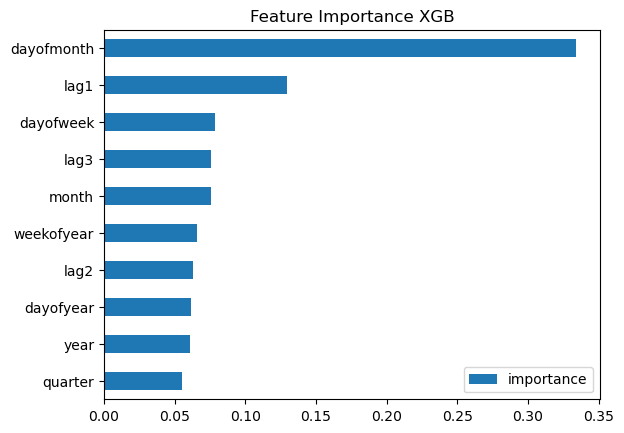

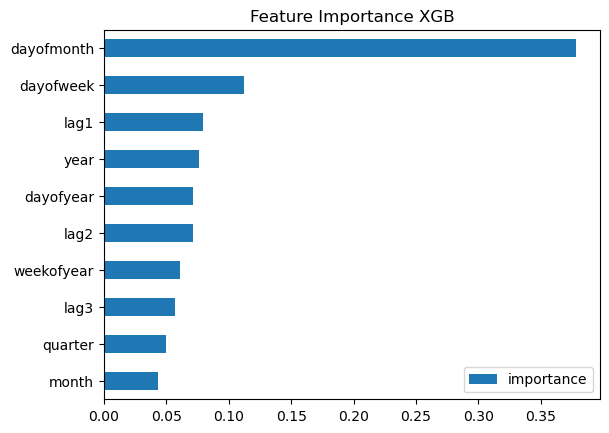

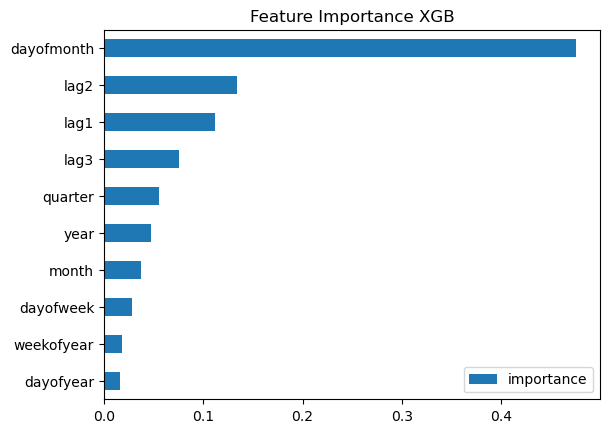

In [31]:
models = [xgb_copa, xgb_rec_propios, xgb_regalias]
i = 0
for model in models:
    
    fi = pd.DataFrame(data=model.feature_importances_,
             index=model.feature_names_in_,
             columns=['importance'])
    fi.sort_values('importance').plot(kind='barh', title='Feature Importance XGB')
    plt.show()


In [32]:
def plotear_predicciones(df_aux, model, X_test):
    df = df_aux.copy()
    test = df.copy()
    test['predictionLGBM'] = model.predict(X_test)
    df = df.merge(test[['predictionLGBM']], how='left', left_index=True, right_index=True)
    ax = df[df.columns[0]].plot(figsize=(15, 5))
    df['predictionLGBM'].plot(ax=ax)
    plt.legend(['Truth Data', 'predictionLGBM'])
    ax.set_title('Raw Dat and predictionLGBM')
    plt.show()

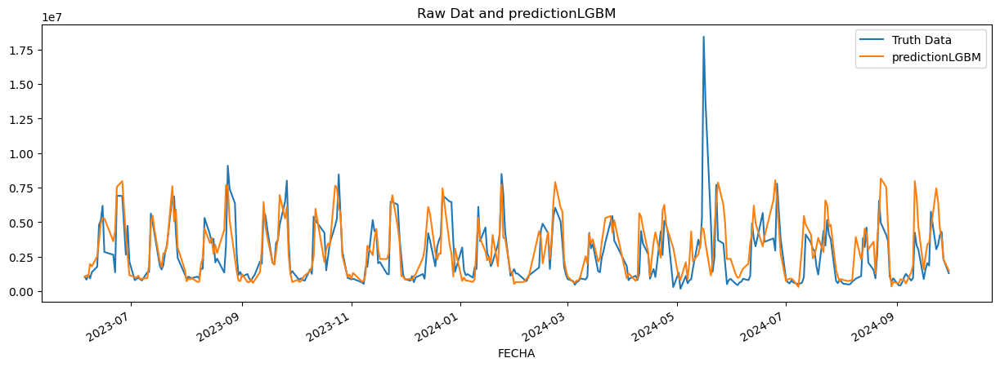

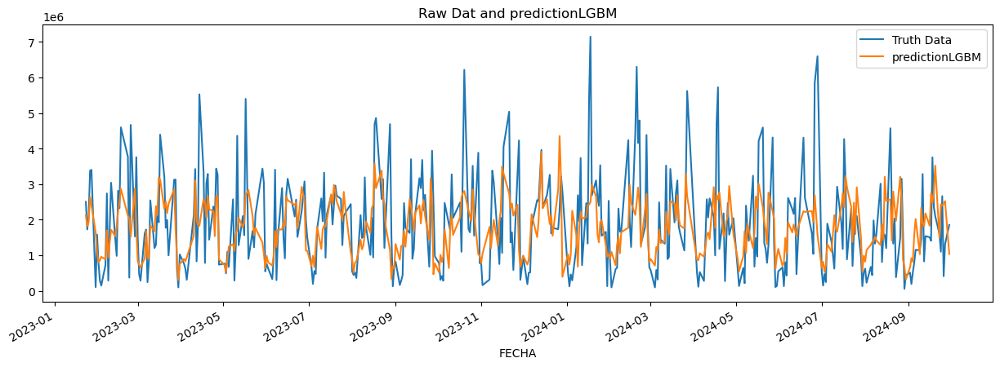

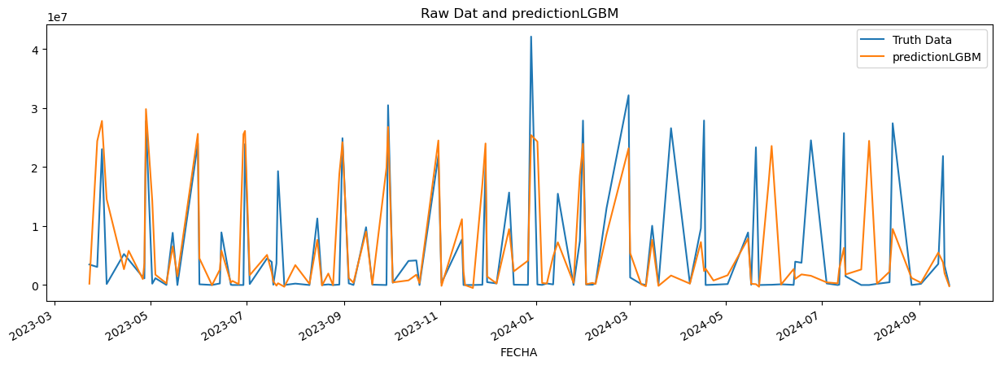

In [33]:
models = [xgb_copa, xgb_rec_propios, xgb_regalias]
X_test = [X_test_COPA, X_test_REC_PROPIOS, X_test_REGALIAS]

for i in range(len(dataframes)):
    plotear_predicciones(dataframes_test[i], models[i], X_test[i])

In [ ]:
import seaborn as sns

def plot_train_test_predictions(dataframes_train, dataframes_test, predictions_test, series_names, start_date=None):
  
    num_series = len(dataframes_train)
    fig, axes = plt.subplots(1, num_series, figsize=(20, 6), sharey=True)
    sns.set(style="whitegrid")

    for i in range(num_series):
        ax = axes[i]

        # Filtrar datos desde la fecha indicada (si se especifica)
        train = dataframes_train[i][start_date:] if start_date else dataframes_train[i]
        test = dataframes_test[i][start_date:] if start_date else dataframes_test[i]
        pred = predictions_test[i][start_date:] if start_date else predictions_test[i]
        # Graficar series
        #sns.lineplot(data=train, label='Train', ax=ax, color='#3477eb')
        #sns.lineplot(data=test, label='Test', ax=ax, color='green')
        #sns.lineplot(data=pred, ax=ax, color='#f72525', linestyle='--')
        ax.plot(train, label='Train', color='#3477eb')
        ax.plot(test, label='Test', color='green')
        ax.plot(pred, label='Predicciones', color='red', linestyle='--')
        
        # Configuración del gráfico
        ax.set_title(series_names[i], fontsize=14)
        ax.set_xlabel('Fecha')
        ax.set_ylabel('Valor')
        ax.legend(loc='best')
        ax.grid(True)

    plt.tight_layout()
    plt.show()

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_train_test_predictions(dataframes_train, dataframes_test, predictions_test, series_names, target_column, start_date=None):
    """
    Grafica las series de entrenamiento, prueba y predicciones.
    
    Parámetros:
    - dataframes_train: Lista de dataframes con los datos de entrenamiento.
    - dataframes_test: Lista de dataframes con los datos de prueba.
    - predictions_test: Lista de arreglos con las predicciones.
    - series_names: Lista de nombres para las series (uno por gráfico).
    - target_column: Nombre de la columna objetivo a graficar.
    - start_date: Fecha de inicio para filtrar las series (opcional).
    """
    sns.set(style="whitegrid")
    num_series = len(dataframes_train)
    fig, axes = plt.subplots(1, num_series, figsize=(20, 6), sharey=True)

    for i in range(num_series):
        ax = axes[i]

        # Filtrar datos desde la fecha indicada
        train = dataframes_train[i][titulos[i]][start_date:] if start_date else dataframes_train[i][titulos[i]]
        test = dataframes_test[i][titulos[i]][start_date:] if start_date else dataframes_test[i][titulos[i]]
        pred = predictions_test[i]  # Asumimos que ya tiene las predicciones alineadas con el índice de prueba
        
        # Graficar series
        ax.plot(train.index, train.values, label='Train', color='#3477eb')
        ax.plot(test.index, test.values, label='Test', color='green')
        ax.plot(test.index, pred, label='Predicciones', color='red', linestyle='--')

        # Configuración del gráfico
        ax.set_title(series_names[i], fontsize=14)
        ax.set_xlabel('Fecha')
        ax.set_ylabel('Valor')
        ax.legend(loc='best')
        ax.grid(True)

    plt.tight_layout()
    plt.show()


In [42]:
# models = [lgb_copa, lgb_rec_propios, lgb_regalias]
# X_test = [X_test_COPA, X_test_REC_PROPIOS, X_test_REGALIAS]
# X_train = [X_train_COPA, X_train_REC_PROPIOS, X_train_REGALIAS]
# y_pred_copa = lgb_copa.predict(X_test_COPA)
# y_pred_rec_propios = lgb_rec_propios.predict(X_test_REC_PROPIOS)
# y_pred_regalias = lgb_regalias.predict(X_test_REGALIAS)
# y_pred = [y_pred_copa, y_pred_rec_propios, y_pred_regalias]


# plot_train_test_predictions(
#     dataframes_train,       # Lista de dataframes de entrenamiento
#     dataframes_test,        # Lista de dataframes de prueba
#     y_pred,        # Lista de arreglos con las predicciones
#     titulos,       # Lista de nombres para los gráficos
#     target_column='hola',  # Nombre de la columna objetivo
#     start_date='2023-10-01'          # Fecha de inicio opcional
# )
    

In [35]:
from sklearn.metrics import mean_absolute_error as mae

models = [xgb_copa, xgb_rec_propios, xgb_regalias]
X_test = [X_test_COPA, X_test_REC_PROPIOS, X_test_REGALIAS]
y_test = [y_test_COPA, y_test_REC_PROPIOS, y_test_REGALIAS]

for i in range(len(models)):       
    rmse_score = np.sqrt(mean_squared_error(y_test[i], model.predict(X_test[i])))
    mae_score = mae(y_test[i], model.predict(X_test[i]))
    print(f'RMSE en conjunto de Test Modelo XGB: {rmse_score:0.2f}')
    print(f'MAE en conjunto de Test Modelo XGB: {mae_score:0.2f}')
    print('--------------')

RMSE en conjunto de Test Modelo XGB: 6117836.53
MAE en conjunto de Test Modelo XGB: 3464762.14
--------------
RMSE en conjunto de Test Modelo XGB: 6497876.69
MAE en conjunto de Test Modelo XGB: 3746381.28
--------------
RMSE en conjunto de Test Modelo XGB: 8982681.00
MAE en conjunto de Test Modelo XGB: 5040853.91
--------------


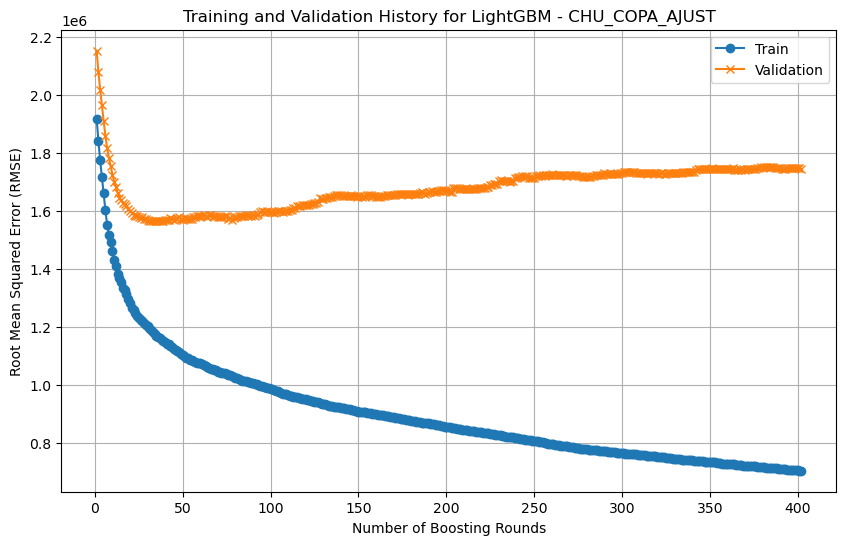

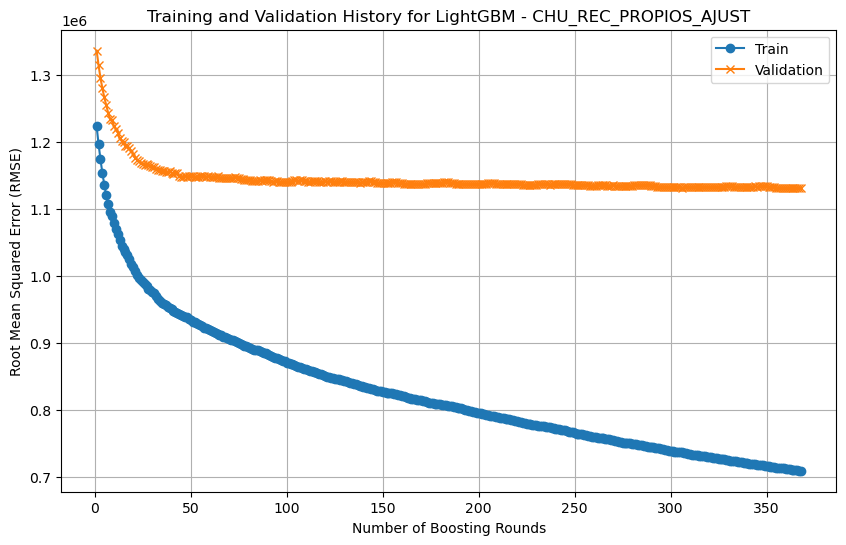

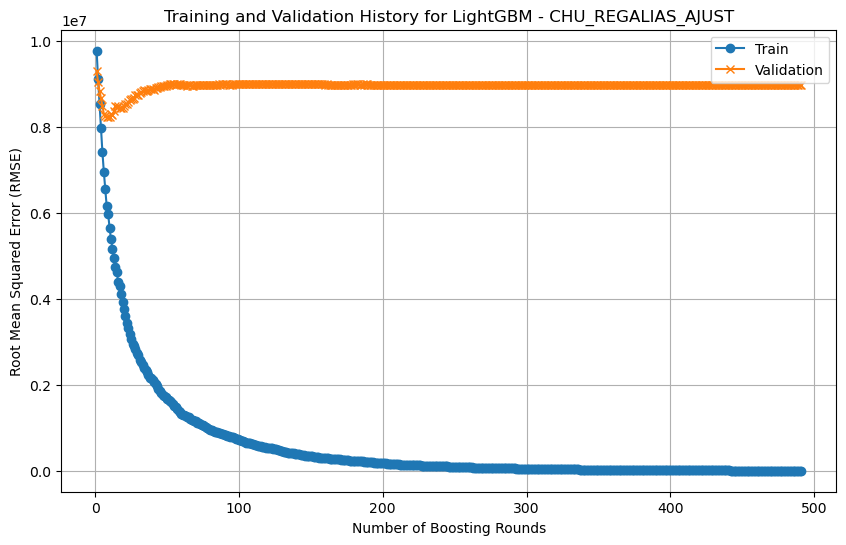

In [37]:
models = [xgb_copa, xgb_rec_propios, xgb_regalias]

for i in range(len(models)):

    resultsXGB = models[i].evals_result()
    train_error = resultsXGB['validation_0']['rmse']
    val_error = resultsXGB['validation_1']['rmse']

    # Número de rondas de boosting
    epoch = range(1, len(train_error) + 1)

    # Crear el gráfico
    plt.figure(figsize=(10, 6))
    plt.plot(epoch, train_error, label='Train', marker='o')
    plt.plot(epoch, val_error, label='Validation', marker='x')
    plt.xlabel('Number of Boosting Rounds')
    plt.ylabel('Root Mean Squared Error (RMSE)')
    plt.title(f'Training and Validation History for LightGBM - {titulos[i]}')
    plt.legend()
    plt.grid()
    plt.show()


In [ ]:
dataframes[2].index.max()

Timestamp('2024-09-20 00:00:00')

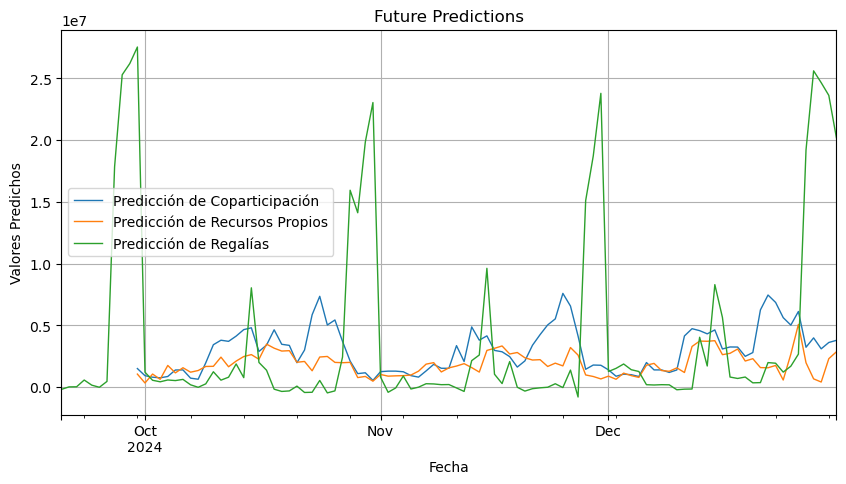

In [38]:
import matplotlib.pyplot as plt

models = [xgb_copa, xgb_rec_propios, xgb_regalias]
titles = ["Predicción de Coparticipación", "Predicción de Recursos Propios", "Predicción de Regalías"]

plt.figure(figsize=(10, 5))  # Crear una figura para graficar

for i in range(len(models)):
    df_aux = dataframes[i].copy()
    df_aux.drop(columns=['dayofweek', 'quarter', 'month', 'year', 'dayofyear', 
                         'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3'], inplace=True)
    
    # Generar datos futuros
    future = pd.date_range(dataframes[i].index.max(), '2024-12-31', freq='1d')
    future_df = pd.DataFrame(index=future)
    future_df['isFuture'] = True
    df_aux['isFuture'] = False
    df_and_future = pd.concat([df_aux, future_df])
    
    # Agregar características de tiempo y lags
    time_features = df_and_future.index.to_series().apply(extract_time_features)
    df_and_future = pd.concat([df_and_future, time_features], axis=1)
    df_and_future = add_lags(df_and_future, titulos[i]) 
    
    # Predicciones futuras
    future_w_features = df_and_future.query('isFuture').copy()
    future_w_features['pred'] = models[i].predict(future_w_features[FEATURES])
    
    # Graficar las predicciones
    future_w_features['pred'].plot(
        ms=1,
        lw=1,
        label=titles[i]  # Etiqueta para la leyenda
    )

# Personalizar el gráfico
plt.title("Future Predictions")
plt.xlabel("Fecha")
plt.ylabel("Valores Predichos")
plt.legend()  # Mostrar leyenda
plt.grid(True)
plt.show()
